In [1]:
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# The seed will be fixed to 42 for this assigmnet.
np.random.seed(42)

NUM_FEATS = 90

In [ ]:
# np.linalg.norm(self.weights[-1],1)

In [140]:
class Net(object):
    '''
    '''

    def __init__(self, num_layers, num_units):
        '''
        Initialize the neural network.
        Create weights and biases.
        Here, we have provided an example structure for the weights and biases.
        It is a list of weight and bias matrices, in which, the
        dimensions of weights and biases are (assuming 1 input layer, 2 hidden layers, and 1 output layer):
        weights: [(NUM_FEATS, num_units), (num_units, num_units), (num_units, num_units), (num_units, 1)]
        biases: [(num_units, 1), (num_units, 1), (num_units, 1), (num_units, 1)]
        Please note that this is just an example.
        You are free to modify or entirely ignore this initialization as per your need.
        Also you can add more state-tracking variables that might be useful to compute
        the gradients efficiently.
        Parameters
        ----------
            num_layers : Number of HIDDEN layers.
            num_units : Number of units in each Hidden layer.
        '''
        self.num_layers = num_layers
        self.num_units = num_units

        self.biases = []
        self.weights = []
        for i in range(num_layers):

            if i==0:
                # Input layer
                self.weights.append(np.random.uniform(-1, 1, size=(NUM_FEATS, self.num_units)))
            else:
                # Hidden layer
                self.weights.append(np.random.uniform(-1, 1, size=(self.num_units, self.num_units)))

            self.biases.append(np.random.uniform(-1, 1, size=(self.num_units, 1)))

        # Output layer
        self.biases.append(np.random.uniform(-1, 1, size=(1, 1)))
        self.weights.append(np.random.uniform(-1, 1, size=(self.num_units, 1)))

        self.h_states = []
        self.a_states = []
        self.pred = 0

    def __call__(self, X, activation_fn):
        '''
        Forward propagate the input X through the network,
        and return the output.
        Note that for a classification task, the output layer should
        be a softmax layer. So perform the computations accordingly
        Parameters
        ----------
            X : Input to the network, numpy array of shape m x d
        Returns
        ----------
            y : Output of the network, numpy array of shape m x 1
        '''
        self.h_states = []
        self.a_states = []
        a, h = X, X
        for i, (w, b) in enumerate(zip(self.weights, self.biases)):
            self.h_states.append(h)
            self.a_states.append(a)

            h = np.dot(a, w) + b.T
            a = h if i==len(self.weights)-1 else activation_fn(h)
        self.h_states.append(h)
        self.a_states.append(a)
#         self.pred = a
#         return a
        self.pred = np.rint(a).astype(int)
        return self.pred
#         raise NotImplementedError

    def backward(self, X, y, batch_size, activation_fn, lamda):
        '''
        Compute and return gradients loss with respect to weights and biases.
        (dL/dW and dL/db)
        Parameters
        ----------
            X : Input to the network, numpy array of shape m x d
            y : Output of the network, numpy array of shape m x 1
            lamda : Regularization parameter.
        Returns
        ----------
            del_W : derivative of loss w.r.t. all weight values (a list of matrices).
            del_b : derivative of loss w.r.t. all bias values (a list of vectors).
        Hint: You need to do a forward pass before performing backward pass.
        '''
        del_W = []
        del_b = []
        y = np.array(y).astype(float).reshape(len(y),1)
#         del_W_n = 1./batch_size*np.sum(self.a_states[-2]*(self.pred - y),axis=0).reshape(len(self.biases[-2]),1) #+ lamda*self.weights[-1]
        del_W_n = 2./batch_size*np.sum(self.a_states[-2]*(self.pred - y),axis=0).reshape(len(self.biases[-2]),1) + 2*lamda*self.weights[-1]
#         del_b_n = 1./batch_size*np.sum((self.pred - y),axis=0).reshape(len(self.biases[-1]),1) 
        del_b_n = 2./batch_size*np.sum((self.pred - y),axis=0).reshape(len(self.biases[-1]),1) 
#         d_w_output = del_W_n.T/self.a_states[-2]
#         d_w_layer = 1./batch_size*(self.pred - y)
        d_w_layer = 2./batch_size*(self.pred - y)
        
        d_b_layer = del_b_n
        
        del_W.insert(0, del_W_n)
        del_b.insert(0, del_b_n)
        last_layer_check = True
        for i in range(self.num_layers, 0, -1):
#             d_w_layer = np.multiply(np.dot(d_w_layer,self.weights[i]), activation_fn(self.h_states[i], derivative=True)) + lamda*self.weights[i].T
            if last_layer_check:
                d_w_layer = np.multiply(np.dot(d_w_layer,self.weights[i].T), activation_fn(self.h_states[i], derivative=True))
                last_layer_check = False
            else:
                d_w_layer = np.multiply(np.dot(np.multiply(d_w_layer,activation_fn(self.h_states[i+1], derivative=True)),self.weights[i].T), activation_fn(self.h_states[i], derivative=True))
#             d_b_layer = np.multiply(np.dot(d_b_layer,self.weights[i].T), activation_fn(self.h_states[i], derivative=True))
            d_b_layer = d_w_layer
#             d_w_layer = d_w_layer + 2*lamda*self.weights[i].T
            
#             req = []
#             for col_vector in d_w_layer.T:
#                 req.append(col_vector.T*self.a_states[i-1].T)
#             del_W.insert(0,np.sum(np.array(req).T, axis=0))
            del_W_i = np.dot(self.a_states[i-1].T,d_w_layer) + 2*lamda*self.weights[i-1]
            del_b_i = np.sum(d_b_layer, axis=0).reshape(len(self.biases[i-1]),1)
            del_W.insert(0,del_W_i)
            del_b.insert(0,del_b_i)
        
        return del_W, del_b
#         raise NotImplementedError

In [4]:
def sigmoid(h, derivative=False):
    h = 1/(1+np.exp(-h))
    if derivative:
        h = h*(1-h)
    return h
                                       
def relu(h, derivative=False):        
    if derivative:
        return np.heaviside(h ,0)
    return np.maximum(0, h)

In [56]:
class Optimizer(object):
    '''
    '''

    def __init__(self, learning_rate, optimization, beta=0.9, gamma=0.999):
        '''
        Create a Gradient Descent based optimizer with given
        learning rate.
        Other parameters can also be passed to create different types of
        optimizers.
        Hint: You can use the class members to track various states of the
        optimizer.
        '''
        self.learning_rate = learning_rate
        self.beta = beta
        self.gamma = gamma
        self.epsilon = 1e-6
        self.t = 0
        self.w_states = []
        self.b_states = []
        self.w_momentum = []
        self.b_momentum = []
        self.optimization_algorithm = optimization
#         raise NotImplementedError

    def step(self, weights, biases, delta_weights, delta_biases):
        '''
        Parameters
        ----------
            weights: Current weights of the network.
            biases: Current biases of the network.
            delta_weights: Gradients of weights with respect to loss.
            delta_biases: Gradients of biases with respect to loss.
        '''
        
        if self.optimization_algorithm == 'SGD':      
            self.t+=1
            for i in range(len(weights)):
                weights[i] = weights[i] - self.learning_rate*delta_weights[i]
                biases[i] = biases[i] - self.learning_rate*delta_biases[i]
        
        if self.optimization_algorithm == 'RMSProp':
            if self.t == 0:
                for i in range(len(weights)):
                    a,b = weights[i].shape
                    self.w_states.append(np.zeros([a,b]))
                    a,b = biases[i].shape
                    self.b_states.append(np.zeros([a,b]))
            
            self.t+=1
            for i in range(len(weights)):
                self.w_states[i] = self.gamma*self.w_states[i] + (1-self.gamma)*np.multiply(delta_weights[i],delta_weights[i])
                weights[i] = weights[i] - (self.learning_rate/(np.sqrt(self.w_states[i])+self.epsilon))*delta_weights[i]
                self.b_states[i] = self.gamma*self.b_states[i] + (1-self.gamma)*np.multiply(delta_biases[i],delta_biases[i])
                biases[i] = biases[i] - (self.learning_rate/(np.sqrt(self.b_states[i])+self.epsilon))*delta_biases[i]

        
        if self.optimization_algorithm == 'Adam':
            if self.t == 0:
                for i in range(len(weights)):
                    a,b = weights[i].shape
                    self.w_states.append(np.zeros([a,b]))
                    self.w_momentum.append(np.zeros([a,b]))
                    a,b = biases[i].shape
                    self.b_states.append(np.zeros([a,b]))
                    self.b_momentum.append(np.zeros([a,b]))
            
            self.t+=1
            for i in range(len(weights)):
                self.w_momentum[i] = self.beta*self.w_momentum[i] + (1-self.beta)*delta_weights[i]
                self.w_states[i] = self.gamma*self.w_states[i] + (1-self.gamma)*np.multiply(delta_weights[i],delta_weights[i])
                weights[i] = weights[i] - (self.learning_rate/(np.sqrt(self.w_states[i]/(1-self.gamma**self.t))+self.epsilon))*(self.w_momentum[i]/(1-self.beta**self.t))
                self.b_momentum[i] = self.beta*self.b_momentum[i] + (1-self.beta)*delta_biases[i]
                self.b_states[i] = self.gamma*self.b_states[i] + (1-self.gamma)*np.multiply(delta_biases[i],delta_biases[i])
                biases[i] = biases[i] - (self.learning_rate/(np.sqrt(self.b_states[i]/(1-self.gamma**self.t))+self.epsilon))*(self.b_momentum[i]/(1-self.beta**self.t))

        return weights, biases
#         raise NotImplementedError

In [23]:
net.weights[0].shape

(90, 64)

In [6]:
def loss_mse(y, y_hat):
    '''
    Compute Mean Squared Error (MSE) loss betwee ground-truth and predicted values.
    Parameters
    ----------
        y : targets, numpy array of shape m x 1
        y_hat : predictions, numpy array of shape m x 1
    Returns
    ----------
        MSE loss between y and y_hat.
    '''
    return 1/len(y)*np.sum((y - y_hat)**2)
    # raise NotImplementedError

In [7]:
def loss_regularization(weights, biases):
    '''
    Compute l2 regularization loss.
    Parameters
    ----------
        weights and biases of the network.
    Returns
    ----------
        l2 regularization loss 
    '''
    
    return sum([ np.sum(weight**2) for weight in weights])
    

    # raise NotImplementedError

In [8]:
def loss_fn(y, y_hat, weights, biases, lamda):
    '''
    Compute loss =  loss_mse(..) + lamda * loss_regularization(..)
    Parameters
    ----------
        y : targets, numpy array of shape m x 1
        y_hat : predictions, numpy array of shape m x 1
        weights and biases of the network
        lamda: Regularization parameter
    Returns
    ----------
        l2 regularization loss 
    '''
#     lamda=0
    return loss_mse(y, y_hat) + lamda*loss_regularization(weights, biases)
#     return loss_mse(y, y_hat) + lamda/2*loss_regularization(weights, biases)
    # raise NotImplementedError

In [9]:
def rmse(y, y_hat):
    '''
    Compute Root Mean Squared Error (RMSE) loss betwee ground-truth and predicted values.
    Parameters
    ----------
        y : targets, numpy array of shape m x 1
        y_hat : predictions, numpy array of shape m x 1
    Returns
    ----------
        RMSE between y and y_hat.
    '''
    return np.sqrt(1/len(y)*np.sum((y - y_hat)**2))
    raise NotImplementedError

In [ ]:
def cross_entropy_loss(y, y_hat):
    '''
    Compute cross entropy loss
    Parameters
    ----------
        y : targets, numpy array of shape m x 1
        y_hat : predictions, numpy array of shape m x 1
    Returns
    ----------
        cross entropy loss
    '''
    raise NotImplementedError

In [102]:
def train(
    net, optimizer, lamda, batch_size, max_epochs,
    train_input, train_target,
    dev_input, dev_target
):
    '''
    In this function, you will perform following steps:
        1. Run gradient descent algorithm for `max_epochs` epochs.
        2. For each bach of the training data
            1.1 Compute gradients
            1.2 Update weights and biases using step() of optimizer.
        3. Compute RMSE on dev data after running `max_epochs` epochs.
    Here we have added the code to loop over batches and perform backward pass
    for each batch in the loop.
    For this code also, you are free to heavily modify it.
    '''

    m = train_input.shape[0]
    dev_target = np.array(dev_target).astype(float).reshape(len(dev_target),1)
    
    for e in range(max_epochs):
        epoch_loss = 0.
        number_of_batches = 0
        for i in range(0, m, batch_size):
            batch_input = train_input[i:i+batch_size]
#             batch_target = train_target[i:i+batch_size]
            batch_target = np.array(train_target[i:i+batch_size]).astype(float).reshape(len(batch_input),1)
            pred = net(batch_input, relu)

            # Compute gradients of loss w.r.t. weights and biases
            dW, db = net.backward(batch_input, batch_target, batch_size, relu, lamda)

            # Get updated weights based on current weights and gradients
            weights_updated, biases_updated = optimizer.step(net.weights, net.biases, dW, db)

            # Update model's weights and biases
            net.weights = weights_updated
            net.biases = biases_updated

            # Compute loss for the batch
            batch_loss = loss_fn(batch_target, pred, net.weights, net.biases, lamda)
            epoch_loss += batch_loss
            number_of_batches += 1
            print('Epoch: {}, iteration: {}, RMSE: {}, batch_loss: {}'.format(e, i, rmse(batch_target, pred), batch_loss))
        epoch.append(e)
        epoch_loss = epoch_loss/number_of_batches
        epoch_losses.append(epoch_loss)
        dev_losses.append(rmse(dev_target, net(dev_input, relu)))
        print('Epoch: {}, Epoch Loss: {}'.format(e, epoch_loss))

        # Write any early stopping conditions required (only for Part 2)
        # Hint: You can also compute dev_rmse here and use it in the early
        #       stopping condition.

    # After running `max_epochs` (for Part 1) epochs OR early stopping (for Part 2), compute the RMSE on dev data.
    
    dev_pred = net(dev_input, relu)
    dev_rmse = rmse(dev_target, dev_pred)

    print('RMSE on dev data: {:.5f}'.format(dev_rmse))

In [79]:
def get_test_data_predictions(net, inputs):
    '''
    Perform forward pass on test data and get the final predictions that can
    be submitted on Kaggle.
    Write the final predictions to the part2.csv file.
    Parameters
    ----------
        net : trained neural network
        inputs : test input, numpy array of shape m x d
    Returns
    ----------
        predictions (optional): Predictions obtained from forward pass
                                on test data, numpy array of shape m x 1
    '''
    return net(inputs, relu)
#     raise NotImplementedError

In [101]:
pred = get_test_data_predictions(net, test_input)

In [131]:
len(dev_input)

5100

In [11]:
def read_data():
    '''
    Read the train, dev, and test datasets
    '''
    
    train_input = pd.read_csv("https://raw.githubusercontent.com/sahasrarjn/cs725-2022-assignment/main/regression/data/train.csv")
    train_target = train_input.iloc[:,0]
    train_input.drop(columns=train_input.columns[0],
                 axis=0,
                 inplace=True)
    for col in train_input:
        mean = train_input[col].mean()
        std = train_input[col].std()
        min_value = train_input[col].min()
        max_value = train_input[col].max()
        train_input[col] = (train_input[col]-min_value)/(max_value - min_value)
#         train_input[col] = (train_input[col]-mean)/std
    dev_input = pd.read_csv("https://raw.githubusercontent.com/sahasrarjn/cs725-2022-assignment/main/regression/data/dev.csv")
    dev_target = dev_input.iloc[:,0]
    dev_input.drop(columns=dev_input.columns[0],
                 axis=0,
                 inplace=True)
    for col in dev_input:
        mean = dev_input[col].mean()
        std = dev_input[col].std()
        min_value = dev_input[col].min()
        max_value = dev_input[col].max()
        dev_input[col] = (dev_input[col]-min_value)/(max_value - min_value)
#         dev_input[col] = (dev_input[col]-mean)/std
    test_input = pd.read_csv("https://raw.githubusercontent.com/sahasrarjn/cs725-2022-assignment/main/regression/data/test.csv")
    for col in test_input:
        mean = test_input[col].mean()
        std = test_input[col].std()
        min_value = test_input[col].min()
        max_value = test_input[col].max()
        test_input[col] = (test_input[col]-min_value)/(max_value - min_value)
#         test_input[col] = (test_input[col]-mean)/std
    return train_input, train_target, dev_input, dev_target, test_input

In [ ]:
def main():

    # Hyper-parameters 
    max_epochs = 50
    batch_size = 256
    learning_rate = 0.001
    num_layers = 1
    num_units = 64
    lamda = 0.1 # Regularization Parameter

    train_input, train_target, dev_input, dev_target, test_input = read_data()
    net = Net(num_layers, num_units)
    optimizer = Optimizer(learning_rate)
    train(
        net, optimizer, lamda, batch_size, max_epochs,
        train_input, train_target,
        dev_input, dev_target
    )
#     get_test_data_predictions(net, test_input)


if __name__ == '__main__':
    main()

In [168]:
train_input, train_target, dev_input, dev_target, test_input = read_data()

In [169]:
train_input

,2,3,4,5,6,7,8,9,10,11,...,82,83,84,85,86,87,88,89,90,91
0,0.625066,0.518548,0.591790,0.512467,0.315919,0.606895,0.524523,0.414843,0.528907,0.544377,...,0.262914,0.350085,0.334135,0.431003,0.387217,0.669793,0.507545,0.499780,0.765121,0.284739
1,0.391954,0.377018,0.418961,0.345425,0.429244,0.359135,0.533448,0.450449,0.351191,0.505538,...,0.355628,0.370124,0.304988,0.489212,0.427288,0.707801,0.559043,0.473614,0.754003,0.284978
2,0.552253,0.633584,0.437503,0.525843,0.452884,0.443956,0.594289,0.525178,0.388741,0.630555,...,0.246077,0.463615,0.325095,0.503980,0.552231,0.672552,0.582417,0.521172,0.724217,0.279617
3,0.761643,0.565835,0.554013,0.451897,0.417237,0.301431,0.595046,0.436198,0.395769,0.500972,...,0.243847,0.406358,0.290330,0.483724,0.464408,0.698157,0.585269,0.487985,0.740129,0.267115
4,0.606655,0.425655,0.583708,0.442717,0.478696,0.407195,0.529120,0.434133,0.358751,0.417719,...,0.302174,0.368794,0.299064,0.498369,0.493770,0.687865,0.580101,0.458438,0.734952,0.262689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40795,0.713038,0.526510,0.513255,0.458872,0.445853,0.355051,0.571241,0.397412,0.404708,0.506923,...,0.238619,0.355453,0.307436,0.489477,0.472840,0.701521,0.559023,0.511411,0.746425,0.244560
40796,0.820008,0.661944,0.532230,0.437852,0.343421,0.234271,0.617841,0.425834,0.477034,0.565606,...,0.245923,0.403599,0.296838,0.464646,0.464287,0.689401,0.580562,0.499718,0.739670,0.264738
40797,0.662314,0.485669,0.501928,0.479661,0.435488,0.483424,0.566800,0.389204,0.377140,0.463040,...,0.231047,0.417855,0.334049,0.423165,0.412293,0.722532,0.553363,0.528455,0.736359,0.288040
40798,0.824981,0.632059,0.647075,0.504951,0.390760,0.468456,0.520670,0.385501,0.412689,0.542636,...,0.240631,0.409680,0.294020,0.498232,0.487226,0.713213,0.567248,0.498526,0.743217,0.266770


In [246]:
max_epochs = 100
batch_size = 32
# learning_rate = 0.001
learning_rate = 1e-6
# learning_rate = 0.01
num_layers = 1
num_units = 64
lamda = 0. # Regularization Parameter
# lamda = 0 # Regularization Parameter

In [247]:
net = Net(num_layers, num_units)
optimizer = Optimizer(learning_rate=learning_rate, optimization='SGD')
epoch = []
epoch_losses = []
dev_losses = []

In [248]:
train(
    net, optimizer, lamda, batch_size, max_epochs,
    train_input, train_target,
    dev_input, dev_target
)

Epoch: 0, iteration: 0, RMSE: 2008.9042877897393, batch_loss: 4035696.4375
Epoch: 0, iteration: 32, RMSE: 2007.0844993422675, batch_loss: 4028388.1875
Epoch: 0, iteration: 64, RMSE: 2007.5414301453407, batch_loss: 4030222.59375
Epoch: 0, iteration: 96, RMSE: 2003.2808636708933, batch_loss: 4013134.21875
Epoch: 0, iteration: 128, RMSE: 2001.3724431624414, batch_loss: 4005491.65625
Epoch: 0, iteration: 160, RMSE: 2000.7019861788513, batch_loss: 4002808.4375
Epoch: 0, iteration: 192, RMSE: 2001.1640128310323, batch_loss: 4004657.40625
Epoch: 0, iteration: 224, RMSE: 1994.0592471764724, batch_loss: 3976272.28125
Epoch: 0, iteration: 256, RMSE: 1988.0672303772828, batch_loss: 3952411.3125
Epoch: 0, iteration: 288, RMSE: 1993.9055581947707, batch_loss: 3975659.375
Epoch: 0, iteration: 320, RMSE: 1989.5329696941442, batch_loss: 3958241.4375
Epoch: 0, iteration: 352, RMSE: 1988.067992738176, batch_loss: 3952414.34375
Epoch: 0, iteration: 384, RMSE: 1985.4043039139408, batch_loss: 3941830.25
Ep

Epoch: 0, iteration: 10112, RMSE: 21.114272424121083, batch_loss: 445.8125
Epoch: 0, iteration: 10144, RMSE: 28.33670323096884, batch_loss: 802.96875
Epoch: 0, iteration: 10176, RMSE: 17.150072886142496, batch_loss: 294.125
Epoch: 0, iteration: 10208, RMSE: 15.712256362470669, batch_loss: 246.875
Epoch: 0, iteration: 10240, RMSE: 22.099915158208187, batch_loss: 488.40625
Epoch: 0, iteration: 10272, RMSE: 24.823124299733102, batch_loss: 616.1875
Epoch: 0, iteration: 10304, RMSE: 20.631438389021742, batch_loss: 425.65625
Epoch: 0, iteration: 10336, RMSE: 24.70197360536198, batch_loss: 610.1875
Epoch: 0, iteration: 10368, RMSE: 17.05872210923198, batch_loss: 291.0
Epoch: 0, iteration: 10400, RMSE: 25.559367167439806, batch_loss: 653.28125
Epoch: 0, iteration: 10432, RMSE: 20.36617907217748, batch_loss: 414.78125
Epoch: 0, iteration: 10464, RMSE: 19.364109842696102, batch_loss: 374.96875
Epoch: 0, iteration: 10496, RMSE: 23.8681272830526, batch_loss: 569.6875
Epoch: 0, iteration: 10528, RM

Epoch: 0, iteration: 20608, RMSE: 14.785973082621245, batch_loss: 218.625
Epoch: 0, iteration: 20640, RMSE: 21.39363223017541, batch_loss: 457.6875
Epoch: 0, iteration: 20672, RMSE: 17.907749719046222, batch_loss: 320.6875
Epoch: 0, iteration: 20704, RMSE: 20.768064425940132, batch_loss: 431.3125
Epoch: 0, iteration: 20736, RMSE: 16.78354849249705, batch_loss: 281.6875
Epoch: 0, iteration: 20768, RMSE: 15.645486569614894, batch_loss: 244.78125
Epoch: 0, iteration: 20800, RMSE: 33.829074034031734, batch_loss: 1144.40625
Epoch: 0, iteration: 20832, RMSE: 22.14158982548453, batch_loss: 490.25
Epoch: 0, iteration: 20864, RMSE: 19.497596005661826, batch_loss: 380.15625
Epoch: 0, iteration: 20896, RMSE: 19.997656112654802, batch_loss: 399.90625
Epoch: 0, iteration: 20928, RMSE: 23.404727086637862, batch_loss: 547.78125
Epoch: 0, iteration: 20960, RMSE: 20.414455662593603, batch_loss: 416.75
Epoch: 0, iteration: 20992, RMSE: 18.226011631731172, batch_loss: 332.1875
Epoch: 0, iteration: 21024,

Epoch: 0, iteration: 31616, RMSE: 23.1833722741106, batch_loss: 537.46875
Epoch: 0, iteration: 31648, RMSE: 20.157969887863214, batch_loss: 406.34375
Epoch: 0, iteration: 31680, RMSE: 27.326726843879417, batch_loss: 746.75
Epoch: 0, iteration: 31712, RMSE: 23.382017663153025, batch_loss: 546.71875
Epoch: 0, iteration: 31744, RMSE: 20.330088538911973, batch_loss: 413.3125
Epoch: 0, iteration: 31776, RMSE: 23.977202714245045, batch_loss: 574.90625
Epoch: 0, iteration: 31808, RMSE: 23.59157688667716, batch_loss: 556.5625
Epoch: 0, iteration: 31840, RMSE: 16.763986697680238, batch_loss: 281.03125
Epoch: 0, iteration: 31872, RMSE: 21.4883689469443, batch_loss: 461.75
Epoch: 0, iteration: 31904, RMSE: 27.068778140137763, batch_loss: 732.71875
Epoch: 0, iteration: 31936, RMSE: 20.939645412470576, batch_loss: 438.46875
Epoch: 0, iteration: 31968, RMSE: 15.85678088389948, batch_loss: 251.4375
Epoch: 0, iteration: 32000, RMSE: 21.586309318639906, batch_loss: 465.96875
Epoch: 0, iteration: 32032,

Epoch: 1, iteration: 448, RMSE: 20.8334166665, batch_loss: 434.03125
Epoch: 1, iteration: 480, RMSE: 20.389182180754577, batch_loss: 415.71875
Epoch: 1, iteration: 512, RMSE: 18.02255531271856, batch_loss: 324.8125
Epoch: 1, iteration: 544, RMSE: 21.399474292608218, batch_loss: 457.9375
Epoch: 1, iteration: 576, RMSE: 24.454038521274967, batch_loss: 598.0
Epoch: 1, iteration: 608, RMSE: 27.25, batch_loss: 742.5625
Epoch: 1, iteration: 640, RMSE: 22.47707165090684, batch_loss: 505.21875
Epoch: 1, iteration: 672, RMSE: 17.617462927447868, batch_loss: 310.375
Epoch: 1, iteration: 704, RMSE: 32.62428160128587, batch_loss: 1064.34375
Epoch: 1, iteration: 736, RMSE: 20.601880982085106, batch_loss: 424.4375
Epoch: 1, iteration: 768, RMSE: 25.773047937719745, batch_loss: 664.25
Epoch: 1, iteration: 800, RMSE: 23.744078209103, batch_loss: 563.78125
Epoch: 1, iteration: 832, RMSE: 27.21442632134655, batch_loss: 740.625
Epoch: 1, iteration: 864, RMSE: 20.67456166403535, batch_loss: 427.4375
Epoch

Epoch: 1, iteration: 12960, RMSE: 20.461854754640402, batch_loss: 418.6875
Epoch: 1, iteration: 12992, RMSE: 29.351320242878344, batch_loss: 861.5
Epoch: 1, iteration: 13024, RMSE: 23.112496619794236, batch_loss: 534.1875
Epoch: 1, iteration: 13056, RMSE: 31.23799769511484, batch_loss: 975.8125
Epoch: 1, iteration: 13088, RMSE: 20.00546800252371, batch_loss: 400.21875
Epoch: 1, iteration: 13120, RMSE: 30.26394306761761, batch_loss: 915.90625
Epoch: 1, iteration: 13152, RMSE: 19.182511566528508, batch_loss: 367.96875
Epoch: 1, iteration: 13184, RMSE: 21.47964152401059, batch_loss: 461.375
Epoch: 1, iteration: 13216, RMSE: 17.374550353894055, batch_loss: 301.875
Epoch: 1, iteration: 13248, RMSE: 19.46471165982173, batch_loss: 378.875
Epoch: 1, iteration: 13280, RMSE: 19.488778822696922, batch_loss: 379.8125
Epoch: 1, iteration: 13312, RMSE: 19.58315602756614, batch_loss: 383.5
Epoch: 1, iteration: 13344, RMSE: 18.199416199427937, batch_loss: 331.21875
Epoch: 1, iteration: 13376, RMSE: 16

Epoch: 1, iteration: 24128, RMSE: 20.01327684313591, batch_loss: 400.53125
Epoch: 1, iteration: 24160, RMSE: 26.521807065130385, batch_loss: 703.40625
Epoch: 1, iteration: 24192, RMSE: 25.695330315059195, batch_loss: 660.25
Epoch: 1, iteration: 24224, RMSE: 26.344472854851357, batch_loss: 694.03125
Epoch: 1, iteration: 24256, RMSE: 18.841443681416774, batch_loss: 355.0
Epoch: 1, iteration: 24288, RMSE: 19.549616364522347, batch_loss: 382.1875
Epoch: 1, iteration: 24320, RMSE: 16.205708870641853, batch_loss: 262.625
Epoch: 1, iteration: 24352, RMSE: 18.875413902746608, batch_loss: 356.28125
Epoch: 1, iteration: 24384, RMSE: 16.7751676593708, batch_loss: 281.40625
Epoch: 1, iteration: 24416, RMSE: 21.07872149823134, batch_loss: 444.3125
Epoch: 1, iteration: 24448, RMSE: 18.953067034124054, batch_loss: 359.21875
Epoch: 1, iteration: 24480, RMSE: 20.8746257451481, batch_loss: 435.75
Epoch: 1, iteration: 24512, RMSE: 19.257303809204444, batch_loss: 370.84375
Epoch: 1, iteration: 24544, RMSE

Epoch: 1, iteration: 35232, RMSE: 19.12704237460669, batch_loss: 365.84375
Epoch: 1, iteration: 35264, RMSE: 18.71162740116423, batch_loss: 350.125
Epoch: 1, iteration: 35296, RMSE: 28.894744331798474, batch_loss: 834.90625
Epoch: 1, iteration: 35328, RMSE: 13.78744900262554, batch_loss: 190.09375
Epoch: 1, iteration: 35360, RMSE: 18.85305015110287, batch_loss: 355.4375
Epoch: 1, iteration: 35392, RMSE: 18.084005363856757, batch_loss: 327.03125
Epoch: 1, iteration: 35424, RMSE: 20.876122724299165, batch_loss: 435.8125
Epoch: 1, iteration: 35456, RMSE: 17.92170471802278, batch_loss: 321.1875
Epoch: 1, iteration: 35488, RMSE: 23.066480008878685, batch_loss: 532.0625
Epoch: 1, iteration: 35520, RMSE: 23.95634049682881, batch_loss: 573.90625
Epoch: 1, iteration: 35552, RMSE: 24.40478948895073, batch_loss: 595.59375
Epoch: 1, iteration: 35584, RMSE: 21.96943900057532, batch_loss: 482.65625
Epoch: 1, iteration: 35616, RMSE: 17.91472857734663, batch_loss: 320.9375
Epoch: 1, iteration: 35648, 

Epoch: 2, iteration: 1760, RMSE: 17.330428442482315, batch_loss: 300.34375
Epoch: 2, iteration: 1792, RMSE: 19.965595408101407, batch_loss: 398.625
Epoch: 2, iteration: 1824, RMSE: 17.663521732655695, batch_loss: 312.0
Epoch: 2, iteration: 1856, RMSE: 18.848076824970764, batch_loss: 355.25
Epoch: 2, iteration: 1888, RMSE: 15.058220346375597, batch_loss: 226.75
Epoch: 2, iteration: 1920, RMSE: 22.30400748744494, batch_loss: 497.46875
Epoch: 2, iteration: 1952, RMSE: 16.424067705656842, batch_loss: 269.75
Epoch: 2, iteration: 1984, RMSE: 21.949515939992846, batch_loss: 481.78125
Epoch: 2, iteration: 2016, RMSE: 22.4847170317974, batch_loss: 505.5625
Epoch: 2, iteration: 2048, RMSE: 23.289616785168448, batch_loss: 542.40625
Epoch: 2, iteration: 2080, RMSE: 29.0726460784016, batch_loss: 845.21875
Epoch: 2, iteration: 2112, RMSE: 18.929969624909596, batch_loss: 358.34375
Epoch: 2, iteration: 2144, RMSE: 21.128328140200775, batch_loss: 446.40625
Epoch: 2, iteration: 2176, RMSE: 26.0810036233

Epoch: 2, iteration: 6592, RMSE: 16.764918729298987, batch_loss: 281.0625
Epoch: 2, iteration: 6624, RMSE: 19.037791363495923, batch_loss: 362.4375
Epoch: 2, iteration: 6656, RMSE: 13.953046262375826, batch_loss: 194.6875
Epoch: 2, iteration: 6688, RMSE: 24.195815753968702, batch_loss: 585.4375
Epoch: 2, iteration: 6720, RMSE: 16.019519343600795, batch_loss: 256.625
Epoch: 2, iteration: 6752, RMSE: 23.545169355942207, batch_loss: 554.375
Epoch: 2, iteration: 6784, RMSE: 21.610905811649822, batch_loss: 467.03125
Epoch: 2, iteration: 6816, RMSE: 27.793322039655497, batch_loss: 772.46875
Epoch: 2, iteration: 6848, RMSE: 16.03901493234544, batch_loss: 257.25
Epoch: 2, iteration: 6880, RMSE: 22.82200144597314, batch_loss: 520.84375
Epoch: 2, iteration: 6912, RMSE: 18.147830448844292, batch_loss: 329.34375
Epoch: 2, iteration: 6944, RMSE: 20.27775875189366, batch_loss: 411.1875
Epoch: 2, iteration: 6976, RMSE: 25.820897544430945, batch_loss: 666.71875
Epoch: 2, iteration: 7008, RMSE: 22.5041

Epoch: 2, iteration: 17600, RMSE: 20.06006605173572, batch_loss: 402.40625
Epoch: 2, iteration: 17632, RMSE: 25.94645929601956, batch_loss: 673.21875
Epoch: 2, iteration: 17664, RMSE: 17.79834964259327, batch_loss: 316.78125
Epoch: 2, iteration: 17696, RMSE: 16.224017689832564, batch_loss: 263.21875
Epoch: 2, iteration: 17728, RMSE: 24.422709718620496, batch_loss: 596.46875
Epoch: 2, iteration: 17760, RMSE: 16.91245842566952, batch_loss: 286.03125
Epoch: 2, iteration: 17792, RMSE: 23.271495439700473, batch_loss: 541.5625
Epoch: 2, iteration: 17824, RMSE: 19.203678033126884, batch_loss: 368.78125
Epoch: 2, iteration: 17856, RMSE: 19.912307751739878, batch_loss: 396.5
Epoch: 2, iteration: 17888, RMSE: 19.356039109280598, batch_loss: 374.65625
Epoch: 2, iteration: 17920, RMSE: 23.811761799581316, batch_loss: 567.0
Epoch: 2, iteration: 17952, RMSE: 26.092982773151864, batch_loss: 680.84375
Epoch: 2, iteration: 17984, RMSE: 24.98624621666888, batch_loss: 624.3125
Epoch: 2, iteration: 18016,

Epoch: 2, iteration: 27680, RMSE: 20.637496214415158, batch_loss: 425.90625
Epoch: 2, iteration: 27712, RMSE: 22.143001151605443, batch_loss: 490.3125
Epoch: 2, iteration: 27744, RMSE: 18.7849673941692, batch_loss: 352.875
Epoch: 2, iteration: 27776, RMSE: 16.3276988580755, batch_loss: 266.59375
Epoch: 2, iteration: 27808, RMSE: 23.454743656667834, batch_loss: 550.125
Epoch: 2, iteration: 27840, RMSE: 20.121505907858886, batch_loss: 404.875
Epoch: 2, iteration: 27872, RMSE: 20.72362781947215, batch_loss: 429.46875
Epoch: 2, iteration: 27904, RMSE: 19.223195624037125, batch_loss: 369.53125
Epoch: 2, iteration: 27936, RMSE: 25.834206974474753, batch_loss: 667.40625
Epoch: 2, iteration: 27968, RMSE: 22.174732241900916, batch_loss: 491.71875
Epoch: 2, iteration: 28000, RMSE: 18.40601124632928, batch_loss: 338.78125
Epoch: 2, iteration: 28032, RMSE: 19.110697266190996, batch_loss: 365.21875
Epoch: 2, iteration: 28064, RMSE: 26.618250318155773, batch_loss: 708.53125
Epoch: 2, iteration: 2809

Epoch: 2, iteration: 37184, RMSE: 19.973419837373868, batch_loss: 398.9375
Epoch: 2, iteration: 37216, RMSE: 18.895270572288716, batch_loss: 357.03125
Epoch: 2, iteration: 37248, RMSE: 16.53216561736544, batch_loss: 273.3125
Epoch: 2, iteration: 37280, RMSE: 27.423188180807863, batch_loss: 752.03125
Epoch: 2, iteration: 37312, RMSE: 22.178959623931867, batch_loss: 491.90625
Epoch: 2, iteration: 37344, RMSE: 26.788523662195345, batch_loss: 717.625
Epoch: 2, iteration: 37376, RMSE: 19.643701280563192, batch_loss: 385.875
Epoch: 2, iteration: 37408, RMSE: 23.938723859053137, batch_loss: 573.0625
Epoch: 2, iteration: 37440, RMSE: 25.70931251511794, batch_loss: 660.96875
Epoch: 2, iteration: 37472, RMSE: 20.658684614466623, batch_loss: 426.78125
Epoch: 2, iteration: 37504, RMSE: 18.193405398660254, batch_loss: 331.0
Epoch: 2, iteration: 37536, RMSE: 23.737496708793874, batch_loss: 563.46875
Epoch: 2, iteration: 37568, RMSE: 13.518505834595775, batch_loss: 182.75
Epoch: 2, iteration: 37600, 

Epoch: 3, iteration: 1920, RMSE: 22.094258303912355, batch_loss: 488.15625
Epoch: 3, iteration: 1952, RMSE: 16.467771555374455, batch_loss: 271.1875
Epoch: 3, iteration: 1984, RMSE: 21.837467801922458, batch_loss: 476.875
Epoch: 3, iteration: 2016, RMSE: 22.44437568746344, batch_loss: 503.75
Epoch: 3, iteration: 2048, RMSE: 23.243278598338918, batch_loss: 540.25
Epoch: 3, iteration: 2080, RMSE: 28.993533761858004, batch_loss: 840.625
Epoch: 3, iteration: 2112, RMSE: 18.874586088176873, batch_loss: 356.25
Epoch: 3, iteration: 2144, RMSE: 20.997023598596066, batch_loss: 440.875
Epoch: 3, iteration: 2176, RMSE: 25.969332875528398, batch_loss: 674.40625
Epoch: 3, iteration: 2208, RMSE: 25.80273725789572, batch_loss: 665.78125
Epoch: 3, iteration: 2240, RMSE: 20.545680811304354, batch_loss: 422.125
Epoch: 3, iteration: 2272, RMSE: 23.68213989486592, batch_loss: 560.84375
Epoch: 3, iteration: 2304, RMSE: 19.858090290861306, batch_loss: 394.34375
Epoch: 3, iteration: 2336, RMSE: 17.3439470709

Epoch: 3, iteration: 7328, RMSE: 17.50981867410397, batch_loss: 306.59375
Epoch: 3, iteration: 7360, RMSE: 20.93068919075528, batch_loss: 438.09375
Epoch: 3, iteration: 7392, RMSE: 21.18372016431486, batch_loss: 448.75
Epoch: 3, iteration: 7424, RMSE: 20.507620534815832, batch_loss: 420.5625
Epoch: 3, iteration: 7456, RMSE: 21.876785641405366, batch_loss: 478.59375
Epoch: 3, iteration: 7488, RMSE: 17.71828151937992, batch_loss: 313.9375
Epoch: 3, iteration: 7520, RMSE: 21.789475670607587, batch_loss: 474.78125
Epoch: 3, iteration: 7552, RMSE: 24.197752994854707, batch_loss: 585.53125
Epoch: 3, iteration: 7584, RMSE: 19.310780667803154, batch_loss: 372.90625
Epoch: 3, iteration: 7616, RMSE: 17.896403269931085, batch_loss: 320.28125
Epoch: 3, iteration: 7648, RMSE: 18.006943105369107, batch_loss: 324.25
Epoch: 3, iteration: 7680, RMSE: 22.32851316142658, batch_loss: 498.5625
Epoch: 3, iteration: 7712, RMSE: 22.978930566934572, batch_loss: 528.03125
Epoch: 3, iteration: 7744, RMSE: 17.597

Epoch: 3, iteration: 18432, RMSE: 15.674421839417235, batch_loss: 245.6875
Epoch: 3, iteration: 18464, RMSE: 19.791885963697347, batch_loss: 391.71875
Epoch: 3, iteration: 18496, RMSE: 19.587942719948924, batch_loss: 383.6875
Epoch: 3, iteration: 18528, RMSE: 21.44469631400734, batch_loss: 459.875
Epoch: 3, iteration: 18560, RMSE: 19.758700615172042, batch_loss: 390.40625
Epoch: 3, iteration: 18592, RMSE: 20.45421716908276, batch_loss: 418.375
Epoch: 3, iteration: 18624, RMSE: 15.954035539636985, batch_loss: 254.53125
Epoch: 3, iteration: 18656, RMSE: 20.710806358034446, batch_loss: 428.9375
Epoch: 3, iteration: 18688, RMSE: 20.508382432556694, batch_loss: 420.59375
Epoch: 3, iteration: 18720, RMSE: 23.698628652308134, batch_loss: 561.625
Epoch: 3, iteration: 18752, RMSE: 19.45507645834372, batch_loss: 378.5
Epoch: 3, iteration: 18784, RMSE: 28.24612805323944, batch_loss: 797.84375
Epoch: 3, iteration: 18816, RMSE: 31.949667447408586, batch_loss: 1020.78125
Epoch: 3, iteration: 18848, 

Epoch: 3, iteration: 29504, RMSE: 21.900342463075777, batch_loss: 479.625
Epoch: 3, iteration: 29536, RMSE: 23.66167787795278, batch_loss: 559.875
Epoch: 3, iteration: 29568, RMSE: 23.542514733987108, batch_loss: 554.25
Epoch: 3, iteration: 29600, RMSE: 18.119395685287078, batch_loss: 328.3125
Epoch: 3, iteration: 29632, RMSE: 20.419812682784336, batch_loss: 416.96875
Epoch: 3, iteration: 29664, RMSE: 21.266905040461342, batch_loss: 452.28125
Epoch: 3, iteration: 29696, RMSE: 22.789114726114306, batch_loss: 519.34375
Epoch: 3, iteration: 29728, RMSE: 23.468729194398236, batch_loss: 550.78125
Epoch: 3, iteration: 29760, RMSE: 22.919015031191893, batch_loss: 525.28125
Epoch: 3, iteration: 29792, RMSE: 26.29341647637294, batch_loss: 691.34375
Epoch: 3, iteration: 29824, RMSE: 23.773015164257142, batch_loss: 565.15625
Epoch: 3, iteration: 29856, RMSE: 21.50871916223744, batch_loss: 462.625
Epoch: 3, iteration: 29888, RMSE: 30.10865739284965, batch_loss: 906.53125
Epoch: 3, iteration: 29920

Epoch: 3, iteration: 39936, RMSE: 20.441226724440977, batch_loss: 417.84375
Epoch: 3, iteration: 39968, RMSE: 26.853770684952234, batch_loss: 721.125
Epoch: 3, iteration: 40000, RMSE: 19.474342094150447, batch_loss: 379.25
Epoch: 3, iteration: 40032, RMSE: 25.19486554836124, batch_loss: 634.78125
Epoch: 3, iteration: 40064, RMSE: 17.649362594722792, batch_loss: 311.5
Epoch: 3, iteration: 40096, RMSE: 17.4561951753525, batch_loss: 304.71875
Epoch: 3, iteration: 40128, RMSE: 18.013016127234216, batch_loss: 324.46875
Epoch: 3, iteration: 40160, RMSE: 23.155048045728602, batch_loss: 536.15625
Epoch: 3, iteration: 40192, RMSE: 29.83443899254685, batch_loss: 890.09375
Epoch: 3, iteration: 40224, RMSE: 25.744538255715522, batch_loss: 662.78125
Epoch: 3, iteration: 40256, RMSE: 18.905191086048298, batch_loss: 357.40625
Epoch: 3, iteration: 40288, RMSE: 20.210609837409656, batch_loss: 408.46875
Epoch: 3, iteration: 40320, RMSE: 32.27469984368561, batch_loss: 1041.65625
Epoch: 3, iteration: 4035

Epoch: 4, iteration: 2848, RMSE: 19.582358131747053, batch_loss: 383.46875
Epoch: 4, iteration: 2880, RMSE: 18.99012901483294, batch_loss: 360.625
Epoch: 4, iteration: 2912, RMSE: 19.304306514350625, batch_loss: 372.65625
Epoch: 4, iteration: 2944, RMSE: 17.137313091613866, batch_loss: 293.6875
Epoch: 4, iteration: 2976, RMSE: 18.666480653835098, batch_loss: 348.4375
Epoch: 4, iteration: 3008, RMSE: 18.762495836108798, batch_loss: 352.03125
Epoch: 4, iteration: 3040, RMSE: 16.1245154965971, batch_loss: 260.0
Epoch: 4, iteration: 3072, RMSE: 17.380844340825334, batch_loss: 302.09375
Epoch: 4, iteration: 3104, RMSE: 22.35299196975653, batch_loss: 499.65625
Epoch: 4, iteration: 3136, RMSE: 19.71991379291502, batch_loss: 388.875
Epoch: 4, iteration: 3168, RMSE: 18.784135593633263, batch_loss: 352.84375
Epoch: 4, iteration: 3200, RMSE: 18.545552027373034, batch_loss: 343.9375
Epoch: 4, iteration: 3232, RMSE: 28.028445372513975, batch_loss: 785.59375
Epoch: 4, iteration: 3264, RMSE: 22.40814

Epoch: 4, iteration: 10400, RMSE: 25.231428814080267, batch_loss: 636.625
Epoch: 4, iteration: 10432, RMSE: 19.66039801224787, batch_loss: 386.53125
Epoch: 4, iteration: 10464, RMSE: 19.188212527486765, batch_loss: 368.1875
Epoch: 4, iteration: 10496, RMSE: 23.3927071969022, batch_loss: 547.21875
Epoch: 4, iteration: 10528, RMSE: 25.26670239663261, batch_loss: 638.40625
Epoch: 4, iteration: 10560, RMSE: 18.773318832854248, batch_loss: 352.4375
Epoch: 4, iteration: 10592, RMSE: 21.684527894330557, batch_loss: 470.21875
Epoch: 4, iteration: 10624, RMSE: 38.98958194184698, batch_loss: 1520.1875
Epoch: 4, iteration: 10656, RMSE: 17.407792795182278, batch_loss: 303.03125
Epoch: 4, iteration: 10688, RMSE: 17.434699595920772, batch_loss: 303.96875
Epoch: 4, iteration: 10720, RMSE: 20.343149952748224, batch_loss: 413.84375
Epoch: 4, iteration: 10752, RMSE: 20.607189279472347, batch_loss: 424.65625
Epoch: 4, iteration: 10784, RMSE: 20.648093132296744, batch_loss: 426.34375
Epoch: 4, iteration: 

Epoch: 4, iteration: 21152, RMSE: 23.064447749729453, batch_loss: 531.96875
Epoch: 4, iteration: 21184, RMSE: 16.87824042961825, batch_loss: 284.875
Epoch: 4, iteration: 21216, RMSE: 22.316613766429708, batch_loss: 498.03125
Epoch: 4, iteration: 21248, RMSE: 18.169342310606623, batch_loss: 330.125
Epoch: 4, iteration: 21280, RMSE: 23.30772404161333, batch_loss: 543.25
Epoch: 4, iteration: 21312, RMSE: 22.25351095894758, batch_loss: 495.21875
Epoch: 4, iteration: 21344, RMSE: 24.17837360121644, batch_loss: 584.59375
Epoch: 4, iteration: 21376, RMSE: 23.31643733506472, batch_loss: 543.65625
Epoch: 4, iteration: 21408, RMSE: 17.98958031750602, batch_loss: 323.625
Epoch: 4, iteration: 21440, RMSE: 17.624556732014568, batch_loss: 310.625
Epoch: 4, iteration: 21472, RMSE: 19.851794629201663, batch_loss: 394.09375
Epoch: 4, iteration: 21504, RMSE: 24.685522072664373, batch_loss: 609.375
Epoch: 4, iteration: 21536, RMSE: 22.0319370460248, batch_loss: 485.40625
Epoch: 4, iteration: 21568, RMSE:

Epoch: 4, iteration: 31136, RMSE: 15.518134552838495, batch_loss: 240.8125
Epoch: 4, iteration: 31168, RMSE: 16.41264756216985, batch_loss: 269.375
Epoch: 4, iteration: 31200, RMSE: 16.88286853588572, batch_loss: 285.03125
Epoch: 4, iteration: 31232, RMSE: 19.318870308586888, batch_loss: 373.21875
Epoch: 4, iteration: 31264, RMSE: 26.72896369109734, batch_loss: 714.4375
Epoch: 4, iteration: 31296, RMSE: 21.74928159733098, batch_loss: 473.03125
Epoch: 4, iteration: 31328, RMSE: 26.08879069638913, batch_loss: 680.625
Epoch: 4, iteration: 31360, RMSE: 23.601509485624007, batch_loss: 557.03125
Epoch: 4, iteration: 31392, RMSE: 23.464068274704623, batch_loss: 550.5625
Epoch: 4, iteration: 31424, RMSE: 21.72771847203475, batch_loss: 472.09375
Epoch: 4, iteration: 31456, RMSE: 23.17663154990388, batch_loss: 537.15625
Epoch: 4, iteration: 31488, RMSE: 17.649362594722792, batch_loss: 311.5
Epoch: 4, iteration: 31520, RMSE: 25.06740912021025, batch_loss: 628.375
Epoch: 4, iteration: 31552, RMSE:

Epoch: 5, iteration: 192, RMSE: 19.345542122153102, batch_loss: 374.25
Epoch: 5, iteration: 224, RMSE: 22.573491090214645, batch_loss: 509.5625
Epoch: 5, iteration: 256, RMSE: 29.164940425106305, batch_loss: 850.59375
Epoch: 5, iteration: 288, RMSE: 20.297013327088298, batch_loss: 411.96875
Epoch: 5, iteration: 320, RMSE: 20.67834011713706, batch_loss: 427.59375
Epoch: 5, iteration: 352, RMSE: 21.921735788937884, batch_loss: 480.5625
Epoch: 5, iteration: 384, RMSE: 15.515113599326304, batch_loss: 240.71875
Epoch: 5, iteration: 416, RMSE: 19.091064663868277, batch_loss: 364.46875
Epoch: 5, iteration: 448, RMSE: 20.482462010217425, batch_loss: 419.53125
Epoch: 5, iteration: 480, RMSE: 20.150992531386635, batch_loss: 406.0625
Epoch: 5, iteration: 512, RMSE: 17.67324955971595, batch_loss: 312.34375
Epoch: 5, iteration: 544, RMSE: 21.39801392653066, batch_loss: 457.875
Epoch: 5, iteration: 576, RMSE: 23.950469723994978, batch_loss: 573.625
Epoch: 5, iteration: 608, RMSE: 26.846787517317598,

Epoch: 5, iteration: 11424, RMSE: 29.6800648584197, batch_loss: 880.90625
Epoch: 5, iteration: 11456, RMSE: 17.559719530789778, batch_loss: 308.34375
Epoch: 5, iteration: 11488, RMSE: 23.68543856465402, batch_loss: 561.0
Epoch: 5, iteration: 11520, RMSE: 15.256146302392358, batch_loss: 232.75
Epoch: 5, iteration: 11552, RMSE: 17.348450939493127, batch_loss: 300.96875
Epoch: 5, iteration: 11584, RMSE: 20.701751133660167, batch_loss: 428.5625
Epoch: 5, iteration: 11616, RMSE: 19.04927820154874, batch_loss: 362.875
Epoch: 5, iteration: 11648, RMSE: 21.081686365184357, batch_loss: 444.4375
Epoch: 5, iteration: 11680, RMSE: 18.65810815704529, batch_loss: 348.125
Epoch: 5, iteration: 11712, RMSE: 24.41823089414956, batch_loss: 596.25
Epoch: 5, iteration: 11744, RMSE: 19.115602266211756, batch_loss: 365.40625
Epoch: 5, iteration: 11776, RMSE: 21.166748687505127, batch_loss: 448.03125
Epoch: 5, iteration: 11808, RMSE: 26.40312481506687, batch_loss: 697.125
Epoch: 5, iteration: 11840, RMSE: 24.

Epoch: 5, iteration: 20896, RMSE: 19.45668265660927, batch_loss: 378.5625
Epoch: 5, iteration: 20928, RMSE: 22.81104447411385, batch_loss: 520.34375
Epoch: 5, iteration: 20960, RMSE: 20.019521722558707, batch_loss: 400.78125
Epoch: 5, iteration: 20992, RMSE: 17.976547221310327, batch_loss: 323.15625
Epoch: 5, iteration: 21024, RMSE: 18.122844699439433, batch_loss: 328.4375
Epoch: 5, iteration: 21056, RMSE: 16.034143257436615, batch_loss: 257.09375
Epoch: 5, iteration: 21088, RMSE: 18.958836989646805, batch_loss: 359.4375
Epoch: 5, iteration: 21120, RMSE: 22.675702855699974, batch_loss: 514.1875
Epoch: 5, iteration: 21152, RMSE: 23.070543990118654, batch_loss: 532.25
Epoch: 5, iteration: 21184, RMSE: 16.767714513313972, batch_loss: 281.15625
Epoch: 5, iteration: 21216, RMSE: 22.045407685048602, batch_loss: 486.0
Epoch: 5, iteration: 21248, RMSE: 18.066716635847257, batch_loss: 326.40625
Epoch: 5, iteration: 21280, RMSE: 23.16449330332956, batch_loss: 536.59375
Epoch: 5, iteration: 21312

Epoch: 5, iteration: 30752, RMSE: 14.014501418173962, batch_loss: 196.40625
Epoch: 5, iteration: 30784, RMSE: 32.31679130111775, batch_loss: 1044.375
Epoch: 5, iteration: 30816, RMSE: 26.1270932175778, batch_loss: 682.625
Epoch: 5, iteration: 30848, RMSE: 25.20168645150558, batch_loss: 635.125
Epoch: 5, iteration: 30880, RMSE: 17.865819320702872, batch_loss: 319.1875
Epoch: 5, iteration: 30912, RMSE: 15.348045478170828, batch_loss: 235.5625
Epoch: 5, iteration: 30944, RMSE: 18.687395484657568, batch_loss: 349.21875
Epoch: 5, iteration: 30976, RMSE: 21.1482859825566, batch_loss: 447.25
Epoch: 5, iteration: 31008, RMSE: 22.944906842260224, batch_loss: 526.46875
Epoch: 5, iteration: 31040, RMSE: 20.323170274344502, batch_loss: 413.03125
Epoch: 5, iteration: 31072, RMSE: 16.537835408541227, batch_loss: 273.5
Epoch: 5, iteration: 31104, RMSE: 25.238858928247925, batch_loss: 637.0
Epoch: 5, iteration: 31136, RMSE: 15.436361294035587, batch_loss: 238.28125
Epoch: 5, iteration: 31168, RMSE: 16

Epoch: 5, iteration: 40672, RMSE: 15.923645939294179, batch_loss: 253.5625
Epoch: 5, iteration: 40704, RMSE: 18.853878911247946, batch_loss: 355.46875
Epoch: 5, iteration: 40736, RMSE: 19.018905068378675, batch_loss: 361.71875
Epoch: 5, iteration: 40768, RMSE: 20.791374413443666, batch_loss: 432.28125
Epoch: 5, Epoch Loss: 452.4105637254902
Epoch: 6, iteration: 0, RMSE: 20.204424020496106, batch_loss: 408.21875
Epoch: 6, iteration: 32, RMSE: 22.4144205814025, batch_loss: 502.40625
Epoch: 6, iteration: 64, RMSE: 26.57007245003295, batch_loss: 705.96875
Epoch: 6, iteration: 96, RMSE: 20.783857919067867, batch_loss: 431.96875
Epoch: 6, iteration: 128, RMSE: 23.496675296730814, batch_loss: 552.09375
Epoch: 6, iteration: 160, RMSE: 18.218294376807066, batch_loss: 331.90625
Epoch: 6, iteration: 192, RMSE: 19.16947443202343, batch_loss: 367.46875
Epoch: 6, iteration: 224, RMSE: 22.324314099205825, batch_loss: 498.375
Epoch: 6, iteration: 256, RMSE: 29.03446228191595, batch_loss: 843.0
Epoch: 

Epoch: 6, iteration: 8096, RMSE: 24.018872787872457, batch_loss: 576.90625
Epoch: 6, iteration: 8128, RMSE: 24.84640316021617, batch_loss: 617.34375
Epoch: 6, iteration: 8160, RMSE: 25.352514668174436, batch_loss: 642.75
Epoch: 6, iteration: 8192, RMSE: 17.16373356819547, batch_loss: 294.59375
Epoch: 6, iteration: 8224, RMSE: 22.1401784093986, batch_loss: 490.1875
Epoch: 6, iteration: 8256, RMSE: 20.90305001668417, batch_loss: 436.9375
Epoch: 6, iteration: 8288, RMSE: 25.742110441842176, batch_loss: 662.65625
Epoch: 6, iteration: 8320, RMSE: 20.241510566160816, batch_loss: 409.71875
Epoch: 6, iteration: 8352, RMSE: 15.245901088489326, batch_loss: 232.4375
Epoch: 6, iteration: 8384, RMSE: 16.400266766123043, batch_loss: 268.96875
Epoch: 6, iteration: 8416, RMSE: 20.016399526388355, batch_loss: 400.65625
Epoch: 6, iteration: 8448, RMSE: 21.754309917807092, batch_loss: 473.25
Epoch: 6, iteration: 8480, RMSE: 22.775397910903774, batch_loss: 518.71875
Epoch: 6, iteration: 8512, RMSE: 22.056

Epoch: 6, iteration: 17952, RMSE: 25.756673892410877, batch_loss: 663.40625
Epoch: 6, iteration: 17984, RMSE: 24.843258642939738, batch_loss: 617.1875
Epoch: 6, iteration: 18016, RMSE: 14.843980261371948, batch_loss: 220.34375
Epoch: 6, iteration: 18048, RMSE: 25.35990930583152, batch_loss: 643.125
Epoch: 6, iteration: 18080, RMSE: 27.534637277436577, batch_loss: 758.15625
Epoch: 6, iteration: 18112, RMSE: 22.646743695286524, batch_loss: 512.875
Epoch: 6, iteration: 18144, RMSE: 15.532224567009067, batch_loss: 241.25
Epoch: 6, iteration: 18176, RMSE: 16.681763995453238, batch_loss: 278.28125
Epoch: 6, iteration: 18208, RMSE: 19.382659776202026, batch_loss: 375.6875
Epoch: 6, iteration: 18240, RMSE: 15.026019100214135, batch_loss: 225.78125
Epoch: 6, iteration: 18272, RMSE: 19.817921182606415, batch_loss: 392.75
Epoch: 6, iteration: 18304, RMSE: 15.348045478170828, batch_loss: 235.5625
Epoch: 6, iteration: 18336, RMSE: 21.95521008781287, batch_loss: 482.03125
Epoch: 6, iteration: 18368,

Epoch: 6, iteration: 28160, RMSE: 18.282505298782223, batch_loss: 334.25
Epoch: 6, iteration: 28192, RMSE: 27.129895871528884, batch_loss: 736.03125
Epoch: 6, iteration: 28224, RMSE: 19.96089927833914, batch_loss: 398.4375
Epoch: 6, iteration: 28256, RMSE: 25.96512083545925, batch_loss: 674.1875
Epoch: 6, iteration: 28288, RMSE: 23.62863728614073, batch_loss: 558.3125
Epoch: 6, iteration: 28320, RMSE: 20.639767440550294, batch_loss: 426.0
Epoch: 6, iteration: 28352, RMSE: 16.796577032240826, batch_loss: 282.125
Epoch: 6, iteration: 28384, RMSE: 17.993922585139682, batch_loss: 323.78125
Epoch: 6, iteration: 28416, RMSE: 20.461091124375553, batch_loss: 418.65625
Epoch: 6, iteration: 28448, RMSE: 19.68740079340084, batch_loss: 387.59375
Epoch: 6, iteration: 28480, RMSE: 20.195915428620708, batch_loss: 407.875
Epoch: 6, iteration: 28512, RMSE: 21.654243233140242, batch_loss: 468.90625
Epoch: 6, iteration: 28544, RMSE: 16.447834203930924, batch_loss: 270.53125
Epoch: 6, iteration: 28576, RM

Epoch: 6, iteration: 38272, RMSE: 22.91765149399039, batch_loss: 525.21875
Epoch: 6, iteration: 38304, RMSE: 24.289915602982237, batch_loss: 590.0
Epoch: 6, iteration: 38336, RMSE: 17.505356323137214, batch_loss: 306.4375
Epoch: 6, iteration: 38368, RMSE: 21.882498714726342, batch_loss: 478.84375
Epoch: 6, iteration: 38400, RMSE: 22.354389949180003, batch_loss: 499.71875
Epoch: 6, iteration: 38432, RMSE: 26.378850429842466, batch_loss: 695.84375
Epoch: 6, iteration: 38464, RMSE: 22.085062825357777, batch_loss: 487.75
Epoch: 6, iteration: 38496, RMSE: 17.00735135169495, batch_loss: 289.25
Epoch: 6, iteration: 38528, RMSE: 19.828956099603428, batch_loss: 393.1875
Epoch: 6, iteration: 38560, RMSE: 26.903182897196384, batch_loss: 723.78125
Epoch: 6, iteration: 38592, RMSE: 15.759917512474486, batch_loss: 248.375
Epoch: 6, iteration: 38624, RMSE: 17.663521732655695, batch_loss: 312.0
Epoch: 6, iteration: 38656, RMSE: 18.679868843222643, batch_loss: 348.9375
Epoch: 6, iteration: 38688, RMSE:

Epoch: 7, iteration: 1536, RMSE: 21.441781642391568, batch_loss: 459.75
Epoch: 7, iteration: 1568, RMSE: 18.59015196280009, batch_loss: 345.59375
Epoch: 7, iteration: 1600, RMSE: 21.39874412202735, batch_loss: 457.90625
Epoch: 7, iteration: 1632, RMSE: 20.241510566160816, batch_loss: 409.71875
Epoch: 7, iteration: 1664, RMSE: 19.222382786741086, batch_loss: 369.5
Epoch: 7, iteration: 1696, RMSE: 22.521517488837205, batch_loss: 507.21875
Epoch: 7, iteration: 1728, RMSE: 29.45282244539562, batch_loss: 867.46875
Epoch: 7, iteration: 1760, RMSE: 17.05872210923198, batch_loss: 291.0
Epoch: 7, iteration: 1792, RMSE: 19.556808277426047, batch_loss: 382.46875
Epoch: 7, iteration: 1824, RMSE: 17.220990099294525, batch_loss: 296.5625
Epoch: 7, iteration: 1856, RMSE: 18.43824151051287, batch_loss: 339.96875
Epoch: 7, iteration: 1888, RMSE: 14.7648230602334, batch_loss: 218.0
Epoch: 7, iteration: 1920, RMSE: 21.82530068521394, batch_loss: 476.34375
Epoch: 7, iteration: 1952, RMSE: 16.4183586268542

Epoch: 7, iteration: 6720, RMSE: 15.767847031221478, batch_loss: 248.625
Epoch: 7, iteration: 6752, RMSE: 23.09626593196398, batch_loss: 533.4375
Epoch: 7, iteration: 6784, RMSE: 21.25, batch_loss: 451.5625
Epoch: 7, iteration: 6816, RMSE: 27.456784225396827, batch_loss: 753.875
Epoch: 7, iteration: 6848, RMSE: 16.00195300580526, batch_loss: 256.0625
Epoch: 7, iteration: 6880, RMSE: 22.18811618862674, batch_loss: 492.3125
Epoch: 7, iteration: 6912, RMSE: 17.87718518111842, batch_loss: 319.59375
Epoch: 7, iteration: 6944, RMSE: 19.977330902800805, batch_loss: 399.09375
Epoch: 7, iteration: 6976, RMSE: 25.418374259578442, batch_loss: 646.09375
Epoch: 7, iteration: 7008, RMSE: 22.03051860488082, batch_loss: 485.34375
Epoch: 7, iteration: 7040, RMSE: 16.35256096151303, batch_loss: 267.40625
Epoch: 7, iteration: 7072, RMSE: 21.395092895334667, batch_loss: 457.75
Epoch: 7, iteration: 7104, RMSE: 24.919244571214435, batch_loss: 620.96875
Epoch: 7, iteration: 7136, RMSE: 25.20416632225712, bat

Epoch: 7, iteration: 16800, RMSE: 17.324116139070416, batch_loss: 300.125
Epoch: 7, iteration: 16832, RMSE: 17.779025563849107, batch_loss: 316.09375
Epoch: 7, iteration: 16864, RMSE: 19.887181801351343, batch_loss: 395.5
Epoch: 7, iteration: 16896, RMSE: 26.95772152834879, batch_loss: 726.71875
Epoch: 7, iteration: 16928, RMSE: 34.31790713315717, batch_loss: 1177.71875
Epoch: 7, iteration: 16960, RMSE: 19.314825911718696, batch_loss: 373.0625
Epoch: 7, iteration: 16992, RMSE: 24.711459892122924, batch_loss: 610.65625
Epoch: 7, iteration: 17024, RMSE: 20.522853115490545, batch_loss: 421.1875
Epoch: 7, iteration: 17056, RMSE: 19.504807099789527, batch_loss: 380.4375
Epoch: 7, iteration: 17088, RMSE: 20.042922691064796, batch_loss: 401.71875
Epoch: 7, iteration: 17120, RMSE: 22.17050405380987, batch_loss: 491.53125
Epoch: 7, iteration: 17152, RMSE: 20.478647416272395, batch_loss: 419.375
Epoch: 7, iteration: 17184, RMSE: 22.16768481371025, batch_loss: 491.40625
Epoch: 7, iteration: 17216

Epoch: 7, iteration: 26848, RMSE: 17.75, batch_loss: 315.0625
Epoch: 7, iteration: 26880, RMSE: 17.550819069205858, batch_loss: 308.03125
Epoch: 7, iteration: 26912, RMSE: 19.94132016692977, batch_loss: 397.65625
Epoch: 7, iteration: 26944, RMSE: 20.441226724440977, batch_loss: 417.84375
Epoch: 7, iteration: 26976, RMSE: 18.652245173168833, batch_loss: 347.90625
Epoch: 7, iteration: 27008, RMSE: 16.83281764886675, batch_loss: 283.34375
Epoch: 7, iteration: 27040, RMSE: 27.137957734509058, batch_loss: 736.46875
Epoch: 7, iteration: 27072, RMSE: 23.23117517475171, batch_loss: 539.6875
Epoch: 7, iteration: 27104, RMSE: 13.583077707206124, batch_loss: 184.5
Epoch: 7, iteration: 27136, RMSE: 17.109938632268673, batch_loss: 292.75
Epoch: 7, iteration: 27168, RMSE: 20.852907471141766, batch_loss: 434.84375
Epoch: 7, iteration: 27200, RMSE: 20.238422616399728, batch_loss: 409.59375
Epoch: 7, iteration: 27232, RMSE: 24.251932912656674, batch_loss: 588.15625
Epoch: 7, iteration: 27264, RMSE: 20.

Epoch: 7, iteration: 37056, RMSE: 16.925387735588217, batch_loss: 286.46875
Epoch: 7, iteration: 37088, RMSE: 19.909168742064548, batch_loss: 396.375
Epoch: 7, iteration: 37120, RMSE: 21.564583232698933, batch_loss: 465.03125
Epoch: 7, iteration: 37152, RMSE: 19.878537421047856, batch_loss: 395.15625
Epoch: 7, iteration: 37184, RMSE: 19.61823131681345, batch_loss: 384.875
Epoch: 7, iteration: 37216, RMSE: 18.4128012534758, batch_loss: 339.03125
Epoch: 7, iteration: 37248, RMSE: 16.088621755762674, batch_loss: 258.84375
Epoch: 7, iteration: 37280, RMSE: 26.928725369018117, batch_loss: 725.15625
Epoch: 7, iteration: 37312, RMSE: 21.775129161499823, batch_loss: 474.15625
Epoch: 7, iteration: 37344, RMSE: 26.501768808892738, batch_loss: 702.34375
Epoch: 7, iteration: 37376, RMSE: 19.206118816668816, batch_loss: 368.875
Epoch: 7, iteration: 37408, RMSE: 23.776958384116334, batch_loss: 565.34375
Epoch: 7, iteration: 37440, RMSE: 25.210984709050933, batch_loss: 635.59375
Epoch: 7, iteration: 

Epoch: 8, iteration: 1376, RMSE: 18.239723133863627, batch_loss: 332.6875
Epoch: 8, iteration: 1408, RMSE: 21.400204438275818, batch_loss: 457.96875
Epoch: 8, iteration: 1440, RMSE: 19.953069939234915, batch_loss: 398.125
Epoch: 8, iteration: 1472, RMSE: 30.522020739131936, batch_loss: 931.59375
Epoch: 8, iteration: 1504, RMSE: 17.277152543170995, batch_loss: 298.5
Epoch: 8, iteration: 1536, RMSE: 21.4781866087433, batch_loss: 461.3125
Epoch: 8, iteration: 1568, RMSE: 18.347343131908772, batch_loss: 336.625
Epoch: 8, iteration: 1600, RMSE: 21.27939143866666, batch_loss: 452.8125
Epoch: 8, iteration: 1632, RMSE: 20.147115178109246, batch_loss: 405.90625
Epoch: 8, iteration: 1664, RMSE: 19.165398508770956, batch_loss: 367.3125
Epoch: 8, iteration: 1696, RMSE: 22.23946379749296, batch_loss: 494.59375
Epoch: 8, iteration: 1728, RMSE: 29.42309891904658, batch_loss: 865.71875
Epoch: 8, iteration: 1760, RMSE: 17.040393187951974, batch_loss: 290.375
Epoch: 8, iteration: 1792, RMSE: 19.56479619

Epoch: 8, iteration: 6720, RMSE: 15.559362133455215, batch_loss: 242.09375
Epoch: 8, iteration: 6752, RMSE: 22.993885056684093, batch_loss: 528.71875
Epoch: 8, iteration: 6784, RMSE: 21.058697728017275, batch_loss: 443.46875
Epoch: 8, iteration: 6816, RMSE: 27.436859331927916, batch_loss: 752.78125
Epoch: 8, iteration: 6848, RMSE: 16.00195300580526, batch_loss: 256.0625
Epoch: 8, iteration: 6880, RMSE: 22.120409128223645, batch_loss: 489.3125
Epoch: 8, iteration: 6912, RMSE: 17.79834964259327, batch_loss: 316.78125
Epoch: 8, iteration: 6944, RMSE: 19.961682043354962, batch_loss: 398.46875
Epoch: 8, iteration: 6976, RMSE: 25.42636427018224, batch_loss: 646.5
Epoch: 8, iteration: 7008, RMSE: 21.881070586239606, batch_loss: 478.78125
Epoch: 8, iteration: 7040, RMSE: 16.241343848339643, batch_loss: 263.78125
Epoch: 8, iteration: 7072, RMSE: 21.298474123748864, batch_loss: 453.625
Epoch: 8, iteration: 7104, RMSE: 24.774608977741707, batch_loss: 613.78125
Epoch: 8, iteration: 7136, RMSE: 25.

Epoch: 8, iteration: 16800, RMSE: 17.30877667543261, batch_loss: 299.59375
Epoch: 8, iteration: 16832, RMSE: 17.74471752381536, batch_loss: 314.875
Epoch: 8, iteration: 16864, RMSE: 19.766606942012075, batch_loss: 390.71875
Epoch: 8, iteration: 16896, RMSE: 26.789106928003406, batch_loss: 717.65625
Epoch: 8, iteration: 16928, RMSE: 34.127060377360365, batch_loss: 1164.65625
Epoch: 8, iteration: 16960, RMSE: 19.249188294574918, batch_loss: 370.53125
Epoch: 8, iteration: 16992, RMSE: 24.787849846245237, batch_loss: 614.4375
Epoch: 8, iteration: 17024, RMSE: 20.54263858417414, batch_loss: 422.0
Epoch: 8, iteration: 17056, RMSE: 19.422120121140225, batch_loss: 377.21875
Epoch: 8, iteration: 17088, RMSE: 19.935050790003018, batch_loss: 397.40625
Epoch: 8, iteration: 17120, RMSE: 22.073740054644116, batch_loss: 487.25
Epoch: 8, iteration: 17152, RMSE: 20.230700679907258, batch_loss: 409.28125
Epoch: 8, iteration: 17184, RMSE: 22.114050963132016, batch_loss: 489.03125
Epoch: 8, iteration: 172

Epoch: 8, iteration: 27072, RMSE: 23.112496619794236, batch_loss: 534.1875
Epoch: 8, iteration: 27104, RMSE: 13.583077707206124, batch_loss: 184.5
Epoch: 8, iteration: 27136, RMSE: 16.98528775146303, batch_loss: 288.5
Epoch: 8, iteration: 27168, RMSE: 20.667002685440384, batch_loss: 427.125
Epoch: 8, iteration: 27200, RMSE: 20.192046701610018, batch_loss: 407.71875
Epoch: 8, iteration: 27232, RMSE: 24.219697562108408, batch_loss: 586.59375
Epoch: 8, iteration: 27264, RMSE: 20.101305927725193, batch_loss: 404.0625
Epoch: 8, iteration: 27296, RMSE: 23.52458820043403, batch_loss: 553.40625
Epoch: 8, iteration: 27328, RMSE: 19.22725929507375, batch_loss: 369.6875
Epoch: 8, iteration: 27360, RMSE: 22.504860586104506, batch_loss: 506.46875
Epoch: 8, iteration: 27392, RMSE: 28.36481094595908, batch_loss: 804.5625
Epoch: 8, iteration: 27424, RMSE: 20.990325152317197, batch_loss: 440.59375
Epoch: 8, iteration: 27456, RMSE: 20.5965713166051, batch_loss: 424.21875
Epoch: 8, iteration: 27488, RMSE

Epoch: 8, iteration: 37536, RMSE: 23.269481085748346, batch_loss: 541.46875
Epoch: 8, iteration: 37568, RMSE: 13.32760293526184, batch_loss: 177.625
Epoch: 8, iteration: 37600, RMSE: 17.293423605521262, batch_loss: 299.0625
Epoch: 8, iteration: 37632, RMSE: 19.2142525225417, batch_loss: 369.1875
Epoch: 8, iteration: 37664, RMSE: 17.338540884399702, batch_loss: 300.625
Epoch: 8, iteration: 37696, RMSE: 23.68543856465402, batch_loss: 561.0
Epoch: 8, iteration: 37728, RMSE: 18.944821192083076, batch_loss: 358.90625
Epoch: 8, iteration: 37760, RMSE: 21.729156679448007, batch_loss: 472.15625
Epoch: 8, iteration: 37792, RMSE: 23.696650607206074, batch_loss: 561.53125
Epoch: 8, iteration: 37824, RMSE: 13.024016277631105, batch_loss: 169.625
Epoch: 8, iteration: 37856, RMSE: 18.21743670223668, batch_loss: 331.875
Epoch: 8, iteration: 37888, RMSE: 30.610966172272317, batch_loss: 937.03125
Epoch: 8, iteration: 37920, RMSE: 18.78247188205003, batch_loss: 352.78125
Epoch: 8, iteration: 37952, RMSE

Epoch: 9, iteration: 2624, RMSE: 19.418901874204938, batch_loss: 377.09375
Epoch: 9, iteration: 2656, RMSE: 22.452032202007906, batch_loss: 504.09375
Epoch: 9, iteration: 2688, RMSE: 17.69092281369177, batch_loss: 312.96875
Epoch: 9, iteration: 2720, RMSE: 16.996323131783534, batch_loss: 288.875
Epoch: 9, iteration: 2752, RMSE: 16.538780184765745, batch_loss: 273.53125
Epoch: 9, iteration: 2784, RMSE: 19.510413885922564, batch_loss: 380.65625
Epoch: 9, iteration: 2816, RMSE: 22.705313254830905, batch_loss: 515.53125
Epoch: 9, iteration: 2848, RMSE: 19.28325050399958, batch_loss: 371.84375
Epoch: 9, iteration: 2880, RMSE: 18.816548567683714, batch_loss: 354.0625
Epoch: 9, iteration: 2912, RMSE: 19.157244060668017, batch_loss: 367.0
Epoch: 9, iteration: 2944, RMSE: 16.82446135839124, batch_loss: 283.0625
Epoch: 9, iteration: 2976, RMSE: 18.23029758396719, batch_loss: 332.34375
Epoch: 9, iteration: 3008, RMSE: 18.499155386125064, batch_loss: 342.21875
Epoch: 9, iteration: 3040, RMSE: 15.8

Epoch: 9, iteration: 8320, RMSE: 20.25, batch_loss: 410.0625
Epoch: 9, iteration: 8352, RMSE: 15.22128443988877, batch_loss: 231.6875
Epoch: 9, iteration: 8384, RMSE: 16.15936261119231, batch_loss: 261.125
Epoch: 9, iteration: 8416, RMSE: 19.72308292331602, batch_loss: 389.0
Epoch: 9, iteration: 8448, RMSE: 21.561684767197576, batch_loss: 464.90625
Epoch: 9, iteration: 8480, RMSE: 22.46664193866097, batch_loss: 504.75
Epoch: 9, iteration: 8512, RMSE: 21.714770318840586, batch_loss: 471.53125
Epoch: 9, iteration: 8544, RMSE: 18.5842675400458, batch_loss: 345.375
Epoch: 9, iteration: 8576, RMSE: 23.12668912749942, batch_loss: 534.84375
Epoch: 9, iteration: 8608, RMSE: 26.736562045259298, batch_loss: 714.84375
Epoch: 9, iteration: 8640, RMSE: 19.091064663868277, batch_loss: 364.46875
Epoch: 9, iteration: 8672, RMSE: 19.831319925814316, batch_loss: 393.28125
Epoch: 9, iteration: 8704, RMSE: 25.874698065871222, batch_loss: 669.5
Epoch: 9, iteration: 8736, RMSE: 23.124662159694356, batch_los

Epoch: 9, iteration: 18752, RMSE: 19.038612081766885, batch_loss: 362.46875
Epoch: 9, iteration: 18784, RMSE: 27.70040613420677, batch_loss: 767.3125
Epoch: 9, iteration: 18816, RMSE: 31.16438271488784, batch_loss: 971.21875
Epoch: 9, iteration: 18848, RMSE: 17.35745517061761, batch_loss: 301.28125
Epoch: 9, iteration: 18880, RMSE: 13.353370361073642, batch_loss: 178.3125
Epoch: 9, iteration: 18912, RMSE: 21.75287337341897, batch_loss: 473.1875
Epoch: 9, iteration: 18944, RMSE: 14.482748357960238, batch_loss: 209.75
Epoch: 9, iteration: 18976, RMSE: 24.575139877526638, batch_loss: 603.9375
Epoch: 9, iteration: 19008, RMSE: 25.599072248814018, batch_loss: 655.3125
Epoch: 9, iteration: 19040, RMSE: 25.100423303203474, batch_loss: 630.03125
Epoch: 9, iteration: 19072, RMSE: 27.41919947773822, batch_loss: 751.8125
Epoch: 9, iteration: 19104, RMSE: 20.694957115200793, batch_loss: 428.28125
Epoch: 9, iteration: 19136, RMSE: 22.32361417871219, batch_loss: 498.34375
Epoch: 9, iteration: 19168,

Epoch: 9, iteration: 29408, RMSE: 18.398369492974098, batch_loss: 338.5
Epoch: 9, iteration: 29440, RMSE: 25.922360039163102, batch_loss: 671.96875
Epoch: 9, iteration: 29472, RMSE: 23.689396362085716, batch_loss: 561.1875
Epoch: 9, iteration: 29504, RMSE: 21.23528902558192, batch_loss: 450.9375
Epoch: 9, iteration: 29536, RMSE: 22.983010029149792, batch_loss: 528.21875
Epoch: 9, iteration: 29568, RMSE: 23.43741666651852, batch_loss: 549.3125
Epoch: 9, iteration: 29600, RMSE: 17.901640986233637, batch_loss: 320.46875
Epoch: 9, iteration: 29632, RMSE: 19.82580389290684, batch_loss: 393.0625
Epoch: 9, iteration: 29664, RMSE: 20.556325060671714, batch_loss: 422.5625
Epoch: 9, iteration: 29696, RMSE: 22.24157143728833, batch_loss: 494.6875
Epoch: 9, iteration: 29728, RMSE: 22.954438568608033, batch_loss: 526.90625
Epoch: 9, iteration: 29760, RMSE: 22.23595062056039, batch_loss: 494.4375
Epoch: 9, iteration: 29792, RMSE: 25.466890269524466, batch_loss: 648.5625
Epoch: 9, iteration: 29824, R

Epoch: 9, iteration: 40384, RMSE: 18.527007313648905, batch_loss: 343.25
Epoch: 9, iteration: 40416, RMSE: 19.290541723860425, batch_loss: 372.125
Epoch: 9, iteration: 40448, RMSE: 18.925842121290138, batch_loss: 358.1875
Epoch: 9, iteration: 40480, RMSE: 22.336908917753146, batch_loss: 498.9375
Epoch: 9, iteration: 40512, RMSE: 24.197107265125723, batch_loss: 585.5
Epoch: 9, iteration: 40544, RMSE: 24.219697562108408, batch_loss: 586.59375
Epoch: 9, iteration: 40576, RMSE: 22.082232676973586, batch_loss: 487.625
Epoch: 9, iteration: 40608, RMSE: 21.900342463075777, batch_loss: 479.625
Epoch: 9, iteration: 40640, RMSE: 19.662782102235685, batch_loss: 386.625
Epoch: 9, iteration: 40672, RMSE: 15.597475757314067, batch_loss: 243.28125
Epoch: 9, iteration: 40704, RMSE: 18.408557792505093, batch_loss: 338.875
Epoch: 9, iteration: 40736, RMSE: 18.7949461292125, batch_loss: 353.25
Epoch: 9, iteration: 40768, RMSE: 20.744728245990594, batch_loss: 430.34375
Epoch: 9, Epoch Loss: 438.8688970588

Epoch: 10, iteration: 8992, RMSE: 30.185882461839675, batch_loss: 911.1875
Epoch: 10, iteration: 9024, RMSE: 18.042484585001034, batch_loss: 325.53125
Epoch: 10, iteration: 9056, RMSE: 14.914338738274655, batch_loss: 222.4375
Epoch: 10, iteration: 9088, RMSE: 19.900533912435616, batch_loss: 396.03125
Epoch: 10, iteration: 9120, RMSE: 18.46195412192328, batch_loss: 340.84375
Epoch: 10, iteration: 9152, RMSE: 17.549928774784245, batch_loss: 308.0
Epoch: 10, iteration: 9184, RMSE: 25.03310308371697, batch_loss: 626.65625
Epoch: 10, iteration: 9216, RMSE: 33.427627047099826, batch_loss: 1117.40625
Epoch: 10, iteration: 9248, RMSE: 24.836968414039585, batch_loss: 616.875
Epoch: 10, iteration: 9280, RMSE: 24.968730444297723, batch_loss: 623.4375
Epoch: 10, iteration: 9312, RMSE: 19.806880117777258, batch_loss: 392.3125
Epoch: 10, iteration: 9344, RMSE: 19.90131905176137, batch_loss: 396.0625
Epoch: 10, iteration: 9376, RMSE: 19.665165903190342, batch_loss: 386.71875
Epoch: 10, iteration: 940

Epoch: 10, iteration: 19232, RMSE: 21.464359995117487, batch_loss: 460.71875
Epoch: 10, iteration: 19264, RMSE: 16.718253497300488, batch_loss: 279.5
Epoch: 10, iteration: 19296, RMSE: 17.073371078963874, batch_loss: 291.5
Epoch: 10, iteration: 19328, RMSE: 18.152134860671346, batch_loss: 329.5
Epoch: 10, iteration: 19360, RMSE: 17.010107289491152, batch_loss: 289.34375
Epoch: 10, iteration: 19392, RMSE: 20.96872671384698, batch_loss: 439.6875
Epoch: 10, iteration: 19424, RMSE: 24.752525123712125, batch_loss: 612.6875
Epoch: 10, iteration: 19456, RMSE: 23.09694243834019, batch_loss: 533.46875
Epoch: 10, iteration: 19488, RMSE: 19.55920499406865, batch_loss: 382.5625
Epoch: 10, iteration: 19520, RMSE: 17.0312213302511, batch_loss: 290.0625
Epoch: 10, iteration: 19552, RMSE: 18.59435398178705, batch_loss: 345.75
Epoch: 10, iteration: 19584, RMSE: 20.35313243704762, batch_loss: 414.25
Epoch: 10, iteration: 19616, RMSE: 20.218339447145503, batch_loss: 408.78125
Epoch: 10, iteration: 19648,

Epoch: 10, iteration: 29728, RMSE: 22.879439459916846, batch_loss: 523.46875
Epoch: 10, iteration: 29760, RMSE: 22.1909328330289, batch_loss: 492.4375
Epoch: 10, iteration: 29792, RMSE: 25.258043273381254, batch_loss: 637.96875
Epoch: 10, iteration: 29824, RMSE: 23.186741901353887, batch_loss: 537.625
Epoch: 10, iteration: 29856, RMSE: 20.920235419325472, batch_loss: 437.65625
Epoch: 10, iteration: 29888, RMSE: 29.518532314463062, batch_loss: 871.34375
Epoch: 10, iteration: 29920, RMSE: 19.738129343987996, batch_loss: 389.59375
Epoch: 10, iteration: 29952, RMSE: 27.323295921246398, batch_loss: 746.5625
Epoch: 10, iteration: 29984, RMSE: 18.653920499455335, batch_loss: 347.96875
Epoch: 10, iteration: 30016, RMSE: 17.96959237155924, batch_loss: 322.90625
Epoch: 10, iteration: 30048, RMSE: 17.78693340629576, batch_loss: 316.375
Epoch: 10, iteration: 30080, RMSE: 26.74883175019051, batch_loss: 715.5
Epoch: 10, iteration: 30112, RMSE: 24.54332903254976, batch_loss: 602.375
Epoch: 10, iterat

Epoch: 10, iteration: 40064, RMSE: 16.974245196767956, batch_loss: 288.125
Epoch: 10, iteration: 40096, RMSE: 16.93830717633849, batch_loss: 286.90625
Epoch: 10, iteration: 40128, RMSE: 17.50981867410397, batch_loss: 306.59375
Epoch: 10, iteration: 40160, RMSE: 22.606000309652302, batch_loss: 511.03125
Epoch: 10, iteration: 40192, RMSE: 29.07909472456115, batch_loss: 845.59375
Epoch: 10, iteration: 40224, RMSE: 25.28957295013105, batch_loss: 639.5625
Epoch: 10, iteration: 40256, RMSE: 18.47802749213238, batch_loss: 341.4375
Epoch: 10, iteration: 40288, RMSE: 20.016399526388355, batch_loss: 400.65625
Epoch: 10, iteration: 40320, RMSE: 31.471217008561965, batch_loss: 990.4375
Epoch: 10, iteration: 40352, RMSE: 13.111302376194365, batch_loss: 171.90625
Epoch: 10, iteration: 40384, RMSE: 18.415346860702897, batch_loss: 339.125
Epoch: 10, iteration: 40416, RMSE: 19.176808910765107, batch_loss: 367.75
Epoch: 10, iteration: 40448, RMSE: 18.844760545042753, batch_loss: 355.125
Epoch: 10, itera

Epoch: 11, iteration: 8896, RMSE: 21.90533610789846, batch_loss: 479.84375
Epoch: 11, iteration: 8928, RMSE: 23.3150970403299, batch_loss: 543.59375
Epoch: 11, iteration: 8960, RMSE: 16.098330658798137, batch_loss: 259.15625
Epoch: 11, iteration: 8992, RMSE: 30.209683877856122, batch_loss: 912.625
Epoch: 11, iteration: 9024, RMSE: 18.019087102292392, batch_loss: 324.6875
Epoch: 11, iteration: 9056, RMSE: 14.857657958103626, batch_loss: 220.75
Epoch: 11, iteration: 9088, RMSE: 19.755537198466662, batch_loss: 390.28125
Epoch: 11, iteration: 9120, RMSE: 18.312393344399307, batch_loss: 335.34375
Epoch: 11, iteration: 9152, RMSE: 17.289809137176732, batch_loss: 298.9375
Epoch: 11, iteration: 9184, RMSE: 25.004999500099974, batch_loss: 625.25
Epoch: 11, iteration: 9216, RMSE: 33.35462861433177, batch_loss: 1112.53125
Epoch: 11, iteration: 9248, RMSE: 24.796043031096715, batch_loss: 614.84375
Epoch: 11, iteration: 9280, RMSE: 24.79667316395488, batch_loss: 614.875
Epoch: 11, iteration: 9312, 

Epoch: 11, iteration: 18688, RMSE: 19.78083036679704, batch_loss: 391.28125
Epoch: 11, iteration: 18720, RMSE: 23.159096484966767, batch_loss: 536.34375
Epoch: 11, iteration: 18752, RMSE: 18.901884826651546, batch_loss: 357.28125
Epoch: 11, iteration: 18784, RMSE: 27.547118724106156, batch_loss: 758.84375
Epoch: 11, iteration: 18816, RMSE: 31.047846141077162, batch_loss: 963.96875
Epoch: 11, iteration: 18848, RMSE: 17.45350967570706, batch_loss: 304.625
Epoch: 11, iteration: 18880, RMSE: 13.281801459139494, batch_loss: 176.40625
Epoch: 11, iteration: 18912, RMSE: 21.683807322516035, batch_loss: 470.1875
Epoch: 11, iteration: 18944, RMSE: 14.415703243338495, batch_loss: 207.8125
Epoch: 11, iteration: 18976, RMSE: 24.488517717493643, batch_loss: 599.6875
Epoch: 11, iteration: 19008, RMSE: 25.40115646973578, batch_loss: 645.21875
Epoch: 11, iteration: 19040, RMSE: 24.943060157085778, batch_loss: 622.15625
Epoch: 11, iteration: 19072, RMSE: 27.168455973794316, batch_loss: 738.125
Epoch: 11

Epoch: 11, iteration: 28864, RMSE: 18.58258593414813, batch_loss: 345.3125
Epoch: 11, iteration: 28896, RMSE: 24.662091354952036, batch_loss: 608.21875
Epoch: 11, iteration: 28928, RMSE: 22.182481826883123, batch_loss: 492.0625
Epoch: 11, iteration: 28960, RMSE: 23.34657362441007, batch_loss: 545.0625
Epoch: 11, iteration: 28992, RMSE: 21.534855467358028, batch_loss: 463.75
Epoch: 11, iteration: 29024, RMSE: 17.020208576865326, batch_loss: 289.6875
Epoch: 11, iteration: 29056, RMSE: 25.723287114985908, batch_loss: 661.6875
Epoch: 11, iteration: 29088, RMSE: 20.995535239664648, batch_loss: 440.8125
Epoch: 11, iteration: 29120, RMSE: 21.32047138315661, batch_loss: 454.5625
Epoch: 11, iteration: 29152, RMSE: 21.793777781743117, batch_loss: 474.96875
Epoch: 11, iteration: 29184, RMSE: 21.323402636539974, batch_loss: 454.6875
Epoch: 11, iteration: 29216, RMSE: 17.912111824126153, batch_loss: 320.84375
Epoch: 11, iteration: 29248, RMSE: 18.44501965301203, batch_loss: 340.21875
Epoch: 11, ite

Epoch: 11, iteration: 39200, RMSE: 24.427187721880717, batch_loss: 596.6875
Epoch: 11, iteration: 39232, RMSE: 18.75249983335555, batch_loss: 351.65625
Epoch: 11, iteration: 39264, RMSE: 27.47043865685439, batch_loss: 754.625
Epoch: 11, iteration: 39296, RMSE: 18.14352501582865, batch_loss: 329.1875
Epoch: 11, iteration: 39328, RMSE: 17.468722048278174, batch_loss: 305.15625
Epoch: 11, iteration: 39360, RMSE: 20.926956300427445, batch_loss: 437.9375
Epoch: 11, iteration: 39392, RMSE: 20.664734452685327, batch_loss: 427.03125
Epoch: 11, iteration: 39424, RMSE: 17.20192576428581, batch_loss: 295.90625
Epoch: 11, iteration: 39456, RMSE: 22.138766903330456, batch_loss: 490.125
Epoch: 11, iteration: 39488, RMSE: 22.458294681475707, batch_loss: 504.375
Epoch: 11, iteration: 39520, RMSE: 16.820746119004355, batch_loss: 282.9375
Epoch: 11, iteration: 39552, RMSE: 14.512925273699992, batch_loss: 210.625
Epoch: 11, iteration: 39584, RMSE: 17.3799453393847, batch_loss: 302.0625
Epoch: 11, iterati

Epoch: 12, iteration: 2080, RMSE: 28.519182141148438, batch_loss: 813.34375
Epoch: 12, iteration: 2112, RMSE: 17.993922585139682, batch_loss: 323.78125
Epoch: 12, iteration: 2144, RMSE: 20.842414687362883, batch_loss: 434.40625
Epoch: 12, iteration: 2176, RMSE: 25.356828468875992, batch_loss: 642.96875
Epoch: 12, iteration: 2208, RMSE: 24.568781003541872, batch_loss: 603.625
Epoch: 12, iteration: 2240, RMSE: 19.700095177435056, batch_loss: 388.09375
Epoch: 12, iteration: 2272, RMSE: 22.690168575839184, batch_loss: 514.84375
Epoch: 12, iteration: 2304, RMSE: 19.117236986552214, batch_loss: 365.46875
Epoch: 12, iteration: 2336, RMSE: 16.78354849249705, batch_loss: 281.6875
Epoch: 12, iteration: 2368, RMSE: 18.648056198971517, batch_loss: 347.75
Epoch: 12, iteration: 2400, RMSE: 29.36515792567784, batch_loss: 862.3125
Epoch: 12, iteration: 2432, RMSE: 23.738813154831476, batch_loss: 563.53125
Epoch: 12, iteration: 2464, RMSE: 19.927995383379635, batch_loss: 397.125
Epoch: 12, iteration: 2

Epoch: 12, iteration: 9280, RMSE: 24.63800418053378, batch_loss: 607.03125
Epoch: 12, iteration: 9312, RMSE: 19.545619713889863, batch_loss: 382.03125
Epoch: 12, iteration: 9344, RMSE: 19.831319925814316, batch_loss: 393.28125
Epoch: 12, iteration: 9376, RMSE: 19.374596769997563, batch_loss: 375.375
Epoch: 12, iteration: 9408, RMSE: 15.737097890017715, batch_loss: 247.65625
Epoch: 12, iteration: 9440, RMSE: 23.955036004982336, batch_loss: 573.84375
Epoch: 12, iteration: 9472, RMSE: 17.735909900537948, batch_loss: 314.5625
Epoch: 12, iteration: 9504, RMSE: 16.659269191654236, batch_loss: 277.53125
Epoch: 12, iteration: 9536, RMSE: 23.210315594579924, batch_loss: 538.71875
Epoch: 12, iteration: 9568, RMSE: 19.250811671199738, batch_loss: 370.59375
Epoch: 12, iteration: 9600, RMSE: 19.275145913844597, batch_loss: 371.53125
Epoch: 12, iteration: 9632, RMSE: 18.138357147217054, batch_loss: 329.0
Epoch: 12, iteration: 9664, RMSE: 26.014419078657127, batch_loss: 676.75
Epoch: 12, iteration: 9

Epoch: 12, iteration: 20384, RMSE: 19.79109648301478, batch_loss: 391.6875
Epoch: 12, iteration: 20416, RMSE: 21.109091643175933, batch_loss: 445.59375
Epoch: 12, iteration: 20448, RMSE: 19.631766349465348, batch_loss: 385.40625
Epoch: 12, iteration: 20480, RMSE: 17.009188693174053, batch_loss: 289.3125
Epoch: 12, iteration: 20512, RMSE: 24.740528490717413, batch_loss: 612.09375
Epoch: 12, iteration: 20544, RMSE: 20.801892942710765, batch_loss: 432.71875
Epoch: 12, iteration: 20576, RMSE: 16.320998743949463, batch_loss: 266.375
Epoch: 12, iteration: 20608, RMSE: 13.771573984116703, batch_loss: 189.65625
Epoch: 12, iteration: 20640, RMSE: 20.688916114673578, batch_loss: 428.03125
Epoch: 12, iteration: 20672, RMSE: 17.31238718374794, batch_loss: 299.71875
Epoch: 12, iteration: 20704, RMSE: 19.50721020545993, batch_loss: 380.53125
Epoch: 12, iteration: 20736, RMSE: 15.61349576488238, batch_loss: 243.78125
Epoch: 12, iteration: 20768, RMSE: 14.843980261371948, batch_loss: 220.34375
Epoch: 

Epoch: 12, iteration: 31584, RMSE: 20.227611079907582, batch_loss: 409.15625
Epoch: 12, iteration: 31616, RMSE: 22.100622163188078, batch_loss: 488.4375
Epoch: 12, iteration: 31648, RMSE: 19.341503302484014, batch_loss: 374.09375
Epoch: 12, iteration: 31680, RMSE: 26.73013280924732, batch_loss: 714.5
Epoch: 12, iteration: 31712, RMSE: 22.4074485383767, batch_loss: 502.09375
Epoch: 12, iteration: 31744, RMSE: 19.302687636699716, batch_loss: 372.59375
Epoch: 12, iteration: 31776, RMSE: 23.24865587512534, batch_loss: 540.5
Epoch: 12, iteration: 31808, RMSE: 23.257391298251832, batch_loss: 540.90625
Epoch: 12, iteration: 31840, RMSE: 15.986322278748167, batch_loss: 255.5625
Epoch: 12, iteration: 31872, RMSE: 21.09354166563785, batch_loss: 444.9375
Epoch: 12, iteration: 31904, RMSE: 26.54948210417672, batch_loss: 704.875
Epoch: 12, iteration: 31936, RMSE: 19.61823131681345, batch_loss: 384.875
Epoch: 12, iteration: 31968, RMSE: 15.341935992566258, batch_loss: 235.375
Epoch: 12, iteration: 3

Epoch: 13, iteration: 448, RMSE: 19.761072845369505, batch_loss: 390.5
Epoch: 13, iteration: 480, RMSE: 19.379434976283495, batch_loss: 375.5625
Epoch: 13, iteration: 512, RMSE: 16.88286853588572, batch_loss: 285.03125
Epoch: 13, iteration: 544, RMSE: 21.100207344952796, batch_loss: 445.21875
Epoch: 13, iteration: 576, RMSE: 23.067157388807143, batch_loss: 532.09375
Epoch: 13, iteration: 608, RMSE: 26.424420523447623, batch_loss: 698.25
Epoch: 13, iteration: 640, RMSE: 21.28012570451594, batch_loss: 452.84375
Epoch: 13, iteration: 672, RMSE: 16.215347668181526, batch_loss: 262.9375
Epoch: 13, iteration: 704, RMSE: 31.266995378513748, batch_loss: 977.625
Epoch: 13, iteration: 736, RMSE: 19.709610599907855, batch_loss: 388.46875
Epoch: 13, iteration: 768, RMSE: 25.02623623320135, batch_loss: 626.3125
Epoch: 13, iteration: 800, RMSE: 22.41511766643218, batch_loss: 502.4375
Epoch: 13, iteration: 832, RMSE: 26.191005135351336, batch_loss: 685.96875
Epoch: 13, iteration: 864, RMSE: 19.837622

Epoch: 13, iteration: 4352, RMSE: 21.578345627040086, batch_loss: 465.625
Epoch: 13, iteration: 4384, RMSE: 19.35523185084591, batch_loss: 374.625
Epoch: 13, iteration: 4416, RMSE: 21.34683817336891, batch_loss: 455.6875
Epoch: 13, iteration: 4448, RMSE: 17.93477766798351, batch_loss: 321.65625
Epoch: 13, iteration: 4480, RMSE: 18.058066064781134, batch_loss: 326.09375
Epoch: 13, iteration: 4512, RMSE: 23.35995505132662, batch_loss: 545.6875
Epoch: 13, iteration: 4544, RMSE: 20.805648271563182, batch_loss: 432.875
Epoch: 13, iteration: 4576, RMSE: 14.375543467987567, batch_loss: 206.65625
Epoch: 13, iteration: 4608, RMSE: 30.73017653707834, batch_loss: 944.34375
Epoch: 13, iteration: 4640, RMSE: 26.929885814834048, batch_loss: 725.21875
Epoch: 13, iteration: 4672, RMSE: 23.717082451262844, batch_loss: 562.5
Epoch: 13, iteration: 4704, RMSE: 17.311484627264065, batch_loss: 299.6875
Epoch: 13, iteration: 4736, RMSE: 21.67515859226871, batch_loss: 469.8125
Epoch: 13, iteration: 4768, RMSE

Epoch: 13, iteration: 14912, RMSE: 18.072769571927818, batch_loss: 326.625
Epoch: 13, iteration: 14944, RMSE: 25.66490794840301, batch_loss: 658.6875
Epoch: 13, iteration: 14976, RMSE: 20.751505969447134, batch_loss: 430.625
Epoch: 13, iteration: 15008, RMSE: 23.173260452512935, batch_loss: 537.0
Epoch: 13, iteration: 15040, RMSE: 18.108181852411356, batch_loss: 327.90625
Epoch: 13, iteration: 15072, RMSE: 26.09837159671078, batch_loss: 681.125
Epoch: 13, iteration: 15104, RMSE: 21.662900313669912, batch_loss: 469.28125
Epoch: 13, iteration: 15136, RMSE: 16.851372347675426, batch_loss: 283.96875
Epoch: 13, iteration: 15168, RMSE: 20.16649448962313, batch_loss: 406.6875
Epoch: 13, iteration: 15200, RMSE: 22.482632185756188, batch_loss: 505.46875
Epoch: 13, iteration: 15232, RMSE: 21.285998919477564, batch_loss: 453.09375
Epoch: 13, iteration: 15264, RMSE: 15.792601115712383, batch_loss: 249.40625
Epoch: 13, iteration: 15296, RMSE: 20.153318585285152, batch_loss: 406.15625
Epoch: 13, ite

Epoch: 13, iteration: 26080, RMSE: 19.46069757228656, batch_loss: 378.71875
Epoch: 13, iteration: 26112, RMSE: 24.04812882533691, batch_loss: 578.3125
Epoch: 13, iteration: 26144, RMSE: 21.427931538064986, batch_loss: 459.15625
Epoch: 13, iteration: 26176, RMSE: 17.74383695822299, batch_loss: 314.84375
Epoch: 13, iteration: 26208, RMSE: 26.296387584609413, batch_loss: 691.5
Epoch: 13, iteration: 26240, RMSE: 21.467271601207266, batch_loss: 460.84375
Epoch: 13, iteration: 26272, RMSE: 16.874537030686206, batch_loss: 284.75
Epoch: 13, iteration: 26304, RMSE: 17.812390350539705, batch_loss: 317.28125
Epoch: 13, iteration: 26336, RMSE: 21.876071402333647, batch_loss: 478.5625
Epoch: 13, iteration: 26368, RMSE: 20.098196436496483, batch_loss: 403.9375
Epoch: 13, iteration: 26400, RMSE: 16.342046995404218, batch_loss: 267.0625
Epoch: 13, iteration: 26432, RMSE: 19.15969075950862, batch_loss: 367.09375
Epoch: 13, iteration: 26464, RMSE: 16.563325451128467, batch_loss: 274.34375
Epoch: 13, ite

Epoch: 13, iteration: 37312, RMSE: 21.450524469112636, batch_loss: 460.125
Epoch: 13, iteration: 37344, RMSE: 26.091186251299497, batch_loss: 680.75
Epoch: 13, iteration: 37376, RMSE: 18.895270572288716, batch_loss: 357.03125
Epoch: 13, iteration: 37408, RMSE: 23.34322706910936, batch_loss: 544.90625
Epoch: 13, iteration: 37440, RMSE: 24.692483674187173, batch_loss: 609.71875
Epoch: 13, iteration: 37472, RMSE: 20.487038585408094, batch_loss: 419.71875
Epoch: 13, iteration: 37504, RMSE: 17.355654698109202, batch_loss: 301.21875
Epoch: 13, iteration: 37536, RMSE: 23.103030104295843, batch_loss: 533.75
Epoch: 13, iteration: 37568, RMSE: 13.229937641576395, batch_loss: 175.03125
Epoch: 13, iteration: 37600, RMSE: 16.813313177360374, batch_loss: 282.6875
Epoch: 13, iteration: 37632, RMSE: 18.688231591030757, batch_loss: 349.25
Epoch: 13, iteration: 37664, RMSE: 16.980687559695575, batch_loss: 288.34375
Epoch: 13, iteration: 37696, RMSE: 23.12871591766391, batch_loss: 534.9375
Epoch: 13, ite

Epoch: 14, iteration: 2112, RMSE: 17.79132513333394, batch_loss: 316.53125
Epoch: 14, iteration: 2144, RMSE: 20.863394977807424, batch_loss: 435.28125
Epoch: 14, iteration: 2176, RMSE: 25.280303597860527, batch_loss: 639.09375
Epoch: 14, iteration: 2208, RMSE: 24.337471109381926, batch_loss: 592.3125
Epoch: 14, iteration: 2240, RMSE: 19.48557158514987, batch_loss: 379.6875
Epoch: 14, iteration: 2272, RMSE: 22.54647976957822, batch_loss: 508.34375
Epoch: 14, iteration: 2304, RMSE: 19.145005876206984, batch_loss: 366.53125
Epoch: 14, iteration: 2336, RMSE: 16.59442677527609, batch_loss: 275.375
Epoch: 14, iteration: 2368, RMSE: 18.64638034579366, batch_loss: 347.6875
Epoch: 14, iteration: 2400, RMSE: 29.232366479640337, batch_loss: 854.53125
Epoch: 14, iteration: 2432, RMSE: 23.584290322161486, batch_loss: 556.21875
Epoch: 14, iteration: 2464, RMSE: 19.764235376052373, batch_loss: 390.625
Epoch: 14, iteration: 2496, RMSE: 17.919960937457425, batch_loss: 321.125
Epoch: 14, iteration: 2528

Epoch: 14, iteration: 8064, RMSE: 22.078694481331997, batch_loss: 487.46875
Epoch: 14, iteration: 8096, RMSE: 23.708516402339477, batch_loss: 562.09375
Epoch: 14, iteration: 8128, RMSE: 23.85568590504159, batch_loss: 569.09375
Epoch: 14, iteration: 8160, RMSE: 24.218407255639253, batch_loss: 586.53125
Epoch: 14, iteration: 8192, RMSE: 16.48104972384951, batch_loss: 271.625
Epoch: 14, iteration: 8224, RMSE: 21.470910553583888, batch_loss: 461.0
Epoch: 14, iteration: 8256, RMSE: 20.09197601033806, batch_loss: 403.6875
Epoch: 14, iteration: 8288, RMSE: 25.279067427419076, batch_loss: 639.03125
Epoch: 14, iteration: 8320, RMSE: 20.161845153655953, batch_loss: 406.5
Epoch: 14, iteration: 8352, RMSE: 14.920623311376774, batch_loss: 222.625
Epoch: 14, iteration: 8384, RMSE: 15.958931668504631, batch_loss: 254.6875
Epoch: 14, iteration: 8416, RMSE: 19.536024416446658, batch_loss: 381.65625
Epoch: 14, iteration: 8448, RMSE: 21.334391249810714, batch_loss: 455.15625
Epoch: 14, iteration: 8480, R

Epoch: 14, iteration: 19136, RMSE: 22.16838965734769, batch_loss: 491.4375
Epoch: 14, iteration: 19168, RMSE: 20.617801774195037, batch_loss: 425.09375
Epoch: 14, iteration: 19200, RMSE: 17.25633941483535, batch_loss: 297.78125
Epoch: 14, iteration: 19232, RMSE: 21.193306726417187, batch_loss: 449.15625
Epoch: 14, iteration: 19264, RMSE: 16.291293687120124, batch_loss: 265.40625
Epoch: 14, iteration: 19296, RMSE: 16.751865567750954, batch_loss: 280.625
Epoch: 14, iteration: 19328, RMSE: 17.999131923512312, batch_loss: 323.96875
Epoch: 14, iteration: 19360, RMSE: 16.708904811506947, batch_loss: 279.1875
Epoch: 14, iteration: 19392, RMSE: 20.439697894049218, batch_loss: 417.78125
Epoch: 14, iteration: 19424, RMSE: 24.200335741472678, batch_loss: 585.65625
Epoch: 14, iteration: 19456, RMSE: 22.727323863578835, batch_loss: 516.53125
Epoch: 14, iteration: 19488, RMSE: 19.279198634798075, batch_loss: 371.6875
Epoch: 14, iteration: 19520, RMSE: 16.87731465607014, batch_loss: 284.84375
Epoch: 

Epoch: 14, iteration: 30304, RMSE: 17.621010186706094, batch_loss: 310.5
Epoch: 14, iteration: 30336, RMSE: 25.233905761891084, batch_loss: 636.75
Epoch: 14, iteration: 30368, RMSE: 20.858151883616152, batch_loss: 435.0625
Epoch: 14, iteration: 30400, RMSE: 25.493258912896955, batch_loss: 649.90625
Epoch: 14, iteration: 30432, RMSE: 21.29774049048396, batch_loss: 453.59375
Epoch: 14, iteration: 30464, RMSE: 19.129492936301265, batch_loss: 365.9375
Epoch: 14, iteration: 30496, RMSE: 29.364093720052047, batch_loss: 862.25
Epoch: 14, iteration: 30528, RMSE: 21.678041885742356, batch_loss: 469.9375
Epoch: 14, iteration: 30560, RMSE: 16.084736553639914, batch_loss: 258.71875
Epoch: 14, iteration: 30592, RMSE: 24.519762437674636, batch_loss: 601.21875
Epoch: 14, iteration: 30624, RMSE: 21.50436002302789, batch_loss: 462.4375
Epoch: 14, iteration: 30656, RMSE: 23.6246693098549, batch_loss: 558.125
Epoch: 14, iteration: 30688, RMSE: 23.98958107179031, batch_loss: 575.5
Epoch: 14, iteration: 30

Epoch: 15, iteration: 320, RMSE: 19.992185973524755, batch_loss: 399.6875
Epoch: 15, iteration: 352, RMSE: 20.85890097776007, batch_loss: 435.09375
Epoch: 15, iteration: 384, RMSE: 14.804982269492928, batch_loss: 219.1875
Epoch: 15, iteration: 416, RMSE: 18.03208945186331, batch_loss: 325.15625
Epoch: 15, iteration: 448, RMSE: 19.515218420504546, batch_loss: 380.84375
Epoch: 15, iteration: 480, RMSE: 19.304306514350625, batch_loss: 372.65625
Epoch: 15, iteration: 512, RMSE: 16.663958113245485, batch_loss: 277.6875
Epoch: 15, iteration: 544, RMSE: 21.08539186261427, batch_loss: 444.59375
Epoch: 15, iteration: 576, RMSE: 22.963285914694353, batch_loss: 527.3125
Epoch: 15, iteration: 608, RMSE: 26.34921725592622, batch_loss: 694.28125
Epoch: 15, iteration: 640, RMSE: 21.19478119726646, batch_loss: 449.21875
Epoch: 15, iteration: 672, RMSE: 15.915794042397005, batch_loss: 253.3125
Epoch: 15, iteration: 704, RMSE: 30.984371060261978, batch_loss: 960.03125
Epoch: 15, iteration: 736, RMSE: 19

Epoch: 15, iteration: 12352, RMSE: 17.939133200910238, batch_loss: 321.8125
Epoch: 15, iteration: 12384, RMSE: 45.82677983450288, batch_loss: 2100.09375
Epoch: 15, iteration: 12416, RMSE: 15.793590472087086, batch_loss: 249.4375
Epoch: 15, iteration: 12448, RMSE: 16.542558750084584, batch_loss: 273.65625
Epoch: 15, iteration: 12480, RMSE: 18.93079501764255, batch_loss: 358.375
Epoch: 15, iteration: 12512, RMSE: 20.284692504447783, batch_loss: 411.46875
Epoch: 15, iteration: 12544, RMSE: 17.970461874976948, batch_loss: 322.9375
Epoch: 15, iteration: 12576, RMSE: 14.918528747835692, batch_loss: 222.5625
Epoch: 15, iteration: 12608, RMSE: 16.43452919921955, batch_loss: 270.09375
Epoch: 15, iteration: 12640, RMSE: 16.58689241539837, batch_loss: 275.125
Epoch: 15, iteration: 12672, RMSE: 14.16642156650719, batch_loss: 200.6875
Epoch: 15, iteration: 12704, RMSE: 16.880091824394796, batch_loss: 284.9375
Epoch: 15, iteration: 12736, RMSE: 19.75237327512823, batch_loss: 390.15625
Epoch: 15, ite

Epoch: 15, iteration: 22784, RMSE: 23.896260167649665, batch_loss: 571.03125
Epoch: 15, iteration: 22816, RMSE: 13.112494041943355, batch_loss: 171.9375
Epoch: 15, iteration: 22848, RMSE: 21.20141504711419, batch_loss: 449.5
Epoch: 15, iteration: 22880, RMSE: 17.76935564391686, batch_loss: 315.75
Epoch: 15, iteration: 22912, RMSE: 16.185448711728693, batch_loss: 261.96875
Epoch: 15, iteration: 22944, RMSE: 20.039024427351748, batch_loss: 401.5625
Epoch: 15, iteration: 22976, RMSE: 21.912467912127106, batch_loss: 480.15625
Epoch: 15, iteration: 23008, RMSE: 24.908582858123424, batch_loss: 620.4375
Epoch: 15, iteration: 23040, RMSE: 18.47379901373835, batch_loss: 341.28125
Epoch: 15, iteration: 23072, RMSE: 25.470571253900058, batch_loss: 648.75
Epoch: 15, iteration: 23104, RMSE: 15.597475757314067, batch_loss: 243.28125
Epoch: 15, iteration: 23136, RMSE: 21.140896385915145, batch_loss: 446.9375
Epoch: 15, iteration: 23168, RMSE: 23.158421794241505, batch_loss: 536.3125
Epoch: 15, iterat

Epoch: 15, iteration: 33056, RMSE: 23.262093628906236, batch_loss: 541.125
Epoch: 15, iteration: 33088, RMSE: 26.9368474398917, batch_loss: 725.59375
Epoch: 15, iteration: 33120, RMSE: 15.535242193155534, batch_loss: 241.34375
Epoch: 15, iteration: 33152, RMSE: 21.22792971535378, batch_loss: 450.625
Epoch: 15, iteration: 33184, RMSE: 22.01561945528674, batch_loss: 484.6875
Epoch: 15, iteration: 33216, RMSE: 16.197029048563195, batch_loss: 262.34375
Epoch: 15, iteration: 33248, RMSE: 14.422205101855956, batch_loss: 208.0
Epoch: 15, iteration: 33280, RMSE: 21.050534435020882, batch_loss: 443.125
Epoch: 15, iteration: 33312, RMSE: 18.42213342694054, batch_loss: 339.375
Epoch: 15, iteration: 33344, RMSE: 21.09354166563785, batch_loss: 444.9375
Epoch: 15, iteration: 33376, RMSE: 18.383926403246942, batch_loss: 337.96875
Epoch: 15, iteration: 33408, RMSE: 19.658808458296754, batch_loss: 386.46875
Epoch: 15, iteration: 33440, RMSE: 20.931435688934478, batch_loss: 438.125
Epoch: 15, iteration:

Epoch: 16, iteration: 320, RMSE: 19.935050790003018, batch_loss: 397.40625
Epoch: 16, iteration: 352, RMSE: 20.801141795584204, batch_loss: 432.6875
Epoch: 16, iteration: 384, RMSE: 14.734101601387172, batch_loss: 217.09375
Epoch: 16, iteration: 416, RMSE: 17.954804370975474, batch_loss: 322.375
Epoch: 16, iteration: 448, RMSE: 19.3447344256777, batch_loss: 374.21875
Epoch: 16, iteration: 480, RMSE: 19.190655278025293, batch_loss: 368.28125
Epoch: 16, iteration: 512, RMSE: 16.638622238635026, batch_loss: 276.84375
Epoch: 16, iteration: 544, RMSE: 21.022309578160055, batch_loss: 441.9375
Epoch: 16, iteration: 576, RMSE: 22.736259586836177, batch_loss: 516.9375
Epoch: 16, iteration: 608, RMSE: 26.321331653242773, batch_loss: 692.8125
Epoch: 16, iteration: 640, RMSE: 21.14902480021242, batch_loss: 447.28125
Epoch: 16, iteration: 672, RMSE: 15.876476309307428, batch_loss: 252.0625
Epoch: 16, iteration: 704, RMSE: 30.957632338407276, batch_loss: 958.375
Epoch: 16, iteration: 736, RMSE: 19.5

Epoch: 16, iteration: 13088, RMSE: 18.37457482501296, batch_loss: 337.625
Epoch: 16, iteration: 13120, RMSE: 28.272115237456145, batch_loss: 799.3125
Epoch: 16, iteration: 13152, RMSE: 18.377125727381852, batch_loss: 337.71875
Epoch: 16, iteration: 13184, RMSE: 20.804897260020297, batch_loss: 432.84375
Epoch: 16, iteration: 13216, RMSE: 16.298964691047097, batch_loss: 265.65625
Epoch: 16, iteration: 13248, RMSE: 18.61367105113873, batch_loss: 346.46875
Epoch: 16, iteration: 13280, RMSE: 18.637160459683766, batch_loss: 347.34375
Epoch: 16, iteration: 13312, RMSE: 17.81326752732356, batch_loss: 317.3125
Epoch: 16, iteration: 13344, RMSE: 17.5970523099751, batch_loss: 309.65625
Epoch: 16, iteration: 13376, RMSE: 15.973611050729888, batch_loss: 255.15625
Epoch: 16, iteration: 13408, RMSE: 33.255168771185026, batch_loss: 1105.90625
Epoch: 16, iteration: 13440, RMSE: 17.856196403489744, batch_loss: 318.84375
Epoch: 16, iteration: 13472, RMSE: 19.70881782350225, batch_loss: 388.4375
Epoch: 16

Epoch: 16, iteration: 23392, RMSE: 20.23533419541175, batch_loss: 409.46875
Epoch: 16, iteration: 23424, RMSE: 15.390743971621385, batch_loss: 236.875
Epoch: 16, iteration: 23456, RMSE: 13.03480916622871, batch_loss: 169.90625
Epoch: 16, iteration: 23488, RMSE: 19.926427175989176, batch_loss: 397.0625
Epoch: 16, iteration: 23520, RMSE: 21.81384308185974, batch_loss: 475.84375
Epoch: 16, iteration: 23552, RMSE: 16.830032679706836, batch_loss: 283.25
Epoch: 16, iteration: 23584, RMSE: 23.60018538062784, batch_loss: 556.96875
Epoch: 16, iteration: 23616, RMSE: 22.41093483101497, batch_loss: 502.25
Epoch: 16, iteration: 23648, RMSE: 22.005681084665387, batch_loss: 484.25
Epoch: 16, iteration: 23680, RMSE: 20.16107016008823, batch_loss: 406.46875
Epoch: 16, iteration: 23712, RMSE: 22.84526756245153, batch_loss: 521.90625
Epoch: 16, iteration: 23744, RMSE: 22.17050405380987, batch_loss: 491.53125
Epoch: 16, iteration: 23776, RMSE: 26.54300755377958, batch_loss: 704.53125
Epoch: 16, iteration

Epoch: 16, iteration: 34112, RMSE: 18.417892116091895, batch_loss: 339.21875
Epoch: 16, iteration: 34144, RMSE: 19.542421804883855, batch_loss: 381.90625
Epoch: 16, iteration: 34176, RMSE: 14.275197021407445, batch_loss: 203.78125
Epoch: 16, iteration: 34208, RMSE: 18.47802749213238, batch_loss: 341.4375
Epoch: 16, iteration: 34240, RMSE: 18.478873071700015, batch_loss: 341.46875
Epoch: 16, iteration: 34272, RMSE: 13.061154236896524, batch_loss: 170.59375
Epoch: 16, iteration: 34304, RMSE: 21.428660714099703, batch_loss: 459.1875
Epoch: 16, iteration: 34336, RMSE: 17.48034610641334, batch_loss: 305.5625
Epoch: 16, iteration: 34368, RMSE: 15.955994171470483, batch_loss: 254.59375
Epoch: 16, iteration: 34400, RMSE: 20.686650284664264, batch_loss: 427.9375
Epoch: 16, iteration: 34432, RMSE: 20.30932667520024, batch_loss: 412.46875
Epoch: 16, iteration: 34464, RMSE: 20.458800062564766, batch_loss: 418.5625
Epoch: 16, iteration: 34496, RMSE: 20.078751206188098, batch_loss: 403.15625
Epoch: 

Epoch: 17, iteration: 1248, RMSE: 21.297006831947066, batch_loss: 453.5625
Epoch: 17, iteration: 1280, RMSE: 19.88796746779318, batch_loss: 395.53125
Epoch: 17, iteration: 1312, RMSE: 18.74583287026746, batch_loss: 351.40625
Epoch: 17, iteration: 1344, RMSE: 19.081240787747532, batch_loss: 364.09375
Epoch: 17, iteration: 1376, RMSE: 17.766717479602132, batch_loss: 315.65625
Epoch: 17, iteration: 1408, RMSE: 20.658684614466623, batch_loss: 426.78125
Epoch: 17, iteration: 1440, RMSE: 19.158059661667203, batch_loss: 367.03125
Epoch: 17, iteration: 1472, RMSE: 29.77887254413773, batch_loss: 886.78125
Epoch: 17, iteration: 1504, RMSE: 16.563325451128467, batch_loss: 274.34375
Epoch: 17, iteration: 1536, RMSE: 20.87088282751834, batch_loss: 435.59375
Epoch: 17, iteration: 1568, RMSE: 17.67766952966369, batch_loss: 312.5
Epoch: 17, iteration: 1600, RMSE: 21.09057846527686, batch_loss: 444.8125
Epoch: 17, iteration: 1632, RMSE: 19.3778223750761, batch_loss: 375.5
Epoch: 17, iteration: 1664, RM

Epoch: 17, iteration: 4960, RMSE: 17.816775802596833, batch_loss: 317.4375
Epoch: 17, iteration: 4992, RMSE: 20.024984394500787, batch_loss: 401.0
Epoch: 17, iteration: 5024, RMSE: 16.536890578340294, batch_loss: 273.46875
Epoch: 17, iteration: 5056, RMSE: 21.438866574518347, batch_loss: 459.625
Epoch: 17, iteration: 5088, RMSE: 17.905131945897523, batch_loss: 320.59375
Epoch: 17, iteration: 5120, RMSE: 13.437354650376689, batch_loss: 180.5625
Epoch: 17, iteration: 5152, RMSE: 26.10675200020102, batch_loss: 681.5625
Epoch: 17, iteration: 5184, RMSE: 17.788690227220215, batch_loss: 316.4375
Epoch: 17, iteration: 5216, RMSE: 20.121505907858886, batch_loss: 404.875
Epoch: 17, iteration: 5248, RMSE: 20.515999853772666, batch_loss: 420.90625
Epoch: 17, iteration: 5280, RMSE: 18.071904990896783, batch_loss: 326.59375
Epoch: 17, iteration: 5312, RMSE: 24.660190591315388, batch_loss: 608.125
Epoch: 17, iteration: 5344, RMSE: 21.91104173698731, batch_loss: 480.09375
Epoch: 17, iteration: 5376, 

Epoch: 17, iteration: 15392, RMSE: 30.315012782448235, batch_loss: 919.0
Epoch: 17, iteration: 15424, RMSE: 19.98593255267314, batch_loss: 399.4375
Epoch: 17, iteration: 15456, RMSE: 18.596034523521407, batch_loss: 345.8125
Epoch: 17, iteration: 15488, RMSE: 15.296037068469728, batch_loss: 233.96875
Epoch: 17, iteration: 15520, RMSE: 16.856934774744783, batch_loss: 284.15625
Epoch: 17, iteration: 15552, RMSE: 18.409406562950366, batch_loss: 338.90625
Epoch: 17, iteration: 15584, RMSE: 16.952138508164687, batch_loss: 287.375
Epoch: 17, iteration: 15616, RMSE: 23.67224112753163, batch_loss: 560.375
Epoch: 17, iteration: 15648, RMSE: 20.256943254104257, batch_loss: 410.34375
Epoch: 17, iteration: 15680, RMSE: 19.167028982082748, batch_loss: 367.375
Epoch: 17, iteration: 15712, RMSE: 24.61960600822036, batch_loss: 606.125
Epoch: 17, iteration: 15744, RMSE: 20.25, batch_loss: 410.0625
Epoch: 17, iteration: 15776, RMSE: 24.614528230295214, batch_loss: 605.875
Epoch: 17, iteration: 15808, RMS

Epoch: 17, iteration: 24704, RMSE: 19.02876112625307, batch_loss: 362.09375
Epoch: 17, iteration: 24736, RMSE: 21.953074955458973, batch_loss: 481.9375
Epoch: 17, iteration: 24768, RMSE: 13.655356092024844, batch_loss: 186.46875
Epoch: 17, iteration: 24800, RMSE: 19.535224595586303, batch_loss: 381.625
Epoch: 17, iteration: 24832, RMSE: 21.049049859791772, batch_loss: 443.0625
Epoch: 17, iteration: 24864, RMSE: 21.615966321217286, batch_loss: 467.25
Epoch: 17, iteration: 24896, RMSE: 21.23749632136519, batch_loss: 451.03125
Epoch: 17, iteration: 24928, RMSE: 25.464435984329203, batch_loss: 648.4375
Epoch: 17, iteration: 24960, RMSE: 15.84297951775486, batch_loss: 251.0
Epoch: 17, iteration: 24992, RMSE: 19.364109842696102, batch_loss: 374.96875
Epoch: 17, iteration: 25024, RMSE: 16.71451465044678, batch_loss: 279.375
Epoch: 17, iteration: 25056, RMSE: 18.513508581573618, batch_loss: 342.75
Epoch: 17, iteration: 25088, RMSE: 12.914381518291924, batch_loss: 166.78125
Epoch: 17, iteration

Epoch: 17, iteration: 35840, RMSE: 16.22690666763077, batch_loss: 263.3125
Epoch: 17, iteration: 35872, RMSE: 18.609473393946427, batch_loss: 346.3125
Epoch: 17, iteration: 35904, RMSE: 22.62879802375725, batch_loss: 512.0625
Epoch: 17, iteration: 35936, RMSE: 15.088281877006407, batch_loss: 227.65625
Epoch: 17, iteration: 35968, RMSE: 19.946804255318696, batch_loss: 397.875
Epoch: 17, iteration: 36000, RMSE: 13.375584099395436, batch_loss: 178.90625
Epoch: 17, iteration: 36032, RMSE: 21.997869214994438, batch_loss: 483.90625
Epoch: 17, iteration: 36064, RMSE: 17.399712641305314, batch_loss: 302.75
Epoch: 17, iteration: 36096, RMSE: 22.30260634993139, batch_loss: 497.40625
Epoch: 17, iteration: 36128, RMSE: 16.96043189308574, batch_loss: 287.65625
Epoch: 17, iteration: 36160, RMSE: 16.597251278449694, batch_loss: 275.46875
Epoch: 17, iteration: 36192, RMSE: 21.657850770563545, batch_loss: 469.0625
Epoch: 17, iteration: 36224, RMSE: 25.29945651590168, batch_loss: 640.0625
Epoch: 17, ite

Epoch: 18, iteration: 704, RMSE: 30.78504101020494, batch_loss: 947.71875
Epoch: 18, iteration: 736, RMSE: 19.457485706020705, batch_loss: 378.59375
Epoch: 18, iteration: 768, RMSE: 24.63800418053378, batch_loss: 607.03125
Epoch: 18, iteration: 800, RMSE: 21.886782541068023, batch_loss: 479.03125
Epoch: 18, iteration: 832, RMSE: 25.927784324928346, batch_loss: 672.25
Epoch: 18, iteration: 864, RMSE: 19.40924393169399, batch_loss: 376.71875
Epoch: 18, iteration: 896, RMSE: 20.298552904086538, batch_loss: 412.03125
Epoch: 18, iteration: 928, RMSE: 21.44906757880165, batch_loss: 460.0625
Epoch: 18, iteration: 960, RMSE: 18.949769127881215, batch_loss: 359.09375
Epoch: 18, iteration: 992, RMSE: 24.53887222347433, batch_loss: 602.15625
Epoch: 18, iteration: 1024, RMSE: 21.128328140200775, batch_loss: 446.40625
Epoch: 18, iteration: 1056, RMSE: 17.161912772182475, batch_loss: 294.53125
Epoch: 18, iteration: 1088, RMSE: 28.065770967497045, batch_loss: 787.6875
Epoch: 18, iteration: 1120, RMSE

Epoch: 18, iteration: 5536, RMSE: 18.72748648377566, batch_loss: 350.71875
Epoch: 18, iteration: 5568, RMSE: 15.90990257669732, batch_loss: 253.125
Epoch: 18, iteration: 5600, RMSE: 17.57395089329659, batch_loss: 308.84375
Epoch: 18, iteration: 5632, RMSE: 20.396078054371138, batch_loss: 416.0
Epoch: 18, iteration: 5664, RMSE: 18.58510828593689, batch_loss: 345.40625
Epoch: 18, iteration: 5696, RMSE: 32.214612367681845, batch_loss: 1037.78125
Epoch: 18, iteration: 5728, RMSE: 20.00937280376374, batch_loss: 400.375
Epoch: 18, iteration: 5760, RMSE: 20.068632240389476, batch_loss: 402.75
Epoch: 18, iteration: 5792, RMSE: 17.032138738279464, batch_loss: 290.09375
Epoch: 18, iteration: 5824, RMSE: 20.29393382269687, batch_loss: 411.84375
Epoch: 18, iteration: 5856, RMSE: 16.471566410029133, batch_loss: 271.3125
Epoch: 18, iteration: 5888, RMSE: 21.818856523658614, batch_loss: 476.0625
Epoch: 18, iteration: 5920, RMSE: 14.7542366796795, batch_loss: 217.6875
Epoch: 18, iteration: 5952, RMSE:

Epoch: 18, iteration: 16640, RMSE: 26.61590220150352, batch_loss: 708.40625
Epoch: 18, iteration: 16672, RMSE: 19.290541723860425, batch_loss: 372.125
Epoch: 18, iteration: 16704, RMSE: 19.02711880448535, batch_loss: 362.03125
Epoch: 18, iteration: 16736, RMSE: 22.595630108496643, batch_loss: 510.5625
Epoch: 18, iteration: 16768, RMSE: 20.83266665599966, batch_loss: 434.0
Epoch: 18, iteration: 16800, RMSE: 16.280740155164935, batch_loss: 265.0625
Epoch: 18, iteration: 16832, RMSE: 16.9235412960763, batch_loss: 286.40625
Epoch: 18, iteration: 16864, RMSE: 18.628774785261644, batch_loss: 347.03125
Epoch: 18, iteration: 16896, RMSE: 25.25866188063018, batch_loss: 638.0
Epoch: 18, iteration: 16928, RMSE: 32.941709882761096, batch_loss: 1085.15625
Epoch: 18, iteration: 16960, RMSE: 18.859679212542297, batch_loss: 355.6875
Epoch: 18, iteration: 16992, RMSE: 24.332334454383943, batch_loss: 592.0625
Epoch: 18, iteration: 17024, RMSE: 19.452666912277092, batch_loss: 378.40625
Epoch: 18, iterati

Epoch: 18, iteration: 27744, RMSE: 17.623670162596667, batch_loss: 310.59375
Epoch: 18, iteration: 27776, RMSE: 15.14100392972672, batch_loss: 229.25
Epoch: 18, iteration: 27808, RMSE: 22.4144205814025, batch_loss: 502.40625
Epoch: 18, iteration: 27840, RMSE: 19.011509671775148, batch_loss: 361.4375
Epoch: 18, iteration: 27872, RMSE: 19.439007176293753, batch_loss: 377.875
Epoch: 18, iteration: 27904, RMSE: 18.061526790390673, batch_loss: 326.21875
Epoch: 18, iteration: 27936, RMSE: 23.829472297975883, batch_loss: 567.84375
Epoch: 18, iteration: 27968, RMSE: 20.180436070610565, batch_loss: 407.25
Epoch: 18, iteration: 28000, RMSE: 17.553489681541958, batch_loss: 308.125
Epoch: 18, iteration: 28032, RMSE: 18.560711193270585, batch_loss: 344.5
Epoch: 18, iteration: 28064, RMSE: 25.3451178730737, batch_loss: 642.375
Epoch: 18, iteration: 28096, RMSE: 15.917757379731606, batch_loss: 253.375
Epoch: 18, iteration: 28128, RMSE: 21.840329667841555, batch_loss: 477.0
Epoch: 18, iteration: 28160

Epoch: 18, iteration: 38912, RMSE: 20.409097236281667, batch_loss: 416.53125
Epoch: 18, iteration: 38944, RMSE: 13.12202347201071, batch_loss: 172.1875
Epoch: 18, iteration: 38976, RMSE: 17.322312201320006, batch_loss: 300.0625
Epoch: 18, iteration: 39008, RMSE: 20.54263858417414, batch_loss: 422.0
Epoch: 18, iteration: 39040, RMSE: 23.127364743956456, batch_loss: 534.875
Epoch: 18, iteration: 39072, RMSE: 22.078694481331997, batch_loss: 487.46875
Epoch: 18, iteration: 39104, RMSE: 22.437412952477388, batch_loss: 503.4375
Epoch: 18, iteration: 39136, RMSE: 22.756867095450552, batch_loss: 517.875
Epoch: 18, iteration: 39168, RMSE: 22.29770167528483, batch_loss: 497.1875
Epoch: 18, iteration: 39200, RMSE: 23.725645407448877, batch_loss: 562.90625
Epoch: 18, iteration: 39232, RMSE: 18.509288208896635, batch_loss: 342.59375
Epoch: 18, iteration: 39264, RMSE: 26.51532575700325, batch_loss: 703.0625
Epoch: 18, iteration: 39296, RMSE: 17.68385563162061, batch_loss: 312.71875
Epoch: 18, iterat

Epoch: 19, iteration: 2688, RMSE: 17.14095971642195, batch_loss: 293.8125
Epoch: 19, iteration: 2720, RMSE: 16.80029761641144, batch_loss: 282.25
Epoch: 19, iteration: 2752, RMSE: 16.456381740832338, batch_loss: 270.8125
Epoch: 19, iteration: 2784, RMSE: 18.692411561914636, batch_loss: 349.40625
Epoch: 19, iteration: 2816, RMSE: 22.065244163616228, batch_loss: 486.875
Epoch: 19, iteration: 2848, RMSE: 18.61115257043475, batch_loss: 346.375
Epoch: 19, iteration: 2880, RMSE: 18.641351882307248, batch_loss: 347.5
Epoch: 19, iteration: 2912, RMSE: 18.8505636520503, batch_loss: 355.34375
Epoch: 19, iteration: 2944, RMSE: 16.546336452520237, batch_loss: 273.78125
Epoch: 19, iteration: 2976, RMSE: 17.44276354251241, batch_loss: 304.25
Epoch: 19, iteration: 3008, RMSE: 18.21057385147431, batch_loss: 331.625
Epoch: 19, iteration: 3040, RMSE: 15.33072894548723, batch_loss: 235.03125
Epoch: 19, iteration: 3072, RMSE: 17.00275712935993, batch_loss: 289.09375
Epoch: 19, iteration: 3104, RMSE: 21.31

Epoch: 19, iteration: 8832, RMSE: 12.84523257866513, batch_loss: 165.0
Epoch: 19, iteration: 8864, RMSE: 18.389025259648758, batch_loss: 338.15625
Epoch: 19, iteration: 8896, RMSE: 20.774834536043844, batch_loss: 431.59375
Epoch: 19, iteration: 8928, RMSE: 22.456903170294876, batch_loss: 504.3125
Epoch: 19, iteration: 8960, RMSE: 15.835087622113116, batch_loss: 250.75
Epoch: 19, iteration: 8992, RMSE: 29.589905373285667, batch_loss: 875.5625
Epoch: 19, iteration: 9024, RMSE: 17.647591903713096, batch_loss: 311.4375
Epoch: 19, iteration: 9056, RMSE: 14.47303527253354, batch_loss: 209.46875
Epoch: 19, iteration: 9088, RMSE: 19.077146012965358, batch_loss: 363.9375
Epoch: 19, iteration: 9120, RMSE: 17.51160329610056, batch_loss: 306.65625
Epoch: 19, iteration: 9152, RMSE: 16.93553955443995, batch_loss: 286.8125
Epoch: 19, iteration: 9184, RMSE: 24.593571314471593, batch_loss: 604.84375
Epoch: 19, iteration: 9216, RMSE: 32.95593649101782, batch_loss: 1086.09375
Epoch: 19, iteration: 9248, 

Epoch: 19, iteration: 19808, RMSE: 17.649362594722792, batch_loss: 311.5
Epoch: 19, iteration: 19840, RMSE: 16.796577032240826, batch_loss: 282.125
Epoch: 19, iteration: 19872, RMSE: 23.015619696197625, batch_loss: 529.71875
Epoch: 19, iteration: 19904, RMSE: 19.172734546746323, batch_loss: 367.59375
Epoch: 19, iteration: 19936, RMSE: 24.06306817511017, batch_loss: 579.03125
Epoch: 19, iteration: 19968, RMSE: 16.46302675694843, batch_loss: 271.03125
Epoch: 19, iteration: 20000, RMSE: 20.23687846482258, batch_loss: 409.53125
Epoch: 19, iteration: 20032, RMSE: 21.958056607996983, batch_loss: 482.15625
Epoch: 19, iteration: 20064, RMSE: 18.622902566463694, batch_loss: 346.8125
Epoch: 19, iteration: 20096, RMSE: 23.496675296730814, batch_loss: 552.09375
Epoch: 19, iteration: 20128, RMSE: 20.672294260676534, batch_loss: 427.34375
Epoch: 19, iteration: 20160, RMSE: 20.728151147654245, batch_loss: 429.65625
Epoch: 19, iteration: 20192, RMSE: 19.276767104470604, batch_loss: 371.59375
Epoch: 19

Epoch: 19, iteration: 30560, RMSE: 15.730146216739373, batch_loss: 247.4375
Epoch: 19, iteration: 30592, RMSE: 23.91390808713624, batch_loss: 571.875
Epoch: 19, iteration: 30624, RMSE: 21.638362923289737, batch_loss: 468.21875
Epoch: 19, iteration: 30656, RMSE: 23.45607597190971, batch_loss: 550.1875
Epoch: 19, iteration: 30688, RMSE: 23.622685071769467, batch_loss: 558.03125
Epoch: 19, iteration: 30720, RMSE: 15.165750888103101, batch_loss: 230.0
Epoch: 19, iteration: 30752, RMSE: 13.584227986897158, batch_loss: 184.53125
Epoch: 19, iteration: 30784, RMSE: 32.28873642619048, batch_loss: 1042.5625
Epoch: 19, iteration: 30816, RMSE: 24.945565738222896, batch_loss: 622.28125
Epoch: 19, iteration: 30848, RMSE: 23.80585537215582, batch_loss: 566.71875
Epoch: 19, iteration: 30880, RMSE: 16.81238382859492, batch_loss: 282.65625
Epoch: 19, iteration: 30912, RMSE: 14.829236325583324, batch_loss: 219.90625
Epoch: 19, iteration: 30944, RMSE: 18.300443983685206, batch_loss: 334.90625
Epoch: 19, i

Epoch: 20, iteration: 448, RMSE: 19.06239754070825, batch_loss: 363.375
Epoch: 20, iteration: 480, RMSE: 18.975312909145924, batch_loss: 360.0625
Epoch: 20, iteration: 512, RMSE: 16.273060560324847, batch_loss: 264.8125
Epoch: 20, iteration: 544, RMSE: 20.99627943231848, batch_loss: 440.84375
Epoch: 20, iteration: 576, RMSE: 22.30260634993139, batch_loss: 497.40625
Epoch: 20, iteration: 608, RMSE: 25.97173944887019, batch_loss: 674.53125
Epoch: 20, iteration: 640, RMSE: 20.79062288629179, batch_loss: 432.25
Epoch: 20, iteration: 672, RMSE: 15.466698096232435, batch_loss: 239.21875
Epoch: 20, iteration: 704, RMSE: 30.456423788751035, batch_loss: 927.59375
Epoch: 20, iteration: 736, RMSE: 19.352809873504157, batch_loss: 374.53125
Epoch: 20, iteration: 768, RMSE: 24.472561165517597, batch_loss: 598.90625
Epoch: 20, iteration: 800, RMSE: 21.613797676484342, batch_loss: 467.15625
Epoch: 20, iteration: 832, RMSE: 25.72146477166493, batch_loss: 661.59375
Epoch: 20, iteration: 864, RMSE: 19.33

Epoch: 20, iteration: 12768, RMSE: 20.660953511394386, batch_loss: 426.875
Epoch: 20, iteration: 12800, RMSE: 20.696467089819944, batch_loss: 428.34375
Epoch: 20, iteration: 12832, RMSE: 18.79743998527459, batch_loss: 353.34375
Epoch: 20, iteration: 12864, RMSE: 16.893970818016705, batch_loss: 285.40625
Epoch: 20, iteration: 12896, RMSE: 21.167486860749435, batch_loss: 448.0625
Epoch: 20, iteration: 12928, RMSE: 18.993419913222578, batch_loss: 360.75
Epoch: 20, iteration: 12960, RMSE: 19.14582199854579, batch_loss: 366.5625
Epoch: 20, iteration: 12992, RMSE: 27.072241318368896, batch_loss: 732.90625
Epoch: 20, iteration: 13024, RMSE: 22.286486937155438, batch_loss: 496.6875
Epoch: 20, iteration: 13056, RMSE: 29.05813139209058, batch_loss: 844.375
Epoch: 20, iteration: 13088, RMSE: 18.014750900303895, batch_loss: 324.53125
Epoch: 20, iteration: 13120, RMSE: 27.952526719421986, batch_loss: 781.34375
Epoch: 20, iteration: 13152, RMSE: 18.081413108493486, batch_loss: 326.9375
Epoch: 20, it

Epoch: 20, iteration: 23648, RMSE: 21.83961423651984, batch_loss: 476.96875
Epoch: 20, iteration: 23680, RMSE: 19.781620257198348, batch_loss: 391.3125
Epoch: 20, iteration: 23712, RMSE: 22.721135535003526, batch_loss: 516.25
Epoch: 20, iteration: 23744, RMSE: 21.842475821206715, batch_loss: 477.09375
Epoch: 20, iteration: 23776, RMSE: 26.199952290032897, batch_loss: 686.4375
Epoch: 20, iteration: 23808, RMSE: 28.520277873821637, batch_loss: 813.40625
Epoch: 20, iteration: 23840, RMSE: 20.875374248142236, batch_loss: 435.78125
Epoch: 20, iteration: 23872, RMSE: 21.75287337341897, batch_loss: 473.1875
Epoch: 20, iteration: 23904, RMSE: 21.774411587916674, batch_loss: 474.125
Epoch: 20, iteration: 23936, RMSE: 19.437399517425163, batch_loss: 377.8125
Epoch: 20, iteration: 23968, RMSE: 15.281729286962259, batch_loss: 233.53125
Epoch: 20, iteration: 24000, RMSE: 23.76775652012617, batch_loss: 564.90625
Epoch: 20, iteration: 24032, RMSE: 19.95776791126703, batch_loss: 398.3125
Epoch: 20, it

Epoch: 20, iteration: 34720, RMSE: 22.485411937520734, batch_loss: 505.59375
Epoch: 20, iteration: 34752, RMSE: 21.135722131027368, batch_loss: 446.71875
Epoch: 20, iteration: 34784, RMSE: 19.064856411733082, batch_loss: 363.46875
Epoch: 20, iteration: 34816, RMSE: 18.198557635153396, batch_loss: 331.1875
Epoch: 20, iteration: 34848, RMSE: 22.016329167234034, batch_loss: 484.71875
Epoch: 20, iteration: 34880, RMSE: 22.008521077073762, batch_loss: 484.375
Epoch: 20, iteration: 34912, RMSE: 26.248214224971573, batch_loss: 688.96875
Epoch: 20, iteration: 34944, RMSE: 17.101717749980555, batch_loss: 292.46875
Epoch: 20, iteration: 34976, RMSE: 17.389831799071548, batch_loss: 302.40625
Epoch: 20, iteration: 35008, RMSE: 15.85678088389948, batch_loss: 251.4375
Epoch: 20, iteration: 35040, RMSE: 15.525181158363338, batch_loss: 241.03125
Epoch: 20, iteration: 35072, RMSE: 22.033355395853807, batch_loss: 485.46875
Epoch: 20, iteration: 35104, RMSE: 18.556501556058457, batch_loss: 344.34375
Epoc

Epoch: 21, iteration: 1760, RMSE: 16.402172112253915, batch_loss: 269.03125
Epoch: 21, iteration: 1792, RMSE: 18.7949461292125, batch_loss: 353.25
Epoch: 21, iteration: 1824, RMSE: 16.195099567461757, batch_loss: 262.28125
Epoch: 21, iteration: 1856, RMSE: 17.406895185529212, batch_loss: 303.0
Epoch: 21, iteration: 1888, RMSE: 14.136610272621935, batch_loss: 199.84375
Epoch: 21, iteration: 1920, RMSE: 21.032712616303204, batch_loss: 442.375
Epoch: 21, iteration: 1952, RMSE: 16.307590257300433, batch_loss: 265.9375
Epoch: 21, iteration: 1984, RMSE: 20.261570768328895, batch_loss: 410.53125
Epoch: 21, iteration: 2016, RMSE: 22.179664109269105, batch_loss: 491.9375
Epoch: 21, iteration: 2048, RMSE: 21.851058326772183, batch_loss: 477.46875
Epoch: 21, iteration: 2080, RMSE: 28.033462147940273, batch_loss: 785.875
Epoch: 21, iteration: 2112, RMSE: 17.280769658785456, batch_loss: 298.625
Epoch: 21, iteration: 2144, RMSE: 20.74774084087229, batch_loss: 430.46875
Epoch: 21, iteration: 2176, RM

Epoch: 21, iteration: 6080, RMSE: 21.884640732714804, batch_loss: 478.9375
Epoch: 21, iteration: 6112, RMSE: 14.13108276106258, batch_loss: 199.6875
Epoch: 21, iteration: 6144, RMSE: 21.789475670607587, batch_loss: 474.78125
Epoch: 21, iteration: 6176, RMSE: 17.7420756959269, batch_loss: 314.78125
Epoch: 21, iteration: 6208, RMSE: 17.16373356819547, batch_loss: 294.59375
Epoch: 21, iteration: 6240, RMSE: 16.52649388103841, batch_loss: 273.125
Epoch: 21, iteration: 6272, RMSE: 18.958836989646805, batch_loss: 359.4375
Epoch: 21, iteration: 6304, RMSE: 24.887245729489635, batch_loss: 619.375
Epoch: 21, iteration: 6336, RMSE: 19.466317063070765, batch_loss: 378.9375
Epoch: 21, iteration: 6368, RMSE: 21.31240835757423, batch_loss: 454.21875
Epoch: 21, iteration: 6400, RMSE: 15.980456814496888, batch_loss: 255.375
Epoch: 21, iteration: 6432, RMSE: 20.997023598596066, batch_loss: 440.875
Epoch: 21, iteration: 6464, RMSE: 31.65981285478485, batch_loss: 1002.34375
Epoch: 21, iteration: 6496, RM

Epoch: 21, iteration: 17152, RMSE: 19.32776500271048, batch_loss: 373.5625
Epoch: 21, iteration: 17184, RMSE: 20.831166553988282, batch_loss: 433.9375
Epoch: 21, iteration: 17216, RMSE: 21.274250868126945, batch_loss: 452.59375
Epoch: 21, iteration: 17248, RMSE: 14.930045210916141, batch_loss: 222.90625
Epoch: 21, iteration: 17280, RMSE: 18.500844575316016, batch_loss: 342.28125
Epoch: 21, iteration: 17312, RMSE: 15.848895860595462, batch_loss: 251.1875
Epoch: 21, iteration: 17344, RMSE: 19.225633929730378, batch_loss: 369.625
Epoch: 21, iteration: 17376, RMSE: 18.521946441991457, batch_loss: 343.0625
Epoch: 21, iteration: 17408, RMSE: 22.83363746756088, batch_loss: 521.375
Epoch: 21, iteration: 17440, RMSE: 18.560711193270585, batch_loss: 344.5
Epoch: 21, iteration: 17472, RMSE: 17.415869200243783, batch_loss: 303.3125
Epoch: 21, iteration: 17504, RMSE: 20.011715318782645, batch_loss: 400.46875
Epoch: 21, iteration: 17536, RMSE: 19.333423131975362, batch_loss: 373.78125
Epoch: 21, ite

Epoch: 21, iteration: 28352, RMSE: 15.920701931761677, batch_loss: 253.46875
Epoch: 21, iteration: 28384, RMSE: 17.001838135919304, batch_loss: 289.0625
Epoch: 21, iteration: 28416, RMSE: 19.466317063070765, batch_loss: 378.9375
Epoch: 21, iteration: 28448, RMSE: 18.503378069963333, batch_loss: 342.375
Epoch: 21, iteration: 28480, RMSE: 18.829000238993043, batch_loss: 354.53125
Epoch: 21, iteration: 28512, RMSE: 20.660953511394386, batch_loss: 426.875
Epoch: 21, iteration: 28544, RMSE: 15.556349186104045, batch_loss: 242.0
Epoch: 21, iteration: 28576, RMSE: 16.822603841260722, batch_loss: 283.0
Epoch: 21, iteration: 28608, RMSE: 19.74129555019123, batch_loss: 389.71875
Epoch: 21, iteration: 28640, RMSE: 20.906787175460508, batch_loss: 437.09375
Epoch: 21, iteration: 28672, RMSE: 19.954636052807377, batch_loss: 398.1875
Epoch: 21, iteration: 28704, RMSE: 22.826108954440745, batch_loss: 521.03125
Epoch: 21, iteration: 28736, RMSE: 20.29085385093491, batch_loss: 411.71875
Epoch: 21, itera

Epoch: 21, iteration: 38912, RMSE: 20.253086184579377, batch_loss: 410.1875
Epoch: 21, iteration: 38944, RMSE: 12.965097377189267, batch_loss: 168.09375
Epoch: 21, iteration: 38976, RMSE: 17.25362280797862, batch_loss: 297.6875
Epoch: 21, iteration: 39008, RMSE: 20.376917087724532, batch_loss: 415.21875
Epoch: 21, iteration: 39040, RMSE: 22.91356039553871, batch_loss: 525.03125
Epoch: 21, iteration: 39072, RMSE: 21.758618981911514, batch_loss: 473.4375
Epoch: 21, iteration: 39104, RMSE: 22.389311065774223, batch_loss: 501.28125
Epoch: 21, iteration: 39136, RMSE: 22.646743695286524, batch_loss: 512.875
Epoch: 21, iteration: 39168, RMSE: 21.901055910617643, batch_loss: 479.65625
Epoch: 21, iteration: 39200, RMSE: 23.488694088859006, batch_loss: 551.71875
Epoch: 21, iteration: 39232, RMSE: 18.398369492974098, batch_loss: 338.5
Epoch: 21, iteration: 39264, RMSE: 26.134866557914545, batch_loss: 683.03125
Epoch: 21, iteration: 39296, RMSE: 17.64404998859389, batch_loss: 311.3125
Epoch: 21, i

Epoch: 22, iteration: 2720, RMSE: 16.8346740390184, batch_loss: 283.40625
Epoch: 22, iteration: 2752, RMSE: 16.343959128681153, batch_loss: 267.125
Epoch: 22, iteration: 2784, RMSE: 18.45941494197473, batch_loss: 340.75
Epoch: 22, iteration: 2816, RMSE: 21.850343246731846, batch_loss: 477.4375
Epoch: 22, iteration: 2848, RMSE: 18.521946441991457, batch_loss: 343.0625
Epoch: 22, iteration: 2880, RMSE: 18.500844575316016, batch_loss: 342.28125
Epoch: 22, iteration: 2912, RMSE: 18.6748493969831, batch_loss: 348.75
Epoch: 22, iteration: 2944, RMSE: 16.49715884629835, batch_loss: 272.15625
Epoch: 22, iteration: 2976, RMSE: 17.24275210052038, batch_loss: 297.3125
Epoch: 22, iteration: 3008, RMSE: 18.15988023088258, batch_loss: 329.78125
Epoch: 22, iteration: 3040, RMSE: 15.056144924913548, batch_loss: 226.6875
Epoch: 22, iteration: 3072, RMSE: 16.856007831037573, batch_loss: 284.125
Epoch: 22, iteration: 3104, RMSE: 21.13128604699676, batch_loss: 446.53125
Epoch: 22, iteration: 3136, RMSE: 1

Epoch: 22, iteration: 9760, RMSE: 18.887826767524103, batch_loss: 356.75
Epoch: 22, iteration: 9792, RMSE: 16.035117710824576, batch_loss: 257.125
Epoch: 22, iteration: 9824, RMSE: 15.490924762582768, batch_loss: 239.96875
Epoch: 22, iteration: 9856, RMSE: 27.396966072906686, batch_loss: 750.59375
Epoch: 22, iteration: 9888, RMSE: 20.112185361118765, batch_loss: 404.5
Epoch: 22, iteration: 9920, RMSE: 22.93673363842376, batch_loss: 526.09375
Epoch: 22, iteration: 9952, RMSE: 21.665064043293295, batch_loss: 469.375
Epoch: 22, iteration: 9984, RMSE: 25.800314920558623, batch_loss: 665.65625
Epoch: 22, iteration: 10016, RMSE: 16.26633794066753, batch_loss: 264.59375
Epoch: 22, iteration: 10048, RMSE: 18.958836989646805, batch_loss: 359.4375
Epoch: 22, iteration: 10080, RMSE: 23.556448161809115, batch_loss: 554.90625
Epoch: 22, iteration: 10112, RMSE: 19.290541723860425, batch_loss: 372.125
Epoch: 22, iteration: 10144, RMSE: 26.295793389818076, batch_loss: 691.46875
Epoch: 22, iteration: 1

Epoch: 22, iteration: 20864, RMSE: 17.44455502441951, batch_loss: 304.3125
Epoch: 22, iteration: 20896, RMSE: 17.880680915446145, batch_loss: 319.71875
Epoch: 22, iteration: 20928, RMSE: 20.865641614865332, batch_loss: 435.375
Epoch: 22, iteration: 20960, RMSE: 19.0238337356065, batch_loss: 361.90625
Epoch: 22, iteration: 20992, RMSE: 17.127280870003855, batch_loss: 293.34375
Epoch: 22, iteration: 21024, RMSE: 16.766782637107216, batch_loss: 281.125
Epoch: 22, iteration: 21056, RMSE: 14.962453007445003, batch_loss: 223.875
Epoch: 22, iteration: 21088, RMSE: 17.51606405560336, batch_loss: 306.8125
Epoch: 22, iteration: 21120, RMSE: 21.015619191449012, batch_loss: 441.65625
Epoch: 22, iteration: 21152, RMSE: 21.30507568632414, batch_loss: 453.90625
Epoch: 22, iteration: 21184, RMSE: 15.043686383330384, batch_loss: 226.3125
Epoch: 22, iteration: 21216, RMSE: 20.526659494423345, batch_loss: 421.34375
Epoch: 22, iteration: 21248, RMSE: 17.04681055212382, batch_loss: 290.59375
Epoch: 22, ite

Epoch: 22, iteration: 31968, RMSE: 14.997916521970643, batch_loss: 224.9375
Epoch: 22, iteration: 32000, RMSE: 20.05928712591751, batch_loss: 402.375
Epoch: 22, iteration: 32032, RMSE: 22.52776065213762, batch_loss: 507.5
Epoch: 22, iteration: 32064, RMSE: 21.213203435596427, batch_loss: 450.0
Epoch: 22, iteration: 32096, RMSE: 18.784135593633263, batch_loss: 352.84375
Epoch: 22, iteration: 32128, RMSE: 15.002083188677497, batch_loss: 225.0625
Epoch: 22, iteration: 32160, RMSE: 17.00275712935993, batch_loss: 289.09375
Epoch: 22, iteration: 32192, RMSE: 18.653920499455335, batch_loss: 347.96875
Epoch: 22, iteration: 32224, RMSE: 15.771810295587505, batch_loss: 248.75
Epoch: 22, iteration: 32256, RMSE: 14.866068747318506, batch_loss: 221.0
Epoch: 22, iteration: 32288, RMSE: 20.783857919067867, batch_loss: 431.96875
Epoch: 22, iteration: 32320, RMSE: 16.3707055437449, batch_loss: 268.0
Epoch: 22, iteration: 32352, RMSE: 16.211492836873475, batch_loss: 262.8125
Epoch: 22, iteration: 32384,

Epoch: 23, iteration: 640, RMSE: 20.58139329588743, batch_loss: 423.59375
Epoch: 23, iteration: 672, RMSE: 15.262290129597195, batch_loss: 232.9375
Epoch: 23, iteration: 704, RMSE: 30.292841563643382, batch_loss: 917.65625
Epoch: 23, iteration: 736, RMSE: 19.237008603210636, batch_loss: 370.0625
Epoch: 23, iteration: 768, RMSE: 24.34453224032041, batch_loss: 592.65625
Epoch: 23, iteration: 800, RMSE: 21.239703387759445, batch_loss: 451.125
Epoch: 23, iteration: 832, RMSE: 25.566701977376745, batch_loss: 653.65625
Epoch: 23, iteration: 864, RMSE: 18.986837546047525, batch_loss: 360.5
Epoch: 23, iteration: 896, RMSE: 19.961682043354962, batch_loss: 398.46875
Epoch: 23, iteration: 928, RMSE: 20.89706917249402, batch_loss: 436.6875
Epoch: 23, iteration: 960, RMSE: 18.7424984993997, batch_loss: 351.28125
Epoch: 23, iteration: 992, RMSE: 24.21582643644441, batch_loss: 586.40625
Epoch: 23, iteration: 1024, RMSE: 20.680606857633556, batch_loss: 427.6875
Epoch: 23, iteration: 1056, RMSE: 17.092

Epoch: 23, iteration: 4256, RMSE: 19.319679086361656, batch_loss: 373.25
Epoch: 23, iteration: 4288, RMSE: 12.764697411219743, batch_loss: 162.9375
Epoch: 23, iteration: 4320, RMSE: 18.084005363856757, batch_loss: 327.03125
Epoch: 23, iteration: 4352, RMSE: 20.631438389021742, batch_loss: 425.65625
Epoch: 23, iteration: 4384, RMSE: 19.23619634959053, batch_loss: 370.03125
Epoch: 23, iteration: 4416, RMSE: 20.798888191439463, batch_loss: 432.59375
Epoch: 23, iteration: 4448, RMSE: 17.239127008059313, batch_loss: 297.1875
Epoch: 23, iteration: 4480, RMSE: 17.514279888136993, batch_loss: 306.75
Epoch: 23, iteration: 4512, RMSE: 22.35578784118332, batch_loss: 499.78125
Epoch: 23, iteration: 4544, RMSE: 19.84313483298443, batch_loss: 393.75
Epoch: 23, iteration: 4576, RMSE: 13.583077707206124, batch_loss: 184.5
Epoch: 23, iteration: 4608, RMSE: 29.60152023123137, batch_loss: 876.25
Epoch: 23, iteration: 4640, RMSE: 25.279685520195855, batch_loss: 639.0625
Epoch: 23, iteration: 4672, RMSE: 2

Epoch: 23, iteration: 14976, RMSE: 19.989841169954303, batch_loss: 399.59375
Epoch: 23, iteration: 15008, RMSE: 22.29700091940618, batch_loss: 497.15625
Epoch: 23, iteration: 15040, RMSE: 17.474982117301295, batch_loss: 305.375
Epoch: 23, iteration: 15072, RMSE: 24.941180806048457, batch_loss: 622.0625
Epoch: 23, iteration: 15104, RMSE: 20.947106005365036, batch_loss: 438.78125
Epoch: 23, iteration: 15136, RMSE: 15.887298385817521, batch_loss: 252.40625
Epoch: 23, iteration: 15168, RMSE: 19.626990344930626, batch_loss: 385.21875
Epoch: 23, iteration: 15200, RMSE: 21.693893149916637, batch_loss: 470.625
Epoch: 23, iteration: 15232, RMSE: 20.480173339110195, batch_loss: 419.4375
Epoch: 23, iteration: 15264, RMSE: 15.346009253222807, batch_loss: 235.5
Epoch: 23, iteration: 15296, RMSE: 19.951503702728775, batch_loss: 398.0625
Epoch: 23, iteration: 15328, RMSE: 22.360679774997898, batch_loss: 500.0
Epoch: 23, iteration: 15360, RMSE: 20.702505886969334, batch_loss: 428.59375
Epoch: 23, iter

Epoch: 23, iteration: 26080, RMSE: 18.874586088176873, batch_loss: 356.25
Epoch: 23, iteration: 26112, RMSE: 23.70983445745668, batch_loss: 562.15625
Epoch: 23, iteration: 26144, RMSE: 20.534270135556316, batch_loss: 421.65625
Epoch: 23, iteration: 26176, RMSE: 17.124543789543708, batch_loss: 293.25
Epoch: 23, iteration: 26208, RMSE: 25.86322195705709, batch_loss: 668.90625
Epoch: 23, iteration: 26240, RMSE: 20.643552262147132, batch_loss: 426.15625
Epoch: 23, iteration: 26272, RMSE: 16.26729848499744, batch_loss: 264.625
Epoch: 23, iteration: 26304, RMSE: 17.04406054905931, batch_loss: 290.5
Epoch: 23, iteration: 26336, RMSE: 21.020079685862278, batch_loss: 441.84375
Epoch: 23, iteration: 26368, RMSE: 19.40441315783603, batch_loss: 376.53125
Epoch: 23, iteration: 26400, RMSE: 16.15549442140351, batch_loss: 261.0
Epoch: 23, iteration: 26432, RMSE: 18.577540203159298, batch_loss: 345.125
Epoch: 23, iteration: 26464, RMSE: 15.501008031737808, batch_loss: 240.28125
Epoch: 23, iteration: 2

Epoch: 23, iteration: 37248, RMSE: 15.036414133695573, batch_loss: 226.09375
Epoch: 23, iteration: 37280, RMSE: 25.696546460565475, batch_loss: 660.3125
Epoch: 23, iteration: 37312, RMSE: 20.83266665599966, batch_loss: 434.0
Epoch: 23, iteration: 37344, RMSE: 25.518988028524955, batch_loss: 651.21875
Epoch: 23, iteration: 37376, RMSE: 18.207141456033124, batch_loss: 331.5
Epoch: 23, iteration: 37408, RMSE: 22.850054704529704, batch_loss: 522.125
Epoch: 23, iteration: 37440, RMSE: 23.79600806858159, batch_loss: 566.25
Epoch: 23, iteration: 37472, RMSE: 20.24614160772368, batch_loss: 409.90625
Epoch: 23, iteration: 37504, RMSE: 16.551057368035433, batch_loss: 273.9375
Epoch: 23, iteration: 37536, RMSE: 22.7355723481948, batch_loss: 516.90625
Epoch: 23, iteration: 37568, RMSE: 12.938556720129181, batch_loss: 167.40625
Epoch: 23, iteration: 37600, RMSE: 16.060432746349022, batch_loss: 257.9375
Epoch: 23, iteration: 37632, RMSE: 18.09264353266266, batch_loss: 327.34375
Epoch: 23, iteration:

Epoch: 24, iteration: 2368, RMSE: 18.012148678045047, batch_loss: 324.4375
Epoch: 24, iteration: 2400, RMSE: 28.420942982244625, batch_loss: 807.75
Epoch: 24, iteration: 2432, RMSE: 22.93809604130212, batch_loss: 526.15625
Epoch: 24, iteration: 2464, RMSE: 19.147454138866607, batch_loss: 366.625
Epoch: 24, iteration: 2496, RMSE: 17.610366265356323, batch_loss: 310.125
Epoch: 24, iteration: 2528, RMSE: 19.536824204563032, batch_loss: 381.6875
Epoch: 24, iteration: 2560, RMSE: 18.649731901558262, batch_loss: 347.8125
Epoch: 24, iteration: 2592, RMSE: 22.991166782049145, batch_loss: 528.59375
Epoch: 24, iteration: 2624, RMSE: 19.078784028338912, batch_loss: 364.0
Epoch: 24, iteration: 2656, RMSE: 21.23823203564741, batch_loss: 451.0625
Epoch: 24, iteration: 2688, RMSE: 16.911534525287763, batch_loss: 286.0
Epoch: 24, iteration: 2720, RMSE: 16.819817180932734, batch_loss: 282.90625
Epoch: 24, iteration: 2752, RMSE: 16.390736713156002, batch_loss: 268.65625
Epoch: 24, iteration: 2784, RMSE:

Epoch: 24, iteration: 8512, RMSE: 20.43663989015807, batch_loss: 417.65625
Epoch: 24, iteration: 8544, RMSE: 16.917077170717167, batch_loss: 286.1875
Epoch: 24, iteration: 8576, RMSE: 22.06666037260736, batch_loss: 486.9375
Epoch: 24, iteration: 8608, RMSE: 24.759467886043108, batch_loss: 613.03125
Epoch: 24, iteration: 8640, RMSE: 18.816548567683714, batch_loss: 354.0625
Epoch: 24, iteration: 8672, RMSE: 18.543866910652696, batch_loss: 343.875
Epoch: 24, iteration: 8704, RMSE: 24.696280084255605, batch_loss: 609.90625
Epoch: 24, iteration: 8736, RMSE: 22.785000548606533, batch_loss: 519.15625
Epoch: 24, iteration: 8768, RMSE: 21.858207840534412, batch_loss: 477.78125
Epoch: 24, iteration: 8800, RMSE: 14.913291051944235, batch_loss: 222.40625
Epoch: 24, iteration: 8832, RMSE: 12.673791855636576, batch_loss: 160.625
Epoch: 24, iteration: 8864, RMSE: 18.018219945377513, batch_loss: 324.65625
Epoch: 24, iteration: 8896, RMSE: 20.16649448962313, batch_loss: 406.6875
Epoch: 24, iteration: 8

Epoch: 24, iteration: 19360, RMSE: 16.33630925270454, batch_loss: 266.875
Epoch: 24, iteration: 19392, RMSE: 19.67866865415443, batch_loss: 387.25
Epoch: 24, iteration: 19424, RMSE: 23.01494079940246, batch_loss: 529.6875
Epoch: 24, iteration: 19456, RMSE: 22.037609897627284, batch_loss: 485.65625
Epoch: 24, iteration: 19488, RMSE: 18.749166648147327, batch_loss: 351.53125
Epoch: 24, iteration: 19520, RMSE: 16.467771555374455, batch_loss: 271.1875
Epoch: 24, iteration: 19552, RMSE: 17.983499381377364, batch_loss: 323.40625
Epoch: 24, iteration: 19584, RMSE: 19.352809873504157, batch_loss: 374.53125
Epoch: 24, iteration: 19616, RMSE: 18.909323097350683, batch_loss: 357.5625
Epoch: 24, iteration: 19648, RMSE: 17.595276354749306, batch_loss: 309.59375
Epoch: 24, iteration: 19680, RMSE: 16.232683080747925, batch_loss: 263.5
Epoch: 24, iteration: 19712, RMSE: 18.244862290518938, batch_loss: 332.875
Epoch: 24, iteration: 19744, RMSE: 17.51160329610056, batch_loss: 306.65625
Epoch: 24, iterat

Epoch: 24, iteration: 30496, RMSE: 28.207933281259724, batch_loss: 795.6875
Epoch: 24, iteration: 30528, RMSE: 20.838665984174707, batch_loss: 434.25
Epoch: 24, iteration: 30560, RMSE: 15.537253618320067, batch_loss: 241.40625
Epoch: 24, iteration: 30592, RMSE: 23.418075283848584, batch_loss: 548.40625
Epoch: 24, iteration: 30624, RMSE: 21.90319611380951, batch_loss: 479.75
Epoch: 24, iteration: 30656, RMSE: 23.24126179879225, batch_loss: 540.15625
Epoch: 24, iteration: 30688, RMSE: 23.243278598338918, batch_loss: 540.25
Epoch: 24, iteration: 30720, RMSE: 14.948871194842773, batch_loss: 223.46875
Epoch: 24, iteration: 30752, RMSE: 13.487262509493911, batch_loss: 181.90625
Epoch: 24, iteration: 30784, RMSE: 32.32114246124354, batch_loss: 1044.65625
Epoch: 24, iteration: 30816, RMSE: 24.38685609093554, batch_loss: 594.71875
Epoch: 24, iteration: 30848, RMSE: 23.32246770819932, batch_loss: 543.9375
Epoch: 24, iteration: 30880, RMSE: 16.60383991732033, batch_loss: 275.6875
Epoch: 24, itera

Epoch: 25, iteration: 416, RMSE: 17.03672503740082, batch_loss: 290.25
Epoch: 25, iteration: 448, RMSE: 18.7533330370897, batch_loss: 351.6875
Epoch: 25, iteration: 480, RMSE: 18.6321295079226, batch_loss: 347.15625
Epoch: 25, iteration: 512, RMSE: 15.844951877490825, batch_loss: 251.0625
Epoch: 25, iteration: 544, RMSE: 20.83566653601463, batch_loss: 434.125
Epoch: 25, iteration: 576, RMSE: 21.947380253688593, batch_loss: 481.6875
Epoch: 25, iteration: 608, RMSE: 25.684990753356328, batch_loss: 659.71875
Epoch: 25, iteration: 640, RMSE: 20.44963324854507, batch_loss: 418.1875
Epoch: 25, iteration: 672, RMSE: 14.941552797483935, batch_loss: 223.25
Epoch: 25, iteration: 704, RMSE: 30.113327614197672, batch_loss: 906.8125
Epoch: 25, iteration: 736, RMSE: 19.161321718503658, batch_loss: 367.15625
Epoch: 25, iteration: 768, RMSE: 24.343890403959676, batch_loss: 592.625
Epoch: 25, iteration: 800, RMSE: 21.043853021725845, batch_loss: 442.84375
Epoch: 25, iteration: 832, RMSE: 25.45277489783

Epoch: 25, iteration: 13664, RMSE: 17.816775802596833, batch_loss: 317.4375
Epoch: 25, iteration: 13696, RMSE: 17.16737458087287, batch_loss: 294.71875
Epoch: 25, iteration: 13728, RMSE: 22.082232676973586, batch_loss: 487.625
Epoch: 25, iteration: 13760, RMSE: 17.001838135919304, batch_loss: 289.0625
Epoch: 25, iteration: 13792, RMSE: 24.439338166161537, batch_loss: 597.28125
Epoch: 25, iteration: 13824, RMSE: 30.877783275358354, batch_loss: 953.4375
Epoch: 25, iteration: 13856, RMSE: 16.971483435457255, batch_loss: 288.03125
Epoch: 25, iteration: 13888, RMSE: 22.46664193866097, batch_loss: 504.75
Epoch: 25, iteration: 13920, RMSE: 20.980645843252777, batch_loss: 440.1875
Epoch: 25, iteration: 13952, RMSE: 12.551145366061219, batch_loss: 157.53125
Epoch: 25, iteration: 13984, RMSE: 19.28730152198591, batch_loss: 372.0
Epoch: 25, iteration: 14016, RMSE: 21.797362225737317, batch_loss: 475.125
Epoch: 25, iteration: 14048, RMSE: 12.820881404958085, batch_loss: 164.375
Epoch: 25, iteratio

Epoch: 25, iteration: 24800, RMSE: 18.9357466184991, batch_loss: 358.5625
Epoch: 25, iteration: 24832, RMSE: 20.57759704144291, batch_loss: 423.4375
Epoch: 25, iteration: 24864, RMSE: 21.266905040461342, batch_loss: 452.28125
Epoch: 25, iteration: 24896, RMSE: 20.696467089819944, batch_loss: 428.34375
Epoch: 25, iteration: 24928, RMSE: 25.109136783250833, batch_loss: 630.46875
Epoch: 25, iteration: 24960, RMSE: 15.48789850173354, batch_loss: 239.875
Epoch: 25, iteration: 24992, RMSE: 18.79660873668439, batch_loss: 353.3125
Epoch: 25, iteration: 25024, RMSE: 16.134202800262553, batch_loss: 260.3125
Epoch: 25, iteration: 25056, RMSE: 17.99565919881792, batch_loss: 323.84375
Epoch: 25, iteration: 25088, RMSE: 12.521231968141153, batch_loss: 156.78125
Epoch: 25, iteration: 25120, RMSE: 20.47559522944327, batch_loss: 419.25
Epoch: 25, iteration: 25152, RMSE: 26.412000113584735, batch_loss: 697.59375
Epoch: 25, iteration: 25184, RMSE: 23.761181578364322, batch_loss: 564.59375
Epoch: 25, iter

Epoch: 25, iteration: 36000, RMSE: 12.993988994916073, batch_loss: 168.84375
Epoch: 25, iteration: 36032, RMSE: 21.524695119792057, batch_loss: 463.3125
Epoch: 25, iteration: 36064, RMSE: 17.010107289491152, batch_loss: 289.34375
Epoch: 25, iteration: 36096, RMSE: 21.986501540718113, batch_loss: 483.40625
Epoch: 25, iteration: 36128, RMSE: 16.450683876362103, batch_loss: 270.625
Epoch: 25, iteration: 36160, RMSE: 15.92658940263106, batch_loss: 253.65625
Epoch: 25, iteration: 36192, RMSE: 21.00743915854572, batch_loss: 441.3125
Epoch: 25, iteration: 36224, RMSE: 24.40286868382486, batch_loss: 595.5
Epoch: 25, iteration: 36256, RMSE: 20.22838352414745, batch_loss: 409.1875
Epoch: 25, iteration: 36288, RMSE: 20.995535239664648, batch_loss: 440.8125
Epoch: 25, iteration: 36320, RMSE: 20.44275544049774, batch_loss: 417.90625
Epoch: 25, iteration: 36352, RMSE: 16.894895678872953, batch_loss: 285.4375
Epoch: 25, iteration: 36384, RMSE: 15.773791554347357, batch_loss: 248.8125
Epoch: 25, itera

Epoch: 26, iteration: 2144, RMSE: 20.81766077156605, batch_loss: 433.375
Epoch: 26, iteration: 2176, RMSE: 24.642443060703215, batch_loss: 607.25
Epoch: 26, iteration: 2208, RMSE: 23.04818322558201, batch_loss: 531.21875
Epoch: 26, iteration: 2240, RMSE: 18.42213342694054, batch_loss: 339.375
Epoch: 26, iteration: 2272, RMSE: 21.329996483825308, batch_loss: 454.96875
Epoch: 26, iteration: 2304, RMSE: 18.537124911916628, batch_loss: 343.625
Epoch: 26, iteration: 2336, RMSE: 15.84002051766348, batch_loss: 250.90625
Epoch: 26, iteration: 2368, RMSE: 17.92693504199756, batch_loss: 321.375
Epoch: 26, iteration: 2400, RMSE: 28.238382566995583, batch_loss: 797.40625
Epoch: 26, iteration: 2432, RMSE: 22.860992979308662, batch_loss: 522.625
Epoch: 26, iteration: 2464, RMSE: 19.040253412179155, batch_loss: 362.53125
Epoch: 26, iteration: 2496, RMSE: 17.573061770789973, batch_loss: 308.8125
Epoch: 26, iteration: 2528, RMSE: 19.4590917054214, batch_loss: 378.65625
Epoch: 26, iteration: 2560, RMSE:

Epoch: 26, iteration: 7712, RMSE: 21.99502784722038, batch_loss: 483.78125
Epoch: 26, iteration: 7744, RMSE: 15.67043394421482, batch_loss: 245.5625
Epoch: 26, iteration: 7776, RMSE: 19.40843888621648, batch_loss: 376.6875
Epoch: 26, iteration: 7808, RMSE: 14.82712885220871, batch_loss: 219.84375
Epoch: 26, iteration: 7840, RMSE: 18.587630295441105, batch_loss: 345.5
Epoch: 26, iteration: 7872, RMSE: 19.487175269905077, batch_loss: 379.75
Epoch: 26, iteration: 7904, RMSE: 21.94524435954177, batch_loss: 481.59375
Epoch: 26, iteration: 7936, RMSE: 21.551537068153632, batch_loss: 464.46875
Epoch: 26, iteration: 7968, RMSE: 16.80029761641144, batch_loss: 282.25
Epoch: 26, iteration: 8000, RMSE: 14.83555694943739, batch_loss: 220.09375
Epoch: 26, iteration: 8032, RMSE: 18.819039561040302, batch_loss: 354.15625
Epoch: 26, iteration: 8064, RMSE: 20.95307256704849, batch_loss: 439.03125
Epoch: 26, iteration: 8096, RMSE: 23.35995505132662, batch_loss: 545.6875
Epoch: 26, iteration: 8128, RMSE: 

Epoch: 26, iteration: 18752, RMSE: 17.885923235885812, batch_loss: 319.90625
Epoch: 26, iteration: 18784, RMSE: 26.39661436624023, batch_loss: 696.78125
Epoch: 26, iteration: 18816, RMSE: 29.500529656262106, batch_loss: 870.28125
Epoch: 26, iteration: 18848, RMSE: 17.00091909280201, batch_loss: 289.03125
Epoch: 26, iteration: 18880, RMSE: 12.6614572621006, batch_loss: 160.3125
Epoch: 26, iteration: 18912, RMSE: 21.49563909261597, batch_loss: 462.0625
Epoch: 26, iteration: 18944, RMSE: 13.515037920775509, batch_loss: 182.65625
Epoch: 26, iteration: 18976, RMSE: 23.39203924415313, batch_loss: 547.1875
Epoch: 26, iteration: 19008, RMSE: 24.016921118244944, batch_loss: 576.8125
Epoch: 26, iteration: 19040, RMSE: 23.858305681669854, batch_loss: 569.21875
Epoch: 26, iteration: 19072, RMSE: 25.829972899714782, batch_loss: 667.1875
Epoch: 26, iteration: 19104, RMSE: 19.815555758040198, batch_loss: 392.65625
Epoch: 26, iteration: 19136, RMSE: 21.746407749327243, batch_loss: 472.90625
Epoch: 26,

Epoch: 26, iteration: 29856, RMSE: 19.868316486305527, batch_loss: 394.75
Epoch: 26, iteration: 29888, RMSE: 28.469281690973517, batch_loss: 810.5
Epoch: 26, iteration: 29920, RMSE: 18.108181852411356, batch_loss: 327.90625
Epoch: 26, iteration: 29952, RMSE: 25.893411324118727, batch_loss: 670.46875
Epoch: 26, iteration: 29984, RMSE: 17.80273855337993, batch_loss: 316.9375
Epoch: 26, iteration: 30016, RMSE: 16.66302043448306, batch_loss: 277.65625
Epoch: 26, iteration: 30048, RMSE: 16.632986803337516, batch_loss: 276.65625
Epoch: 26, iteration: 30080, RMSE: 25.137123940498842, batch_loss: 631.875
Epoch: 26, iteration: 30112, RMSE: 23.008150729687078, batch_loss: 529.375
Epoch: 26, iteration: 30144, RMSE: 19.56399754651385, batch_loss: 382.75
Epoch: 26, iteration: 30176, RMSE: 21.303608849206746, batch_loss: 453.84375
Epoch: 26, iteration: 30208, RMSE: 17.561499081798228, batch_loss: 308.40625
Epoch: 26, iteration: 30240, RMSE: 19.233759382918358, batch_loss: 369.9375
Epoch: 26, iterati

Epoch: 27, iteration: 32, RMSE: 20.655659030880617, batch_loss: 426.65625
Epoch: 27, iteration: 64, RMSE: 23.286933031208726, batch_loss: 542.28125
Epoch: 27, iteration: 96, RMSE: 19.186583854349895, batch_loss: 368.125
Epoch: 27, iteration: 128, RMSE: 21.485460199865397, batch_loss: 461.625
Epoch: 27, iteration: 160, RMSE: 16.760258052905986, batch_loss: 280.90625
Epoch: 27, iteration: 192, RMSE: 17.01837242511751, batch_loss: 289.625
Epoch: 27, iteration: 224, RMSE: 20.693447030400712, batch_loss: 428.21875
Epoch: 27, iteration: 256, RMSE: 27.968732541893992, batch_loss: 782.25
Epoch: 27, iteration: 288, RMSE: 19.00904390020708, batch_loss: 361.34375
Epoch: 27, iteration: 320, RMSE: 19.247564781031393, batch_loss: 370.46875
Epoch: 27, iteration: 352, RMSE: 19.870675630184294, batch_loss: 394.84375
Epoch: 27, iteration: 384, RMSE: 14.36249456048635, batch_loss: 206.28125
Epoch: 27, iteration: 416, RMSE: 16.7388022271607, batch_loss: 280.1875
Epoch: 27, iteration: 448, RMSE: 18.5295372

Epoch: 27, iteration: 4160, RMSE: 17.450823762791256, batch_loss: 304.53125
Epoch: 27, iteration: 4192, RMSE: 24.728526037756478, batch_loss: 611.5
Epoch: 27, iteration: 4224, RMSE: 14.981238266578634, batch_loss: 224.4375
Epoch: 27, iteration: 4256, RMSE: 19.012331524565838, batch_loss: 361.46875
Epoch: 27, iteration: 4288, RMSE: 12.556124003847684, batch_loss: 157.65625
Epoch: 27, iteration: 4320, RMSE: 17.953063805378736, batch_loss: 322.3125
Epoch: 27, iteration: 4352, RMSE: 20.187403250542157, batch_loss: 407.53125
Epoch: 27, iteration: 4384, RMSE: 19.132759863647482, batch_loss: 366.0625
Epoch: 27, iteration: 4416, RMSE: 20.53807439854087, batch_loss: 421.8125
Epoch: 27, iteration: 4448, RMSE: 16.97056274847714, batch_loss: 288.0
Epoch: 27, iteration: 4480, RMSE: 17.486602014113547, batch_loss: 305.78125
Epoch: 27, iteration: 4512, RMSE: 21.81814038821824, batch_loss: 476.03125
Epoch: 27, iteration: 4544, RMSE: 19.60468693960707, batch_loss: 384.34375
Epoch: 27, iteration: 4576, 

Epoch: 27, iteration: 12768, RMSE: 20.136254616983766, batch_loss: 405.46875
Epoch: 27, iteration: 12800, RMSE: 19.828168094909827, batch_loss: 393.15625
Epoch: 27, iteration: 12832, RMSE: 18.478873071700015, batch_loss: 341.46875
Epoch: 27, iteration: 12864, RMSE: 16.39836119860762, batch_loss: 268.90625
Epoch: 27, iteration: 12896, RMSE: 20.724381776062707, batch_loss: 429.5
Epoch: 27, iteration: 12928, RMSE: 18.51435254066423, batch_loss: 342.78125
Epoch: 27, iteration: 12960, RMSE: 18.778311958213923, batch_loss: 352.625
Epoch: 27, iteration: 12992, RMSE: 26.335574799119158, batch_loss: 693.5625
Epoch: 27, iteration: 13024, RMSE: 21.987922821403572, batch_loss: 483.46875
Epoch: 27, iteration: 13056, RMSE: 28.38078134935682, batch_loss: 805.46875
Epoch: 27, iteration: 13088, RMSE: 17.48213373704709, batch_loss: 305.625
Epoch: 27, iteration: 13120, RMSE: 27.25573334181269, batch_loss: 742.875
Epoch: 27, iteration: 13152, RMSE: 17.885049622519922, batch_loss: 319.875
Epoch: 27, iterat

Epoch: 27, iteration: 24000, RMSE: 23.13276896525792, batch_loss: 535.125
Epoch: 27, iteration: 24032, RMSE: 19.32048783028006, batch_loss: 373.28125
Epoch: 27, iteration: 24064, RMSE: 16.45922993338388, batch_loss: 270.90625
Epoch: 27, iteration: 24096, RMSE: 24.368268301215004, batch_loss: 593.8125
Epoch: 27, iteration: 24128, RMSE: 17.48213373704709, batch_loss: 305.625
Epoch: 27, iteration: 24160, RMSE: 24.100700197297172, batch_loss: 580.84375
Epoch: 27, iteration: 24192, RMSE: 23.080023830143677, batch_loss: 532.6875
Epoch: 27, iteration: 24224, RMSE: 23.62731470142132, batch_loss: 558.25
Epoch: 27, iteration: 24256, RMSE: 16.519874394195618, batch_loss: 272.90625
Epoch: 27, iteration: 24288, RMSE: 17.419457511644843, batch_loss: 303.4375
Epoch: 27, iteration: 24320, RMSE: 15.22333734763833, batch_loss: 231.75
Epoch: 27, iteration: 24352, RMSE: 16.39836119860762, batch_loss: 268.90625
Epoch: 27, iteration: 24384, RMSE: 15.42319681518718, batch_loss: 237.875
Epoch: 27, iteration: 

Epoch: 27, iteration: 35136, RMSE: 21.394362575220605, batch_loss: 457.71875
Epoch: 27, iteration: 35168, RMSE: 19.953853011386048, batch_loss: 398.15625
Epoch: 27, iteration: 35200, RMSE: 27.690815264271293, batch_loss: 766.78125
Epoch: 27, iteration: 35232, RMSE: 16.9825277859334, batch_loss: 288.40625
Epoch: 27, iteration: 35264, RMSE: 17.31238718374794, batch_loss: 299.71875
Epoch: 27, iteration: 35296, RMSE: 29.332149597327504, batch_loss: 860.375
Epoch: 27, iteration: 35328, RMSE: 12.842799539041323, batch_loss: 164.9375
Epoch: 27, iteration: 35360, RMSE: 17.052309227784956, batch_loss: 290.78125
Epoch: 27, iteration: 35392, RMSE: 17.815898798545078, batch_loss: 317.40625
Epoch: 27, iteration: 35424, RMSE: 18.63883714183908, batch_loss: 347.40625
Epoch: 27, iteration: 35456, RMSE: 16.00195300580526, batch_loss: 256.0625
Epoch: 27, iteration: 35488, RMSE: 21.623193566168712, batch_loss: 467.5625
Epoch: 27, iteration: 35520, RMSE: 20.72513570522519, batch_loss: 429.53125
Epoch: 27,

Epoch: 28, iteration: 1952, RMSE: 16.442133377393578, batch_loss: 270.34375
Epoch: 28, iteration: 1984, RMSE: 19.698508826812247, batch_loss: 388.03125
Epoch: 28, iteration: 2016, RMSE: 22.101329145551404, batch_loss: 488.46875
Epoch: 28, iteration: 2048, RMSE: 21.446153501269173, batch_loss: 459.9375
Epoch: 28, iteration: 2080, RMSE: 27.78320085951221, batch_loss: 771.90625
Epoch: 28, iteration: 2112, RMSE: 16.79192514275835, batch_loss: 281.96875
Epoch: 28, iteration: 2144, RMSE: 20.702505886969334, batch_loss: 428.59375
Epoch: 28, iteration: 2176, RMSE: 24.48468909339059, batch_loss: 599.5
Epoch: 28, iteration: 2208, RMSE: 22.89241140640278, batch_loss: 524.0625
Epoch: 28, iteration: 2240, RMSE: 18.20370841339753, batch_loss: 331.375
Epoch: 28, iteration: 2272, RMSE: 21.188882698245322, batch_loss: 448.96875
Epoch: 28, iteration: 2304, RMSE: 18.614510468986285, batch_loss: 346.5
Epoch: 28, iteration: 2336, RMSE: 15.778743612848267, batch_loss: 248.96875
Epoch: 28, iteration: 2368, R

Epoch: 28, iteration: 6720, RMSE: 14.655417087207038, batch_loss: 214.78125
Epoch: 28, iteration: 6752, RMSE: 21.11279233071741, batch_loss: 445.75
Epoch: 28, iteration: 6784, RMSE: 19.993749023132207, batch_loss: 399.75
Epoch: 28, iteration: 6816, RMSE: 26.22022120425379, batch_loss: 687.5
Epoch: 28, iteration: 6848, RMSE: 15.525181158363338, batch_loss: 241.03125
Epoch: 28, iteration: 6880, RMSE: 20.360040520588363, batch_loss: 414.53125
Epoch: 28, iteration: 6912, RMSE: 17.04406054905931, batch_loss: 290.5
Epoch: 28, iteration: 6944, RMSE: 18.903538028633687, batch_loss: 357.34375
Epoch: 28, iteration: 6976, RMSE: 24.469368606484313, batch_loss: 598.75
Epoch: 28, iteration: 7008, RMSE: 19.90995354088, batch_loss: 396.40625
Epoch: 28, iteration: 7040, RMSE: 15.37347553417899, batch_loss: 236.34375
Epoch: 28, iteration: 7072, RMSE: 20.278529285922094, batch_loss: 411.21875
Epoch: 28, iteration: 7104, RMSE: 23.962209831315644, batch_loss: 574.1875
Epoch: 28, iteration: 7136, RMSE: 23.6

Epoch: 28, iteration: 17856, RMSE: 17.051392904979934, batch_loss: 290.75
Epoch: 28, iteration: 17888, RMSE: 17.575729003372803, batch_loss: 308.90625
Epoch: 28, iteration: 17920, RMSE: 21.578345627040086, batch_loss: 465.625
Epoch: 28, iteration: 17952, RMSE: 24.266102900960426, batch_loss: 588.84375
Epoch: 28, iteration: 17984, RMSE: 23.419409685130837, batch_loss: 548.46875
Epoch: 28, iteration: 18016, RMSE: 14.871323074965455, batch_loss: 221.15625
Epoch: 28, iteration: 18048, RMSE: 23.910640936620666, batch_loss: 571.71875
Epoch: 28, iteration: 18080, RMSE: 26.34981024599608, batch_loss: 694.3125
Epoch: 28, iteration: 18112, RMSE: 21.42574386106583, batch_loss: 459.0625
Epoch: 28, iteration: 18144, RMSE: 14.616984983230981, batch_loss: 213.65625
Epoch: 28, iteration: 18176, RMSE: 15.365342495369246, batch_loss: 236.09375
Epoch: 28, iteration: 18208, RMSE: 17.971331336325644, batch_loss: 322.96875
Epoch: 28, iteration: 18240, RMSE: 13.062350477613132, batch_loss: 170.625
Epoch: 28,

Epoch: 28, iteration: 28928, RMSE: 20.79513164180501, batch_loss: 432.4375
Epoch: 28, iteration: 28960, RMSE: 22.261233119483745, batch_loss: 495.5625
Epoch: 28, iteration: 28992, RMSE: 19.982805108392565, batch_loss: 399.3125
Epoch: 28, iteration: 29024, RMSE: 15.896147331979533, batch_loss: 252.6875
Epoch: 28, iteration: 29056, RMSE: 24.624682739073005, batch_loss: 606.375
Epoch: 28, iteration: 29088, RMSE: 19.730211605555578, batch_loss: 389.28125
Epoch: 28, iteration: 29120, RMSE: 20.0124960961895, batch_loss: 400.5
Epoch: 28, iteration: 29152, RMSE: 20.962019225255947, batch_loss: 439.40625
Epoch: 28, iteration: 29184, RMSE: 20.077194774171016, batch_loss: 403.09375
Epoch: 28, iteration: 29216, RMSE: 16.23941963248687, batch_loss: 263.71875
Epoch: 28, iteration: 29248, RMSE: 17.322312201320006, batch_loss: 300.0625
Epoch: 28, iteration: 29280, RMSE: 20.894825914565548, batch_loss: 436.59375
Epoch: 28, iteration: 29312, RMSE: 15.056144924913548, batch_loss: 226.6875
Epoch: 28, iter

Epoch: 28, iteration: 39840, RMSE: 28.32291475113393, batch_loss: 802.1875
Epoch: 28, iteration: 39872, RMSE: 13.010812810889256, batch_loss: 169.28125
Epoch: 28, iteration: 39904, RMSE: 16.83188937701291, batch_loss: 283.3125
Epoch: 28, iteration: 39936, RMSE: 18.606114586339622, batch_loss: 346.1875
Epoch: 28, iteration: 39968, RMSE: 23.438083326074256, batch_loss: 549.34375
Epoch: 28, iteration: 40000, RMSE: 16.991725927639017, batch_loss: 288.71875
Epoch: 28, iteration: 40032, RMSE: 23.648467180770936, batch_loss: 559.25
Epoch: 28, iteration: 40064, RMSE: 15.643489060948008, batch_loss: 244.71875
Epoch: 28, iteration: 40096, RMSE: 15.963826295722464, batch_loss: 254.84375
Epoch: 28, iteration: 40128, RMSE: 16.607603680242374, batch_loss: 275.8125
Epoch: 28, iteration: 40160, RMSE: 21.200678055194366, batch_loss: 449.46875
Epoch: 28, iteration: 40192, RMSE: 27.49772717880516, batch_loss: 756.125
Epoch: 28, iteration: 40224, RMSE: 23.98306694315804, batch_loss: 575.1875
Epoch: 28, it

Epoch: 29, iteration: 2912, RMSE: 18.586789663629382, batch_loss: 345.46875
Epoch: 29, iteration: 2944, RMSE: 16.190274858692177, batch_loss: 262.125
Epoch: 29, iteration: 2976, RMSE: 16.752798273721318, batch_loss: 280.65625
Epoch: 29, iteration: 3008, RMSE: 17.891164020264306, batch_loss: 320.09375
Epoch: 29, iteration: 3040, RMSE: 14.90385856078888, batch_loss: 222.125
Epoch: 29, iteration: 3072, RMSE: 16.663958113245485, batch_loss: 277.6875
Epoch: 29, iteration: 3104, RMSE: 20.828166025841064, batch_loss: 433.8125
Epoch: 29, iteration: 3136, RMSE: 18.189110753415076, batch_loss: 330.84375
Epoch: 29, iteration: 3168, RMSE: 18.025156032611758, batch_loss: 324.90625
Epoch: 29, iteration: 3200, RMSE: 18.419588757624314, batch_loss: 339.28125
Epoch: 29, iteration: 3232, RMSE: 25.518375732009275, batch_loss: 651.1875
Epoch: 29, iteration: 3264, RMSE: 19.829744072982887, batch_loss: 393.21875
Epoch: 29, iteration: 3296, RMSE: 22.215563238414642, batch_loss: 493.53125
Epoch: 29, iteration

Epoch: 29, iteration: 10272, RMSE: 21.464359995117487, batch_loss: 460.71875
Epoch: 29, iteration: 10304, RMSE: 18.49493173818168, batch_loss: 342.0625
Epoch: 29, iteration: 10336, RMSE: 22.89172885563692, batch_loss: 524.03125
Epoch: 29, iteration: 10368, RMSE: 15.790622216999557, batch_loss: 249.34375
Epoch: 29, iteration: 10400, RMSE: 23.425413550244958, batch_loss: 548.75
Epoch: 29, iteration: 10432, RMSE: 17.240939649566666, batch_loss: 297.25
Epoch: 29, iteration: 10464, RMSE: 18.33200752781866, batch_loss: 336.0625
Epoch: 29, iteration: 10496, RMSE: 21.117232299712004, batch_loss: 445.9375
Epoch: 29, iteration: 10528, RMSE: 23.826193569263218, batch_loss: 567.6875
Epoch: 29, iteration: 10560, RMSE: 16.390736713156002, batch_loss: 268.65625
Epoch: 29, iteration: 10592, RMSE: 20.461854754640402, batch_loss: 418.6875
Epoch: 29, iteration: 10624, RMSE: 36.972117872797064, batch_loss: 1366.9375
Epoch: 29, iteration: 10656, RMSE: 16.262495196002366, batch_loss: 264.46875
Epoch: 29, it

Epoch: 29, iteration: 21376, RMSE: 22.30891077574161, batch_loss: 497.6875
Epoch: 29, iteration: 21408, RMSE: 16.815171720800237, batch_loss: 282.75
Epoch: 29, iteration: 21440, RMSE: 16.139044271579404, batch_loss: 260.46875
Epoch: 29, iteration: 21472, RMSE: 17.648477271424863, batch_loss: 311.46875
Epoch: 29, iteration: 21504, RMSE: 22.16486521501992, batch_loss: 491.28125
Epoch: 29, iteration: 21536, RMSE: 20.53655277791285, batch_loss: 421.75
Epoch: 29, iteration: 21568, RMSE: 20.137030565602267, batch_loss: 405.5
Epoch: 29, iteration: 21600, RMSE: 20.11529268989144, batch_loss: 404.625
Epoch: 29, iteration: 21632, RMSE: 17.705931209625774, batch_loss: 313.5
Epoch: 29, iteration: 21664, RMSE: 20.887346648150405, batch_loss: 436.28125
Epoch: 29, iteration: 21696, RMSE: 11.986972094736853, batch_loss: 143.6875
Epoch: 29, iteration: 21728, RMSE: 18.856364973133076, batch_loss: 355.5625
Epoch: 29, iteration: 21760, RMSE: 21.947380253688593, batch_loss: 481.6875
Epoch: 29, iteration: 2

Epoch: 29, iteration: 32544, RMSE: 17.793959649274246, batch_loss: 316.625
Epoch: 29, iteration: 32576, RMSE: 15.906956025588302, batch_loss: 253.03125
Epoch: 29, iteration: 32608, RMSE: 22.570029906936323, batch_loss: 509.40625
Epoch: 29, iteration: 32640, RMSE: 22.712193861448082, batch_loss: 515.84375
Epoch: 29, iteration: 32672, RMSE: 15.633497689256874, batch_loss: 244.40625
Epoch: 29, iteration: 32704, RMSE: 20.926209642455557, batch_loss: 437.90625
Epoch: 29, iteration: 32736, RMSE: 18.7424984993997, batch_loss: 351.28125
Epoch: 29, iteration: 32768, RMSE: 16.547280743372912, batch_loss: 273.8125
Epoch: 29, iteration: 32800, RMSE: 29.935868953481208, batch_loss: 896.15625
Epoch: 29, iteration: 32832, RMSE: 16.856007831037573, batch_loss: 284.125
Epoch: 29, iteration: 32864, RMSE: 19.777670489721483, batch_loss: 391.15625
Epoch: 29, iteration: 32896, RMSE: 17.206466807569765, batch_loss: 296.0625
Epoch: 29, iteration: 32928, RMSE: 21.255146435628244, batch_loss: 451.78125
Epoch: 

Epoch: 30, iteration: 1120, RMSE: 19.266226926930972, batch_loss: 371.1875
Epoch: 30, iteration: 1152, RMSE: 19.757909808479237, batch_loss: 390.375
Epoch: 30, iteration: 1184, RMSE: 16.098330658798137, batch_loss: 259.15625
Epoch: 30, iteration: 1216, RMSE: 26.30232879423417, batch_loss: 691.8125
Epoch: 30, iteration: 1248, RMSE: 19.978113024007047, batch_loss: 399.125
Epoch: 30, iteration: 1280, RMSE: 19.339079605813716, batch_loss: 374.0
Epoch: 30, iteration: 1312, RMSE: 18.129740759315894, batch_loss: 328.6875
Epoch: 30, iteration: 1344, RMSE: 18.569969036053884, batch_loss: 344.84375
Epoch: 30, iteration: 1376, RMSE: 17.09806275576271, batch_loss: 292.34375
Epoch: 30, iteration: 1408, RMSE: 19.892680814812266, batch_loss: 395.71875
Epoch: 30, iteration: 1440, RMSE: 18.12112027442012, batch_loss: 328.375
Epoch: 30, iteration: 1472, RMSE: 28.64546211880688, batch_loss: 820.5625
Epoch: 30, iteration: 1504, RMSE: 15.9775232749009, batch_loss: 255.28125
Epoch: 30, iteration: 1536, RMSE

Epoch: 30, iteration: 4832, RMSE: 19.547218472202125, batch_loss: 382.09375
Epoch: 30, iteration: 4864, RMSE: 26.966414296305693, batch_loss: 727.1875
Epoch: 30, iteration: 4896, RMSE: 25.473024947971922, batch_loss: 648.875
Epoch: 30, iteration: 4928, RMSE: 17.946970496437554, batch_loss: 322.09375
Epoch: 30, iteration: 4960, RMSE: 17.087093082206817, batch_loss: 291.96875
Epoch: 30, iteration: 4992, RMSE: 19.661987437693067, batch_loss: 386.59375
Epoch: 30, iteration: 5024, RMSE: 16.00195300580526, batch_loss: 256.0625
Epoch: 30, iteration: 5056, RMSE: 20.2739056424755, batch_loss: 411.03125
Epoch: 30, iteration: 5088, RMSE: 16.794716431068434, batch_loss: 282.0625
Epoch: 30, iteration: 5120, RMSE: 12.614475811542864, batch_loss: 159.125
Epoch: 30, iteration: 5152, RMSE: 24.794782717337934, batch_loss: 614.78125
Epoch: 30, iteration: 5184, RMSE: 17.292520059262618, batch_loss: 299.03125
Epoch: 30, iteration: 5216, RMSE: 19.144189719076646, batch_loss: 366.5
Epoch: 30, iteration: 5248

Epoch: 30, iteration: 15904, RMSE: 20.020302195521424, batch_loss: 400.8125
Epoch: 30, iteration: 15936, RMSE: 17.19647492947319, batch_loss: 295.71875
Epoch: 30, iteration: 15968, RMSE: 20.89931218963916, batch_loss: 436.78125
Epoch: 30, iteration: 16000, RMSE: 23.309735090729795, batch_loss: 543.34375
Epoch: 30, iteration: 16032, RMSE: 15.196627915429133, batch_loss: 230.9375
Epoch: 30, iteration: 16064, RMSE: 17.616576001028122, batch_loss: 310.34375
Epoch: 30, iteration: 16096, RMSE: 21.095023109728988, batch_loss: 445.0
Epoch: 30, iteration: 16128, RMSE: 19.68740079340084, batch_loss: 387.59375
Epoch: 30, iteration: 16160, RMSE: 15.651477566031906, batch_loss: 244.96875
Epoch: 30, iteration: 16192, RMSE: 14.573091641789672, batch_loss: 212.375
Epoch: 30, iteration: 16224, RMSE: 16.428823755826222, batch_loss: 269.90625
Epoch: 30, iteration: 16256, RMSE: 18.7849673941692, batch_loss: 352.875
Epoch: 30, iteration: 16288, RMSE: 15.59947915797191, batch_loss: 243.34375
Epoch: 30, iter

Epoch: 30, iteration: 27008, RMSE: 15.94129856692986, batch_loss: 254.125
Epoch: 30, iteration: 27040, RMSE: 24.42590837614847, batch_loss: 596.625
Epoch: 30, iteration: 27072, RMSE: 21.22277667978439, batch_loss: 450.40625
Epoch: 30, iteration: 27104, RMSE: 12.794041581923986, batch_loss: 163.6875
Epoch: 30, iteration: 27136, RMSE: 15.82126733229674, batch_loss: 250.3125
Epoch: 30, iteration: 27168, RMSE: 18.981899272728217, batch_loss: 360.3125
Epoch: 30, iteration: 27200, RMSE: 19.712781386704414, batch_loss: 388.59375
Epoch: 30, iteration: 27232, RMSE: 22.134531845060557, batch_loss: 489.9375
Epoch: 30, iteration: 27264, RMSE: 19.085334683992315, batch_loss: 364.25
Epoch: 30, iteration: 27296, RMSE: 22.007101126681814, batch_loss: 484.3125
Epoch: 30, iteration: 27328, RMSE: 17.62012343884117, batch_loss: 310.46875
Epoch: 30, iteration: 27360, RMSE: 20.93068919075528, batch_loss: 438.09375
Epoch: 30, iteration: 27392, RMSE: 25.91512589203456, batch_loss: 671.59375
Epoch: 30, iterati

Epoch: 30, iteration: 38208, RMSE: 18.260271082325147, batch_loss: 333.4375
Epoch: 30, iteration: 38240, RMSE: 17.367354432958408, batch_loss: 301.625
Epoch: 30, iteration: 38272, RMSE: 20.97468712519927, batch_loss: 439.9375
Epoch: 30, iteration: 38304, RMSE: 23.31576719732808, batch_loss: 543.625
Epoch: 30, iteration: 38336, RMSE: 16.563325451128467, batch_loss: 274.34375
Epoch: 30, iteration: 38368, RMSE: 20.55100362512741, batch_loss: 422.34375
Epoch: 30, iteration: 38400, RMSE: 20.64430914319973, batch_loss: 426.1875
Epoch: 30, iteration: 38432, RMSE: 24.166091947189145, batch_loss: 584.0
Epoch: 30, iteration: 38464, RMSE: 20.757528754647073, batch_loss: 430.875
Epoch: 30, iteration: 38496, RMSE: 15.783694117664597, batch_loss: 249.125
Epoch: 30, iteration: 38528, RMSE: 18.403464347779742, batch_loss: 338.6875
Epoch: 30, iteration: 38560, RMSE: 24.66272491027705, batch_loss: 608.25
Epoch: 30, iteration: 38592, RMSE: 15.260242462031853, batch_loss: 232.875
Epoch: 30, iteration: 386

Epoch: 31, iteration: 2656, RMSE: 20.770321374499723, batch_loss: 431.40625
Epoch: 31, iteration: 2688, RMSE: 16.636743972304195, batch_loss: 276.78125
Epoch: 31, iteration: 2720, RMSE: 16.557664388433533, batch_loss: 274.15625
Epoch: 31, iteration: 2752, RMSE: 16.326741867255695, batch_loss: 266.5625
Epoch: 31, iteration: 2784, RMSE: 17.843941548884317, batch_loss: 318.40625
Epoch: 31, iteration: 2816, RMSE: 21.23749632136519, batch_loss: 451.03125
Epoch: 31, iteration: 2848, RMSE: 17.976547221310327, batch_loss: 323.15625
Epoch: 31, iteration: 2880, RMSE: 18.2995901593451, batch_loss: 334.875
Epoch: 31, iteration: 2912, RMSE: 18.439088914585774, batch_loss: 340.0
Epoch: 31, iteration: 2944, RMSE: 16.123546446114144, batch_loss: 259.96875
Epoch: 31, iteration: 2976, RMSE: 16.45922993338388, batch_loss: 270.90625
Epoch: 31, iteration: 3008, RMSE: 17.93826217892915, batch_loss: 321.78125
Epoch: 31, iteration: 3040, RMSE: 14.872373717735847, batch_loss: 221.1875
Epoch: 31, iteration: 307

Epoch: 31, iteration: 9568, RMSE: 17.794837734579094, batch_loss: 316.65625
Epoch: 31, iteration: 9600, RMSE: 18.29361227314059, batch_loss: 334.65625
Epoch: 31, iteration: 9632, RMSE: 17.171924761074397, batch_loss: 294.875
Epoch: 31, iteration: 9664, RMSE: 24.64371116532573, batch_loss: 607.3125
Epoch: 31, iteration: 9696, RMSE: 22.12535310452694, batch_loss: 489.53125
Epoch: 31, iteration: 9728, RMSE: 22.142295499789537, batch_loss: 490.28125
Epoch: 31, iteration: 9760, RMSE: 18.39667089448523, batch_loss: 338.4375
Epoch: 31, iteration: 9792, RMSE: 15.792601115712383, batch_loss: 249.40625
Epoch: 31, iteration: 9824, RMSE: 14.950961507541914, batch_loss: 223.53125
Epoch: 31, iteration: 9856, RMSE: 26.923502743885315, batch_loss: 724.875
Epoch: 31, iteration: 9888, RMSE: 19.728627676551657, batch_loss: 389.21875
Epoch: 31, iteration: 9920, RMSE: 22.58317958127243, batch_loss: 510.0
Epoch: 31, iteration: 9952, RMSE: 20.985858333649354, batch_loss: 440.40625
Epoch: 31, iteration: 9984,

Epoch: 31, iteration: 20768, RMSE: 13.984366270946996, batch_loss: 195.5625
Epoch: 31, iteration: 20800, RMSE: 31.31792617655262, batch_loss: 980.8125
Epoch: 31, iteration: 20832, RMSE: 18.860507681396065, batch_loss: 355.71875
Epoch: 31, iteration: 20864, RMSE: 16.852299546352718, batch_loss: 284.0
Epoch: 31, iteration: 20896, RMSE: 17.192840079521474, batch_loss: 295.59375
Epoch: 31, iteration: 20928, RMSE: 20.06318145260118, batch_loss: 402.53125
Epoch: 31, iteration: 20960, RMSE: 18.583426756117937, batch_loss: 345.34375
Epoch: 31, iteration: 20992, RMSE: 16.82817577754642, batch_loss: 283.1875
Epoch: 31, iteration: 21024, RMSE: 16.320041360241706, batch_loss: 266.34375
Epoch: 31, iteration: 21056, RMSE: 14.58380951603524, batch_loss: 212.6875
Epoch: 31, iteration: 21088, RMSE: 16.707034446603622, batch_loss: 279.125
Epoch: 31, iteration: 21120, RMSE: 20.34775786173995, batch_loss: 414.03125
Epoch: 31, iteration: 21152, RMSE: 20.55784521782378, batch_loss: 422.625
Epoch: 31, iterat

Epoch: 31, iteration: 31904, RMSE: 25.73725412704316, batch_loss: 662.40625
Epoch: 31, iteration: 31936, RMSE: 18.04421652496999, batch_loss: 325.59375
Epoch: 31, iteration: 31968, RMSE: 14.843980261371948, batch_loss: 220.34375
Epoch: 31, iteration: 32000, RMSE: 19.696129061315578, batch_loss: 387.9375
Epoch: 31, iteration: 32032, RMSE: 22.106277389013286, batch_loss: 488.6875
Epoch: 31, iteration: 32064, RMSE: 20.828916198400723, batch_loss: 433.84375
Epoch: 31, iteration: 32096, RMSE: 18.32945034636882, batch_loss: 335.96875
Epoch: 31, iteration: 32128, RMSE: 14.548410566106526, batch_loss: 211.65625
Epoch: 31, iteration: 32160, RMSE: 16.578412167635356, batch_loss: 274.84375
Epoch: 31, iteration: 32192, RMSE: 18.25171224844398, batch_loss: 333.125
Epoch: 31, iteration: 32224, RMSE: 15.596473960482221, batch_loss: 243.25
Epoch: 31, iteration: 32256, RMSE: 14.492454933516267, batch_loss: 210.03125
Epoch: 31, iteration: 32288, RMSE: 20.148666208957852, batch_loss: 405.96875
Epoch: 31,

Epoch: 32, iteration: 320, RMSE: 19.073869560212476, batch_loss: 363.8125
Epoch: 32, iteration: 352, RMSE: 19.432575742808776, batch_loss: 377.625
Epoch: 32, iteration: 384, RMSE: 14.090111780961854, batch_loss: 198.53125
Epoch: 32, iteration: 416, RMSE: 16.390736713156002, batch_loss: 268.65625
Epoch: 32, iteration: 448, RMSE: 18.164181787242715, batch_loss: 329.9375
Epoch: 32, iteration: 480, RMSE: 18.301297768191194, batch_loss: 334.9375
Epoch: 32, iteration: 512, RMSE: 15.392774278862143, batch_loss: 236.9375
Epoch: 32, iteration: 544, RMSE: 20.710051907226113, batch_loss: 428.90625
Epoch: 32, iteration: 576, RMSE: 21.397283706115598, batch_loss: 457.84375
Epoch: 32, iteration: 608, RMSE: 25.356828468875992, batch_loss: 642.96875
Epoch: 32, iteration: 640, RMSE: 20.051496203525563, batch_loss: 402.0625
Epoch: 32, iteration: 672, RMSE: 14.626602476310074, batch_loss: 213.9375
Epoch: 32, iteration: 704, RMSE: 29.476685702432693, batch_loss: 868.875
Epoch: 32, iteration: 736, RMSE: 18

Epoch: 32, iteration: 4160, RMSE: 17.033056096895823, batch_loss: 290.125
Epoch: 32, iteration: 4192, RMSE: 24.471284191884987, batch_loss: 598.84375
Epoch: 32, iteration: 4224, RMSE: 14.784916300067444, batch_loss: 218.59375
Epoch: 32, iteration: 4256, RMSE: 18.721645226849056, batch_loss: 350.5
Epoch: 32, iteration: 4288, RMSE: 12.40337655640592, batch_loss: 153.84375
Epoch: 32, iteration: 4320, RMSE: 17.623670162596667, batch_loss: 310.59375
Epoch: 32, iteration: 4352, RMSE: 19.894251682332765, batch_loss: 395.78125
Epoch: 32, iteration: 4384, RMSE: 19.1131499235474, batch_loss: 365.3125
Epoch: 32, iteration: 4416, RMSE: 20.256171898954648, batch_loss: 410.3125
Epoch: 32, iteration: 4448, RMSE: 16.645194501717306, batch_loss: 277.0625
Epoch: 32, iteration: 4480, RMSE: 17.414972006868112, batch_loss: 303.28125
Epoch: 32, iteration: 4512, RMSE: 21.49709282670566, batch_loss: 462.125
Epoch: 32, iteration: 4544, RMSE: 19.147454138866607, batch_loss: 366.625
Epoch: 32, iteration: 4576, R

Epoch: 32, iteration: 14368, RMSE: 15.956973397232948, batch_loss: 254.625
Epoch: 32, iteration: 14400, RMSE: 18.270536390593463, batch_loss: 333.8125
Epoch: 32, iteration: 14432, RMSE: 28.330637126616125, batch_loss: 802.625
Epoch: 32, iteration: 14464, RMSE: 20.110631516687885, batch_loss: 404.4375
Epoch: 32, iteration: 14496, RMSE: 19.900533912435616, batch_loss: 396.03125
Epoch: 32, iteration: 14528, RMSE: 22.01561945528674, batch_loss: 484.6875
Epoch: 32, iteration: 14560, RMSE: 16.779824194549835, batch_loss: 281.5625
Epoch: 32, iteration: 14592, RMSE: 16.1245154965971, batch_loss: 260.0
Epoch: 32, iteration: 14624, RMSE: 18.2079996155536, batch_loss: 331.53125
Epoch: 32, iteration: 14656, RMSE: 17.78605493075966, batch_loss: 316.34375
Epoch: 32, iteration: 14688, RMSE: 20.521330366231133, batch_loss: 421.125
Epoch: 32, iteration: 14720, RMSE: 24.018872787872457, batch_loss: 576.90625
Epoch: 32, iteration: 14752, RMSE: 20.54111730164647, batch_loss: 421.9375
Epoch: 32, iteration:

Epoch: 32, iteration: 25504, RMSE: 22.532615249899422, batch_loss: 507.71875
Epoch: 32, iteration: 25536, RMSE: 18.247431326079845, batch_loss: 332.96875
Epoch: 32, iteration: 25568, RMSE: 21.020079685862278, batch_loss: 441.84375
Epoch: 32, iteration: 25600, RMSE: 20.77558663431673, batch_loss: 431.625
Epoch: 32, iteration: 25632, RMSE: 18.653920499455335, batch_loss: 347.96875
Epoch: 32, iteration: 25664, RMSE: 16.782617495492175, batch_loss: 281.65625
Epoch: 32, iteration: 25696, RMSE: 17.245470419794295, batch_loss: 297.40625
Epoch: 32, iteration: 25728, RMSE: 14.476273691803426, batch_loss: 209.5625
Epoch: 32, iteration: 25760, RMSE: 13.475672524961416, batch_loss: 181.59375
Epoch: 32, iteration: 25792, RMSE: 17.91560074348611, batch_loss: 320.96875
Epoch: 32, iteration: 25824, RMSE: 22.110517859154726, batch_loss: 488.875
Epoch: 32, iteration: 25856, RMSE: 16.892120944392982, batch_loss: 285.34375
Epoch: 32, iteration: 25888, RMSE: 17.29794062887256, batch_loss: 299.21875
Epoch: 

Epoch: 32, iteration: 36672, RMSE: 19.235384061671343, batch_loss: 370.0
Epoch: 32, iteration: 36704, RMSE: 25.267939172002137, batch_loss: 638.46875
Epoch: 32, iteration: 36736, RMSE: 17.40240644278831, batch_loss: 302.84375
Epoch: 32, iteration: 36768, RMSE: 15.610493265749165, batch_loss: 243.6875
Epoch: 32, iteration: 36800, RMSE: 18.12456896039186, batch_loss: 328.5
Epoch: 32, iteration: 36832, RMSE: 16.075019440112662, batch_loss: 258.40625
Epoch: 32, iteration: 36864, RMSE: 19.16050625635972, batch_loss: 367.125
Epoch: 32, iteration: 36896, RMSE: 14.494611067565765, batch_loss: 210.09375
Epoch: 32, iteration: 36928, RMSE: 20.094308895804303, batch_loss: 403.78125
Epoch: 32, iteration: 36960, RMSE: 21.757182722034578, batch_loss: 473.375
Epoch: 32, iteration: 36992, RMSE: 18.15729880791744, batch_loss: 329.6875
Epoch: 32, iteration: 37024, RMSE: 22.987768486740944, batch_loss: 528.4375
Epoch: 32, iteration: 37056, RMSE: 15.714245129817723, batch_loss: 246.9375
Epoch: 32, iteratio

Epoch: 33, iteration: 2368, RMSE: 17.67766952966369, batch_loss: 312.5
Epoch: 33, iteration: 2400, RMSE: 27.646767442144117, batch_loss: 764.34375
Epoch: 33, iteration: 2432, RMSE: 22.602544104591413, batch_loss: 510.875
Epoch: 33, iteration: 2464, RMSE: 18.74583287026746, batch_loss: 351.40625
Epoch: 33, iteration: 2496, RMSE: 17.24003335263595, batch_loss: 297.21875
Epoch: 33, iteration: 2528, RMSE: 19.02711880448535, batch_loss: 362.03125
Epoch: 33, iteration: 2560, RMSE: 18.297882391140238, batch_loss: 334.8125
Epoch: 33, iteration: 2592, RMSE: 22.41163202446444, batch_loss: 502.28125
Epoch: 33, iteration: 2624, RMSE: 18.907670401189037, batch_loss: 357.5
Epoch: 33, iteration: 2656, RMSE: 20.59277786021109, batch_loss: 424.0625
Epoch: 33, iteration: 2688, RMSE: 16.49905300312718, batch_loss: 272.21875
Epoch: 33, iteration: 2720, RMSE: 16.58689241539837, batch_loss: 275.125
Epoch: 33, iteration: 2752, RMSE: 16.320998743949463, batch_loss: 266.375
Epoch: 33, iteration: 2784, RMSE: 17

Epoch: 33, iteration: 8064, RMSE: 20.49313909580472, batch_loss: 419.96875
Epoch: 33, iteration: 8096, RMSE: 23.20896917142164, batch_loss: 538.65625
Epoch: 33, iteration: 8128, RMSE: 21.99644857698624, batch_loss: 483.84375
Epoch: 33, iteration: 8160, RMSE: 22.063119679682654, batch_loss: 486.78125
Epoch: 33, iteration: 8192, RMSE: 15.325632123994103, batch_loss: 234.875
Epoch: 33, iteration: 8224, RMSE: 20.17191736052872, batch_loss: 406.90625
Epoch: 33, iteration: 8256, RMSE: 18.413649828320295, batch_loss: 339.0625
Epoch: 33, iteration: 8288, RMSE: 24.514026597032156, batch_loss: 600.9375
Epoch: 33, iteration: 8320, RMSE: 20.07952937695503, batch_loss: 403.1875
Epoch: 33, iteration: 8352, RMSE: 14.231347441475807, batch_loss: 202.53125
Epoch: 33, iteration: 8384, RMSE: 15.35822255340767, batch_loss: 235.875
Epoch: 33, iteration: 8416, RMSE: 18.756665481902694, batch_loss: 351.8125
Epoch: 33, iteration: 8448, RMSE: 20.237650555338682, batch_loss: 409.5625
Epoch: 33, iteration: 8480,

Epoch: 33, iteration: 19264, RMSE: 15.124483462254174, batch_loss: 228.75
Epoch: 33, iteration: 19296, RMSE: 16.033168744823964, batch_loss: 257.0625
Epoch: 33, iteration: 19328, RMSE: 16.75652857843772, batch_loss: 280.78125
Epoch: 33, iteration: 19360, RMSE: 15.969697868150167, batch_loss: 255.03125
Epoch: 33, iteration: 19392, RMSE: 18.823190484081067, batch_loss: 354.3125
Epoch: 33, iteration: 19424, RMSE: 21.982237147296907, batch_loss: 483.21875
Epoch: 33, iteration: 19456, RMSE: 21.58992820738411, batch_loss: 466.125
Epoch: 33, iteration: 19488, RMSE: 18.29532043993764, batch_loss: 334.71875
Epoch: 33, iteration: 19520, RMSE: 16.17772388193098, batch_loss: 261.71875
Epoch: 33, iteration: 19552, RMSE: 17.533004591341438, batch_loss: 307.40625
Epoch: 33, iteration: 19584, RMSE: 18.80242670508251, batch_loss: 353.53125
Epoch: 33, iteration: 19616, RMSE: 18.142663806618916, batch_loss: 329.15625
Epoch: 33, iteration: 19648, RMSE: 17.175564037317667, batch_loss: 295.0
Epoch: 33, iter

Epoch: 33, iteration: 30400, RMSE: 24.350949673472694, batch_loss: 592.96875
Epoch: 33, iteration: 30432, RMSE: 20.107523467597893, batch_loss: 404.3125
Epoch: 33, iteration: 30464, RMSE: 18.07017570473514, batch_loss: 326.53125
Epoch: 33, iteration: 30496, RMSE: 27.326726843879417, batch_loss: 746.75
Epoch: 33, iteration: 30528, RMSE: 20.30932667520024, batch_loss: 412.46875
Epoch: 33, iteration: 30560, RMSE: 15.15132007450176, batch_loss: 229.5625
Epoch: 33, iteration: 30592, RMSE: 22.535388836228233, batch_loss: 507.84375
Epoch: 33, iteration: 30624, RMSE: 22.230328382639787, batch_loss: 494.1875
Epoch: 33, iteration: 30656, RMSE: 23.105735218771983, batch_loss: 533.875
Epoch: 33, iteration: 30688, RMSE: 22.62120133856732, batch_loss: 511.71875
Epoch: 33, iteration: 30720, RMSE: 14.498922373749023, batch_loss: 210.21875
Epoch: 33, iteration: 30752, RMSE: 13.21102759061535, batch_loss: 174.53125
Epoch: 33, iteration: 30784, RMSE: 32.347237130858645, batch_loss: 1046.34375
Epoch: 33, 

Epoch: 34, iteration: 384, RMSE: 14.061249944439506, batch_loss: 197.71875
Epoch: 34, iteration: 416, RMSE: 16.320998743949463, batch_loss: 266.375
Epoch: 34, iteration: 448, RMSE: 18.042484585001034, batch_loss: 325.53125
Epoch: 34, iteration: 480, RMSE: 18.23458252881047, batch_loss: 332.5
Epoch: 34, iteration: 512, RMSE: 15.184284639060214, batch_loss: 230.5625
Epoch: 34, iteration: 544, RMSE: 20.691181696558562, batch_loss: 428.125
Epoch: 34, iteration: 576, RMSE: 21.203625869176243, batch_loss: 449.59375
Epoch: 34, iteration: 608, RMSE: 25.407921992953302, batch_loss: 645.5625
Epoch: 34, iteration: 640, RMSE: 19.940536602609267, batch_loss: 397.625
Epoch: 34, iteration: 672, RMSE: 14.439529078193651, batch_loss: 208.5
Epoch: 34, iteration: 704, RMSE: 29.401849431625894, batch_loss: 864.46875
Epoch: 34, iteration: 736, RMSE: 18.657270700721476, batch_loss: 348.09375
Epoch: 34, iteration: 768, RMSE: 23.875981655211582, batch_loss: 570.0625
Epoch: 34, iteration: 800, RMSE: 20.3830505

Epoch: 34, iteration: 4544, RMSE: 18.96790051639875, batch_loss: 359.78125
Epoch: 34, iteration: 4576, RMSE: 12.99639373057003, batch_loss: 168.90625
Epoch: 34, iteration: 4608, RMSE: 28.254977437612652, batch_loss: 798.34375
Epoch: 34, iteration: 4640, RMSE: 23.776958384116334, batch_loss: 565.34375
Epoch: 34, iteration: 4672, RMSE: 22.140884128688267, batch_loss: 490.21875
Epoch: 34, iteration: 4704, RMSE: 16.082793600615535, batch_loss: 258.65625
Epoch: 34, iteration: 4736, RMSE: 20.73041244162788, batch_loss: 429.75
Epoch: 34, iteration: 4768, RMSE: 12.295832627357937, batch_loss: 151.1875
Epoch: 34, iteration: 4800, RMSE: 15.453559460525591, batch_loss: 238.8125
Epoch: 34, iteration: 4832, RMSE: 19.37620963965863, batch_loss: 375.4375
Epoch: 34, iteration: 4864, RMSE: 26.961198971855833, batch_loss: 726.90625
Epoch: 34, iteration: 4896, RMSE: 25.37715508089904, batch_loss: 644.0
Epoch: 34, iteration: 4928, RMSE: 17.711225254058512, batch_loss: 313.6875
Epoch: 34, iteration: 4960, 

Epoch: 34, iteration: 14048, RMSE: 12.463697284513934, batch_loss: 155.34375
Epoch: 34, iteration: 14080, RMSE: 15.224363697705071, batch_loss: 231.78125
Epoch: 34, iteration: 14112, RMSE: 16.72946502432161, batch_loss: 279.875
Epoch: 34, iteration: 14144, RMSE: 19.737337713075693, batch_loss: 389.5625
Epoch: 34, iteration: 14176, RMSE: 16.83188937701291, batch_loss: 283.3125
Epoch: 34, iteration: 14208, RMSE: 19.68263828860349, batch_loss: 387.40625
Epoch: 34, iteration: 14240, RMSE: 16.98528775146303, batch_loss: 288.5
Epoch: 34, iteration: 14272, RMSE: 17.04681055212382, batch_loss: 290.59375
Epoch: 34, iteration: 14304, RMSE: 15.94815820087072, batch_loss: 254.34375
Epoch: 34, iteration: 14336, RMSE: 14.66287829861518, batch_loss: 215.0
Epoch: 34, iteration: 14368, RMSE: 15.968719422671311, batch_loss: 255.0
Epoch: 34, iteration: 14400, RMSE: 18.27908641043091, batch_loss: 334.125
Epoch: 34, iteration: 14432, RMSE: 28.164694211015323, batch_loss: 793.25
Epoch: 34, iteration: 14464,

Epoch: 34, iteration: 25120, RMSE: 20.202103850836924, batch_loss: 408.125
Epoch: 34, iteration: 25152, RMSE: 25.525722320827672, batch_loss: 651.5625
Epoch: 34, iteration: 25184, RMSE: 23.3231376534119, batch_loss: 543.96875
Epoch: 34, iteration: 25216, RMSE: 23.1206076909756, batch_loss: 534.5625
Epoch: 34, iteration: 25248, RMSE: 18.86464947991348, batch_loss: 355.875
Epoch: 34, iteration: 25280, RMSE: 23.40272420040026, batch_loss: 547.6875
Epoch: 34, iteration: 25312, RMSE: 19.989841169954303, batch_loss: 399.59375
Epoch: 34, iteration: 25344, RMSE: 13.601470508735444, batch_loss: 185.0
Epoch: 34, iteration: 25376, RMSE: 23.365305476282565, batch_loss: 545.9375
Epoch: 34, iteration: 25408, RMSE: 17.91821698718932, batch_loss: 321.0625
Epoch: 34, iteration: 25440, RMSE: 20.60946384552495, batch_loss: 424.75
Epoch: 34, iteration: 25472, RMSE: 16.169029037020128, batch_loss: 261.4375
Epoch: 34, iteration: 25504, RMSE: 22.449248317037256, batch_loss: 503.96875
Epoch: 34, iteration: 25

Epoch: 34, iteration: 36032, RMSE: 21.109091643175933, batch_loss: 445.59375
Epoch: 34, iteration: 36064, RMSE: 16.424067705656842, batch_loss: 269.75
Epoch: 34, iteration: 36096, RMSE: 21.56893020063814, batch_loss: 465.21875
Epoch: 34, iteration: 36128, RMSE: 16.050700919274522, batch_loss: 257.625
Epoch: 34, iteration: 36160, RMSE: 15.419143945109274, batch_loss: 237.75
Epoch: 34, iteration: 36192, RMSE: 20.435875317685806, batch_loss: 417.625
Epoch: 34, iteration: 36224, RMSE: 23.493350122960326, batch_loss: 551.9375
Epoch: 34, iteration: 36256, RMSE: 19.74287846287871, batch_loss: 389.78125
Epoch: 34, iteration: 36288, RMSE: 20.642038416784327, batch_loss: 426.09375
Epoch: 34, iteration: 36320, RMSE: 19.927211295111015, batch_loss: 397.09375
Epoch: 34, iteration: 36352, RMSE: 16.181586757793564, batch_loss: 261.84375
Epoch: 34, iteration: 36384, RMSE: 15.169871456278065, batch_loss: 230.125
Epoch: 34, iteration: 36416, RMSE: 19.151533881128163, batch_loss: 366.78125
Epoch: 34, ite

Epoch: 35, iteration: 2336, RMSE: 15.454570521370046, batch_loss: 238.84375
Epoch: 35, iteration: 2368, RMSE: 17.540132553661046, batch_loss: 307.65625
Epoch: 35, iteration: 2400, RMSE: 27.53066472136116, batch_loss: 757.9375
Epoch: 35, iteration: 2432, RMSE: 22.506943373101556, batch_loss: 506.5625
Epoch: 35, iteration: 2464, RMSE: 18.555659514013506, batch_loss: 344.3125
Epoch: 35, iteration: 2496, RMSE: 17.302456472998276, batch_loss: 299.375
Epoch: 35, iteration: 2528, RMSE: 18.962957311558764, batch_loss: 359.59375
Epoch: 35, iteration: 2560, RMSE: 18.22258214414192, batch_loss: 332.0625
Epoch: 35, iteration: 2592, RMSE: 22.34530151955887, batch_loss: 499.3125
Epoch: 35, iteration: 2624, RMSE: 18.951418152739915, batch_loss: 359.15625
Epoch: 35, iteration: 2656, RMSE: 20.386883037875112, batch_loss: 415.625
Epoch: 35, iteration: 2688, RMSE: 16.507574019219177, batch_loss: 272.5
Epoch: 35, iteration: 2720, RMSE: 16.522711641858304, batch_loss: 273.0
Epoch: 35, iteration: 2752, RMSE

Epoch: 35, iteration: 7776, RMSE: 19.09515645392831, batch_loss: 364.625
Epoch: 35, iteration: 7808, RMSE: 14.55485314250886, batch_loss: 211.84375
Epoch: 35, iteration: 7840, RMSE: 17.968722826066408, batch_loss: 322.875
Epoch: 35, iteration: 7872, RMSE: 18.93987196366438, batch_loss: 358.71875
Epoch: 35, iteration: 7904, RMSE: 21.787324296480282, batch_loss: 474.6875
Epoch: 35, iteration: 7936, RMSE: 21.115012431916774, batch_loss: 445.84375
Epoch: 35, iteration: 7968, RMSE: 16.23941963248687, batch_loss: 263.71875
Epoch: 35, iteration: 8000, RMSE: 14.334181176474644, batch_loss: 205.46875
Epoch: 35, iteration: 8032, RMSE: 18.191687662226393, batch_loss: 330.9375
Epoch: 35, iteration: 8064, RMSE: 20.379217354942757, batch_loss: 415.3125
Epoch: 35, iteration: 8096, RMSE: 23.15774708385943, batch_loss: 536.28125
Epoch: 35, iteration: 8128, RMSE: 21.765798859678917, batch_loss: 473.75
Epoch: 35, iteration: 8160, RMSE: 21.900342463075777, batch_loss: 479.625
Epoch: 35, iteration: 8192, R

Epoch: 35, iteration: 18912, RMSE: 21.269843675965276, batch_loss: 452.40625
Epoch: 35, iteration: 18944, RMSE: 13.096993929906207, batch_loss: 171.53125
Epoch: 35, iteration: 18976, RMSE: 22.730761095924613, batch_loss: 516.6875
Epoch: 35, iteration: 19008, RMSE: 23.469394964506435, batch_loss: 550.8125
Epoch: 35, iteration: 19040, RMSE: 23.2855910382365, batch_loss: 542.21875
Epoch: 35, iteration: 19072, RMSE: 25.208505509053882, batch_loss: 635.46875
Epoch: 35, iteration: 19104, RMSE: 19.414073503518008, batch_loss: 376.90625
Epoch: 35, iteration: 19136, RMSE: 21.552987031963806, batch_loss: 464.53125
Epoch: 35, iteration: 19168, RMSE: 19.49278712755054, batch_loss: 379.96875
Epoch: 35, iteration: 19200, RMSE: 16.75093280984674, batch_loss: 280.59375
Epoch: 35, iteration: 19232, RMSE: 19.827380058898353, batch_loss: 393.125
Epoch: 35, iteration: 19264, RMSE: 15.01977862686398, batch_loss: 225.59375
Epoch: 35, iteration: 19296, RMSE: 15.952076667318272, batch_loss: 254.46875
Epoch: 3

Epoch: 35, iteration: 30048, RMSE: 16.042911207134445, batch_loss: 257.375
Epoch: 35, iteration: 30080, RMSE: 24.285412288038266, batch_loss: 589.78125
Epoch: 35, iteration: 30112, RMSE: 22.355088906108158, batch_loss: 499.75
Epoch: 35, iteration: 30144, RMSE: 19.288111623484554, batch_loss: 372.03125
Epoch: 35, iteration: 30176, RMSE: 20.865641614865332, batch_loss: 435.375
Epoch: 35, iteration: 30208, RMSE: 16.918000768412323, batch_loss: 286.21875
Epoch: 35, iteration: 30240, RMSE: 18.601915223976267, batch_loss: 346.03125
Epoch: 35, iteration: 30272, RMSE: 15.35313485904426, batch_loss: 235.71875
Epoch: 35, iteration: 30304, RMSE: 16.607603680242374, batch_loss: 275.8125
Epoch: 35, iteration: 30336, RMSE: 23.84651442035083, batch_loss: 568.65625
Epoch: 35, iteration: 30368, RMSE: 18.921713717314297, batch_loss: 358.03125
Epoch: 35, iteration: 30400, RMSE: 24.28734238240158, batch_loss: 589.875
Epoch: 35, iteration: 30432, RMSE: 19.82501576291933, batch_loss: 393.03125
Epoch: 35, it

Epoch: 36, iteration: 96, RMSE: 18.764161318854622, batch_loss: 352.09375
Epoch: 36, iteration: 128, RMSE: 20.753764718720312, batch_loss: 430.71875
Epoch: 36, iteration: 160, RMSE: 16.169995361780412, batch_loss: 261.46875
Epoch: 36, iteration: 192, RMSE: 16.183517849960804, batch_loss: 261.90625
Epoch: 36, iteration: 224, RMSE: 20.175789947360176, batch_loss: 407.0625
Epoch: 36, iteration: 256, RMSE: 27.60321539241398, batch_loss: 761.9375
Epoch: 36, iteration: 288, RMSE: 18.607794065928395, batch_loss: 346.25
Epoch: 36, iteration: 320, RMSE: 18.812396179115513, batch_loss: 353.90625
Epoch: 36, iteration: 352, RMSE: 19.200423172419924, batch_loss: 368.65625
Epoch: 36, iteration: 384, RMSE: 13.911550955950238, batch_loss: 193.53125
Epoch: 36, iteration: 416, RMSE: 16.04388512798568, batch_loss: 257.40625
Epoch: 36, iteration: 448, RMSE: 17.91385636874428, batch_loss: 320.90625
Epoch: 36, iteration: 480, RMSE: 18.12112027442012, batch_loss: 328.375
Epoch: 36, iteration: 512, RMSE: 15.1

Epoch: 36, iteration: 12224, RMSE: 15.66445019782054, batch_loss: 245.375
Epoch: 36, iteration: 12256, RMSE: 21.302875392772684, batch_loss: 453.8125
Epoch: 36, iteration: 12288, RMSE: 20.0187412191676, batch_loss: 400.75
Epoch: 36, iteration: 12320, RMSE: 20.07563822148626, batch_loss: 403.03125
Epoch: 36, iteration: 12352, RMSE: 16.81238382859492, batch_loss: 282.65625
Epoch: 36, iteration: 12384, RMSE: 46.931465990314, batch_loss: 2202.5625
Epoch: 36, iteration: 12416, RMSE: 14.69800156483867, batch_loss: 216.03125
Epoch: 36, iteration: 12448, RMSE: 15.54328633204703, batch_loss: 241.59375
Epoch: 36, iteration: 12480, RMSE: 18.048545647780045, batch_loss: 325.75
Epoch: 36, iteration: 12512, RMSE: 19.091064663868277, batch_loss: 364.46875
Epoch: 36, iteration: 12544, RMSE: 17.07154064517904, batch_loss: 291.4375
Epoch: 36, iteration: 12576, RMSE: 14.5, batch_loss: 210.25
Epoch: 36, iteration: 12608, RMSE: 15.020818885799802, batch_loss: 225.625
Epoch: 36, iteration: 12640, RMSE: 15.5

Epoch: 36, iteration: 23360, RMSE: 16.719188078372706, batch_loss: 279.53125
Epoch: 36, iteration: 23392, RMSE: 18.588470889236692, batch_loss: 345.53125
Epoch: 36, iteration: 23424, RMSE: 13.813489783541305, batch_loss: 190.8125
Epoch: 36, iteration: 23456, RMSE: 12.352884278580449, batch_loss: 152.59375
Epoch: 36, iteration: 23488, RMSE: 18.679868843222643, batch_loss: 348.9375
Epoch: 36, iteration: 23520, RMSE: 20.24614160772368, batch_loss: 409.90625
Epoch: 36, iteration: 23552, RMSE: 16.338222057494505, batch_loss: 266.9375
Epoch: 36, iteration: 23584, RMSE: 22.509720122649238, batch_loss: 506.6875
Epoch: 36, iteration: 23616, RMSE: 21.3819433167334, batch_loss: 457.1875
Epoch: 36, iteration: 23648, RMSE: 21.074273415707598, batch_loss: 444.125
Epoch: 36, iteration: 23680, RMSE: 18.657270700721476, batch_loss: 348.09375
Epoch: 36, iteration: 23712, RMSE: 22.05745338882075, batch_loss: 486.53125
Epoch: 36, iteration: 23744, RMSE: 20.915006574227988, batch_loss: 437.4375
Epoch: 36, 

Epoch: 36, iteration: 34144, RMSE: 18.472953201911167, batch_loss: 341.25
Epoch: 36, iteration: 34176, RMSE: 13.841739413816459, batch_loss: 191.59375
Epoch: 36, iteration: 34208, RMSE: 18.497466042677306, batch_loss: 342.15625
Epoch: 36, iteration: 34240, RMSE: 17.170104833692776, batch_loss: 294.8125
Epoch: 36, iteration: 34272, RMSE: 12.00911112447545, batch_loss: 144.21875
Epoch: 36, iteration: 34304, RMSE: 19.762654173971672, batch_loss: 390.5625
Epoch: 36, iteration: 34336, RMSE: 15.947178433817061, batch_loss: 254.3125
Epoch: 36, iteration: 34368, RMSE: 14.910147551248444, batch_loss: 222.3125
Epoch: 36, iteration: 34400, RMSE: 19.675492369950998, batch_loss: 387.125
Epoch: 36, iteration: 34432, RMSE: 18.709122106608852, batch_loss: 350.03125
Epoch: 36, iteration: 34464, RMSE: 19.577570073939206, batch_loss: 383.28125
Epoch: 36, iteration: 34496, RMSE: 18.78163997099295, batch_loss: 352.75
Epoch: 36, iteration: 34528, RMSE: 15.935416530483288, batch_loss: 253.9375
Epoch: 36, ite

Epoch: 37, iteration: 1568, RMSE: 16.43738117827776, batch_loss: 270.1875
Epoch: 37, iteration: 1600, RMSE: 20.599605578748346, batch_loss: 424.34375
Epoch: 37, iteration: 1632, RMSE: 18.16676223216454, batch_loss: 330.03125
Epoch: 37, iteration: 1664, RMSE: 18.075363066893015, batch_loss: 326.71875
Epoch: 37, iteration: 1696, RMSE: 19.330998422223306, batch_loss: 373.6875
Epoch: 37, iteration: 1728, RMSE: 26.03243169586737, batch_loss: 677.6875
Epoch: 37, iteration: 1760, RMSE: 15.853824459732106, batch_loss: 251.34375
Epoch: 37, iteration: 1792, RMSE: 18.07449860992, batch_loss: 326.6875
Epoch: 37, iteration: 1824, RMSE: 15.14409951103069, batch_loss: 229.34375
Epoch: 37, iteration: 1856, RMSE: 16.59913401355625, batch_loss: 275.53125
Epoch: 37, iteration: 1888, RMSE: 13.451301052314605, batch_loss: 180.9375
Epoch: 37, iteration: 1920, RMSE: 20.164169955641615, batch_loss: 406.59375
Epoch: 37, iteration: 1952, RMSE: 16.470617778334848, batch_loss: 271.28125
Epoch: 37, iteration: 1984

Epoch: 37, iteration: 5984, RMSE: 22.946949688357275, batch_loss: 526.5625
Epoch: 37, iteration: 6016, RMSE: 17.65024787361356, batch_loss: 311.53125
Epoch: 37, iteration: 6048, RMSE: 17.705048714985224, batch_loss: 313.46875
Epoch: 37, iteration: 6080, RMSE: 20.677584481752216, batch_loss: 427.5625
Epoch: 37, iteration: 6112, RMSE: 13.509256086106296, batch_loss: 182.5
Epoch: 37, iteration: 6144, RMSE: 20.688916114673578, batch_loss: 428.03125
Epoch: 37, iteration: 6176, RMSE: 16.881943016134134, batch_loss: 285.0
Epoch: 37, iteration: 6208, RMSE: 16.411695524838375, batch_loss: 269.34375
Epoch: 37, iteration: 6240, RMSE: 16.050700919274522, batch_loss: 257.625
Epoch: 37, iteration: 6272, RMSE: 18.066716635847257, batch_loss: 326.40625
Epoch: 37, iteration: 6304, RMSE: 23.620039161694883, batch_loss: 557.90625
Epoch: 37, iteration: 6336, RMSE: 19.562400159489634, batch_loss: 382.6875
Epoch: 37, iteration: 6368, RMSE: 20.60567276261564, batch_loss: 424.59375
Epoch: 37, iteration: 6400,

Epoch: 37, iteration: 16832, RMSE: 15.824229839079058, batch_loss: 250.40625
Epoch: 37, iteration: 16864, RMSE: 16.9659585641366, batch_loss: 287.84375
Epoch: 37, iteration: 16896, RMSE: 22.8329531598521, batch_loss: 521.34375
Epoch: 37, iteration: 16928, RMSE: 31.123744954616242, batch_loss: 968.6875
Epoch: 37, iteration: 16960, RMSE: 18.34393632784414, batch_loss: 336.5
Epoch: 37, iteration: 16992, RMSE: 23.916521486202797, batch_loss: 572.0
Epoch: 37, iteration: 17024, RMSE: 18.108181852411356, batch_loss: 327.90625
Epoch: 37, iteration: 17056, RMSE: 18.005207580030838, batch_loss: 324.1875
Epoch: 37, iteration: 17088, RMSE: 18.533752992850637, batch_loss: 343.5
Epoch: 37, iteration: 17120, RMSE: 19.193097717669236, batch_loss: 368.375
Epoch: 37, iteration: 17152, RMSE: 18.497466042677306, batch_loss: 342.15625
Epoch: 37, iteration: 17184, RMSE: 19.84628428698934, batch_loss: 393.875
Epoch: 37, iteration: 17216, RMSE: 19.91779982829429, batch_loss: 396.71875
Epoch: 37, iteration: 17

Epoch: 37, iteration: 27968, RMSE: 18.409406562950366, batch_loss: 338.90625
Epoch: 37, iteration: 28000, RMSE: 16.91430607503601, batch_loss: 286.09375
Epoch: 37, iteration: 28032, RMSE: 18.179658962697843, batch_loss: 330.5
Epoch: 37, iteration: 28064, RMSE: 24.1744958582387, batch_loss: 584.40625
Epoch: 37, iteration: 28096, RMSE: 14.849242404917497, batch_loss: 220.5
Epoch: 37, iteration: 28128, RMSE: 20.526659494423345, batch_loss: 421.34375
Epoch: 37, iteration: 28160, RMSE: 16.60007530103403, batch_loss: 275.5625
Epoch: 37, iteration: 28192, RMSE: 23.553794811027796, batch_loss: 554.78125
Epoch: 37, iteration: 28224, RMSE: 18.67819584435285, batch_loss: 348.875
Epoch: 37, iteration: 28256, RMSE: 23.923053734839122, batch_loss: 572.3125
Epoch: 37, iteration: 28288, RMSE: 22.443679511167502, batch_loss: 503.71875
Epoch: 37, iteration: 28320, RMSE: 18.278231588422333, batch_loss: 334.09375
Epoch: 37, iteration: 28352, RMSE: 15.400892831261439, batch_loss: 237.1875
Epoch: 37, iterat

Epoch: 37, iteration: 38976, RMSE: 16.715449440562463, batch_loss: 279.40625
Epoch: 37, iteration: 39008, RMSE: 19.73100352237564, batch_loss: 389.3125
Epoch: 37, iteration: 39040, RMSE: 21.81455935837348, batch_loss: 475.875
Epoch: 37, iteration: 39072, RMSE: 20.670782520262748, batch_loss: 427.28125
Epoch: 37, iteration: 39104, RMSE: 22.110517859154726, batch_loss: 488.875
Epoch: 37, iteration: 39136, RMSE: 22.11334438749598, batch_loss: 489.0
Epoch: 37, iteration: 39168, RMSE: 21.020079685862278, batch_loss: 441.84375
Epoch: 37, iteration: 39200, RMSE: 22.219782852224277, batch_loss: 493.71875
Epoch: 37, iteration: 39232, RMSE: 17.96959237155924, batch_loss: 322.90625
Epoch: 37, iteration: 39264, RMSE: 24.65702232630696, batch_loss: 607.96875
Epoch: 37, iteration: 39296, RMSE: 16.81145442845443, batch_loss: 282.625
Epoch: 37, iteration: 39328, RMSE: 16.538780184765745, batch_loss: 273.53125
Epoch: 37, iteration: 39360, RMSE: 19.806091234769166, batch_loss: 392.28125
Epoch: 37, itera

Epoch: 38, iteration: 2592, RMSE: 22.16838965734769, batch_loss: 491.4375
Epoch: 38, iteration: 2624, RMSE: 19.013153341831543, batch_loss: 361.5
Epoch: 38, iteration: 2656, RMSE: 20.259257143340673, batch_loss: 410.4375
Epoch: 38, iteration: 2688, RMSE: 16.485789335060666, batch_loss: 271.78125
Epoch: 38, iteration: 2720, RMSE: 16.450683876362103, batch_loss: 270.625
Epoch: 38, iteration: 2752, RMSE: 16.224017689832564, batch_loss: 263.21875
Epoch: 38, iteration: 2784, RMSE: 17.523198908875056, batch_loss: 307.0625
Epoch: 38, iteration: 2816, RMSE: 20.82666559965853, batch_loss: 433.75
Epoch: 38, iteration: 2848, RMSE: 17.69180601295413, batch_loss: 313.0
Epoch: 38, iteration: 2880, RMSE: 18.25, batch_loss: 333.0625
Epoch: 38, iteration: 2912, RMSE: 18.417043736713012, batch_loss: 339.1875
Epoch: 38, iteration: 2944, RMSE: 15.974589196595948, batch_loss: 255.1875
Epoch: 38, iteration: 2976, RMSE: 16.15549442140351, batch_loss: 261.0
Epoch: 38, iteration: 3008, RMSE: 17.674133642133636

Epoch: 38, iteration: 8864, RMSE: 17.33673844758581, batch_loss: 300.5625
Epoch: 38, iteration: 8896, RMSE: 18.74583287026746, batch_loss: 351.40625
Epoch: 38, iteration: 8928, RMSE: 20.85665361461421, batch_loss: 435.0
Epoch: 38, iteration: 8960, RMSE: 15.289906801547222, batch_loss: 233.78125
Epoch: 38, iteration: 8992, RMSE: 28.56790156801861, batch_loss: 816.125
Epoch: 38, iteration: 9024, RMSE: 16.880091824394796, batch_loss: 284.9375
Epoch: 38, iteration: 9056, RMSE: 13.734081694820372, batch_loss: 188.625
Epoch: 38, iteration: 9088, RMSE: 17.845692757637625, batch_loss: 318.46875
Epoch: 38, iteration: 9120, RMSE: 16.076963332669514, batch_loss: 258.46875
Epoch: 38, iteration: 9152, RMSE: 16.292252760131117, batch_loss: 265.4375
Epoch: 38, iteration: 9184, RMSE: 23.84913520444714, batch_loss: 568.78125
Epoch: 38, iteration: 9216, RMSE: 32.107242173690345, batch_loss: 1030.875
Epoch: 38, iteration: 9248, RMSE: 22.795284600109735, batch_loss: 519.625
Epoch: 38, iteration: 9280, RMS

Epoch: 38, iteration: 19872, RMSE: 22.32921292835912, batch_loss: 498.59375
Epoch: 38, iteration: 19904, RMSE: 18.258559636510213, batch_loss: 333.375
Epoch: 38, iteration: 19936, RMSE: 22.126765466285395, batch_loss: 489.59375
Epoch: 38, iteration: 19968, RMSE: 15.737097890017715, batch_loss: 247.65625
Epoch: 38, iteration: 20000, RMSE: 19.4164878389476, batch_loss: 377.0
Epoch: 38, iteration: 20032, RMSE: 20.927702931760095, batch_loss: 437.96875
Epoch: 38, iteration: 20064, RMSE: 17.352953639078276, batch_loss: 301.125
Epoch: 38, iteration: 20096, RMSE: 22.230328382639787, batch_loss: 494.1875
Epoch: 38, iteration: 20128, RMSE: 19.821862929603768, batch_loss: 392.90625
Epoch: 38, iteration: 20160, RMSE: 19.556009306604455, batch_loss: 382.4375
Epoch: 38, iteration: 20192, RMSE: 18.355006129119108, batch_loss: 336.90625
Epoch: 38, iteration: 20224, RMSE: 16.80029761641144, batch_loss: 282.25
Epoch: 38, iteration: 20256, RMSE: 15.544291556709814, batch_loss: 241.625
Epoch: 38, iterati

Epoch: 38, iteration: 30464, RMSE: 17.81326752732356, batch_loss: 317.3125
Epoch: 38, iteration: 30496, RMSE: 26.830486391416763, batch_loss: 719.875
Epoch: 38, iteration: 30528, RMSE: 19.95776791126703, batch_loss: 398.3125
Epoch: 38, iteration: 30560, RMSE: 14.851346740279146, batch_loss: 220.5625
Epoch: 38, iteration: 30592, RMSE: 22.087892611111634, batch_loss: 487.875
Epoch: 38, iteration: 30624, RMSE: 22.46038178660372, batch_loss: 504.46875
Epoch: 38, iteration: 30656, RMSE: 22.814469093099667, batch_loss: 520.5
Epoch: 38, iteration: 30688, RMSE: 22.182481826883123, batch_loss: 492.0625
Epoch: 38, iteration: 30720, RMSE: 14.45142726515274, batch_loss: 208.84375
Epoch: 38, iteration: 30752, RMSE: 13.181426326464068, batch_loss: 173.75
Epoch: 38, iteration: 30784, RMSE: 32.4123818933444, batch_loss: 1050.5625
Epoch: 38, iteration: 30816, RMSE: 23.40272420040026, batch_loss: 547.6875
Epoch: 38, iteration: 30848, RMSE: 22.357884515311373, batch_loss: 499.875
Epoch: 38, iteration: 30

Epoch: 39, iteration: 192, RMSE: 16.01854394132001, batch_loss: 256.59375
Epoch: 39, iteration: 224, RMSE: 20.06473897163878, batch_loss: 402.59375
Epoch: 39, iteration: 256, RMSE: 27.502840762364894, batch_loss: 756.40625
Epoch: 39, iteration: 288, RMSE: 18.487326740229374, batch_loss: 341.78125
Epoch: 39, iteration: 320, RMSE: 18.589311445021302, batch_loss: 345.5625
Epoch: 39, iteration: 352, RMSE: 18.955540087267362, batch_loss: 359.3125
Epoch: 39, iteration: 384, RMSE: 13.843996893960934, batch_loss: 191.65625
Epoch: 39, iteration: 416, RMSE: 15.81731646013318, batch_loss: 250.1875
Epoch: 39, iteration: 448, RMSE: 17.711225254058512, batch_loss: 313.6875
Epoch: 39, iteration: 480, RMSE: 18.01735274672725, batch_loss: 324.625
Epoch: 39, iteration: 512, RMSE: 14.871323074965455, batch_loss: 221.15625
Epoch: 39, iteration: 544, RMSE: 20.515238238928642, batch_loss: 420.875
Epoch: 39, iteration: 576, RMSE: 20.818411322673015, batch_loss: 433.40625
Epoch: 39, iteration: 608, RMSE: 25.0

Epoch: 39, iteration: 12192, RMSE: 16.270179777740626, batch_loss: 264.71875
Epoch: 39, iteration: 12224, RMSE: 15.509069926981438, batch_loss: 240.53125
Epoch: 39, iteration: 12256, RMSE: 21.204362758640023, batch_loss: 449.625
Epoch: 39, iteration: 12288, RMSE: 19.94915411740558, batch_loss: 397.96875
Epoch: 39, iteration: 12320, RMSE: 19.946020906436452, batch_loss: 397.84375
Epoch: 39, iteration: 12352, RMSE: 16.58689241539837, batch_loss: 275.125
Epoch: 39, iteration: 12384, RMSE: 47.08137901548764, batch_loss: 2216.65625
Epoch: 39, iteration: 12416, RMSE: 14.659681101579256, batch_loss: 214.90625
Epoch: 39, iteration: 12448, RMSE: 15.470738508552202, batch_loss: 239.34375
Epoch: 39, iteration: 12480, RMSE: 17.893783836852393, batch_loss: 320.1875
Epoch: 39, iteration: 12512, RMSE: 19.0877906002764, batch_loss: 364.34375
Epoch: 39, iteration: 12544, RMSE: 16.939229616484923, batch_loss: 286.9375
Epoch: 39, iteration: 12576, RMSE: 14.367933045501012, batch_loss: 206.4375
Epoch: 39,

Epoch: 39, iteration: 23232, RMSE: 17.265391683943925, batch_loss: 298.09375
Epoch: 39, iteration: 23264, RMSE: 13.131545986668897, batch_loss: 172.4375
Epoch: 39, iteration: 23296, RMSE: 16.764918729298987, batch_loss: 281.0625
Epoch: 39, iteration: 23328, RMSE: 19.854155736268414, batch_loss: 394.1875
Epoch: 39, iteration: 23360, RMSE: 16.653640743092783, batch_loss: 277.34375
Epoch: 39, iteration: 23392, RMSE: 18.501689112078388, batch_loss: 342.3125
Epoch: 39, iteration: 23424, RMSE: 13.572720803140394, batch_loss: 184.21875
Epoch: 39, iteration: 23456, RMSE: 12.374368670764582, batch_loss: 153.125
Epoch: 39, iteration: 23488, RMSE: 18.432308591166763, batch_loss: 339.75
Epoch: 39, iteration: 23520, RMSE: 20.021082638059312, batch_loss: 400.84375
Epoch: 39, iteration: 23552, RMSE: 16.279780403924374, batch_loss: 265.03125
Epoch: 39, iteration: 23584, RMSE: 22.342504335906483, batch_loss: 499.1875
Epoch: 39, iteration: 23616, RMSE: 21.29920773174439, batch_loss: 453.65625
Epoch: 39,

Epoch: 39, iteration: 34400, RMSE: 19.584751721683887, batch_loss: 383.5625
Epoch: 39, iteration: 34432, RMSE: 18.503378069963333, batch_loss: 342.375
Epoch: 39, iteration: 34464, RMSE: 19.483967768398713, batch_loss: 379.625
Epoch: 39, iteration: 34496, RMSE: 18.612831595434372, batch_loss: 346.4375
Epoch: 39, iteration: 34528, RMSE: 15.72020992226249, batch_loss: 247.125
Epoch: 39, iteration: 34560, RMSE: 14.898615707507862, batch_loss: 221.96875
Epoch: 39, iteration: 34592, RMSE: 14.776459318794878, batch_loss: 218.34375
Epoch: 39, iteration: 34624, RMSE: 17.268106439329124, batch_loss: 298.1875
Epoch: 39, iteration: 34656, RMSE: 15.9383578200516, batch_loss: 254.03125
Epoch: 39, iteration: 34688, RMSE: 17.479452222538324, batch_loss: 305.53125
Epoch: 39, iteration: 34720, RMSE: 21.57327629267284, batch_loss: 465.40625
Epoch: 39, iteration: 34752, RMSE: 20.384583635679196, batch_loss: 415.53125
Epoch: 39, iteration: 34784, RMSE: 18.2251543203343, batch_loss: 332.15625
Epoch: 39, ite

Epoch: 40, iteration: 1568, RMSE: 16.23460809505422, batch_loss: 263.5625
Epoch: 40, iteration: 1600, RMSE: 20.39454583951307, batch_loss: 415.9375
Epoch: 40, iteration: 1632, RMSE: 17.988711738198486, batch_loss: 323.59375
Epoch: 40, iteration: 1664, RMSE: 17.96785323849235, batch_loss: 322.84375
Epoch: 40, iteration: 1696, RMSE: 19.22725929507375, batch_loss: 369.6875
Epoch: 40, iteration: 1728, RMSE: 25.777897509300484, batch_loss: 664.5
Epoch: 40, iteration: 1760, RMSE: 15.767847031221478, batch_loss: 248.625
Epoch: 40, iteration: 1792, RMSE: 17.903386551152828, batch_loss: 320.53125
Epoch: 40, iteration: 1824, RMSE: 15.059257949846002, batch_loss: 226.78125
Epoch: 40, iteration: 1856, RMSE: 16.386923140113886, batch_loss: 268.53125
Epoch: 40, iteration: 1888, RMSE: 13.355710389193082, batch_loss: 178.375
Epoch: 40, iteration: 1920, RMSE: 19.96089927833914, batch_loss: 398.4375
Epoch: 40, iteration: 1952, RMSE: 16.405982140670517, batch_loss: 269.15625
Epoch: 40, iteration: 1984, R

Epoch: 40, iteration: 5536, RMSE: 17.594388309912908, batch_loss: 309.5625
Epoch: 40, iteration: 5568, RMSE: 14.759530819101263, batch_loss: 217.84375
Epoch: 40, iteration: 5600, RMSE: 16.896745248715803, batch_loss: 285.5
Epoch: 40, iteration: 5632, RMSE: 19.105791006917247, batch_loss: 365.03125
Epoch: 40, iteration: 5664, RMSE: 16.844880527923017, batch_loss: 283.75
Epoch: 40, iteration: 5696, RMSE: 30.512804689179262, batch_loss: 931.03125
Epoch: 40, iteration: 5728, RMSE: 18.580904176062045, batch_loss: 345.25
Epoch: 40, iteration: 5760, RMSE: 19.130309720441016, batch_loss: 365.96875
Epoch: 40, iteration: 5792, RMSE: 15.234623395410862, batch_loss: 232.09375
Epoch: 40, iteration: 5824, RMSE: 18.358410878940475, batch_loss: 337.03125
Epoch: 40, iteration: 5856, RMSE: 15.839034061457157, batch_loss: 250.875
Epoch: 40, iteration: 5888, RMSE: 20.787616505987405, batch_loss: 432.125
Epoch: 40, iteration: 5920, RMSE: 13.33697866834914, batch_loss: 177.875
Epoch: 40, iteration: 5952, RM

Epoch: 40, iteration: 16512, RMSE: 21.233817367586074, batch_loss: 450.875
Epoch: 40, iteration: 16544, RMSE: 17.04406054905931, batch_loss: 290.5
Epoch: 40, iteration: 16576, RMSE: 17.455300054711177, batch_loss: 304.6875
Epoch: 40, iteration: 16608, RMSE: 19.356039109280598, batch_loss: 374.65625
Epoch: 40, iteration: 16640, RMSE: 25.334018631081804, batch_loss: 641.8125
Epoch: 40, iteration: 16672, RMSE: 18.195981699265364, batch_loss: 331.09375
Epoch: 40, iteration: 16704, RMSE: 17.696221348073152, batch_loss: 313.15625
Epoch: 40, iteration: 16736, RMSE: 21.891779278989635, batch_loss: 479.25
Epoch: 40, iteration: 16768, RMSE: 19.02876112625307, batch_loss: 362.09375
Epoch: 40, iteration: 16800, RMSE: 14.956186011146023, batch_loss: 223.6875
Epoch: 40, iteration: 16832, RMSE: 15.78864307025781, batch_loss: 249.28125
Epoch: 40, iteration: 16864, RMSE: 16.820746119004355, batch_loss: 282.9375
Epoch: 40, iteration: 16896, RMSE: 22.54024179107225, batch_loss: 508.0625
Epoch: 40, iterat

Epoch: 40, iteration: 26880, RMSE: 16.091535041754096, batch_loss: 258.9375
Epoch: 40, iteration: 26912, RMSE: 18.437394067492292, batch_loss: 339.9375
Epoch: 40, iteration: 26944, RMSE: 17.634306053825878, batch_loss: 310.96875
Epoch: 40, iteration: 26976, RMSE: 16.78354849249705, batch_loss: 281.6875
Epoch: 40, iteration: 27008, RMSE: 15.687375497513916, batch_loss: 246.09375
Epoch: 40, iteration: 27040, RMSE: 23.70324344894597, batch_loss: 561.84375
Epoch: 40, iteration: 27072, RMSE: 20.512953224730953, batch_loss: 420.78125
Epoch: 40, iteration: 27104, RMSE: 12.503749437668686, batch_loss: 156.34375
Epoch: 40, iteration: 27136, RMSE: 15.556349186104045, batch_loss: 242.0
Epoch: 40, iteration: 27168, RMSE: 18.353303517350767, batch_loss: 336.84375
Epoch: 40, iteration: 27200, RMSE: 19.621416870348583, batch_loss: 385.0
Epoch: 40, iteration: 27232, RMSE: 21.590651912343915, batch_loss: 466.15625
Epoch: 40, iteration: 27264, RMSE: 18.68572315967461, batch_loss: 349.15625
Epoch: 40, it

Epoch: 40, iteration: 37760, RMSE: 19.976548750972977, batch_loss: 399.0625
Epoch: 40, iteration: 37792, RMSE: 20.990325152317197, batch_loss: 440.59375
Epoch: 40, iteration: 37824, RMSE: 11.93602739608116, batch_loss: 142.46875
Epoch: 40, iteration: 37856, RMSE: 16.369751067135994, batch_loss: 267.96875
Epoch: 40, iteration: 37888, RMSE: 26.476404589747453, batch_loss: 701.0
Epoch: 40, iteration: 37920, RMSE: 17.194657600545582, batch_loss: 295.65625
Epoch: 40, iteration: 37952, RMSE: 19.07550785693529, batch_loss: 363.875
Epoch: 40, iteration: 37984, RMSE: 21.15124109833747, batch_loss: 447.375
Epoch: 40, iteration: 38016, RMSE: 19.80530232033836, batch_loss: 392.25
Epoch: 40, iteration: 38048, RMSE: 18.75249983335555, batch_loss: 351.65625
Epoch: 40, iteration: 38080, RMSE: 16.183517849960804, batch_loss: 261.90625
Epoch: 40, iteration: 38112, RMSE: 14.812368142873035, batch_loss: 219.40625
Epoch: 40, iteration: 38144, RMSE: 17.74471752381536, batch_loss: 314.875
Epoch: 40, iteratio

Epoch: 41, iteration: 2400, RMSE: 26.971628612302965, batch_loss: 727.46875
Epoch: 41, iteration: 2432, RMSE: 22.15217257968166, batch_loss: 490.71875
Epoch: 41, iteration: 2464, RMSE: 18.362665928453854, batch_loss: 337.1875
Epoch: 41, iteration: 2496, RMSE: 17.08800749063506, batch_loss: 292.0
Epoch: 41, iteration: 2528, RMSE: 18.80741210267909, batch_loss: 353.71875
Epoch: 41, iteration: 2560, RMSE: 18.029489732102792, batch_loss: 325.0625
Epoch: 41, iteration: 2592, RMSE: 21.980104640333266, batch_loss: 483.125
Epoch: 41, iteration: 2624, RMSE: 18.804088651141804, batch_loss: 353.59375
Epoch: 41, iteration: 2656, RMSE: 20.019521722558707, batch_loss: 400.78125
Epoch: 41, iteration: 2688, RMSE: 16.232683080747925, batch_loss: 263.5
Epoch: 41, iteration: 2720, RMSE: 16.543503256565703, batch_loss: 273.6875
Epoch: 41, iteration: 2752, RMSE: 16.20474467555722, batch_loss: 262.59375
Epoch: 41, iteration: 2784, RMSE: 17.37275165309169, batch_loss: 301.8125
Epoch: 41, iteration: 2816, RMS

Epoch: 41, iteration: 8832, RMSE: 12.379418403139947, batch_loss: 153.25
Epoch: 41, iteration: 8864, RMSE: 17.195566289017645, batch_loss: 295.6875
Epoch: 41, iteration: 8896, RMSE: 18.434851504690783, batch_loss: 339.84375
Epoch: 41, iteration: 8928, RMSE: 20.666246635516572, batch_loss: 427.09375
Epoch: 41, iteration: 8960, RMSE: 15.24077589888389, batch_loss: 232.28125
Epoch: 41, iteration: 8992, RMSE: 28.357097876898475, batch_loss: 804.125
Epoch: 41, iteration: 9024, RMSE: 16.687382958391048, batch_loss: 278.46875
Epoch: 41, iteration: 9056, RMSE: 13.580776855541071, batch_loss: 184.4375
Epoch: 41, iteration: 9088, RMSE: 17.71563574924705, batch_loss: 313.84375
Epoch: 41, iteration: 9120, RMSE: 15.901061285335643, batch_loss: 252.84375
Epoch: 41, iteration: 9152, RMSE: 16.27114009527298, batch_loss: 264.75
Epoch: 41, iteration: 9184, RMSE: 23.812417978861365, batch_loss: 567.03125
Epoch: 41, iteration: 9216, RMSE: 31.87132331736478, batch_loss: 1015.78125
Epoch: 41, iteration: 924

Epoch: 41, iteration: 19808, RMSE: 16.987127479359188, batch_loss: 288.5625
Epoch: 41, iteration: 19840, RMSE: 15.22128443988877, batch_loss: 231.6875
Epoch: 41, iteration: 19872, RMSE: 22.264742307064772, batch_loss: 495.71875
Epoch: 41, iteration: 19904, RMSE: 18.03208945186331, batch_loss: 325.15625
Epoch: 41, iteration: 19936, RMSE: 21.728437587640766, batch_loss: 472.125
Epoch: 41, iteration: 19968, RMSE: 15.676415406590882, batch_loss: 245.75
Epoch: 41, iteration: 20000, RMSE: 19.439007176293753, batch_loss: 377.875
Epoch: 41, iteration: 20032, RMSE: 20.92844953645635, batch_loss: 438.0
Epoch: 41, iteration: 20064, RMSE: 17.109025395971567, batch_loss: 292.71875
Epoch: 41, iteration: 20096, RMSE: 21.92886225958839, batch_loss: 480.875
Epoch: 41, iteration: 20128, RMSE: 19.73100352237564, batch_loss: 389.3125
Epoch: 41, iteration: 20160, RMSE: 19.322105216564783, batch_loss: 373.34375
Epoch: 41, iteration: 20192, RMSE: 18.130602582374365, batch_loss: 328.71875
Epoch: 41, iteration

Epoch: 41, iteration: 30880, RMSE: 15.952076667318272, batch_loss: 254.46875
Epoch: 41, iteration: 30912, RMSE: 14.470875923730395, batch_loss: 209.40625
Epoch: 41, iteration: 30944, RMSE: 18.103866990231673, batch_loss: 327.75
Epoch: 41, iteration: 30976, RMSE: 19.842347391374844, batch_loss: 393.71875
Epoch: 41, iteration: 31008, RMSE: 19.738920943151882, batch_loss: 389.625
Epoch: 41, iteration: 31040, RMSE: 18.21486343621604, batch_loss: 331.78125
Epoch: 41, iteration: 31072, RMSE: 15.326651623887065, batch_loss: 234.90625
Epoch: 41, iteration: 31104, RMSE: 22.664675157610354, batch_loss: 513.6875
Epoch: 41, iteration: 31136, RMSE: 13.009611831257688, batch_loss: 169.25
Epoch: 41, iteration: 31168, RMSE: 14.842927608797396, batch_loss: 220.3125
Epoch: 41, iteration: 31200, RMSE: 15.24077589888389, batch_loss: 232.28125
Epoch: 41, iteration: 31232, RMSE: 17.04772712123232, batch_loss: 290.625
Epoch: 41, iteration: 31264, RMSE: 23.573024837725004, batch_loss: 555.6875
Epoch: 41, iter

Epoch: 42, iteration: 320, RMSE: 18.479718612576328, batch_loss: 341.5
Epoch: 42, iteration: 352, RMSE: 18.763328595960793, batch_loss: 352.0625
Epoch: 42, iteration: 384, RMSE: 13.777245733454855, batch_loss: 189.8125
Epoch: 42, iteration: 416, RMSE: 15.682394587562195, batch_loss: 245.9375
Epoch: 42, iteration: 448, RMSE: 17.547257620494435, batch_loss: 307.90625
Epoch: 42, iteration: 480, RMSE: 18.098687797738265, batch_loss: 327.5625
Epoch: 42, iteration: 512, RMSE: 14.812368142873035, batch_loss: 219.40625
Epoch: 42, iteration: 544, RMSE: 20.44810504667853, batch_loss: 418.125
Epoch: 42, iteration: 576, RMSE: 20.56544431807881, batch_loss: 422.9375
Epoch: 42, iteration: 608, RMSE: 24.939301313388874, batch_loss: 621.96875
Epoch: 42, iteration: 640, RMSE: 19.571982526049833, batch_loss: 383.0625
Epoch: 42, iteration: 672, RMSE: 14.063472188616863, batch_loss: 197.78125
Epoch: 42, iteration: 704, RMSE: 28.751086935975135, batch_loss: 826.625
Epoch: 42, iteration: 736, RMSE: 18.25513

Epoch: 42, iteration: 3808, RMSE: 18.191687662226393, batch_loss: 330.9375
Epoch: 42, iteration: 3840, RMSE: 22.4756813022431, batch_loss: 505.15625
Epoch: 42, iteration: 3872, RMSE: 20.62462120864284, batch_loss: 425.375
Epoch: 42, iteration: 3904, RMSE: 18.345639808957333, batch_loss: 336.5625
Epoch: 42, iteration: 3936, RMSE: 15.568397476940264, batch_loss: 242.375
Epoch: 42, iteration: 3968, RMSE: 17.973939468018692, batch_loss: 323.0625
Epoch: 42, iteration: 4000, RMSE: 19.364109842696102, batch_loss: 374.96875
Epoch: 42, iteration: 4032, RMSE: 23.527908959361433, batch_loss: 553.5625
Epoch: 42, iteration: 4064, RMSE: 17.687389575627037, batch_loss: 312.84375
Epoch: 42, iteration: 4096, RMSE: 25.717212135066273, batch_loss: 661.375
Epoch: 42, iteration: 4128, RMSE: 15.14100392972672, batch_loss: 229.25
Epoch: 42, iteration: 4160, RMSE: 16.618889854620253, batch_loss: 276.1875
Epoch: 42, iteration: 4192, RMSE: 24.16479877838837, batch_loss: 583.9375
Epoch: 42, iteration: 4224, RMSE

Epoch: 42, iteration: 13536, RMSE: 20.576078343552254, batch_loss: 423.375
Epoch: 42, iteration: 13568, RMSE: 12.076578571764438, batch_loss: 145.84375
Epoch: 42, iteration: 13600, RMSE: 24.855834325163983, batch_loss: 617.8125
Epoch: 42, iteration: 13632, RMSE: 24.25, batch_loss: 588.0625
Epoch: 42, iteration: 13664, RMSE: 16.84024198163435, batch_loss: 283.59375
Epoch: 42, iteration: 13696, RMSE: 16.021469970012117, batch_loss: 256.6875
Epoch: 42, iteration: 13728, RMSE: 21.266170318136737, batch_loss: 452.25
Epoch: 42, iteration: 13760, RMSE: 16.0458327923483, batch_loss: 257.46875
Epoch: 42, iteration: 13792, RMSE: 23.19078480776362, batch_loss: 537.8125
Epoch: 42, iteration: 13824, RMSE: 29.356643200475084, batch_loss: 861.8125
Epoch: 42, iteration: 13856, RMSE: 16.505680840244064, batch_loss: 272.4375
Epoch: 42, iteration: 13888, RMSE: 21.59499363278443, batch_loss: 466.34375
Epoch: 42, iteration: 13920, RMSE: 20.53350919838107, batch_loss: 421.625
Epoch: 42, iteration: 13952, RM

Epoch: 42, iteration: 24576, RMSE: 18.595194271639112, batch_loss: 345.78125
Epoch: 42, iteration: 24608, RMSE: 16.86527497552293, batch_loss: 284.4375
Epoch: 42, iteration: 24640, RMSE: 17.243658254558397, batch_loss: 297.34375
Epoch: 42, iteration: 24672, RMSE: 22.280877451303393, batch_loss: 496.4375
Epoch: 42, iteration: 24704, RMSE: 17.78605493075966, batch_loss: 316.34375
Epoch: 42, iteration: 24736, RMSE: 21.194043974664204, batch_loss: 449.1875
Epoch: 42, iteration: 24768, RMSE: 12.26529657203608, batch_loss: 150.4375
Epoch: 42, iteration: 24800, RMSE: 18.075363066893015, batch_loss: 326.71875
Epoch: 42, iteration: 24832, RMSE: 19.705646398938555, batch_loss: 388.3125
Epoch: 42, iteration: 24864, RMSE: 20.557085153299337, batch_loss: 422.59375
Epoch: 42, iteration: 24896, RMSE: 19.86359735798126, batch_loss: 394.5625
Epoch: 42, iteration: 24928, RMSE: 24.24871130596428, batch_loss: 588.0
Epoch: 42, iteration: 24960, RMSE: 14.67353059082919, batch_loss: 215.3125
Epoch: 42, itera

Epoch: 42, iteration: 35712, RMSE: 18.416195318251813, batch_loss: 339.15625
Epoch: 42, iteration: 35744, RMSE: 15.411035007422441, batch_loss: 237.5
Epoch: 42, iteration: 35776, RMSE: 20.181210320493665, batch_loss: 407.28125
Epoch: 42, iteration: 35808, RMSE: 16.095418602819873, batch_loss: 259.0625
Epoch: 42, iteration: 35840, RMSE: 14.415703243338495, batch_loss: 207.8125
Epoch: 42, iteration: 35872, RMSE: 18.112495686679956, batch_loss: 328.0625
Epoch: 42, iteration: 35904, RMSE: 20.340845606807992, batch_loss: 413.75
Epoch: 42, iteration: 35936, RMSE: 14.428704030508076, batch_loss: 208.1875
Epoch: 42, iteration: 35968, RMSE: 17.81502175131987, batch_loss: 317.375
Epoch: 42, iteration: 36000, RMSE: 12.332629484420588, batch_loss: 152.09375
Epoch: 42, iteration: 36032, RMSE: 20.655659030880617, batch_loss: 426.65625
Epoch: 42, iteration: 36064, RMSE: 16.14388429096294, batch_loss: 260.625
Epoch: 42, iteration: 36096, RMSE: 21.25, batch_loss: 451.5625
Epoch: 42, iteration: 36128, R

Epoch: 43, iteration: 1632, RMSE: 17.97567801224755, batch_loss: 323.125
Epoch: 43, iteration: 1664, RMSE: 17.84306588005548, batch_loss: 318.375
Epoch: 43, iteration: 1696, RMSE: 18.915932438026946, batch_loss: 357.8125
Epoch: 43, iteration: 1728, RMSE: 25.43127995205904, batch_loss: 646.75
Epoch: 43, iteration: 1760, RMSE: 15.714245129817723, batch_loss: 246.9375
Epoch: 43, iteration: 1792, RMSE: 17.89727632909544, batch_loss: 320.3125
Epoch: 43, iteration: 1824, RMSE: 14.87342428628996, batch_loss: 221.21875
Epoch: 43, iteration: 1856, RMSE: 16.241343848339643, batch_loss: 263.78125
Epoch: 43, iteration: 1888, RMSE: 13.224031155438194, batch_loss: 174.875
Epoch: 43, iteration: 1920, RMSE: 19.836834424877374, batch_loss: 393.5
Epoch: 43, iteration: 1952, RMSE: 16.489580043166654, batch_loss: 271.90625
Epoch: 43, iteration: 1984, RMSE: 18.575857988259923, batch_loss: 345.0625
Epoch: 43, iteration: 2016, RMSE: 22.06595227947346, batch_loss: 486.90625
Epoch: 43, iteration: 2048, RMSE: 2

Epoch: 43, iteration: 6528, RMSE: 14.638348609047402, batch_loss: 214.28125
Epoch: 43, iteration: 6560, RMSE: 17.356554957709783, batch_loss: 301.25
Epoch: 43, iteration: 6592, RMSE: 16.066269013059628, batch_loss: 258.125
Epoch: 43, iteration: 6624, RMSE: 16.873611053950484, batch_loss: 284.71875
Epoch: 43, iteration: 6656, RMSE: 12.998798021355666, batch_loss: 168.96875
Epoch: 43, iteration: 6688, RMSE: 22.375349159286877, batch_loss: 500.65625
Epoch: 43, iteration: 6720, RMSE: 14.080127840328723, batch_loss: 198.25
Epoch: 43, iteration: 6752, RMSE: 20.03122562401013, batch_loss: 401.25
Epoch: 43, iteration: 6784, RMSE: 19.366530406864314, batch_loss: 375.0625
Epoch: 43, iteration: 6816, RMSE: 25.49571042352027, batch_loss: 650.03125
Epoch: 43, iteration: 6848, RMSE: 15.309310892394864, batch_loss: 234.375
Epoch: 43, iteration: 6880, RMSE: 19.479155525843517, batch_loss: 379.4375
Epoch: 43, iteration: 6912, RMSE: 16.749067138202054, batch_loss: 280.53125
Epoch: 43, iteration: 6944, R

Epoch: 43, iteration: 17248, RMSE: 14.326548781894402, batch_loss: 205.25
Epoch: 43, iteration: 17280, RMSE: 17.346649532402505, batch_loss: 300.90625
Epoch: 43, iteration: 17312, RMSE: 15.125516520106016, batch_loss: 228.78125
Epoch: 43, iteration: 17344, RMSE: 17.92083284894985, batch_loss: 321.15625
Epoch: 43, iteration: 17376, RMSE: 18.152134860671346, batch_loss: 329.5
Epoch: 43, iteration: 17408, RMSE: 21.392171465281404, batch_loss: 457.625
Epoch: 43, iteration: 17440, RMSE: 17.158270600500508, batch_loss: 294.40625
Epoch: 43, iteration: 17472, RMSE: 16.537835408541227, batch_loss: 273.5
Epoch: 43, iteration: 17504, RMSE: 17.84656829757475, batch_loss: 318.5
Epoch: 43, iteration: 17536, RMSE: 17.69710428290459, batch_loss: 313.1875
Epoch: 43, iteration: 17568, RMSE: 14.947825928876748, batch_loss: 223.4375
Epoch: 43, iteration: 17600, RMSE: 18.394972139147153, batch_loss: 338.375
Epoch: 43, iteration: 17632, RMSE: 22.76922264812745, batch_loss: 518.4375
Epoch: 43, iteration: 176

Epoch: 43, iteration: 28416, RMSE: 18.349897819878997, batch_loss: 336.71875
Epoch: 43, iteration: 28448, RMSE: 17.411382771049517, batch_loss: 303.15625
Epoch: 43, iteration: 28480, RMSE: 17.47319375500655, batch_loss: 305.3125
Epoch: 43, iteration: 28512, RMSE: 19.571982526049833, batch_loss: 383.0625
Epoch: 43, iteration: 28544, RMSE: 14.560219778561036, batch_loss: 212.0
Epoch: 43, iteration: 28576, RMSE: 15.5844473755087, batch_loss: 242.875
Epoch: 43, iteration: 28608, RMSE: 18.51013236041277, batch_loss: 342.625
Epoch: 43, iteration: 28640, RMSE: 20.042922691064796, batch_loss: 401.71875
Epoch: 43, iteration: 28672, RMSE: 19.296210767920215, batch_loss: 372.34375
Epoch: 43, iteration: 28704, RMSE: 21.62608378787061, batch_loss: 467.6875
Epoch: 43, iteration: 28736, RMSE: 19.624601906790364, batch_loss: 385.125
Epoch: 43, iteration: 28768, RMSE: 20.20365066021485, batch_loss: 408.1875
Epoch: 43, iteration: 28800, RMSE: 14.77751670613165, batch_loss: 218.375
Epoch: 43, iteration: 

Epoch: 43, iteration: 39456, RMSE: 19.72941965694886, batch_loss: 389.25
Epoch: 43, iteration: 39488, RMSE: 20.94337604112575, batch_loss: 438.625
Epoch: 43, iteration: 39520, RMSE: 14.678853838089676, batch_loss: 215.46875
Epoch: 43, iteration: 39552, RMSE: 14.543039572248986, batch_loss: 211.5
Epoch: 43, iteration: 39584, RMSE: 15.393789332065058, batch_loss: 236.96875
Epoch: 43, iteration: 39616, RMSE: 18.236296224836885, batch_loss: 332.5625
Epoch: 43, iteration: 39648, RMSE: 20.163395051429212, batch_loss: 406.5625
Epoch: 43, iteration: 39680, RMSE: 19.23782082253601, batch_loss: 370.09375
Epoch: 43, iteration: 39712, RMSE: 14.279574573494829, batch_loss: 203.90625
Epoch: 43, iteration: 39744, RMSE: 16.358293003855874, batch_loss: 267.59375
Epoch: 43, iteration: 39776, RMSE: 15.571408093040269, batch_loss: 242.46875
Epoch: 43, iteration: 39808, RMSE: 14.949916387726054, batch_loss: 223.5
Epoch: 43, iteration: 39840, RMSE: 27.245985942887074, batch_loss: 742.34375
Epoch: 43, iterat

Epoch: 44, iteration: 2720, RMSE: 16.555776937371437, batch_loss: 274.09375
Epoch: 44, iteration: 2752, RMSE: 16.192204914711276, batch_loss: 262.1875
Epoch: 44, iteration: 2784, RMSE: 17.222804649649834, batch_loss: 296.625
Epoch: 44, iteration: 2816, RMSE: 20.523614447752617, batch_loss: 421.21875
Epoch: 44, iteration: 2848, RMSE: 17.474982117301295, batch_loss: 305.375
Epoch: 44, iteration: 2880, RMSE: 18.2422928931645, batch_loss: 332.78125
Epoch: 44, iteration: 2912, RMSE: 18.191687662226393, batch_loss: 330.9375
Epoch: 44, iteration: 2944, RMSE: 15.794579766489516, batch_loss: 249.46875
Epoch: 44, iteration: 2976, RMSE: 15.915794042397005, batch_loss: 253.3125
Epoch: 44, iteration: 3008, RMSE: 17.55793979941838, batch_loss: 308.28125
Epoch: 44, iteration: 3040, RMSE: 14.509695034700075, batch_loss: 210.53125
Epoch: 44, iteration: 3072, RMSE: 16.543503256565703, batch_loss: 273.6875
Epoch: 44, iteration: 3104, RMSE: 20.183532891939407, batch_loss: 407.375
Epoch: 44, iteration: 313

Epoch: 44, iteration: 9728, RMSE: 21.360009363293827, batch_loss: 456.25
Epoch: 44, iteration: 9760, RMSE: 17.827296486007068, batch_loss: 317.8125
Epoch: 44, iteration: 9792, RMSE: 15.398863594434493, batch_loss: 237.125
Epoch: 44, iteration: 9824, RMSE: 14.439529078193651, batch_loss: 208.5
Epoch: 44, iteration: 9856, RMSE: 26.36759374687042, batch_loss: 695.25
Epoch: 44, iteration: 9888, RMSE: 19.356039109280598, batch_loss: 374.65625
Epoch: 44, iteration: 9920, RMSE: 22.118289942940887, batch_loss: 489.21875
Epoch: 44, iteration: 9952, RMSE: 20.08030751756556, batch_loss: 403.21875
Epoch: 44, iteration: 9984, RMSE: 25.157628067844552, batch_loss: 632.90625
Epoch: 44, iteration: 10016, RMSE: 15.925608308632986, batch_loss: 253.625
Epoch: 44, iteration: 10048, RMSE: 17.397916541931107, batch_loss: 302.6875
Epoch: 44, iteration: 10080, RMSE: 21.924586655168667, batch_loss: 480.6875
Epoch: 44, iteration: 10112, RMSE: 18.13318780578859, batch_loss: 328.8125
Epoch: 44, iteration: 10144, 

Epoch: 44, iteration: 21024, RMSE: 15.651477566031906, batch_loss: 244.96875
Epoch: 44, iteration: 21056, RMSE: 14.154283803852458, batch_loss: 200.34375
Epoch: 44, iteration: 21088, RMSE: 16.0029294193282, batch_loss: 256.09375
Epoch: 44, iteration: 21120, RMSE: 19.64290584409547, batch_loss: 385.84375
Epoch: 44, iteration: 21152, RMSE: 19.76818782792191, batch_loss: 390.78125
Epoch: 44, iteration: 21184, RMSE: 13.693063937629153, batch_loss: 187.5
Epoch: 44, iteration: 21216, RMSE: 19.132759863647482, batch_loss: 366.0625
Epoch: 44, iteration: 21248, RMSE: 16.180621125284407, batch_loss: 261.8125
Epoch: 44, iteration: 21280, RMSE: 20.929942665951096, batch_loss: 438.0625
Epoch: 44, iteration: 21312, RMSE: 21.357814729040047, batch_loss: 456.15625
Epoch: 44, iteration: 21344, RMSE: 20.44734090291449, batch_loss: 418.09375
Epoch: 44, iteration: 21376, RMSE: 22.050368477646806, batch_loss: 486.21875
Epoch: 44, iteration: 21408, RMSE: 16.503787444099007, batch_loss: 272.375
Epoch: 44, it

Epoch: 44, iteration: 32192, RMSE: 17.55704986607944, batch_loss: 308.25
Epoch: 44, iteration: 32224, RMSE: 15.269454803626749, batch_loss: 233.15625
Epoch: 44, iteration: 32256, RMSE: 14.022303662380159, batch_loss: 196.625
Epoch: 44, iteration: 32288, RMSE: 19.38346589235269, batch_loss: 375.71875
Epoch: 44, iteration: 32320, RMSE: 15.173990905493518, batch_loss: 230.25
Epoch: 44, iteration: 32352, RMSE: 15.582442042247422, batch_loss: 242.8125
Epoch: 44, iteration: 32384, RMSE: 20.316249653910045, batch_loss: 412.75
Epoch: 44, iteration: 32416, RMSE: 21.227193644002966, batch_loss: 450.59375
Epoch: 44, iteration: 32448, RMSE: 20.47559522944327, batch_loss: 419.25
Epoch: 44, iteration: 32480, RMSE: 15.983389815680527, batch_loss: 255.46875
Epoch: 44, iteration: 32512, RMSE: 16.318126424317224, batch_loss: 266.28125
Epoch: 44, iteration: 32544, RMSE: 17.07062535468458, batch_loss: 291.40625
Epoch: 44, iteration: 32576, RMSE: 15.203823532256614, batch_loss: 231.15625
Epoch: 44, iterati

Epoch: 45, iteration: 960, RMSE: 17.68032098124918, batch_loss: 312.59375
Epoch: 45, iteration: 992, RMSE: 23.319117693429142, batch_loss: 543.78125
Epoch: 45, iteration: 1024, RMSE: 19.241881404893856, batch_loss: 370.25
Epoch: 45, iteration: 1056, RMSE: 16.423116330343642, batch_loss: 269.71875
Epoch: 45, iteration: 1088, RMSE: 27.17018126549766, batch_loss: 738.21875
Epoch: 45, iteration: 1120, RMSE: 18.607794065928395, batch_loss: 346.25
Epoch: 45, iteration: 1152, RMSE: 19.179253113716396, batch_loss: 367.84375
Epoch: 45, iteration: 1184, RMSE: 15.78864307025781, batch_loss: 249.28125
Epoch: 45, iteration: 1216, RMSE: 26.398390102428596, batch_loss: 696.875
Epoch: 45, iteration: 1248, RMSE: 18.94152185015766, batch_loss: 358.78125
Epoch: 45, iteration: 1280, RMSE: 18.779976038323372, batch_loss: 352.6875
Epoch: 45, iteration: 1312, RMSE: 17.694455346237703, batch_loss: 313.09375
Epoch: 45, iteration: 1344, RMSE: 18.202850051571595, batch_loss: 331.34375
Epoch: 45, iteration: 1376,

Epoch: 45, iteration: 4576, RMSE: 12.547410091329604, batch_loss: 157.4375
Epoch: 45, iteration: 4608, RMSE: 27.173631520280832, batch_loss: 738.40625
Epoch: 45, iteration: 4640, RMSE: 22.4610774452162, batch_loss: 504.5
Epoch: 45, iteration: 4672, RMSE: 21.406774628607646, batch_loss: 458.25
Epoch: 45, iteration: 4704, RMSE: 15.6983279364396, batch_loss: 246.4375
Epoch: 45, iteration: 4736, RMSE: 20.386116599293747, batch_loss: 415.59375
Epoch: 45, iteration: 4768, RMSE: 12.10500929367673, batch_loss: 146.53125
Epoch: 45, iteration: 4800, RMSE: 15.051993223490369, batch_loss: 226.5625
Epoch: 45, iteration: 4832, RMSE: 18.952242611363964, batch_loss: 359.1875
Epoch: 45, iteration: 4864, RMSE: 26.461056290329758, batch_loss: 700.1875
Epoch: 45, iteration: 4896, RMSE: 24.9255140368258, batch_loss: 621.28125
Epoch: 45, iteration: 4928, RMSE: 17.04772712123232, batch_loss: 290.625
Epoch: 45, iteration: 4960, RMSE: 16.60948524187309, batch_loss: 275.875
Epoch: 45, iteration: 4992, RMSE: 19.

Epoch: 45, iteration: 15744, RMSE: 18.576699114751253, batch_loss: 345.09375
Epoch: 45, iteration: 15776, RMSE: 23.062415311497624, batch_loss: 531.875
Epoch: 45, iteration: 15808, RMSE: 17.659098221596707, batch_loss: 311.84375
Epoch: 45, iteration: 15840, RMSE: 18.147830448844292, batch_loss: 329.34375
Epoch: 45, iteration: 15872, RMSE: 24.171910350652883, batch_loss: 584.28125
Epoch: 45, iteration: 15904, RMSE: 19.980459203932227, batch_loss: 399.21875
Epoch: 45, iteration: 15936, RMSE: 17.069710015111564, batch_loss: 291.375
Epoch: 45, iteration: 15968, RMSE: 20.325476624177846, batch_loss: 413.125
Epoch: 45, iteration: 16000, RMSE: 21.691011963483863, batch_loss: 470.5
Epoch: 45, iteration: 16032, RMSE: 14.573091641789672, batch_loss: 212.375
Epoch: 45, iteration: 16064, RMSE: 17.51160329610056, batch_loss: 306.65625
Epoch: 45, iteration: 16096, RMSE: 20.095864002326447, batch_loss: 403.84375
Epoch: 45, iteration: 16128, RMSE: 19.248376554920156, batch_loss: 370.5
Epoch: 45, itera

Epoch: 45, iteration: 27008, RMSE: 15.683390896104068, batch_loss: 245.96875
Epoch: 45, iteration: 27040, RMSE: 23.282906820240466, batch_loss: 542.09375
Epoch: 45, iteration: 27072, RMSE: 20.23147300618519, batch_loss: 409.3125
Epoch: 45, iteration: 27104, RMSE: 12.50124993750625, batch_loss: 156.28125
Epoch: 45, iteration: 27136, RMSE: 15.447491705775407, batch_loss: 238.625
Epoch: 45, iteration: 27168, RMSE: 18.158159323015095, batch_loss: 329.71875
Epoch: 45, iteration: 27200, RMSE: 19.499198701485145, batch_loss: 380.21875
Epoch: 45, iteration: 27232, RMSE: 21.224985276791124, batch_loss: 450.5
Epoch: 45, iteration: 27264, RMSE: 18.543866910652696, batch_loss: 343.875
Epoch: 45, iteration: 27296, RMSE: 21.171177340903835, batch_loss: 448.21875
Epoch: 45, iteration: 27328, RMSE: 16.73506797117956, batch_loss: 280.0625
Epoch: 45, iteration: 27360, RMSE: 20.14633961790578, batch_loss: 405.875
Epoch: 45, iteration: 27392, RMSE: 24.7253665291336, batch_loss: 611.34375
Epoch: 45, iterat

Epoch: 45, iteration: 38208, RMSE: 17.03489066592445, batch_loss: 290.1875
Epoch: 45, iteration: 38240, RMSE: 16.25576820700886, batch_loss: 264.25
Epoch: 45, iteration: 38272, RMSE: 20.230700679907258, batch_loss: 409.28125
Epoch: 45, iteration: 38304, RMSE: 22.956480566497994, batch_loss: 527.0
Epoch: 45, iteration: 38336, RMSE: 15.878444508200417, batch_loss: 252.125
Epoch: 45, iteration: 38368, RMSE: 20.00156243896961, batch_loss: 400.0625
Epoch: 45, iteration: 38400, RMSE: 19.889538707571877, batch_loss: 395.59375
Epoch: 45, iteration: 38432, RMSE: 23.247983783545617, batch_loss: 540.46875
Epoch: 45, iteration: 38464, RMSE: 20.207517165649026, batch_loss: 408.34375
Epoch: 45, iteration: 38496, RMSE: 15.122417134836613, batch_loss: 228.6875
Epoch: 45, iteration: 38528, RMSE: 17.84481717474292, batch_loss: 318.4375
Epoch: 45, iteration: 38560, RMSE: 23.56374333589636, batch_loss: 555.25
Epoch: 45, iteration: 38592, RMSE: 14.849242404917497, batch_loss: 220.5
Epoch: 45, iteration: 38

Epoch: 46, iteration: 2848, RMSE: 17.44455502441951, batch_loss: 304.3125
Epoch: 46, iteration: 2880, RMSE: 18.221724671391563, batch_loss: 332.03125
Epoch: 46, iteration: 2912, RMSE: 18.168482325169595, batch_loss: 330.09375
Epoch: 46, iteration: 2944, RMSE: 15.750992032249906, batch_loss: 248.09375
Epoch: 46, iteration: 2976, RMSE: 15.746031245999736, batch_loss: 247.9375
Epoch: 46, iteration: 3008, RMSE: 17.561499081798228, batch_loss: 308.40625
Epoch: 46, iteration: 3040, RMSE: 14.44385682565429, batch_loss: 208.625
Epoch: 46, iteration: 3072, RMSE: 16.45922993338388, batch_loss: 270.90625
Epoch: 46, iteration: 3104, RMSE: 20.207517165649026, batch_loss: 408.34375
Epoch: 46, iteration: 3136, RMSE: 17.45709025009609, batch_loss: 304.75
Epoch: 46, iteration: 3168, RMSE: 17.7288606514914, batch_loss: 314.3125
Epoch: 46, iteration: 3200, RMSE: 18.497466042677306, batch_loss: 342.15625
Epoch: 46, iteration: 3232, RMSE: 24.409910897010665, batch_loss: 595.84375
Epoch: 46, iteration: 3264

Epoch: 46, iteration: 10048, RMSE: 17.25452839112098, batch_loss: 297.71875
Epoch: 46, iteration: 10080, RMSE: 21.823152842795196, batch_loss: 476.25
Epoch: 46, iteration: 10112, RMSE: 18.008678463452004, batch_loss: 324.3125
Epoch: 46, iteration: 10144, RMSE: 24.917363423925895, batch_loss: 620.875
Epoch: 46, iteration: 10176, RMSE: 14.634078378907228, batch_loss: 214.15625
Epoch: 46, iteration: 10208, RMSE: 13.932874793092774, batch_loss: 194.125
Epoch: 46, iteration: 10240, RMSE: 19.761072845369505, batch_loss: 390.5
Epoch: 46, iteration: 10272, RMSE: 20.20287727032959, batch_loss: 408.15625
Epoch: 46, iteration: 10304, RMSE: 17.906004579469982, batch_loss: 320.625
Epoch: 46, iteration: 10336, RMSE: 22.16697994766089, batch_loss: 491.375
Epoch: 46, iteration: 10368, RMSE: 15.360257159305634, batch_loss: 235.9375
Epoch: 46, iteration: 10400, RMSE: 22.71425763699972, batch_loss: 515.9375
Epoch: 46, iteration: 10432, RMSE: 16.078906990215472, batch_loss: 258.53125
Epoch: 46, iteration:

Epoch: 46, iteration: 21152, RMSE: 19.560802642018555, batch_loss: 382.625
Epoch: 46, iteration: 21184, RMSE: 13.592277219068187, batch_loss: 184.75
Epoch: 46, iteration: 21216, RMSE: 19.08942770226494, batch_loss: 364.40625
Epoch: 46, iteration: 21248, RMSE: 16.10027173683724, batch_loss: 259.21875
Epoch: 46, iteration: 21280, RMSE: 20.81165538826741, batch_loss: 433.125
Epoch: 46, iteration: 21312, RMSE: 21.291870514353594, batch_loss: 453.34375
Epoch: 46, iteration: 21344, RMSE: 20.153318585285152, batch_loss: 406.15625
Epoch: 46, iteration: 21376, RMSE: 21.908189108185095, batch_loss: 479.96875
Epoch: 46, iteration: 21408, RMSE: 16.481997755126653, batch_loss: 271.65625
Epoch: 46, iteration: 21440, RMSE: 15.626499928006911, batch_loss: 244.1875
Epoch: 46, iteration: 21472, RMSE: 16.767714513313972, batch_loss: 281.15625
Epoch: 46, iteration: 21504, RMSE: 20.917247667893594, batch_loss: 437.53125
Epoch: 46, iteration: 21536, RMSE: 19.654834011000958, batch_loss: 386.3125
Epoch: 46, 

Epoch: 46, iteration: 32416, RMSE: 21.101688321079905, batch_loss: 445.28125
Epoch: 46, iteration: 32448, RMSE: 20.332394103990804, batch_loss: 413.40625
Epoch: 46, iteration: 32480, RMSE: 15.989254203995882, batch_loss: 255.65625
Epoch: 46, iteration: 32512, RMSE: 16.304715575562795, batch_loss: 265.84375
Epoch: 46, iteration: 32544, RMSE: 16.988047268594467, batch_loss: 288.59375
Epoch: 46, iteration: 32576, RMSE: 15.160598602957602, batch_loss: 229.84375
Epoch: 46, iteration: 32608, RMSE: 21.349765806678068, batch_loss: 455.8125
Epoch: 46, iteration: 32640, RMSE: 21.722683996228458, batch_loss: 471.875
Epoch: 46, iteration: 32672, RMSE: 15.372459139643208, batch_loss: 236.3125
Epoch: 46, iteration: 32704, RMSE: 20.55100362512741, batch_loss: 422.34375
Epoch: 46, iteration: 32736, RMSE: 17.751760476076733, batch_loss: 315.125
Epoch: 46, iteration: 32768, RMSE: 15.750992032249906, batch_loss: 248.09375
Epoch: 46, iteration: 32800, RMSE: 29.28896976679105, batch_loss: 857.84375
Epoch: 

Epoch: 47, iteration: 480, RMSE: 17.805371380569404, batch_loss: 317.03125
Epoch: 47, iteration: 512, RMSE: 14.54626240654279, batch_loss: 211.59375
Epoch: 47, iteration: 544, RMSE: 20.384583635679196, batch_loss: 415.53125
Epoch: 47, iteration: 576, RMSE: 20.344686038373755, batch_loss: 413.90625
Epoch: 47, iteration: 608, RMSE: 24.706400992455375, batch_loss: 610.40625
Epoch: 47, iteration: 640, RMSE: 19.422120121140225, batch_loss: 377.21875
Epoch: 47, iteration: 672, RMSE: 13.763629608500803, batch_loss: 189.4375
Epoch: 47, iteration: 704, RMSE: 28.471476955015874, batch_loss: 810.625
Epoch: 47, iteration: 736, RMSE: 18.119395685287078, batch_loss: 328.3125
Epoch: 47, iteration: 768, RMSE: 23.3927071969022, batch_loss: 547.21875
Epoch: 47, iteration: 800, RMSE: 19.500801265589065, batch_loss: 380.28125
Epoch: 47, iteration: 832, RMSE: 24.325269782676614, batch_loss: 591.71875
Epoch: 47, iteration: 864, RMSE: 17.926063427311643, batch_loss: 321.34375
Epoch: 47, iteration: 896, RMSE:

Epoch: 47, iteration: 13888, RMSE: 21.474548889324776, batch_loss: 461.15625
Epoch: 47, iteration: 13920, RMSE: 20.353900117667866, batch_loss: 414.28125
Epoch: 47, iteration: 13952, RMSE: 11.386669838016733, batch_loss: 129.65625
Epoch: 47, iteration: 13984, RMSE: 17.76935564391686, batch_loss: 315.75
Epoch: 47, iteration: 14016, RMSE: 20.393013509533112, batch_loss: 415.875
Epoch: 47, iteration: 14048, RMSE: 12.102427442459632, batch_loss: 146.46875
Epoch: 47, iteration: 14080, RMSE: 14.380977018269656, batch_loss: 206.8125
Epoch: 47, iteration: 14112, RMSE: 16.15936261119231, batch_loss: 261.125
Epoch: 47, iteration: 14144, RMSE: 18.920887928424502, batch_loss: 358.0
Epoch: 47, iteration: 14176, RMSE: 16.107063667844614, batch_loss: 259.4375
Epoch: 47, iteration: 14208, RMSE: 18.99835519196333, batch_loss: 360.9375
Epoch: 47, iteration: 14240, RMSE: 16.788202703088857, batch_loss: 281.84375
Epoch: 47, iteration: 14272, RMSE: 16.60289884327433, batch_loss: 275.65625
Epoch: 47, iterat

Epoch: 47, iteration: 25088, RMSE: 11.98175696632176, batch_loss: 143.5625
Epoch: 47, iteration: 25120, RMSE: 19.746043907578045, batch_loss: 389.90625
Epoch: 47, iteration: 25152, RMSE: 24.47575330812108, batch_loss: 599.0625
Epoch: 47, iteration: 25184, RMSE: 22.81926269623977, batch_loss: 520.71875
Epoch: 47, iteration: 25216, RMSE: 22.191636938270236, batch_loss: 492.46875
Epoch: 47, iteration: 25248, RMSE: 18.75249983335555, batch_loss: 351.65625
Epoch: 47, iteration: 25280, RMSE: 21.9131809648896, batch_loss: 480.1875
Epoch: 47, iteration: 25312, RMSE: 19.085334683992315, batch_loss: 364.25
Epoch: 47, iteration: 25344, RMSE: 13.079086359528329, batch_loss: 171.0625
Epoch: 47, iteration: 25376, RMSE: 22.929238975596203, batch_loss: 525.75
Epoch: 47, iteration: 25408, RMSE: 17.539241716790382, batch_loss: 307.625
Epoch: 47, iteration: 25440, RMSE: 20.094308895804303, batch_loss: 403.78125
Epoch: 47, iteration: 25472, RMSE: 16.020494686494548, batch_loss: 256.65625
Epoch: 47, iterat

Epoch: 47, iteration: 36352, RMSE: 15.501008031737808, batch_loss: 240.28125
Epoch: 47, iteration: 36384, RMSE: 14.75, batch_loss: 217.5625
Epoch: 47, iteration: 36416, RMSE: 18.20370841339753, batch_loss: 331.375
Epoch: 47, iteration: 36448, RMSE: 19.474342094150447, batch_loss: 379.25
Epoch: 47, iteration: 36480, RMSE: 19.250811671199738, batch_loss: 370.59375
Epoch: 47, iteration: 36512, RMSE: 15.14719445970111, batch_loss: 229.4375
Epoch: 47, iteration: 36544, RMSE: 20.76956908556362, batch_loss: 431.375
Epoch: 47, iteration: 36576, RMSE: 20.406800337142517, batch_loss: 416.4375
Epoch: 47, iteration: 36608, RMSE: 13.935117509371782, batch_loss: 194.1875
Epoch: 47, iteration: 36640, RMSE: 16.595368329747913, batch_loss: 275.40625
Epoch: 47, iteration: 36672, RMSE: 18.854707634964804, batch_loss: 355.5
Epoch: 47, iteration: 36704, RMSE: 24.78280654001883, batch_loss: 614.1875
Epoch: 47, iteration: 36736, RMSE: 16.287456830334193, batch_loss: 265.28125
Epoch: 47, iteration: 36768, RMS

Epoch: 48, iteration: 1920, RMSE: 19.625398085134478, batch_loss: 385.15625
Epoch: 48, iteration: 1952, RMSE: 16.356382546272265, batch_loss: 267.53125
Epoch: 48, iteration: 1984, RMSE: 18.39667089448523, batch_loss: 338.4375
Epoch: 48, iteration: 2016, RMSE: 22.067368443020115, batch_loss: 486.96875
Epoch: 48, iteration: 2048, RMSE: 20.518284528683193, batch_loss: 421.0
Epoch: 48, iteration: 2080, RMSE: 27.23394022171599, batch_loss: 741.6875
Epoch: 48, iteration: 2112, RMSE: 15.724185193516387, batch_loss: 247.25
Epoch: 48, iteration: 2144, RMSE: 20.708542923151306, batch_loss: 428.84375
Epoch: 48, iteration: 2176, RMSE: 23.673561202320194, batch_loss: 560.4375
Epoch: 48, iteration: 2208, RMSE: 21.203625869176243, batch_loss: 449.59375
Epoch: 48, iteration: 2240, RMSE: 16.86064203996989, batch_loss: 284.28125
Epoch: 48, iteration: 2272, RMSE: 19.902889237495142, batch_loss: 396.125
Epoch: 48, iteration: 2304, RMSE: 18.12370685042108, batch_loss: 328.46875
Epoch: 48, iteration: 2336, 

Epoch: 48, iteration: 7072, RMSE: 19.3778223750761, batch_loss: 375.5
Epoch: 48, iteration: 7104, RMSE: 23.15167380558045, batch_loss: 536.0
Epoch: 48, iteration: 7136, RMSE: 22.77814193475842, batch_loss: 518.84375
Epoch: 48, iteration: 7168, RMSE: 13.654211804421374, batch_loss: 186.4375
Epoch: 48, iteration: 7200, RMSE: 22.155699041104526, batch_loss: 490.875
Epoch: 48, iteration: 7232, RMSE: 22.178959623931867, batch_loss: 491.90625
Epoch: 48, iteration: 7264, RMSE: 18.03902020620854, batch_loss: 325.40625
Epoch: 48, iteration: 7296, RMSE: 13.32056680475722, batch_loss: 177.4375
Epoch: 48, iteration: 7328, RMSE: 15.731139501002462, batch_loss: 247.46875
Epoch: 48, iteration: 7360, RMSE: 17.900768139943047, batch_loss: 320.4375
Epoch: 48, iteration: 7392, RMSE: 20.112962238317856, batch_loss: 404.53125
Epoch: 48, iteration: 7424, RMSE: 17.377248056007026, batch_loss: 301.96875
Epoch: 48, iteration: 7456, RMSE: 18.39667089448523, batch_loss: 338.4375
Epoch: 48, iteration: 7488, RMSE:

Epoch: 48, iteration: 18304, RMSE: 13.376752221671746, batch_loss: 178.9375
Epoch: 48, iteration: 18336, RMSE: 18.79078896693803, batch_loss: 353.09375
Epoch: 48, iteration: 18368, RMSE: 14.955141256437534, batch_loss: 223.65625
Epoch: 48, iteration: 18400, RMSE: 23.18404623873926, batch_loss: 537.5
Epoch: 48, iteration: 18432, RMSE: 13.120832671747628, batch_loss: 172.15625
Epoch: 48, iteration: 18464, RMSE: 17.054141725692325, batch_loss: 290.84375
Epoch: 48, iteration: 18496, RMSE: 16.784479437861634, batch_loss: 281.71875
Epoch: 48, iteration: 18528, RMSE: 19.48156179570827, batch_loss: 379.53125
Epoch: 48, iteration: 18560, RMSE: 16.103182915187915, batch_loss: 259.3125
Epoch: 48, iteration: 18592, RMSE: 17.68032098124918, batch_loss: 312.59375
Epoch: 48, iteration: 18624, RMSE: 14.337450958939668, batch_loss: 205.5625
Epoch: 48, iteration: 18656, RMSE: 18.10731896223182, batch_loss: 327.875
Epoch: 48, iteration: 18688, RMSE: 17.26901126295307, batch_loss: 298.21875
Epoch: 48, ite

Epoch: 48, iteration: 29664, RMSE: 17.264486670619547, batch_loss: 298.0625
Epoch: 48, iteration: 29696, RMSE: 19.940536602609267, batch_loss: 397.625
Epoch: 48, iteration: 29728, RMSE: 20.28084071235707, batch_loss: 411.3125
Epoch: 48, iteration: 29760, RMSE: 19.573579131063383, batch_loss: 383.125
Epoch: 48, iteration: 29792, RMSE: 21.75287337341897, batch_loss: 473.1875
Epoch: 48, iteration: 29824, RMSE: 20.545680811304354, batch_loss: 422.125
Epoch: 48, iteration: 29856, RMSE: 18.830659839740083, batch_loss: 354.59375
Epoch: 48, iteration: 29888, RMSE: 27.201792220366656, batch_loss: 739.9375
Epoch: 48, iteration: 29920, RMSE: 16.647071814586493, batch_loss: 277.125
Epoch: 48, iteration: 29952, RMSE: 24.338113115030097, batch_loss: 592.34375
Epoch: 48, iteration: 29984, RMSE: 16.941074346097416, batch_loss: 287.0
Epoch: 48, iteration: 30016, RMSE: 15.461646096066227, batch_loss: 239.0625
Epoch: 48, iteration: 30048, RMSE: 15.601482301371238, batch_loss: 243.40625
Epoch: 48, iterati

Epoch: 48, Epoch Loss: 352.08629901960785
Epoch: 49, iteration: 0, RMSE: 16.687382958391048, batch_loss: 278.46875
Epoch: 49, iteration: 32, RMSE: 19.385884039682068, batch_loss: 375.8125
Epoch: 49, iteration: 64, RMSE: 20.87088282751834, batch_loss: 435.59375
Epoch: 49, iteration: 96, RMSE: 18.22944047413414, batch_loss: 332.3125
Epoch: 49, iteration: 128, RMSE: 19.8730344940072, batch_loss: 394.9375
Epoch: 49, iteration: 160, RMSE: 15.66445019782054, batch_loss: 245.375
Epoch: 49, iteration: 192, RMSE: 15.429274124209472, batch_loss: 238.0625
Epoch: 49, iteration: 224, RMSE: 19.494390218727027, batch_loss: 380.03125
Epoch: 49, iteration: 256, RMSE: 27.115493725912497, batch_loss: 735.25
Epoch: 49, iteration: 288, RMSE: 18.23372562039914, batch_loss: 332.46875
Epoch: 49, iteration: 320, RMSE: 18.262837950329626, batch_loss: 333.53125
Epoch: 49, iteration: 352, RMSE: 18.297028447264328, batch_loss: 334.78125
Epoch: 49, iteration: 384, RMSE: 13.546217184144066, batch_loss: 183.5
Epoch: 

Epoch: 49, iteration: 4032, RMSE: 23.191458556977395, batch_loss: 537.84375
Epoch: 49, iteration: 4064, RMSE: 17.148250639642516, batch_loss: 294.0625
Epoch: 49, iteration: 4096, RMSE: 25.579532833888894, batch_loss: 654.3125
Epoch: 49, iteration: 4128, RMSE: 14.986452215250946, batch_loss: 224.59375
Epoch: 49, iteration: 4160, RMSE: 16.338222057494505, batch_loss: 266.9375
Epoch: 49, iteration: 4192, RMSE: 24.035780619734403, batch_loss: 577.71875
Epoch: 49, iteration: 4224, RMSE: 14.031215200402281, batch_loss: 196.875
Epoch: 49, iteration: 4256, RMSE: 17.984368212422698, batch_loss: 323.4375
Epoch: 49, iteration: 4288, RMSE: 11.799099541914204, batch_loss: 139.21875
Epoch: 49, iteration: 4320, RMSE: 17.04681055212382, batch_loss: 290.59375
Epoch: 49, iteration: 4352, RMSE: 18.621224449536072, batch_loss: 346.75
Epoch: 49, iteration: 4384, RMSE: 19.02876112625307, batch_loss: 362.09375
Epoch: 49, iteration: 4416, RMSE: 19.524023663169434, batch_loss: 381.1875
Epoch: 49, iteration: 44

Epoch: 49, iteration: 13344, RMSE: 16.893970818016705, batch_loss: 285.40625
Epoch: 49, iteration: 13376, RMSE: 14.905955185763842, batch_loss: 222.1875
Epoch: 49, iteration: 13408, RMSE: 31.883087209365407, batch_loss: 1016.53125
Epoch: 49, iteration: 13440, RMSE: 15.851853203963252, batch_loss: 251.28125
Epoch: 49, iteration: 13472, RMSE: 18.25342433627181, batch_loss: 333.1875
Epoch: 49, iteration: 13504, RMSE: 15.841006912440887, batch_loss: 250.9375
Epoch: 49, iteration: 13536, RMSE: 20.239966650170153, batch_loss: 409.65625
Epoch: 49, iteration: 13568, RMSE: 11.84271928232701, batch_loss: 140.25
Epoch: 49, iteration: 13600, RMSE: 24.62341365448747, batch_loss: 606.3125
Epoch: 49, iteration: 13632, RMSE: 24.12532383202348, batch_loss: 582.03125
Epoch: 49, iteration: 13664, RMSE: 16.514198436497, batch_loss: 272.71875
Epoch: 49, iteration: 13696, RMSE: 15.503023898581851, batch_loss: 240.34375
Epoch: 49, iteration: 13728, RMSE: 20.979901096049048, batch_loss: 440.15625
Epoch: 49, i

Epoch: 49, iteration: 24544, RMSE: 17.72004514666935, batch_loss: 314.0
Epoch: 49, iteration: 24576, RMSE: 18.200274723201296, batch_loss: 331.25
Epoch: 49, iteration: 24608, RMSE: 16.55860803328589, batch_loss: 274.1875
Epoch: 49, iteration: 24640, RMSE: 17.10719877712304, batch_loss: 292.65625
Epoch: 49, iteration: 24672, RMSE: 21.982947936980608, batch_loss: 483.25
Epoch: 49, iteration: 24704, RMSE: 17.436491906344006, batch_loss: 304.03125
Epoch: 49, iteration: 24736, RMSE: 20.97915632240725, batch_loss: 440.125
Epoch: 49, iteration: 24768, RMSE: 11.970014619874112, batch_loss: 143.28125
Epoch: 49, iteration: 24800, RMSE: 17.722690258535806, batch_loss: 314.09375
Epoch: 49, iteration: 24832, RMSE: 19.288111623484554, batch_loss: 372.03125
Epoch: 49, iteration: 24864, RMSE: 20.343149952748224, batch_loss: 413.84375
Epoch: 49, iteration: 24896, RMSE: 19.546419109391877, batch_loss: 382.0625
Epoch: 49, iteration: 24928, RMSE: 23.960253546237777, batch_loss: 574.09375
Epoch: 49, iterat

Epoch: 49, iteration: 35808, RMSE: 15.964805041089603, batch_loss: 254.875
Epoch: 49, iteration: 35840, RMSE: 13.982131454109563, batch_loss: 195.5
Epoch: 49, iteration: 35872, RMSE: 18.068446253067805, batch_loss: 326.46875
Epoch: 49, iteration: 35904, RMSE: 19.622213177926692, batch_loss: 385.03125
Epoch: 49, iteration: 35936, RMSE: 14.210471491122313, batch_loss: 201.9375
Epoch: 49, iteration: 35968, RMSE: 17.483027483819843, batch_loss: 305.65625
Epoch: 49, iteration: 36000, RMSE: 12.22446317839765, batch_loss: 149.4375
Epoch: 49, iteration: 36032, RMSE: 20.40143990016391, batch_loss: 416.21875
Epoch: 49, iteration: 36064, RMSE: 15.898113095584646, batch_loss: 252.75
Epoch: 49, iteration: 36096, RMSE: 21.06759953103343, batch_loss: 443.84375
Epoch: 49, iteration: 36128, RMSE: 15.70728334244977, batch_loss: 246.71875
Epoch: 49, iteration: 36160, RMSE: 14.774344317092384, batch_loss: 218.28125
Epoch: 49, iteration: 36192, RMSE: 19.828956099603428, batch_loss: 393.1875
Epoch: 49, iter

Epoch: 50, iteration: 1888, RMSE: 13.019216566291536, batch_loss: 169.5
Epoch: 50, iteration: 1920, RMSE: 19.63494970709118, batch_loss: 385.53125
Epoch: 50, iteration: 1952, RMSE: 16.42501902586417, batch_loss: 269.78125
Epoch: 50, iteration: 1984, RMSE: 18.25770385344225, batch_loss: 333.34375
Epoch: 50, iteration: 2016, RMSE: 22.138766903330456, batch_loss: 490.125
Epoch: 50, iteration: 2048, RMSE: 20.51904603045668, batch_loss: 421.03125
Epoch: 50, iteration: 2080, RMSE: 27.1713313991052, batch_loss: 738.28125
Epoch: 50, iteration: 2112, RMSE: 15.595472099298565, batch_loss: 243.21875
Epoch: 50, iteration: 2144, RMSE: 20.687405588908437, batch_loss: 427.96875
Epoch: 50, iteration: 2176, RMSE: 23.651770546832218, batch_loss: 559.40625
Epoch: 50, iteration: 2208, RMSE: 21.00446381129497, batch_loss: 441.1875
Epoch: 50, iteration: 2240, RMSE: 16.80680665682806, batch_loss: 282.46875
Epoch: 50, iteration: 2272, RMSE: 19.86045064946916, batch_loss: 394.4375
Epoch: 50, iteration: 2304, R

Epoch: 50, iteration: 6816, RMSE: 25.25, batch_loss: 637.5625
Epoch: 50, iteration: 6848, RMSE: 15.184284639060214, batch_loss: 230.5625
Epoch: 50, iteration: 6880, RMSE: 19.14582199854579, batch_loss: 366.5625
Epoch: 50, iteration: 6912, RMSE: 16.554833131143305, batch_loss: 274.0625
Epoch: 50, iteration: 6944, RMSE: 18.231154653504532, batch_loss: 332.375
Epoch: 50, iteration: 6976, RMSE: 23.78287198805056, batch_loss: 565.625
Epoch: 50, iteration: 7008, RMSE: 18.553133158579982, batch_loss: 344.21875
Epoch: 50, iteration: 7040, RMSE: 14.501077546168768, batch_loss: 210.28125
Epoch: 50, iteration: 7072, RMSE: 19.3318066925986, batch_loss: 373.71875
Epoch: 50, iteration: 7104, RMSE: 23.065802609057418, batch_loss: 532.03125
Epoch: 50, iteration: 7136, RMSE: 22.69843056248603, batch_loss: 515.21875
Epoch: 50, iteration: 7168, RMSE: 13.589977924926883, batch_loss: 184.6875
Epoch: 50, iteration: 7200, RMSE: 21.91531998397468, batch_loss: 480.28125
Epoch: 50, iteration: 7232, RMSE: 22.008

Epoch: 50, iteration: 17952, RMSE: 23.253359972270673, batch_loss: 540.71875
Epoch: 50, iteration: 17984, RMSE: 22.616365755797283, batch_loss: 511.5
Epoch: 50, iteration: 18016, RMSE: 15.02393923044153, batch_loss: 225.71875
Epoch: 50, iteration: 18048, RMSE: 22.914242296004467, batch_loss: 525.0625
Epoch: 50, iteration: 18080, RMSE: 25.54346785383692, batch_loss: 652.46875
Epoch: 50, iteration: 18112, RMSE: 20.51142974051297, batch_loss: 420.71875
Epoch: 50, iteration: 18144, RMSE: 14.37228235180481, batch_loss: 206.5625
Epoch: 50, iteration: 18176, RMSE: 14.45142726515274, batch_loss: 208.84375
Epoch: 50, iteration: 18208, RMSE: 16.919847812554345, batch_loss: 286.28125
Epoch: 50, iteration: 18240, RMSE: 11.862493414118298, batch_loss: 140.71875
Epoch: 50, iteration: 18272, RMSE: 17.933906434460955, batch_loss: 321.625
Epoch: 50, iteration: 18304, RMSE: 13.393095235978874, batch_loss: 179.375
Epoch: 50, iteration: 18336, RMSE: 18.63045222210132, batch_loss: 347.09375
Epoch: 50, iter

Epoch: 50, iteration: 29280, RMSE: 19.955419063502525, batch_loss: 398.21875
Epoch: 50, iteration: 29312, RMSE: 14.44818327679989, batch_loss: 208.75
Epoch: 50, iteration: 29344, RMSE: 22.410237615875474, batch_loss: 502.21875
Epoch: 50, iteration: 29376, RMSE: 14.696938456699069, batch_loss: 216.0
Epoch: 50, iteration: 29408, RMSE: 17.438284032553202, batch_loss: 304.09375
Epoch: 50, iteration: 29440, RMSE: 24.41439124778662, batch_loss: 596.0625
Epoch: 50, iteration: 29472, RMSE: 19.795832894829154, batch_loss: 391.875
Epoch: 50, iteration: 29504, RMSE: 17.933906434460955, batch_loss: 321.625
Epoch: 50, iteration: 29536, RMSE: 19.181697005218282, batch_loss: 367.9375
Epoch: 50, iteration: 29568, RMSE: 23.059705115200412, batch_loss: 531.75
Epoch: 50, iteration: 29600, RMSE: 16.664895739247815, batch_loss: 277.71875
Epoch: 50, iteration: 29632, RMSE: 17.4203544740054, batch_loss: 303.46875
Epoch: 50, iteration: 29664, RMSE: 17.173744495595596, batch_loss: 294.9375
Epoch: 50, iteration

Epoch: 50, iteration: 40544, RMSE: 19.919368714896564, batch_loss: 396.78125
Epoch: 50, iteration: 40576, RMSE: 18.548079415400398, batch_loss: 344.03125
Epoch: 50, iteration: 40608, RMSE: 19.381047443314305, batch_loss: 375.625
Epoch: 50, iteration: 40640, RMSE: 16.97608612136496, batch_loss: 288.1875
Epoch: 50, iteration: 40672, RMSE: 13.45362404707371, batch_loss: 181.0
Epoch: 50, iteration: 40704, RMSE: 15.754959536603069, batch_loss: 248.21875
Epoch: 50, iteration: 40736, RMSE: 17.234594570224157, batch_loss: 297.03125
Epoch: 50, iteration: 40768, RMSE: 20.29008378494283, batch_loss: 411.6875
Epoch: 50, Epoch Loss: 349.27676470588233
Epoch: 51, iteration: 0, RMSE: 16.57464177591781, batch_loss: 274.71875
Epoch: 51, iteration: 32, RMSE: 19.374596769997563, batch_loss: 375.375
Epoch: 51, iteration: 64, RMSE: 20.55176391456461, batch_loss: 422.375
Epoch: 51, iteration: 96, RMSE: 18.04421652496999, batch_loss: 325.59375
Epoch: 51, iteration: 128, RMSE: 19.738920943151882, batch_loss: 

Epoch: 51, iteration: 3328, RMSE: 17.550819069205858, batch_loss: 308.03125
Epoch: 51, iteration: 3360, RMSE: 20.34622200802891, batch_loss: 413.96875
Epoch: 51, iteration: 3392, RMSE: 11.82687617251487, batch_loss: 139.875
Epoch: 51, iteration: 3424, RMSE: 13.859788959432247, batch_loss: 192.09375
Epoch: 51, iteration: 3456, RMSE: 17.436491906344006, batch_loss: 304.03125
Epoch: 51, iteration: 3488, RMSE: 20.750752998385384, batch_loss: 430.59375
Epoch: 51, iteration: 3520, RMSE: 22.712193861448082, batch_loss: 515.84375
Epoch: 51, iteration: 3552, RMSE: 18.85802216564611, batch_loss: 355.625
Epoch: 51, iteration: 3584, RMSE: 19.73179540741288, batch_loss: 389.34375
Epoch: 51, iteration: 3616, RMSE: 18.349897819878997, batch_loss: 336.71875
Epoch: 51, iteration: 3648, RMSE: 14.150971698084906, batch_loss: 200.25
Epoch: 51, iteration: 3680, RMSE: 18.688231591030757, batch_loss: 349.25
Epoch: 51, iteration: 3712, RMSE: 20.40297159729435, batch_loss: 416.28125
Epoch: 51, iteration: 3744,

Epoch: 51, iteration: 11648, RMSE: 19.55920499406865, batch_loss: 382.5625
Epoch: 51, iteration: 11680, RMSE: 17.65467360219384, batch_loss: 311.6875
Epoch: 51, iteration: 11712, RMSE: 19.649268434219124, batch_loss: 386.09375
Epoch: 51, iteration: 11744, RMSE: 16.677080080157918, batch_loss: 278.125
Epoch: 51, iteration: 11776, RMSE: 18.39667089448523, batch_loss: 338.4375
Epoch: 51, iteration: 11808, RMSE: 22.308210371968432, batch_loss: 497.65625
Epoch: 51, iteration: 11840, RMSE: 21.586309318639906, batch_loss: 465.96875
Epoch: 51, iteration: 11872, RMSE: 31.948689331489014, batch_loss: 1020.71875
Epoch: 51, iteration: 11904, RMSE: 14.491376746189438, batch_loss: 210.0
Epoch: 51, iteration: 11936, RMSE: 17.907749719046222, batch_loss: 320.6875
Epoch: 51, iteration: 11968, RMSE: 21.921023014448938, batch_loss: 480.53125
Epoch: 51, iteration: 12000, RMSE: 14.848190125399123, batch_loss: 220.46875
Epoch: 51, iteration: 12032, RMSE: 19.4590917054214, batch_loss: 378.65625
Epoch: 51, it

Epoch: 51, iteration: 23040, RMSE: 16.055567570160825, batch_loss: 257.78125
Epoch: 51, iteration: 23072, RMSE: 22.36766639593858, batch_loss: 500.3125
Epoch: 51, iteration: 23104, RMSE: 14.857657958103626, batch_loss: 220.75
Epoch: 51, iteration: 23136, RMSE: 18.866305944725905, batch_loss: 355.9375
Epoch: 51, iteration: 23168, RMSE: 21.122411083964824, batch_loss: 446.15625
Epoch: 51, iteration: 23200, RMSE: 17.89902231966875, batch_loss: 320.375
Epoch: 51, iteration: 23232, RMSE: 16.808665919697493, batch_loss: 282.53125
Epoch: 51, iteration: 23264, RMSE: 12.839149115108835, batch_loss: 164.84375
Epoch: 51, iteration: 23296, RMSE: 16.112883044322018, batch_loss: 259.625
Epoch: 51, iteration: 23328, RMSE: 19.38507802408853, batch_loss: 375.78125
Epoch: 51, iteration: 23360, RMSE: 16.320998743949463, batch_loss: 266.375
Epoch: 51, iteration: 23392, RMSE: 17.86057109949175, batch_loss: 319.0
Epoch: 51, iteration: 23424, RMSE: 12.974735064732537, batch_loss: 168.34375
Epoch: 51, iterati

Epoch: 51, iteration: 34336, RMSE: 15.122417134836613, batch_loss: 228.6875
Epoch: 51, iteration: 34368, RMSE: 14.413535305399574, batch_loss: 207.75
Epoch: 51, iteration: 34400, RMSE: 19.253246479490155, batch_loss: 370.6875
Epoch: 51, iteration: 34432, RMSE: 17.760560238911385, batch_loss: 315.4375
Epoch: 51, iteration: 34464, RMSE: 19.094338166063782, batch_loss: 364.59375
Epoch: 51, iteration: 34496, RMSE: 18.140941265546285, batch_loss: 329.09375
Epoch: 51, iteration: 34528, RMSE: 15.09345884812358, batch_loss: 227.8125
Epoch: 51, iteration: 34560, RMSE: 14.416787090055815, batch_loss: 207.84375
Epoch: 51, iteration: 34592, RMSE: 14.245613359908376, batch_loss: 202.9375
Epoch: 51, iteration: 34624, RMSE: 16.829104254237656, batch_loss: 283.21875
Epoch: 51, iteration: 34656, RMSE: 15.441421566682259, batch_loss: 238.4375
Epoch: 51, iteration: 34688, RMSE: 17.16919479766014, batch_loss: 294.78125
Epoch: 51, iteration: 34720, RMSE: 21.178556371953213, batch_loss: 448.53125
Epoch: 51,

Epoch: 52, iteration: 1344, RMSE: 18.00433975462583, batch_loss: 324.15625
Epoch: 52, iteration: 1376, RMSE: 16.489580043166654, batch_loss: 271.90625
Epoch: 52, iteration: 1408, RMSE: 18.963781268512882, batch_loss: 359.625
Epoch: 52, iteration: 1440, RMSE: 16.65270248338089, batch_loss: 277.3125
Epoch: 52, iteration: 1472, RMSE: 27.1713313991052, batch_loss: 738.28125
Epoch: 52, iteration: 1504, RMSE: 14.99374869737385, batch_loss: 224.8125
Epoch: 52, iteration: 1536, RMSE: 19.782410116060177, batch_loss: 391.34375
Epoch: 52, iteration: 1568, RMSE: 15.763882770434446, batch_loss: 248.5
Epoch: 52, iteration: 1600, RMSE: 20.28161112929641, batch_loss: 411.34375
Epoch: 52, iteration: 1632, RMSE: 17.592612085759182, batch_loss: 309.5
Epoch: 52, iteration: 1664, RMSE: 17.68297203526602, batch_loss: 312.6875
Epoch: 52, iteration: 1696, RMSE: 18.328597873268976, batch_loss: 335.9375
Epoch: 52, iteration: 1728, RMSE: 24.843258642939738, batch_loss: 617.1875
Epoch: 52, iteration: 1760, RMSE: 

Epoch: 52, iteration: 4928, RMSE: 16.73320053068151, batch_loss: 280.0
Epoch: 52, iteration: 4960, RMSE: 16.405029716522918, batch_loss: 269.125
Epoch: 52, iteration: 4992, RMSE: 19.16295253868777, batch_loss: 367.21875
Epoch: 52, iteration: 5024, RMSE: 15.5161206491829, batch_loss: 240.75
Epoch: 52, iteration: 5056, RMSE: 19.1049731745428, batch_loss: 365.0
Epoch: 52, iteration: 5088, RMSE: 15.567393808855739, batch_loss: 242.34375
Epoch: 52, iteration: 5120, RMSE: 11.751329711994298, batch_loss: 138.09375
Epoch: 52, iteration: 5152, RMSE: 23.371991785040485, batch_loss: 546.25
Epoch: 52, iteration: 5184, RMSE: 16.681763995453238, batch_loss: 278.28125
Epoch: 52, iteration: 5216, RMSE: 17.711225254058512, batch_loss: 313.6875
Epoch: 52, iteration: 5248, RMSE: 18.789957424113553, batch_loss: 353.0625
Epoch: 52, iteration: 5280, RMSE: 16.377385322449978, batch_loss: 268.21875
Epoch: 52, iteration: 5312, RMSE: 23.276194920991703, batch_loss: 541.78125
Epoch: 52, iteration: 5344, RMSE: 20

Epoch: 52, iteration: 16064, RMSE: 17.539241716790382, batch_loss: 307.625
Epoch: 52, iteration: 16096, RMSE: 19.62778642639052, batch_loss: 385.25
Epoch: 52, iteration: 16128, RMSE: 19.036149820801473, batch_loss: 362.375
Epoch: 52, iteration: 16160, RMSE: 14.269723192830336, batch_loss: 203.625
Epoch: 52, iteration: 16192, RMSE: 13.17786970644345, batch_loss: 173.65625
Epoch: 52, iteration: 16224, RMSE: 15.128615270407268, batch_loss: 228.875
Epoch: 52, iteration: 16256, RMSE: 17.819406555775082, batch_loss: 317.53125
Epoch: 52, iteration: 16288, RMSE: 15.087246269614612, batch_loss: 227.625
Epoch: 52, iteration: 16320, RMSE: 20.083419778513818, batch_loss: 403.34375
Epoch: 52, iteration: 16352, RMSE: 20.381517362551786, batch_loss: 415.40625
Epoch: 52, iteration: 16384, RMSE: 15.857766236138051, batch_loss: 251.46875
Epoch: 52, iteration: 16416, RMSE: 17.125456198303155, batch_loss: 293.28125
Epoch: 52, iteration: 16448, RMSE: 18.884517468021258, batch_loss: 356.625
Epoch: 52, itera

Epoch: 52, iteration: 27360, RMSE: 19.827380058898353, batch_loss: 393.125
Epoch: 52, iteration: 27392, RMSE: 24.2918453395373, batch_loss: 590.09375
Epoch: 52, iteration: 27424, RMSE: 19.71357400371632, batch_loss: 388.625
Epoch: 52, iteration: 27456, RMSE: 17.53567791675018, batch_loss: 307.5
Epoch: 52, iteration: 27488, RMSE: 26.690354062844502, batch_loss: 712.375
Epoch: 52, iteration: 27520, RMSE: 14.623397348085703, batch_loss: 213.84375
Epoch: 52, iteration: 27552, RMSE: 20.57759704144291, batch_loss: 423.4375
Epoch: 52, iteration: 27584, RMSE: 15.42319681518718, batch_loss: 237.875
Epoch: 52, iteration: 27616, RMSE: 15.936397020656834, batch_loss: 253.96875
Epoch: 52, iteration: 27648, RMSE: 13.950806428303705, batch_loss: 194.625
Epoch: 52, iteration: 27680, RMSE: 17.559719530789778, batch_loss: 308.34375
Epoch: 52, iteration: 27712, RMSE: 18.901884826651546, batch_loss: 357.28125
Epoch: 52, iteration: 27744, RMSE: 15.95109714094927, batch_loss: 254.4375
Epoch: 52, iteration: 

Epoch: 52, iteration: 38624, RMSE: 16.77330468333536, batch_loss: 281.34375
Epoch: 52, iteration: 38656, RMSE: 16.90229274388537, batch_loss: 285.6875
Epoch: 52, iteration: 38688, RMSE: 17.290712825097756, batch_loss: 298.96875
Epoch: 52, iteration: 38720, RMSE: 20.47330579071196, batch_loss: 419.15625
Epoch: 52, iteration: 38752, RMSE: 16.718253497300488, batch_loss: 279.5
Epoch: 52, iteration: 38784, RMSE: 15.127582424168112, batch_loss: 228.84375
Epoch: 52, iteration: 38816, RMSE: 18.82153022471871, batch_loss: 354.25
Epoch: 52, iteration: 38848, RMSE: 20.338540999786588, batch_loss: 413.65625
Epoch: 52, iteration: 38880, RMSE: 16.249038433088895, batch_loss: 264.03125
Epoch: 52, iteration: 38912, RMSE: 18.973665961010276, batch_loss: 360.0
Epoch: 52, iteration: 38944, RMSE: 12.266570425347094, batch_loss: 150.46875
Epoch: 52, iteration: 38976, RMSE: 16.42692150099951, batch_loss: 269.84375
Epoch: 52, iteration: 39008, RMSE: 19.179253113716396, batch_loss: 367.84375
Epoch: 52, itera

Epoch: 53, iteration: 2592, RMSE: 21.55588666698728, batch_loss: 464.65625
Epoch: 53, iteration: 2624, RMSE: 18.775815561514232, batch_loss: 352.53125
Epoch: 53, iteration: 2656, RMSE: 19.380241226568877, batch_loss: 375.59375
Epoch: 53, iteration: 2688, RMSE: 15.891231859110231, batch_loss: 252.53125
Epoch: 53, iteration: 2720, RMSE: 16.429774800647756, batch_loss: 269.9375
Epoch: 53, iteration: 2752, RMSE: 16.061405604740827, batch_loss: 257.96875
Epoch: 53, iteration: 2784, RMSE: 16.81795915086013, batch_loss: 282.84375
Epoch: 53, iteration: 2816, RMSE: 20.25, batch_loss: 410.0625
Epoch: 53, iteration: 2848, RMSE: 17.177383386301884, batch_loss: 295.0625
Epoch: 53, iteration: 2880, RMSE: 18.130602582374365, batch_loss: 328.71875
Epoch: 53, iteration: 2912, RMSE: 18.033822390164545, batch_loss: 325.21875
Epoch: 53, iteration: 2944, RMSE: 15.506047207460707, batch_loss: 240.4375
Epoch: 53, iteration: 2976, RMSE: 15.436361294035587, batch_loss: 238.28125
Epoch: 53, iteration: 3008, RMS

Epoch: 53, iteration: 9440, RMSE: 21.73131381210073, batch_loss: 472.25
Epoch: 53, iteration: 9472, RMSE: 16.898594616121187, batch_loss: 285.5625
Epoch: 53, iteration: 9504, RMSE: 14.956186011146023, batch_loss: 223.6875
Epoch: 53, iteration: 9536, RMSE: 21.415531746842056, batch_loss: 458.625
Epoch: 53, iteration: 9568, RMSE: 16.844880527923017, batch_loss: 283.75
Epoch: 53, iteration: 9600, RMSE: 17.80624890312387, batch_loss: 317.0625
Epoch: 53, iteration: 9632, RMSE: 16.39836119860762, batch_loss: 268.90625
Epoch: 53, iteration: 9664, RMSE: 23.355941428253324, batch_loss: 545.5
Epoch: 53, iteration: 9696, RMSE: 21.0, batch_loss: 441.0
Epoch: 53, iteration: 9728, RMSE: 21.00148804251737, batch_loss: 441.0625
Epoch: 53, iteration: 9760, RMSE: 17.6467064915808, batch_loss: 311.40625
Epoch: 53, iteration: 9792, RMSE: 15.189428889856261, batch_loss: 230.71875
Epoch: 53, iteration: 9824, RMSE: 14.021189321879937, batch_loss: 196.59375
Epoch: 53, iteration: 9856, RMSE: 26.184441945552326

Epoch: 53, iteration: 20800, RMSE: 29.96091203551721, batch_loss: 897.65625
Epoch: 53, iteration: 20832, RMSE: 17.57928468396823, batch_loss: 309.03125
Epoch: 53, iteration: 20864, RMSE: 15.84297951775486, batch_loss: 251.0
Epoch: 53, iteration: 20896, RMSE: 16.075991415772776, batch_loss: 258.4375
Epoch: 53, iteration: 20928, RMSE: 18.224296968607597, batch_loss: 332.125
Epoch: 53, iteration: 20960, RMSE: 17.990448854878522, batch_loss: 323.65625
Epoch: 53, iteration: 20992, RMSE: 16.270179777740626, batch_loss: 264.71875
Epoch: 53, iteration: 21024, RMSE: 15.20485119953497, batch_loss: 231.1875
Epoch: 53, iteration: 21056, RMSE: 13.918288328670304, batch_loss: 193.71875
Epoch: 53, iteration: 21088, RMSE: 15.601482301371238, batch_loss: 243.40625
Epoch: 53, iteration: 21120, RMSE: 19.145005876206984, batch_loss: 366.53125
Epoch: 53, iteration: 21152, RMSE: 19.190655278025293, batch_loss: 368.28125
Epoch: 53, iteration: 21184, RMSE: 13.143439428094915, batch_loss: 172.75
Epoch: 53, ite

Epoch: 53, iteration: 32128, RMSE: 13.554288989098616, batch_loss: 183.71875
Epoch: 53, iteration: 32160, RMSE: 15.75396775418815, batch_loss: 248.1875
Epoch: 53, iteration: 32192, RMSE: 17.313289693180785, batch_loss: 299.75
Epoch: 53, iteration: 32224, RMSE: 14.990622068480013, batch_loss: 224.71875
Epoch: 53, iteration: 32256, RMSE: 13.752272539475067, batch_loss: 189.125
Epoch: 53, iteration: 32288, RMSE: 18.94152185015766, batch_loss: 358.78125
Epoch: 53, iteration: 32320, RMSE: 14.692685254915114, batch_loss: 215.875
Epoch: 53, iteration: 32352, RMSE: 15.421170513291136, batch_loss: 237.8125
Epoch: 53, iteration: 32384, RMSE: 20.126164562578733, batch_loss: 405.0625
Epoch: 53, iteration: 32416, RMSE: 20.81390761005727, batch_loss: 433.21875
Epoch: 53, iteration: 32448, RMSE: 20.15952008357342, batch_loss: 406.40625
Epoch: 53, iteration: 32480, RMSE: 16.08376510646683, batch_loss: 258.6875
Epoch: 53, iteration: 32512, RMSE: 15.992185591719476, batch_loss: 255.75
Epoch: 53, iterati

Epoch: 54, iteration: 896, RMSE: 18.434851504690783, batch_loss: 339.84375
Epoch: 54, iteration: 928, RMSE: 18.71162740116423, batch_loss: 350.125
Epoch: 54, iteration: 960, RMSE: 17.345748758701657, batch_loss: 300.875
Epoch: 54, iteration: 992, RMSE: 23.06309281080922, batch_loss: 531.90625
Epoch: 54, iteration: 1024, RMSE: 18.867962264113206, batch_loss: 356.0
Epoch: 54, iteration: 1056, RMSE: 16.276900810658027, batch_loss: 264.9375
Epoch: 54, iteration: 1088, RMSE: 26.95830113341714, batch_loss: 726.75
Epoch: 54, iteration: 1120, RMSE: 18.342232688525137, batch_loss: 336.4375
Epoch: 54, iteration: 1152, RMSE: 18.77248651617574, batch_loss: 352.40625
Epoch: 54, iteration: 1184, RMSE: 15.648482354528825, batch_loss: 244.875
Epoch: 54, iteration: 1216, RMSE: 26.485845276298054, batch_loss: 701.5
Epoch: 54, iteration: 1248, RMSE: 18.297882391140238, batch_loss: 334.8125
Epoch: 54, iteration: 1280, RMSE: 18.475490521228387, batch_loss: 341.34375
Epoch: 54, iteration: 1312, RMSE: 17.474

Epoch: 54, iteration: 15072, RMSE: 22.311011855135572, batch_loss: 497.78125
Epoch: 54, iteration: 15104, RMSE: 19.469527472437537, batch_loss: 379.0625
Epoch: 54, iteration: 15136, RMSE: 14.178548938449238, batch_loss: 201.03125
Epoch: 54, iteration: 15168, RMSE: 18.572493101358255, batch_loss: 344.9375
Epoch: 54, iteration: 15200, RMSE: 20.393013509533112, batch_loss: 415.875
Epoch: 54, iteration: 15232, RMSE: 18.6748493969831, batch_loss: 348.75
Epoch: 54, iteration: 15264, RMSE: 14.139925742379273, batch_loss: 199.9375
Epoch: 54, iteration: 15296, RMSE: 19.69216214639723, batch_loss: 387.78125
Epoch: 54, iteration: 15328, RMSE: 22.486801684543757, batch_loss: 505.65625
Epoch: 54, iteration: 15360, RMSE: 19.56399754651385, batch_loss: 382.75
Epoch: 54, iteration: 15392, RMSE: 28.57719807818814, batch_loss: 816.65625
Epoch: 54, iteration: 15424, RMSE: 17.375449634469895, batch_loss: 301.90625
Epoch: 54, iteration: 15456, RMSE: 16.386923140113886, batch_loss: 268.53125
Epoch: 54, iter

Epoch: 54, iteration: 26464, RMSE: 13.782915148835531, batch_loss: 189.96875
Epoch: 54, iteration: 26496, RMSE: 12.867109232457771, batch_loss: 165.5625
Epoch: 54, iteration: 26528, RMSE: 17.89203733508289, batch_loss: 320.125
Epoch: 54, iteration: 26560, RMSE: 21.740658913657608, batch_loss: 472.65625
Epoch: 54, iteration: 26592, RMSE: 16.919847812554345, batch_loss: 286.28125
Epoch: 54, iteration: 26624, RMSE: 14.055692796870597, batch_loss: 197.5625
Epoch: 54, iteration: 26656, RMSE: 16.406934509529805, batch_loss: 269.1875
Epoch: 54, iteration: 26688, RMSE: 18.692411561914636, batch_loss: 349.40625
Epoch: 54, iteration: 26720, RMSE: 16.01854394132001, batch_loss: 256.59375
Epoch: 54, iteration: 26752, RMSE: 11.789826122551595, batch_loss: 139.0
Epoch: 54, iteration: 26784, RMSE: 14.922717580923388, batch_loss: 222.6875
Epoch: 54, iteration: 26816, RMSE: 13.949686376402877, batch_loss: 194.59375
Epoch: 54, iteration: 26848, RMSE: 16.15549442140351, batch_loss: 261.0
Epoch: 54, itera

Epoch: 54, iteration: 37760, RMSE: 19.566393382532205, batch_loss: 382.84375
Epoch: 54, iteration: 37792, RMSE: 20.253086184579377, batch_loss: 410.1875
Epoch: 54, iteration: 37824, RMSE: 11.53933490284427, batch_loss: 133.15625
Epoch: 54, iteration: 37856, RMSE: 15.86663165262243, batch_loss: 251.75
Epoch: 54, iteration: 37888, RMSE: 25.19982638829085, batch_loss: 635.03125
Epoch: 54, iteration: 37920, RMSE: 16.82631867046384, batch_loss: 283.125
Epoch: 54, iteration: 37952, RMSE: 18.747499833311107, batch_loss: 351.46875
Epoch: 54, iteration: 37984, RMSE: 20.28623301650654, batch_loss: 411.53125
Epoch: 54, iteration: 38016, RMSE: 19.153981309377954, batch_loss: 366.875
Epoch: 54, iteration: 38048, RMSE: 17.940875118009156, batch_loss: 321.875
Epoch: 54, iteration: 38080, RMSE: 15.734118977559563, batch_loss: 247.5625
Epoch: 54, iteration: 38112, RMSE: 14.3287298809071, batch_loss: 205.3125
Epoch: 54, iteration: 38144, RMSE: 17.18193091593608, batch_loss: 295.21875
Epoch: 54, iteratio

Epoch: 55, iteration: 2496, RMSE: 16.772373117719507, batch_loss: 281.3125
Epoch: 55, iteration: 2528, RMSE: 18.280795934531955, batch_loss: 334.1875
Epoch: 55, iteration: 2560, RMSE: 17.824666897308347, batch_loss: 317.71875
Epoch: 55, iteration: 2592, RMSE: 21.553711977290593, batch_loss: 464.5625
Epoch: 55, iteration: 2624, RMSE: 18.73249182570221, batch_loss: 350.90625
Epoch: 55, iteration: 2656, RMSE: 19.271903123459293, batch_loss: 371.40625
Epoch: 55, iteration: 2688, RMSE: 15.78864307025781, batch_loss: 249.28125
Epoch: 55, iteration: 2720, RMSE: 16.446884203398525, batch_loss: 270.5
Epoch: 55, iteration: 2752, RMSE: 16.099301227071937, batch_loss: 259.1875
Epoch: 55, iteration: 2784, RMSE: 16.78354849249705, batch_loss: 281.6875
Epoch: 55, iteration: 2816, RMSE: 20.220657753891192, batch_loss: 408.875
Epoch: 55, iteration: 2848, RMSE: 17.090750422377596, batch_loss: 292.09375
Epoch: 55, iteration: 2880, RMSE: 18.10300389438173, batch_loss: 327.71875
Epoch: 55, iteration: 2912,

Epoch: 55, iteration: 9184, RMSE: 23.319787734883008, batch_loss: 543.8125
Epoch: 55, iteration: 9216, RMSE: 31.170398617919535, batch_loss: 971.59375
Epoch: 55, iteration: 9248, RMSE: 21.908902300206645, batch_loss: 480.0
Epoch: 55, iteration: 9280, RMSE: 20.687405588908437, batch_loss: 427.96875
Epoch: 55, iteration: 9312, RMSE: 17.498214194597114, batch_loss: 306.1875
Epoch: 55, iteration: 9344, RMSE: 16.963195453687373, batch_loss: 287.75
Epoch: 55, iteration: 9376, RMSE: 15.970676253684438, batch_loss: 255.0625
Epoch: 55, iteration: 9408, RMSE: 14.452508432794634, batch_loss: 208.875
Epoch: 55, iteration: 9440, RMSE: 21.595717167994213, batch_loss: 466.375
Epoch: 55, iteration: 9472, RMSE: 16.95582495781317, batch_loss: 287.5
Epoch: 55, iteration: 9504, RMSE: 14.890223302556613, batch_loss: 221.71875
Epoch: 55, iteration: 9536, RMSE: 21.35269303858415, batch_loss: 455.9375
Epoch: 55, iteration: 9568, RMSE: 16.562382075051886, batch_loss: 274.3125
Epoch: 55, iteration: 9600, RMSE: 

Epoch: 55, iteration: 20384, RMSE: 17.411382771049517, batch_loss: 303.15625
Epoch: 55, iteration: 20416, RMSE: 18.75583242620812, batch_loss: 351.78125
Epoch: 55, iteration: 20448, RMSE: 16.894895678872953, batch_loss: 285.4375
Epoch: 55, iteration: 20480, RMSE: 14.072357656057495, batch_loss: 198.03125
Epoch: 55, iteration: 20512, RMSE: 21.25147053735341, batch_loss: 451.625
Epoch: 55, iteration: 20544, RMSE: 17.869317278508433, batch_loss: 319.3125
Epoch: 55, iteration: 20576, RMSE: 13.398927195861615, batch_loss: 179.53125
Epoch: 55, iteration: 20608, RMSE: 11.866444286305818, batch_loss: 140.8125
Epoch: 55, iteration: 20640, RMSE: 18.906843998933297, batch_loss: 357.46875
Epoch: 55, iteration: 20672, RMSE: 16.077935190813527, batch_loss: 258.5
Epoch: 55, iteration: 20704, RMSE: 16.606662819483027, batch_loss: 275.78125
Epoch: 55, iteration: 20736, RMSE: 13.024016277631105, batch_loss: 169.625
Epoch: 55, iteration: 20768, RMSE: 13.182611653234726, batch_loss: 173.78125
Epoch: 55, i

Epoch: 55, iteration: 31776, RMSE: 21.076497574312484, batch_loss: 444.21875
Epoch: 55, iteration: 31808, RMSE: 22.489580920950928, batch_loss: 505.78125
Epoch: 55, iteration: 31840, RMSE: 14.361406616345072, batch_loss: 206.25
Epoch: 55, iteration: 31872, RMSE: 20.42057785666214, batch_loss: 417.0
Epoch: 55, iteration: 31904, RMSE: 24.854577043273135, batch_loss: 617.75
Epoch: 55, iteration: 31936, RMSE: 16.76212247897026, batch_loss: 280.96875
Epoch: 55, iteration: 31968, RMSE: 14.42545493216765, batch_loss: 208.09375
Epoch: 55, iteration: 32000, RMSE: 18.662294874961116, batch_loss: 348.28125
Epoch: 55, iteration: 32032, RMSE: 21.376827407265093, batch_loss: 456.96875
Epoch: 55, iteration: 32064, RMSE: 19.894251682332765, batch_loss: 395.78125
Epoch: 55, iteration: 32096, RMSE: 17.51606405560336, batch_loss: 306.8125
Epoch: 55, iteration: 32128, RMSE: 13.46291201783626, batch_loss: 181.25
Epoch: 55, iteration: 32160, RMSE: 15.671431013152564, batch_loss: 245.59375
Epoch: 55, iterati

Epoch: 56, iteration: 160, RMSE: 15.414076358964879, batch_loss: 237.59375
Epoch: 56, iteration: 192, RMSE: 15.034335701985638, batch_loss: 226.03125
Epoch: 56, iteration: 224, RMSE: 19.369757355217438, batch_loss: 375.1875
Epoch: 56, iteration: 256, RMSE: 26.763431207526438, batch_loss: 716.28125
Epoch: 56, iteration: 288, RMSE: 18.028623075542956, batch_loss: 325.03125
Epoch: 56, iteration: 320, RMSE: 17.981761593347855, batch_loss: 323.34375
Epoch: 56, iteration: 352, RMSE: 17.96959237155924, batch_loss: 322.90625
Epoch: 56, iteration: 384, RMSE: 13.482627711243829, batch_loss: 181.78125
Epoch: 56, iteration: 416, RMSE: 15.016657417681207, batch_loss: 225.5
Epoch: 56, iteration: 448, RMSE: 16.90044378115557, batch_loss: 285.625
Epoch: 56, iteration: 480, RMSE: 17.608591652940333, batch_loss: 310.0625
Epoch: 56, iteration: 512, RMSE: 14.178548938449238, batch_loss: 201.03125
Epoch: 56, iteration: 544, RMSE: 20.237650555338682, batch_loss: 409.5625
Epoch: 56, iteration: 576, RMSE: 19.

Epoch: 56, iteration: 4448, RMSE: 15.75, batch_loss: 248.0625
Epoch: 56, iteration: 4480, RMSE: 17.145516906760204, batch_loss: 293.96875
Epoch: 56, iteration: 4512, RMSE: 19.599904336501236, batch_loss: 384.15625
Epoch: 56, iteration: 4544, RMSE: 17.611253504506713, batch_loss: 310.15625
Epoch: 56, iteration: 4576, RMSE: 12.183492931011205, batch_loss: 148.4375
Epoch: 56, iteration: 4608, RMSE: 26.294010724878014, batch_loss: 691.375
Epoch: 56, iteration: 4640, RMSE: 21.464359995117487, batch_loss: 460.71875
Epoch: 56, iteration: 4672, RMSE: 20.61249620982379, batch_loss: 424.875
Epoch: 56, iteration: 4704, RMSE: 15.297058540778355, batch_loss: 234.0
Epoch: 56, iteration: 4736, RMSE: 20.145564027844937, batch_loss: 405.84375
Epoch: 56, iteration: 4768, RMSE: 11.746009960833508, batch_loss: 137.96875
Epoch: 56, iteration: 4800, RMSE: 14.603081866510234, batch_loss: 213.25
Epoch: 56, iteration: 4832, RMSE: 18.663969299160346, batch_loss: 348.34375
Epoch: 56, iteration: 4864, RMSE: 26.20

Epoch: 56, iteration: 12864, RMSE: 15.349063489346834, batch_loss: 235.59375
Epoch: 56, iteration: 12896, RMSE: 19.330998422223306, batch_loss: 373.6875
Epoch: 56, iteration: 12928, RMSE: 17.15280589291443, batch_loss: 294.21875
Epoch: 56, iteration: 12960, RMSE: 17.54458605952275, batch_loss: 307.8125
Epoch: 56, iteration: 12992, RMSE: 24.27769037614575, batch_loss: 589.40625
Epoch: 56, iteration: 13024, RMSE: 21.581241854907237, batch_loss: 465.75
Epoch: 56, iteration: 13056, RMSE: 26.19875951261815, batch_loss: 686.375
Epoch: 56, iteration: 13088, RMSE: 15.810400058189545, batch_loss: 249.96875
Epoch: 56, iteration: 13120, RMSE: 25.223377053836387, batch_loss: 636.21875
Epoch: 56, iteration: 13152, RMSE: 16.98988669767989, batch_loss: 288.65625
Epoch: 56, iteration: 13184, RMSE: 19.198795535137094, batch_loss: 368.59375
Epoch: 56, iteration: 13216, RMSE: 14.235738477507937, batch_loss: 202.65625
Epoch: 56, iteration: 13248, RMSE: 17.44903292449183, batch_loss: 304.46875
Epoch: 56, i

Epoch: 56, iteration: 23776, RMSE: 24.085784189019048, batch_loss: 580.125
Epoch: 56, iteration: 23808, RMSE: 25.372844736055907, batch_loss: 643.78125
Epoch: 56, iteration: 23840, RMSE: 19.00822190527036, batch_loss: 361.3125
Epoch: 56, iteration: 23872, RMSE: 20.962764607751527, batch_loss: 439.4375
Epoch: 56, iteration: 23904, RMSE: 20.197462711934882, batch_loss: 407.9375
Epoch: 56, iteration: 23936, RMSE: 18.36011301708135, batch_loss: 337.09375
Epoch: 56, iteration: 23968, RMSE: 14.606291452658338, batch_loss: 213.34375
Epoch: 56, iteration: 24000, RMSE: 21.32047138315661, batch_loss: 454.5625
Epoch: 56, iteration: 24032, RMSE: 17.689156282875675, batch_loss: 312.90625
Epoch: 56, iteration: 24064, RMSE: 15.949137907736581, batch_loss: 254.375
Epoch: 56, iteration: 24096, RMSE: 23.81569860407206, batch_loss: 567.1875
Epoch: 56, iteration: 24128, RMSE: 15.801503093060482, batch_loss: 249.6875
Epoch: 56, iteration: 24160, RMSE: 22.47220505424423, batch_loss: 505.0
Epoch: 56, iterati

Epoch: 56, iteration: 35040, RMSE: 14.87972613995298, batch_loss: 221.40625
Epoch: 56, iteration: 35072, RMSE: 19.817132739122478, batch_loss: 392.71875
Epoch: 56, iteration: 35104, RMSE: 17.779904386694547, batch_loss: 316.125
Epoch: 56, iteration: 35136, RMSE: 19.80135727671212, batch_loss: 392.09375
Epoch: 56, iteration: 35168, RMSE: 19.000822350624723, batch_loss: 361.03125
Epoch: 56, iteration: 35200, RMSE: 25.81787171708776, batch_loss: 666.5625
Epoch: 56, iteration: 35232, RMSE: 15.169871456278065, batch_loss: 230.125
Epoch: 56, iteration: 35264, RMSE: 16.55672068979845, batch_loss: 274.125
Epoch: 56, iteration: 35296, RMSE: 29.89512920192853, batch_loss: 893.71875
Epoch: 56, iteration: 35328, RMSE: 12.518735958554283, batch_loss: 156.71875
Epoch: 56, iteration: 35360, RMSE: 15.86663165262243, batch_loss: 251.75
Epoch: 56, iteration: 35392, RMSE: 17.636078078756626, batch_loss: 311.03125
Epoch: 56, iteration: 35424, RMSE: 17.041310102219253, batch_loss: 290.40625
Epoch: 56, iter

Epoch: 57, iteration: 1728, RMSE: 24.47830672248389, batch_loss: 599.1875
Epoch: 57, iteration: 1760, RMSE: 15.400892831261439, batch_loss: 237.1875
Epoch: 57, iteration: 1792, RMSE: 17.373651026770396, batch_loss: 301.84375
Epoch: 57, iteration: 1824, RMSE: 14.596660576995, batch_loss: 213.0625
Epoch: 57, iteration: 1856, RMSE: 15.754959536603069, batch_loss: 248.21875
Epoch: 57, iteration: 1888, RMSE: 12.784267675545596, batch_loss: 163.4375
Epoch: 57, iteration: 1920, RMSE: 19.487977062794382, batch_loss: 379.78125
Epoch: 57, iteration: 1952, RMSE: 16.470617778334848, batch_loss: 271.28125
Epoch: 57, iteration: 1984, RMSE: 17.942616865998115, batch_loss: 321.9375
Epoch: 57, iteration: 2016, RMSE: 22.06170324340349, batch_loss: 486.71875
Epoch: 57, iteration: 2048, RMSE: 20.333931002145157, batch_loss: 413.46875
Epoch: 57, iteration: 2080, RMSE: 26.91885955979562, batch_loss: 724.625
Epoch: 57, iteration: 2112, RMSE: 15.39987824627195, batch_loss: 237.15625
Epoch: 57, iteration: 2144

Epoch: 57, iteration: 5952, RMSE: 18.878724798036544, batch_loss: 356.40625
Epoch: 57, iteration: 5984, RMSE: 21.729156679448007, batch_loss: 472.15625
Epoch: 57, iteration: 6016, RMSE: 16.446884203398525, batch_loss: 270.5
Epoch: 57, iteration: 6048, RMSE: 16.583123951777, batch_loss: 275.0
Epoch: 57, iteration: 6080, RMSE: 19.528024733700025, batch_loss: 381.34375
Epoch: 57, iteration: 6112, RMSE: 12.931308905134081, batch_loss: 167.21875
Epoch: 57, iteration: 6144, RMSE: 19.808457789540306, batch_loss: 392.375
Epoch: 57, iteration: 6176, RMSE: 16.23557051661567, batch_loss: 263.59375
Epoch: 57, iteration: 6208, RMSE: 15.70728334244977, batch_loss: 246.71875
Epoch: 57, iteration: 6240, RMSE: 15.42319681518718, batch_loss: 237.875
Epoch: 57, iteration: 6272, RMSE: 17.398814614794883, batch_loss: 302.71875
Epoch: 57, iteration: 6304, RMSE: 22.437412952477388, batch_loss: 503.4375
Epoch: 57, iteration: 6336, RMSE: 19.58315602756614, batch_loss: 383.5
Epoch: 57, iteration: 6368, RMSE: 20

Epoch: 57, iteration: 17120, RMSE: 17.899895251090157, batch_loss: 320.40625
Epoch: 57, iteration: 17152, RMSE: 17.741194999210173, batch_loss: 314.75
Epoch: 57, iteration: 17184, RMSE: 18.78247188205003, batch_loss: 352.78125
Epoch: 57, iteration: 17216, RMSE: 18.670665494298802, batch_loss: 348.59375
Epoch: 57, iteration: 17248, RMSE: 13.966477723463422, batch_loss: 195.0625
Epoch: 57, iteration: 17280, RMSE: 16.847663042689334, batch_loss: 283.84375
Epoch: 57, iteration: 17312, RMSE: 14.707566080082728, batch_loss: 216.3125
Epoch: 57, iteration: 17344, RMSE: 17.16919479766014, batch_loss: 294.78125
Epoch: 57, iteration: 17376, RMSE: 18.046814123273947, batch_loss: 325.6875
Epoch: 57, iteration: 17408, RMSE: 20.746987733162616, batch_loss: 430.4375
Epoch: 57, iteration: 17440, RMSE: 16.65270248338089, batch_loss: 277.3125
Epoch: 57, iteration: 17472, RMSE: 16.20185174601965, batch_loss: 262.5
Epoch: 57, iteration: 17504, RMSE: 16.820746119004355, batch_loss: 282.9375
Epoch: 57, itera

Epoch: 57, iteration: 28288, RMSE: 21.92672456159378, batch_loss: 480.78125
Epoch: 57, iteration: 28320, RMSE: 17.27986545086506, batch_loss: 298.59375
Epoch: 57, iteration: 28352, RMSE: 14.779631253857453, batch_loss: 218.4375
Epoch: 57, iteration: 28384, RMSE: 15.455581516073732, batch_loss: 238.875
Epoch: 57, iteration: 28416, RMSE: 17.83781096435322, batch_loss: 318.1875
Epoch: 57, iteration: 28448, RMSE: 16.813313177360374, batch_loss: 282.6875
Epoch: 57, iteration: 28480, RMSE: 16.896745248715803, batch_loss: 285.5
Epoch: 57, iteration: 28512, RMSE: 18.93987196366438, batch_loss: 358.71875
Epoch: 57, iteration: 28544, RMSE: 14.146554350795109, batch_loss: 200.125
Epoch: 57, iteration: 28576, RMSE: 14.99895829716184, batch_loss: 224.96875
Epoch: 57, iteration: 28608, RMSE: 17.83518292589117, batch_loss: 318.09375
Epoch: 57, iteration: 28640, RMSE: 19.53842368257992, batch_loss: 381.75
Epoch: 57, iteration: 28672, RMSE: 19.085334683992315, batch_loss: 364.25
Epoch: 57, iteration: 2

Epoch: 57, iteration: 39552, RMSE: 14.517231140957975, batch_loss: 210.75
Epoch: 57, iteration: 39584, RMSE: 14.833450374070086, batch_loss: 220.03125
Epoch: 57, iteration: 39616, RMSE: 17.609478981503116, batch_loss: 310.09375
Epoch: 57, iteration: 39648, RMSE: 19.685019685029527, batch_loss: 387.5
Epoch: 57, iteration: 39680, RMSE: 18.93244569515518, batch_loss: 358.4375
Epoch: 57, iteration: 39712, RMSE: 13.908181045701124, batch_loss: 193.4375
Epoch: 57, iteration: 39744, RMSE: 16.000976532699497, batch_loss: 256.03125
Epoch: 57, iteration: 39776, RMSE: 15.127582424168112, batch_loss: 228.84375
Epoch: 57, iteration: 39808, RMSE: 14.626602476310074, batch_loss: 213.9375
Epoch: 57, iteration: 39840, RMSE: 26.380627361759235, batch_loss: 695.9375
Epoch: 57, iteration: 39872, RMSE: 11.756647056027496, batch_loss: 138.21875
Epoch: 57, iteration: 39904, RMSE: 15.544291556709814, batch_loss: 241.625
Epoch: 57, iteration: 39936, RMSE: 16.998161665309574, batch_loss: 288.9375
Epoch: 57, ite

Epoch: 58, iteration: 2560, RMSE: 17.764078923490516, batch_loss: 315.5625
Epoch: 58, iteration: 2592, RMSE: 21.285998919477564, batch_loss: 453.09375
Epoch: 58, iteration: 2624, RMSE: 18.787462574813024, batch_loss: 352.96875
Epoch: 58, iteration: 2656, RMSE: 19.152349725294805, batch_loss: 366.8125
Epoch: 58, iteration: 2688, RMSE: 15.832127147038708, batch_loss: 250.65625
Epoch: 58, iteration: 2720, RMSE: 16.41074343227631, batch_loss: 269.3125
Epoch: 58, iteration: 2752, RMSE: 16.108033709922513, batch_loss: 259.46875
Epoch: 58, iteration: 2784, RMSE: 16.670520387798337, batch_loss: 277.90625
Epoch: 58, iteration: 2816, RMSE: 20.056950166962075, batch_loss: 402.28125
Epoch: 58, iteration: 2848, RMSE: 16.969642011545204, batch_loss: 287.96875
Epoch: 58, iteration: 2880, RMSE: 18.18395584024554, batch_loss: 330.65625
Epoch: 58, iteration: 2912, RMSE: 17.990448854878522, batch_loss: 323.65625
Epoch: 58, iteration: 2944, RMSE: 15.316453571241615, batch_loss: 234.59375
Epoch: 58, iterat

Epoch: 58, iteration: 9760, RMSE: 17.45888026191829, batch_loss: 304.8125
Epoch: 58, iteration: 9792, RMSE: 15.041608956491324, batch_loss: 226.25
Epoch: 58, iteration: 9824, RMSE: 13.798777119730573, batch_loss: 190.40625
Epoch: 58, iteration: 9856, RMSE: 26.00841210070311, batch_loss: 676.4375
Epoch: 58, iteration: 9888, RMSE: 18.872930350107268, batch_loss: 356.1875
Epoch: 58, iteration: 9920, RMSE: 21.90533610789846, batch_loss: 479.84375
Epoch: 58, iteration: 9952, RMSE: 19.45347012746055, batch_loss: 378.4375
Epoch: 58, iteration: 9984, RMSE: 24.83633930352861, batch_loss: 616.84375
Epoch: 58, iteration: 10016, RMSE: 15.641491297187747, batch_loss: 244.65625
Epoch: 58, iteration: 10048, RMSE: 16.732266732275097, batch_loss: 279.96875
Epoch: 58, iteration: 10080, RMSE: 21.165272263781535, batch_loss: 447.96875
Epoch: 58, iteration: 10112, RMSE: 17.515171994588005, batch_loss: 306.78125
Epoch: 58, iteration: 10144, RMSE: 24.49489742783178, batch_loss: 600.0
Epoch: 58, iteration: 10

Epoch: 58, iteration: 21088, RMSE: 15.434336720442507, batch_loss: 238.21875
Epoch: 58, iteration: 21120, RMSE: 18.847247809693595, batch_loss: 355.21875
Epoch: 58, iteration: 21152, RMSE: 18.911801870789574, batch_loss: 357.65625
Epoch: 58, iteration: 21184, RMSE: 13.033610397737075, batch_loss: 169.875
Epoch: 58, iteration: 21216, RMSE: 18.657270700721476, batch_loss: 348.09375
Epoch: 58, iteration: 21248, RMSE: 15.78666367539386, batch_loss: 249.21875
Epoch: 58, iteration: 21280, RMSE: 20.370014727535178, batch_loss: 414.9375
Epoch: 58, iteration: 21312, RMSE: 21.031969712796755, batch_loss: 442.34375
Epoch: 58, iteration: 21344, RMSE: 19.669932638420498, batch_loss: 386.90625
Epoch: 58, iteration: 21376, RMSE: 21.662900313669912, batch_loss: 469.28125
Epoch: 58, iteration: 21408, RMSE: 16.247115128538972, batch_loss: 263.96875
Epoch: 58, iteration: 21440, RMSE: 15.452548333527385, batch_loss: 238.78125
Epoch: 58, iteration: 21472, RMSE: 16.161296358893985, batch_loss: 261.1875
Epoc

Epoch: 58, iteration: 32416, RMSE: 20.38381711063951, batch_loss: 415.5
Epoch: 58, iteration: 32448, RMSE: 19.927211295111015, batch_loss: 397.09375
Epoch: 58, iteration: 32480, RMSE: 16.04193722715558, batch_loss: 257.34375
Epoch: 58, iteration: 32512, RMSE: 15.885331283923543, batch_loss: 252.34375
Epoch: 58, iteration: 32544, RMSE: 16.451633657482166, batch_loss: 270.65625
Epoch: 58, iteration: 32576, RMSE: 14.834503699146797, batch_loss: 220.0625
Epoch: 58, iteration: 32608, RMSE: 20.732673488964224, batch_loss: 429.84375
Epoch: 58, iteration: 32640, RMSE: 21.322669860971914, batch_loss: 454.65625
Epoch: 58, iteration: 32672, RMSE: 15.343972758057152, batch_loss: 235.4375
Epoch: 58, iteration: 32704, RMSE: 20.406800337142517, batch_loss: 416.4375
Epoch: 58, iteration: 32736, RMSE: 17.16737458087287, batch_loss: 294.71875
Epoch: 58, iteration: 32768, RMSE: 15.179138644863878, batch_loss: 230.40625
Epoch: 58, iteration: 32800, RMSE: 28.759780944923765, batch_loss: 827.125
Epoch: 58, 

Epoch: 59, iteration: 640, RMSE: 18.886172190256023, batch_loss: 356.6875
Epoch: 59, iteration: 672, RMSE: 13.41291355373619, batch_loss: 179.90625
Epoch: 59, iteration: 704, RMSE: 27.746621415949004, batch_loss: 769.875
Epoch: 59, iteration: 736, RMSE: 17.65201829820035, batch_loss: 311.59375
Epoch: 59, iteration: 768, RMSE: 22.921741862258198, batch_loss: 525.40625
Epoch: 59, iteration: 800, RMSE: 18.704110510794145, batch_loss: 349.84375
Epoch: 59, iteration: 832, RMSE: 23.731571797923543, batch_loss: 563.1875
Epoch: 59, iteration: 864, RMSE: 17.669712787705407, batch_loss: 312.21875
Epoch: 59, iteration: 896, RMSE: 18.27395687857449, batch_loss: 333.9375
Epoch: 59, iteration: 928, RMSE: 18.32945034636882, batch_loss: 335.96875
Epoch: 59, iteration: 960, RMSE: 17.30967937311376, batch_loss: 299.625
Epoch: 59, iteration: 992, RMSE: 22.786372023646063, batch_loss: 519.21875
Epoch: 59, iteration: 1024, RMSE: 18.665643573153325, batch_loss: 348.40625
Epoch: 59, iteration: 1056, RMSE: 16

Epoch: 59, iteration: 4800, RMSE: 14.483827187590993, batch_loss: 209.78125
Epoch: 59, iteration: 4832, RMSE: 18.439088914585774, batch_loss: 340.0
Epoch: 59, iteration: 4864, RMSE: 25.969332875528398, batch_loss: 674.40625
Epoch: 59, iteration: 4896, RMSE: 24.601194076710993, batch_loss: 605.21875
Epoch: 59, iteration: 4928, RMSE: 16.393596310755, batch_loss: 268.75
Epoch: 59, iteration: 4960, RMSE: 16.188344572562077, batch_loss: 262.0625
Epoch: 59, iteration: 4992, RMSE: 18.987660466734706, batch_loss: 360.53125
Epoch: 59, iteration: 5024, RMSE: 15.391759158718669, batch_loss: 236.90625
Epoch: 59, iteration: 5056, RMSE: 18.75583242620812, batch_loss: 351.78125
Epoch: 59, iteration: 5088, RMSE: 15.266384640772026, batch_loss: 233.0625
Epoch: 59, iteration: 5120, RMSE: 11.609532721001306, batch_loss: 134.78125
Epoch: 59, iteration: 5152, RMSE: 22.91833327273168, batch_loss: 525.25
Epoch: 59, iteration: 5184, RMSE: 16.485789335060666, batch_loss: 271.78125
Epoch: 59, iteration: 5216, R

Epoch: 59, iteration: 15968, RMSE: 19.68978161382193, batch_loss: 387.6875
Epoch: 59, iteration: 16000, RMSE: 20.57228110832632, batch_loss: 423.21875
Epoch: 59, iteration: 16032, RMSE: 14.327639372904386, batch_loss: 205.28125
Epoch: 59, iteration: 16064, RMSE: 17.455300054711177, batch_loss: 304.6875
Epoch: 59, iteration: 16096, RMSE: 19.180067778816632, batch_loss: 367.875
Epoch: 59, iteration: 16128, RMSE: 18.801595676963167, batch_loss: 353.5
Epoch: 59, iteration: 16160, RMSE: 14.073467945037569, batch_loss: 198.0625
Epoch: 59, iteration: 16192, RMSE: 12.96148139681572, batch_loss: 168.0
Epoch: 59, iteration: 16224, RMSE: 14.71924760305363, batch_loss: 216.65625
Epoch: 59, iteration: 16256, RMSE: 17.561499081798228, batch_loss: 308.40625
Epoch: 59, iteration: 16288, RMSE: 14.896518049530904, batch_loss: 221.90625
Epoch: 59, iteration: 16320, RMSE: 19.871461949237656, batch_loss: 394.875
Epoch: 59, iteration: 16352, RMSE: 19.978113024007047, batch_loss: 399.125
Epoch: 59, iteration

Epoch: 59, iteration: 27200, RMSE: 19.401997319863746, batch_loss: 376.4375
Epoch: 59, iteration: 27232, RMSE: 20.593536607392135, batch_loss: 424.09375
Epoch: 59, iteration: 27264, RMSE: 18.366069258281698, batch_loss: 337.3125
Epoch: 59, iteration: 27296, RMSE: 20.573800086517803, batch_loss: 423.28125
Epoch: 59, iteration: 27328, RMSE: 16.240381768911714, batch_loss: 263.75
Epoch: 59, iteration: 27360, RMSE: 19.591930736913092, batch_loss: 383.84375
Epoch: 59, iteration: 27392, RMSE: 23.84913520444714, batch_loss: 568.78125
Epoch: 59, iteration: 27424, RMSE: 19.508011174899405, batch_loss: 380.5625
Epoch: 59, iteration: 27456, RMSE: 17.36915369268175, batch_loss: 301.6875
Epoch: 59, iteration: 27488, RMSE: 26.27855589639583, batch_loss: 690.5625
Epoch: 59, iteration: 27520, RMSE: 14.426538046253508, batch_loss: 208.125
Epoch: 59, iteration: 27552, RMSE: 19.88796746779318, batch_loss: 395.53125
Epoch: 59, iteration: 27584, RMSE: 15.301143748099356, batch_loss: 234.125
Epoch: 59, iter

Epoch: 59, iteration: 38432, RMSE: 22.551330337698484, batch_loss: 508.5625
Epoch: 59, iteration: 38464, RMSE: 19.73654605041115, batch_loss: 389.53125
Epoch: 59, iteration: 38496, RMSE: 14.731980518586088, batch_loss: 217.03125
Epoch: 59, iteration: 38528, RMSE: 17.476770296596566, batch_loss: 305.4375
Epoch: 59, iteration: 38560, RMSE: 22.666053913286273, batch_loss: 513.75
Epoch: 59, iteration: 38592, RMSE: 14.822913006558462, batch_loss: 219.71875
Epoch: 59, iteration: 38624, RMSE: 16.815171720800237, batch_loss: 282.75
Epoch: 59, iteration: 38656, RMSE: 16.635804759614125, batch_loss: 276.75
Epoch: 59, iteration: 38688, RMSE: 17.024798089845294, batch_loss: 289.84375
Epoch: 59, iteration: 38720, RMSE: 20.21524795791533, batch_loss: 408.65625
Epoch: 59, iteration: 38752, RMSE: 16.632047378479896, batch_loss: 276.625
Epoch: 59, iteration: 38784, RMSE: 14.85976110171358, batch_loss: 220.8125
Epoch: 59, iteration: 38816, RMSE: 18.636322062037884, batch_loss: 347.3125
Epoch: 59, iterat

Epoch: 60, iteration: 2720, RMSE: 16.431676725154983, batch_loss: 270.0
Epoch: 60, iteration: 2752, RMSE: 16.119669661627686, batch_loss: 259.84375
Epoch: 60, iteration: 2784, RMSE: 16.699550892164734, batch_loss: 278.875
Epoch: 60, iteration: 2816, RMSE: 19.966377989009423, batch_loss: 398.65625
Epoch: 60, iteration: 2848, RMSE: 16.917077170717167, batch_loss: 286.1875
Epoch: 60, iteration: 2880, RMSE: 18.1142209327368, batch_loss: 328.125
Epoch: 60, iteration: 2912, RMSE: 18.037287767289182, batch_loss: 325.34375
Epoch: 60, iteration: 2944, RMSE: 15.324612556276913, batch_loss: 234.84375
Epoch: 60, iteration: 2976, RMSE: 15.162659727105927, batch_loss: 229.90625
Epoch: 60, iteration: 3008, RMSE: 17.21372998510201, batch_loss: 296.3125
Epoch: 60, iteration: 3040, RMSE: 14.107843563068029, batch_loss: 199.03125
Epoch: 60, iteration: 3072, RMSE: 16.214384046272002, batch_loss: 262.90625
Epoch: 60, iteration: 3104, RMSE: 19.947587573438547, batch_loss: 397.90625
Epoch: 60, iteration: 313

Epoch: 60, iteration: 9152, RMSE: 15.785673884886892, batch_loss: 249.1875
Epoch: 60, iteration: 9184, RMSE: 23.11384866265244, batch_loss: 534.25
Epoch: 60, iteration: 9216, RMSE: 31.001008048126437, batch_loss: 961.0625
Epoch: 60, iteration: 9248, RMSE: 21.560960089940338, batch_loss: 464.875
Epoch: 60, iteration: 9280, RMSE: 20.415221037255513, batch_loss: 416.78125
Epoch: 60, iteration: 9312, RMSE: 17.238220615829235, batch_loss: 297.15625
Epoch: 60, iteration: 9344, RMSE: 16.61230718473506, batch_loss: 275.96875
Epoch: 60, iteration: 9376, RMSE: 15.65347405530159, batch_loss: 245.03125
Epoch: 60, iteration: 9408, RMSE: 14.173037783058366, batch_loss: 200.875
Epoch: 60, iteration: 9440, RMSE: 21.462904043954538, batch_loss: 460.65625
Epoch: 60, iteration: 9472, RMSE: 16.89119593160887, batch_loss: 285.3125
Epoch: 60, iteration: 9504, RMSE: 14.743642697786731, batch_loss: 217.375
Epoch: 60, iteration: 9536, RMSE: 21.163057435068307, batch_loss: 447.875
Epoch: 60, iteration: 9568, RM

Epoch: 60, iteration: 20512, RMSE: 20.963509963744144, batch_loss: 439.46875
Epoch: 60, iteration: 20544, RMSE: 17.81063586736869, batch_loss: 317.21875
Epoch: 60, iteration: 20576, RMSE: 13.174312126255398, batch_loss: 173.5625
Epoch: 60, iteration: 20608, RMSE: 11.789826122551595, batch_loss: 139.0
Epoch: 60, iteration: 20640, RMSE: 18.896097480696906, batch_loss: 357.0625
Epoch: 60, iteration: 20672, RMSE: 16.037066439969625, batch_loss: 257.1875
Epoch: 60, iteration: 20704, RMSE: 16.372614330032942, batch_loss: 268.0625
Epoch: 60, iteration: 20736, RMSE: 12.911961508616729, batch_loss: 166.71875
Epoch: 60, iteration: 20768, RMSE: 13.001201867519788, batch_loss: 169.03125
Epoch: 60, iteration: 20800, RMSE: 29.602048071037245, batch_loss: 876.28125
Epoch: 60, iteration: 20832, RMSE: 17.31058202372179, batch_loss: 299.65625
Epoch: 60, iteration: 20864, RMSE: 15.637495003996005, batch_loss: 244.53125
Epoch: 60, iteration: 20896, RMSE: 15.861707032977252, batch_loss: 251.59375
Epoch: 60

Epoch: 60, iteration: 31904, RMSE: 24.719678395966238, batch_loss: 611.0625
Epoch: 60, iteration: 31936, RMSE: 16.50473416932245, batch_loss: 272.40625
Epoch: 60, iteration: 31968, RMSE: 14.355965658916853, batch_loss: 206.09375
Epoch: 60, iteration: 32000, RMSE: 18.376275465937052, batch_loss: 337.6875
Epoch: 60, iteration: 32032, RMSE: 21.166010488516726, batch_loss: 448.0
Epoch: 60, iteration: 32064, RMSE: 19.637336886655483, batch_loss: 385.625
Epoch: 60, iteration: 32096, RMSE: 17.241845898858973, batch_loss: 297.28125
Epoch: 60, iteration: 32128, RMSE: 13.311179511974137, batch_loss: 177.1875
Epoch: 60, iteration: 32160, RMSE: 15.522161576275387, batch_loss: 240.9375
Epoch: 60, iteration: 32192, RMSE: 16.949373144750812, batch_loss: 287.28125
Epoch: 60, iteration: 32224, RMSE: 14.857657958103626, batch_loss: 220.75
Epoch: 60, iteration: 32256, RMSE: 13.607213160673275, batch_loss: 185.15625
Epoch: 60, iteration: 32288, RMSE: 18.56491987593806, batch_loss: 344.65625
Epoch: 60, ite

Epoch: 61, iteration: 576, RMSE: 19.356846334049358, batch_loss: 374.6875
Epoch: 61, iteration: 608, RMSE: 24.342606680468712, batch_loss: 592.5625
Epoch: 61, iteration: 640, RMSE: 18.884517468021258, batch_loss: 356.625
Epoch: 61, iteration: 672, RMSE: 13.307657569985786, batch_loss: 177.09375
Epoch: 61, iteration: 704, RMSE: 27.623585936659275, batch_loss: 763.0625
Epoch: 61, iteration: 736, RMSE: 17.640507362318125, batch_loss: 311.1875
Epoch: 61, iteration: 768, RMSE: 22.929920409805177, batch_loss: 525.78125
Epoch: 61, iteration: 800, RMSE: 18.44671379948201, batch_loss: 340.28125
Epoch: 61, iteration: 832, RMSE: 23.632604596192948, batch_loss: 558.5
Epoch: 61, iteration: 864, RMSE: 17.41856050309554, batch_loss: 303.40625
Epoch: 61, iteration: 896, RMSE: 18.209715813268478, batch_loss: 331.59375
Epoch: 61, iteration: 928, RMSE: 18.31154007722999, batch_loss: 335.3125
Epoch: 61, iteration: 960, RMSE: 17.226433176952217, batch_loss: 296.75
Epoch: 61, iteration: 992, RMSE: 22.795284

Epoch: 61, iteration: 4096, RMSE: 25.273503912200223, batch_loss: 638.75
Epoch: 61, iteration: 4128, RMSE: 14.7542366796795, batch_loss: 217.6875
Epoch: 61, iteration: 4160, RMSE: 15.851853203963252, batch_loss: 251.28125
Epoch: 61, iteration: 4192, RMSE: 23.67488120350343, batch_loss: 560.5
Epoch: 61, iteration: 4224, RMSE: 13.70218960604472, batch_loss: 187.75
Epoch: 61, iteration: 4256, RMSE: 17.560609328835945, batch_loss: 308.375
Epoch: 61, iteration: 4288, RMSE: 11.684658745551793, batch_loss: 136.53125
Epoch: 61, iteration: 4320, RMSE: 16.64237813535073, batch_loss: 276.96875
Epoch: 61, iteration: 4352, RMSE: 17.936520008072915, batch_loss: 321.71875
Epoch: 61, iteration: 4384, RMSE: 18.915106396740146, batch_loss: 357.78125
Epoch: 61, iteration: 4416, RMSE: 19.198795535137094, batch_loss: 368.59375
Epoch: 61, iteration: 4448, RMSE: 15.626499928006911, batch_loss: 244.1875
Epoch: 61, iteration: 4480, RMSE: 17.122718826167766, batch_loss: 293.1875
Epoch: 61, iteration: 4512, RMSE

Epoch: 61, iteration: 15328, RMSE: 22.4123291962259, batch_loss: 502.3125
Epoch: 61, iteration: 15360, RMSE: 19.373790284815204, batch_loss: 375.34375
Epoch: 61, iteration: 15392, RMSE: 28.17689656438409, batch_loss: 793.9375
Epoch: 61, iteration: 15424, RMSE: 17.14095971642195, batch_loss: 293.8125
Epoch: 61, iteration: 15456, RMSE: 16.183517849960804, batch_loss: 261.90625
Epoch: 61, iteration: 15488, RMSE: 12.745097096530886, batch_loss: 162.4375
Epoch: 61, iteration: 15520, RMSE: 16.355427233796124, batch_loss: 267.5
Epoch: 61, iteration: 15552, RMSE: 15.525181158363338, batch_loss: 241.03125
Epoch: 61, iteration: 15584, RMSE: 14.866068747318506, batch_loss: 221.0
Epoch: 61, iteration: 15616, RMSE: 21.82243684834487, batch_loss: 476.21875
Epoch: 61, iteration: 15648, RMSE: 16.554833131143305, batch_loss: 274.0625
Epoch: 61, iteration: 15680, RMSE: 16.75652857843772, batch_loss: 280.78125
Epoch: 61, iteration: 15712, RMSE: 20.69193683539557, batch_loss: 428.15625
Epoch: 61, iteratio

Epoch: 61, iteration: 26624, RMSE: 13.899190623917638, batch_loss: 193.1875
Epoch: 61, iteration: 26656, RMSE: 16.367841946939738, batch_loss: 267.90625
Epoch: 61, iteration: 26688, RMSE: 18.516884187141205, batch_loss: 342.875
Epoch: 61, iteration: 26720, RMSE: 15.722197683530124, batch_loss: 247.1875
Epoch: 61, iteration: 26752, RMSE: 11.75, batch_loss: 138.0625
Epoch: 61, iteration: 26784, RMSE: 14.743642697786731, batch_loss: 217.375
Epoch: 61, iteration: 26816, RMSE: 13.8586615515352, batch_loss: 192.0625
Epoch: 61, iteration: 26848, RMSE: 16.064323826417343, batch_loss: 258.0625
Epoch: 61, iteration: 26880, RMSE: 15.5161206491829, batch_loss: 240.75
Epoch: 61, iteration: 26912, RMSE: 17.987843116949847, batch_loss: 323.5625
Epoch: 61, iteration: 26944, RMSE: 16.610425942762575, batch_loss: 275.90625
Epoch: 61, iteration: 26976, RMSE: 16.13323433165216, batch_loss: 260.28125
Epoch: 61, iteration: 27008, RMSE: 15.269454803626749, batch_loss: 233.15625
Epoch: 61, iteration: 27040, R

Epoch: 61, iteration: 37856, RMSE: 15.675418654696276, batch_loss: 245.71875
Epoch: 61, iteration: 37888, RMSE: 24.74116003747601, batch_loss: 612.125
Epoch: 61, iteration: 37920, RMSE: 16.564268773477444, batch_loss: 274.375
Epoch: 61, iteration: 37952, RMSE: 18.635483626673068, batch_loss: 347.28125
Epoch: 61, iteration: 37984, RMSE: 19.88168126693515, batch_loss: 395.28125
Epoch: 61, iteration: 38016, RMSE: 18.988483351758244, batch_loss: 360.5625
Epoch: 61, iteration: 38048, RMSE: 17.429321558798552, batch_loss: 303.78125
Epoch: 61, iteration: 38080, RMSE: 15.477806692164107, batch_loss: 239.5625
Epoch: 61, iteration: 38112, RMSE: 14.156491443857126, batch_loss: 200.40625
Epoch: 61, iteration: 38144, RMSE: 17.04314378276496, batch_loss: 290.46875
Epoch: 61, iteration: 38176, RMSE: 17.97828551336306, batch_loss: 323.21875
Epoch: 61, iteration: 38208, RMSE: 16.052647756678645, batch_loss: 257.6875
Epoch: 61, iteration: 38240, RMSE: 15.632498200863482, batch_loss: 244.375
Epoch: 61, i

Epoch: 62, iteration: 2432, RMSE: 21.597887628191792, batch_loss: 466.46875
Epoch: 62, iteration: 2464, RMSE: 17.516956071189995, batch_loss: 306.84375
Epoch: 62, iteration: 2496, RMSE: 16.68551018099237, batch_loss: 278.40625
Epoch: 62, iteration: 2528, RMSE: 18.09437067156523, batch_loss: 327.40625
Epoch: 62, iteration: 2560, RMSE: 17.7614399754074, batch_loss: 315.46875
Epoch: 62, iteration: 2592, RMSE: 21.058697728017275, batch_loss: 443.46875
Epoch: 62, iteration: 2624, RMSE: 18.66815470259447, batch_loss: 348.5
Epoch: 62, iteration: 2656, RMSE: 18.93079501764255, batch_loss: 358.375
Epoch: 62, iteration: 2688, RMSE: 15.84002051766348, batch_loss: 250.90625
Epoch: 62, iteration: 2720, RMSE: 16.383108679368515, batch_loss: 268.40625
Epoch: 62, iteration: 2752, RMSE: 16.03804071574829, batch_loss: 257.21875
Epoch: 62, iteration: 2784, RMSE: 16.634865493895646, batch_loss: 276.71875
Epoch: 62, iteration: 2816, RMSE: 19.963247481309246, batch_loss: 398.53125
Epoch: 62, iteration: 2848

Epoch: 62, iteration: 8704, RMSE: 22.655021518418383, batch_loss: 513.25
Epoch: 62, iteration: 8736, RMSE: 22.374650835264447, batch_loss: 500.625
Epoch: 62, iteration: 8768, RMSE: 18.580063239935434, batch_loss: 345.21875
Epoch: 62, iteration: 8800, RMSE: 13.515037920775509, batch_loss: 182.65625
Epoch: 62, iteration: 8832, RMSE: 12.020815280171307, batch_loss: 144.5
Epoch: 62, iteration: 8864, RMSE: 16.545392107774298, batch_loss: 273.75
Epoch: 62, iteration: 8896, RMSE: 17.016536075241635, batch_loss: 289.5625
Epoch: 62, iteration: 8928, RMSE: 19.650858759860853, batch_loss: 386.15625
Epoch: 62, iteration: 8960, RMSE: 14.806037619836038, batch_loss: 219.21875
Epoch: 62, iteration: 8992, RMSE: 27.42204861056154, batch_loss: 751.96875
Epoch: 62, iteration: 9024, RMSE: 16.00878664983702, batch_loss: 256.28125
Epoch: 62, iteration: 9056, RMSE: 12.959070182694436, batch_loss: 167.9375
Epoch: 62, iteration: 9088, RMSE: 16.945685291542507, batch_loss: 287.15625
Epoch: 62, iteration: 9120, 

Epoch: 62, iteration: 19968, RMSE: 15.310331479102599, batch_loss: 234.40625
Epoch: 62, iteration: 20000, RMSE: 18.996710241512872, batch_loss: 360.875
Epoch: 62, iteration: 20032, RMSE: 20.261570768328895, batch_loss: 410.53125
Epoch: 62, iteration: 20064, RMSE: 16.00878664983702, batch_loss: 256.28125
Epoch: 62, iteration: 20096, RMSE: 20.876122724299165, batch_loss: 435.8125
Epoch: 62, iteration: 20128, RMSE: 19.042715142542043, batch_loss: 362.625
Epoch: 62, iteration: 20160, RMSE: 18.345639808957333, batch_loss: 336.5625
Epoch: 62, iteration: 20192, RMSE: 17.697987173687295, batch_loss: 313.21875
Epoch: 62, iteration: 20224, RMSE: 15.845937965295711, batch_loss: 251.09375
Epoch: 62, iteration: 20256, RMSE: 15.119317114208565, batch_loss: 228.59375
Epoch: 62, iteration: 20288, RMSE: 14.297071378432717, batch_loss: 204.40625
Epoch: 62, iteration: 20320, RMSE: 15.203823532256614, batch_loss: 231.15625
Epoch: 62, iteration: 20352, RMSE: 18.0208212909401, batch_loss: 324.75
Epoch: 62, 

Epoch: 62, iteration: 31392, RMSE: 18.75999733475461, batch_loss: 351.9375
Epoch: 62, iteration: 31424, RMSE: 19.483967768398713, batch_loss: 379.625
Epoch: 62, iteration: 31456, RMSE: 17.916472867168917, batch_loss: 321.0
Epoch: 62, iteration: 31488, RMSE: 14.868170701199256, batch_loss: 221.0625
Epoch: 62, iteration: 31520, RMSE: 21.06018162314846, batch_loss: 443.53125
Epoch: 62, iteration: 31552, RMSE: 18.74583287026746, batch_loss: 351.40625
Epoch: 62, iteration: 31584, RMSE: 17.96002505566181, batch_loss: 322.5625
Epoch: 62, iteration: 31616, RMSE: 19.543221331193074, batch_loss: 381.9375
Epoch: 62, iteration: 31648, RMSE: 17.58195097251724, batch_loss: 309.125
Epoch: 62, iteration: 31680, RMSE: 24.663358449327212, batch_loss: 608.28125
Epoch: 62, iteration: 31712, RMSE: 20.126940900196434, batch_loss: 405.09375
Epoch: 62, iteration: 31744, RMSE: 16.779824194549835, batch_loss: 281.5625
Epoch: 62, iteration: 31776, RMSE: 20.854406009282545, batch_loss: 434.90625
Epoch: 62, iterat

Epoch: 63, iteration: 544, RMSE: 20.17888748172208, batch_loss: 407.1875
Epoch: 63, iteration: 576, RMSE: 19.356846334049358, batch_loss: 374.6875
Epoch: 63, iteration: 608, RMSE: 24.30792051986348, batch_loss: 590.875
Epoch: 63, iteration: 640, RMSE: 18.65894557578214, batch_loss: 348.15625
Epoch: 63, iteration: 672, RMSE: 13.287682265918312, batch_loss: 176.5625
Epoch: 63, iteration: 704, RMSE: 27.481243603592613, batch_loss: 755.21875
Epoch: 63, iteration: 736, RMSE: 17.51963184544698, batch_loss: 306.9375
Epoch: 63, iteration: 768, RMSE: 22.789114726114306, batch_loss: 519.34375
Epoch: 63, iteration: 800, RMSE: 18.44671379948201, batch_loss: 340.28125
Epoch: 63, iteration: 832, RMSE: 23.5604276276981, batch_loss: 555.09375
Epoch: 63, iteration: 864, RMSE: 17.408690358553685, batch_loss: 303.0625
Epoch: 63, iteration: 896, RMSE: 18.127155044297492, batch_loss: 328.59375
Epoch: 63, iteration: 928, RMSE: 18.202850051571595, batch_loss: 331.34375
Epoch: 63, iteration: 960, RMSE: 17.133

Epoch: 63, iteration: 13696, RMSE: 14.920623311376774, batch_loss: 222.625
Epoch: 63, iteration: 13728, RMSE: 20.53350919838107, batch_loss: 421.625
Epoch: 63, iteration: 13760, RMSE: 15.20998849440722, batch_loss: 231.34375
Epoch: 63, iteration: 13792, RMSE: 22.16275028059469, batch_loss: 491.1875
Epoch: 63, iteration: 13824, RMSE: 28.096374321253624, batch_loss: 789.40625
Epoch: 63, iteration: 13856, RMSE: 15.969697868150167, batch_loss: 255.03125
Epoch: 63, iteration: 13888, RMSE: 20.72211982399484, batch_loss: 429.40625
Epoch: 63, iteration: 13920, RMSE: 20.09741898851691, batch_loss: 403.90625
Epoch: 63, iteration: 13952, RMSE: 10.655104410563043, batch_loss: 113.53125
Epoch: 63, iteration: 13984, RMSE: 16.957667882111622, batch_loss: 287.5625
Epoch: 63, iteration: 14016, RMSE: 19.579964249201275, batch_loss: 383.375
Epoch: 63, iteration: 14048, RMSE: 11.60549438843516, batch_loss: 134.6875
Epoch: 63, iteration: 14080, RMSE: 13.678221741147494, batch_loss: 187.09375
Epoch: 63, ite

Epoch: 63, iteration: 25024, RMSE: 14.2828568570857, batch_loss: 204.0
Epoch: 63, iteration: 25056, RMSE: 16.60289884327433, batch_loss: 275.65625
Epoch: 63, iteration: 25088, RMSE: 11.560979629771865, batch_loss: 133.65625
Epoch: 63, iteration: 25120, RMSE: 19.533624855617557, batch_loss: 381.5625
Epoch: 63, iteration: 25152, RMSE: 23.205602771744587, batch_loss: 538.5
Epoch: 63, iteration: 25184, RMSE: 22.236653300350753, batch_loss: 494.46875
Epoch: 63, iteration: 25216, RMSE: 21.289668856043768, batch_loss: 453.25
Epoch: 63, iteration: 25248, RMSE: 18.733325919334238, batch_loss: 350.9375
Epoch: 63, iteration: 25280, RMSE: 20.65944094112907, batch_loss: 426.8125
Epoch: 63, iteration: 25312, RMSE: 18.23029758396719, batch_loss: 332.34375
Epoch: 63, iteration: 25344, RMSE: 12.5, batch_loss: 156.25
Epoch: 63, iteration: 25376, RMSE: 22.661227901417874, batch_loss: 513.53125
Epoch: 63, iteration: 25408, RMSE: 17.18374959081981, batch_loss: 295.28125
Epoch: 63, iteration: 25440, RMSE: 1

Epoch: 63, iteration: 36320, RMSE: 18.820700040115405, batch_loss: 354.21875
Epoch: 63, iteration: 36352, RMSE: 14.87342428628996, batch_loss: 221.21875
Epoch: 63, iteration: 36384, RMSE: 14.247806848775006, batch_loss: 203.0
Epoch: 63, iteration: 36416, RMSE: 17.377248056007026, batch_loss: 301.96875
Epoch: 63, iteration: 36448, RMSE: 18.767491840946676, batch_loss: 352.21875
Epoch: 63, iteration: 36480, RMSE: 18.168482325169595, batch_loss: 330.09375
Epoch: 63, iteration: 36512, RMSE: 14.537666594058347, batch_loss: 211.34375
Epoch: 63, iteration: 36544, RMSE: 20.351596988934308, batch_loss: 414.1875
Epoch: 63, iteration: 36576, RMSE: 20.039024427351748, batch_loss: 401.5625
Epoch: 63, iteration: 36608, RMSE: 13.157697366940766, batch_loss: 173.125
Epoch: 63, iteration: 36640, RMSE: 16.048753845704034, batch_loss: 257.5625
Epoch: 63, iteration: 36672, RMSE: 18.50591121777039, batch_loss: 342.46875
Epoch: 63, iteration: 36704, RMSE: 24.253221435512437, batch_loss: 588.21875
Epoch: 63,

Epoch: 64, iteration: 1600, RMSE: 20.0701893364263, batch_loss: 402.8125
Epoch: 64, iteration: 1632, RMSE: 17.338540884399702, batch_loss: 300.625
Epoch: 64, iteration: 1664, RMSE: 17.355654698109202, batch_loss: 301.21875
Epoch: 64, iteration: 1696, RMSE: 17.613027848726066, batch_loss: 310.21875
Epoch: 64, iteration: 1728, RMSE: 23.891682653174513, batch_loss: 570.8125
Epoch: 64, iteration: 1760, RMSE: 15.271501235962363, batch_loss: 233.21875
Epoch: 64, iteration: 1792, RMSE: 17.1846588560844, batch_loss: 295.3125
Epoch: 64, iteration: 1824, RMSE: 14.265342617687105, batch_loss: 203.5
Epoch: 64, iteration: 1856, RMSE: 15.56438241627338, batch_loss: 242.25
Epoch: 64, iteration: 1888, RMSE: 12.670092738413558, batch_loss: 160.53125
Epoch: 64, iteration: 1920, RMSE: 19.241881404893856, batch_loss: 370.25
Epoch: 64, iteration: 1952, RMSE: 16.45353305524379, batch_loss: 270.71875
Epoch: 64, iteration: 1984, RMSE: 17.554379795367307, batch_loss: 308.15625
Epoch: 64, iteration: 2016, RMSE:

Epoch: 64, iteration: 6176, RMSE: 15.961868624944888, batch_loss: 254.78125
Epoch: 64, iteration: 6208, RMSE: 15.491933384829668, batch_loss: 240.0
Epoch: 64, iteration: 6240, RMSE: 15.321553446044563, batch_loss: 234.75
Epoch: 64, iteration: 6272, RMSE: 17.155538464297763, batch_loss: 294.3125
Epoch: 64, iteration: 6304, RMSE: 22.106984190522233, batch_loss: 488.71875
Epoch: 64, iteration: 6336, RMSE: 19.524823942868217, batch_loss: 381.21875
Epoch: 64, iteration: 6368, RMSE: 19.845496970345692, batch_loss: 393.84375
Epoch: 64, iteration: 6400, RMSE: 15.269454803626749, batch_loss: 233.15625
Epoch: 64, iteration: 6432, RMSE: 18.483100389274522, batch_loss: 341.625
Epoch: 64, iteration: 6464, RMSE: 31.547087821223688, batch_loss: 995.21875
Epoch: 64, iteration: 6496, RMSE: 20.727397328174128, batch_loss: 429.625
Epoch: 64, iteration: 6528, RMSE: 13.923900315644321, batch_loss: 193.875
Epoch: 64, iteration: 6560, RMSE: 16.377385322449978, batch_loss: 268.21875
Epoch: 64, iteration: 6592

Epoch: 64, iteration: 17344, RMSE: 16.952138508164687, batch_loss: 287.375
Epoch: 64, iteration: 17376, RMSE: 17.988711738198486, batch_loss: 323.59375
Epoch: 64, iteration: 17408, RMSE: 20.38305055677388, batch_loss: 415.46875
Epoch: 64, iteration: 17440, RMSE: 16.42692150099951, batch_loss: 269.84375
Epoch: 64, iteration: 17472, RMSE: 16.00390577327922, batch_loss: 256.125
Epoch: 64, iteration: 17504, RMSE: 16.543503256565703, batch_loss: 273.6875
Epoch: 64, iteration: 17536, RMSE: 16.431676725154983, batch_loss: 270.0
Epoch: 64, iteration: 17568, RMSE: 14.58380951603524, batch_loss: 212.6875
Epoch: 64, iteration: 17600, RMSE: 17.82904932967543, batch_loss: 317.875
Epoch: 64, iteration: 17632, RMSE: 21.46872725617427, batch_loss: 460.90625
Epoch: 64, iteration: 17664, RMSE: 15.02497920131672, batch_loss: 225.75
Epoch: 64, iteration: 17696, RMSE: 12.944593465999619, batch_loss: 167.5625
Epoch: 64, iteration: 17728, RMSE: 19.190655278025293, batch_loss: 368.28125
Epoch: 64, iteration: 

Epoch: 64, iteration: 28608, RMSE: 17.48481484031215, batch_loss: 305.71875
Epoch: 64, iteration: 28640, RMSE: 19.313207915827967, batch_loss: 373.0
Epoch: 64, iteration: 28672, RMSE: 18.895270572288716, batch_loss: 357.03125
Epoch: 64, iteration: 28704, RMSE: 20.768064425940132, batch_loss: 431.3125
Epoch: 64, iteration: 28736, RMSE: 19.20286436967152, batch_loss: 368.75
Epoch: 64, iteration: 28768, RMSE: 18.750833314815637, batch_loss: 351.59375
Epoch: 64, iteration: 28800, RMSE: 14.462235304405747, batch_loss: 209.15625
Epoch: 64, iteration: 28832, RMSE: 20.744728245990594, batch_loss: 430.34375
Epoch: 64, iteration: 28864, RMSE: 15.716233645501712, batch_loss: 247.0
Epoch: 64, iteration: 28896, RMSE: 22.311712170965276, batch_loss: 497.8125
Epoch: 64, iteration: 28928, RMSE: 18.97448945294708, batch_loss: 360.03125
Epoch: 64, iteration: 28960, RMSE: 20.777090749188154, batch_loss: 431.6875
Epoch: 64, iteration: 28992, RMSE: 17.7288606514914, batch_loss: 314.3125
Epoch: 64, iteratio

Epoch: 64, iteration: 39840, RMSE: 25.9392318698916, batch_loss: 672.84375
Epoch: 64, iteration: 39872, RMSE: 11.548809462451096, batch_loss: 133.375
Epoch: 64, iteration: 39904, RMSE: 15.342954409109089, batch_loss: 235.40625
Epoch: 64, iteration: 39936, RMSE: 16.777961735562517, batch_loss: 281.5
Epoch: 64, iteration: 39968, RMSE: 20.00937280376374, batch_loss: 400.375
Epoch: 64, iteration: 40000, RMSE: 15.335824073065002, batch_loss: 235.1875
Epoch: 64, iteration: 40032, RMSE: 22.806249143600972, batch_loss: 520.125
Epoch: 64, iteration: 40064, RMSE: 14.301442234963577, batch_loss: 204.53125
Epoch: 64, iteration: 40096, RMSE: 14.476273691803426, batch_loss: 209.5625
Epoch: 64, iteration: 40128, RMSE: 15.515113599326304, batch_loss: 240.71875
Epoch: 64, iteration: 40160, RMSE: 19.698508826812247, batch_loss: 388.03125
Epoch: 64, iteration: 40192, RMSE: 25.24443007873222, batch_loss: 637.28125
Epoch: 64, iteration: 40224, RMSE: 22.39907922214661, batch_loss: 501.71875
Epoch: 64, itera

Epoch: 65, iteration: 3200, RMSE: 18.482255003110417, batch_loss: 341.59375
Epoch: 65, iteration: 3232, RMSE: 23.431415876980203, batch_loss: 549.03125
Epoch: 65, iteration: 3264, RMSE: 17.770234944985955, batch_loss: 315.78125
Epoch: 65, iteration: 3296, RMSE: 20.14013406112283, batch_loss: 405.625
Epoch: 65, iteration: 3328, RMSE: 16.747201258717826, batch_loss: 280.46875
Epoch: 65, iteration: 3360, RMSE: 19.956984992728735, batch_loss: 398.28125
Epoch: 65, iteration: 3392, RMSE: 11.457803018030987, batch_loss: 131.28125
Epoch: 65, iteration: 3424, RMSE: 13.67707936658993, batch_loss: 187.0625
Epoch: 65, iteration: 3456, RMSE: 17.361055555466667, batch_loss: 301.40625
Epoch: 65, iteration: 3488, RMSE: 20.257714579882894, batch_loss: 410.375
Epoch: 65, iteration: 3520, RMSE: 22.413723474692908, batch_loss: 502.375
Epoch: 65, iteration: 3552, RMSE: 18.170202255341025, batch_loss: 330.15625
Epoch: 65, iteration: 3584, RMSE: 19.234571739448736, batch_loss: 369.96875
Epoch: 65, iteration:

Epoch: 65, iteration: 10784, RMSE: 17.81414466091482, batch_loss: 317.34375
Epoch: 65, iteration: 10816, RMSE: 12.740192306240907, batch_loss: 162.3125
Epoch: 65, iteration: 10848, RMSE: 17.421251390184345, batch_loss: 303.5
Epoch: 65, iteration: 10880, RMSE: 18.88948119986359, batch_loss: 356.8125
Epoch: 65, iteration: 10912, RMSE: 18.614510468986285, batch_loss: 346.5
Epoch: 65, iteration: 10944, RMSE: 21.50072673190374, batch_loss: 462.28125
Epoch: 65, iteration: 10976, RMSE: 21.19256945252274, batch_loss: 449.125
Epoch: 65, iteration: 11008, RMSE: 14.815532390029054, batch_loss: 219.5
Epoch: 65, iteration: 11040, RMSE: 14.877625818658029, batch_loss: 221.34375
Epoch: 65, iteration: 11072, RMSE: 17.665290826929514, batch_loss: 312.0625
Epoch: 65, iteration: 11104, RMSE: 24.462982238476158, batch_loss: 598.4375
Epoch: 65, iteration: 11136, RMSE: 15.281729286962259, batch_loss: 233.53125
Epoch: 65, iteration: 11168, RMSE: 16.42692150099951, batch_loss: 269.84375
Epoch: 65, iteration: 

Epoch: 65, iteration: 22112, RMSE: 19.194725838104592, batch_loss: 368.4375
Epoch: 65, iteration: 22144, RMSE: 17.21372998510201, batch_loss: 296.3125
Epoch: 65, iteration: 22176, RMSE: 22.914242296004467, batch_loss: 525.0625
Epoch: 65, iteration: 22208, RMSE: 15.72517885430878, batch_loss: 247.28125
Epoch: 65, iteration: 22240, RMSE: 13.592277219068187, batch_loss: 184.75
Epoch: 65, iteration: 22272, RMSE: 16.43833172800695, batch_loss: 270.21875
Epoch: 65, iteration: 22304, RMSE: 14.900713070185601, batch_loss: 222.03125
Epoch: 65, iteration: 22336, RMSE: 14.274102423620198, batch_loss: 203.75
Epoch: 65, iteration: 22368, RMSE: 15.357205149375325, batch_loss: 235.84375
Epoch: 65, iteration: 22400, RMSE: 16.11870031981487, batch_loss: 259.8125
Epoch: 65, iteration: 22432, RMSE: 16.075019440112662, batch_loss: 258.40625
Epoch: 65, iteration: 22464, RMSE: 20.8236644229588, batch_loss: 433.625
Epoch: 65, iteration: 22496, RMSE: 22.339706802015105, batch_loss: 499.0625
Epoch: 65, iterati

Epoch: 65, iteration: 33440, RMSE: 19.243505397925816, batch_loss: 370.3125
Epoch: 65, iteration: 33472, RMSE: 18.244862290518938, batch_loss: 332.875
Epoch: 65, iteration: 33504, RMSE: 19.333423131975362, batch_loss: 373.78125
Epoch: 65, iteration: 33536, RMSE: 18.559869342212515, batch_loss: 344.46875
Epoch: 65, iteration: 33568, RMSE: 23.83012798958495, batch_loss: 567.875
Epoch: 65, iteration: 33600, RMSE: 23.470726448067175, batch_loss: 550.875
Epoch: 65, iteration: 33632, RMSE: 15.72020992226249, batch_loss: 247.125
Epoch: 65, iteration: 33664, RMSE: 15.82126733229674, batch_loss: 250.3125
Epoch: 65, iteration: 33696, RMSE: 19.312398867049115, batch_loss: 372.96875
Epoch: 65, iteration: 33728, RMSE: 15.22128443988877, batch_loss: 231.6875
Epoch: 65, iteration: 33760, RMSE: 21.655686320225456, batch_loss: 468.96875
Epoch: 65, iteration: 33792, RMSE: 19.00904390020708, batch_loss: 361.34375
Epoch: 65, iteration: 33824, RMSE: 18.8248505970167, batch_loss: 354.375
Epoch: 65, iteratio

Epoch: 66, iteration: 1344, RMSE: 17.811513130556875, batch_loss: 317.25
Epoch: 66, iteration: 1376, RMSE: 16.08765054319617, batch_loss: 258.8125
Epoch: 66, iteration: 1408, RMSE: 18.538810641462412, batch_loss: 343.6875
Epoch: 66, iteration: 1440, RMSE: 16.17772388193098, batch_loss: 261.71875
Epoch: 66, iteration: 1472, RMSE: 26.43269755435491, batch_loss: 698.6875
Epoch: 66, iteration: 1504, RMSE: 14.524763337142536, batch_loss: 210.96875
Epoch: 66, iteration: 1536, RMSE: 19.55201396276097, batch_loss: 382.28125
Epoch: 66, iteration: 1568, RMSE: 15.243851219426146, batch_loss: 232.375
Epoch: 66, iteration: 1600, RMSE: 20.04058382383108, batch_loss: 401.625
Epoch: 66, iteration: 1632, RMSE: 17.247282394626698, batch_loss: 297.46875
Epoch: 66, iteration: 1664, RMSE: 17.423045084025926, batch_loss: 303.5625
Epoch: 66, iteration: 1696, RMSE: 17.546367145366588, batch_loss: 307.875
Epoch: 66, iteration: 1728, RMSE: 23.757893425133467, batch_loss: 564.4375
Epoch: 66, iteration: 1760, RMS

Epoch: 66, iteration: 5376, RMSE: 20.004686950812303, batch_loss: 400.1875
Epoch: 66, iteration: 5408, RMSE: 17.050476532930098, batch_loss: 290.71875
Epoch: 66, iteration: 5440, RMSE: 20.76430229986069, batch_loss: 431.15625
Epoch: 66, iteration: 5472, RMSE: 17.671481262191918, batch_loss: 312.28125
Epoch: 66, iteration: 5504, RMSE: 16.46682270506366, batch_loss: 271.15625
Epoch: 66, iteration: 5536, RMSE: 16.66302043448306, batch_loss: 277.65625
Epoch: 66, iteration: 5568, RMSE: 13.791981365996692, batch_loss: 190.21875
Epoch: 66, iteration: 5600, RMSE: 16.36497784905314, batch_loss: 267.8125
Epoch: 66, iteration: 5632, RMSE: 18.314952907392364, batch_loss: 335.4375
Epoch: 66, iteration: 5664, RMSE: 15.565386278534818, batch_loss: 242.28125
Epoch: 66, iteration: 5696, RMSE: 29.100579891129318, batch_loss: 846.84375
Epoch: 66, iteration: 5728, RMSE: 17.440075974605158, batch_loss: 304.15625
Epoch: 66, iteration: 5760, RMSE: 18.25256831243209, batch_loss: 333.15625
Epoch: 66, iteration

Epoch: 66, iteration: 16448, RMSE: 18.101277579220756, batch_loss: 327.65625
Epoch: 66, iteration: 16480, RMSE: 16.500946942524237, batch_loss: 272.28125
Epoch: 66, iteration: 16512, RMSE: 20.389948504103682, batch_loss: 415.75
Epoch: 66, iteration: 16544, RMSE: 16.690191730474517, batch_loss: 278.5625
Epoch: 66, iteration: 16576, RMSE: 16.913382275582848, batch_loss: 286.0625
Epoch: 66, iteration: 16608, RMSE: 18.7849673941692, batch_loss: 352.875
Epoch: 66, iteration: 16640, RMSE: 24.278333962609544, batch_loss: 589.4375
Epoch: 66, iteration: 16672, RMSE: 17.272630083458626, batch_loss: 298.34375
Epoch: 66, iteration: 16704, RMSE: 16.606662819483027, batch_loss: 275.78125
Epoch: 66, iteration: 16736, RMSE: 21.232345607586552, batch_loss: 450.8125
Epoch: 66, iteration: 16768, RMSE: 17.850945353117858, batch_loss: 318.65625
Epoch: 66, iteration: 16800, RMSE: 13.788582233137676, batch_loss: 190.125
Epoch: 66, iteration: 16832, RMSE: 14.730919862656235, batch_loss: 217.0
Epoch: 66, itera

Epoch: 66, iteration: 27680, RMSE: 17.069710015111564, batch_loss: 291.375
Epoch: 66, iteration: 27712, RMSE: 18.168482325169595, batch_loss: 330.09375
Epoch: 66, iteration: 27744, RMSE: 15.502015997927495, batch_loss: 240.3125
Epoch: 66, iteration: 27776, RMSE: 13.32760293526184, batch_loss: 177.625
Epoch: 66, iteration: 27808, RMSE: 20.23301757029831, batch_loss: 409.375
Epoch: 66, iteration: 27840, RMSE: 17.050476532930098, batch_loss: 290.71875
Epoch: 66, iteration: 27872, RMSE: 17.155538464297763, batch_loss: 294.3125
Epoch: 66, iteration: 27904, RMSE: 16.39454939911433, batch_loss: 268.78125
Epoch: 66, iteration: 27936, RMSE: 20.21911224559575, batch_loss: 408.8125
Epoch: 66, iteration: 27968, RMSE: 16.606662819483027, batch_loss: 275.78125
Epoch: 66, iteration: 28000, RMSE: 16.046806535881213, batch_loss: 257.5
Epoch: 66, iteration: 28032, RMSE: 17.68827295130873, batch_loss: 312.875
Epoch: 66, iteration: 28064, RMSE: 22.77128125512484, batch_loss: 518.53125
Epoch: 66, iteration

Epoch: 66, iteration: 38944, RMSE: 12.066223518566197, batch_loss: 145.59375
Epoch: 66, iteration: 38976, RMSE: 16.262495196002366, batch_loss: 264.46875
Epoch: 66, iteration: 39008, RMSE: 18.769989344695965, batch_loss: 352.3125
Epoch: 66, iteration: 39040, RMSE: 20.688916114673578, batch_loss: 428.03125
Epoch: 66, iteration: 39072, RMSE: 19.26703791453165, batch_loss: 371.21875
Epoch: 66, iteration: 39104, RMSE: 21.79807904380567, batch_loss: 475.15625
Epoch: 66, iteration: 39136, RMSE: 21.46581584752837, batch_loss: 460.78125
Epoch: 66, iteration: 39168, RMSE: 19.69533574225126, batch_loss: 387.90625
Epoch: 66, iteration: 39200, RMSE: 20.623863605057128, batch_loss: 425.34375
Epoch: 66, iteration: 39232, RMSE: 17.474982117301295, batch_loss: 305.375
Epoch: 66, iteration: 39264, RMSE: 22.94082060432887, batch_loss: 526.28125
Epoch: 66, iteration: 39296, RMSE: 16.16032951396722, batch_loss: 261.15625
Epoch: 66, iteration: 39328, RMSE: 15.874507866387544, batch_loss: 252.0
Epoch: 66, i

Epoch: 67, iteration: 2816, RMSE: 19.81161275615895, batch_loss: 392.5
Epoch: 67, iteration: 2848, RMSE: 16.794716431068434, batch_loss: 282.0625
Epoch: 67, iteration: 2880, RMSE: 18.036421485427756, batch_loss: 325.3125
Epoch: 67, iteration: 2912, RMSE: 17.882428526349546, batch_loss: 319.78125
Epoch: 67, iteration: 2944, RMSE: 15.259218525206329, batch_loss: 232.84375
Epoch: 67, iteration: 2976, RMSE: 14.82712885220871, batch_loss: 219.84375
Epoch: 67, iteration: 3008, RMSE: 17.171924761074397, batch_loss: 294.875
Epoch: 67, iteration: 3040, RMSE: 14.02453207775575, batch_loss: 196.6875
Epoch: 67, iteration: 3072, RMSE: 16.16419654668923, batch_loss: 261.28125
Epoch: 67, iteration: 3104, RMSE: 19.61823131681345, batch_loss: 384.875
Epoch: 67, iteration: 3136, RMSE: 16.731332881752127, batch_loss: 279.9375
Epoch: 67, iteration: 3168, RMSE: 17.574839970821927, batch_loss: 308.875
Epoch: 67, iteration: 3200, RMSE: 18.538810641462412, batch_loss: 343.6875
Epoch: 67, iteration: 3232, RMSE

Epoch: 67, iteration: 9280, RMSE: 20.087309426600665, batch_loss: 403.5
Epoch: 67, iteration: 9312, RMSE: 17.04497726604527, batch_loss: 290.53125
Epoch: 67, iteration: 9344, RMSE: 16.377385322449978, batch_loss: 268.21875
Epoch: 67, iteration: 9376, RMSE: 15.400892831261439, batch_loss: 237.1875
Epoch: 67, iteration: 9408, RMSE: 14.156491443857126, batch_loss: 200.40625
Epoch: 67, iteration: 9440, RMSE: 21.14902480021242, batch_loss: 447.28125
Epoch: 67, iteration: 9472, RMSE: 16.81703005884214, batch_loss: 282.8125
Epoch: 67, iteration: 9504, RMSE: 14.57630783154637, batch_loss: 212.46875
Epoch: 67, iteration: 9536, RMSE: 20.933675023750606, batch_loss: 438.21875
Epoch: 67, iteration: 9568, RMSE: 16.163229875244614, batch_loss: 261.25
Epoch: 67, iteration: 9600, RMSE: 17.465143858554388, batch_loss: 305.03125
Epoch: 67, iteration: 9632, RMSE: 16.0458327923483, batch_loss: 257.46875
Epoch: 67, iteration: 9664, RMSE: 22.65295234621748, batch_loss: 513.15625
Epoch: 67, iteration: 9696, 

Epoch: 67, iteration: 20640, RMSE: 18.635483626673068, batch_loss: 347.28125
Epoch: 67, iteration: 20672, RMSE: 15.800514232138143, batch_loss: 249.65625
Epoch: 67, iteration: 20704, RMSE: 16.191239915460457, batch_loss: 262.15625
Epoch: 67, iteration: 20736, RMSE: 12.732831578246843, batch_loss: 162.125
Epoch: 67, iteration: 20768, RMSE: 12.851313162474876, batch_loss: 165.15625
Epoch: 67, iteration: 20800, RMSE: 29.238779899304966, batch_loss: 854.90625
Epoch: 67, iteration: 20832, RMSE: 17.003676073131953, batch_loss: 289.125
Epoch: 67, iteration: 20864, RMSE: 15.344991039423906, batch_loss: 235.46875
Epoch: 67, iteration: 20896, RMSE: 15.723191469927471, batch_loss: 247.21875
Epoch: 67, iteration: 20928, RMSE: 17.38713604939008, batch_loss: 302.3125
Epoch: 67, iteration: 20960, RMSE: 17.66882848408462, batch_loss: 312.1875
Epoch: 67, iteration: 20992, RMSE: 16.109973618848667, batch_loss: 259.53125
Epoch: 67, iteration: 21024, RMSE: 14.6990645960891, batch_loss: 216.0625
Epoch: 67,

Epoch: 67, iteration: 31936, RMSE: 16.203780423098802, batch_loss: 262.5625
Epoch: 67, iteration: 31968, RMSE: 14.382063481990336, batch_loss: 206.84375
Epoch: 67, iteration: 32000, RMSE: 18.326892808111253, batch_loss: 335.875
Epoch: 67, iteration: 32032, RMSE: 21.17781858454737, batch_loss: 448.5
Epoch: 67, iteration: 32064, RMSE: 19.462303306648984, batch_loss: 378.78125
Epoch: 67, iteration: 32096, RMSE: 17.056890103415686, batch_loss: 290.9375
Epoch: 67, iteration: 32128, RMSE: 13.074306864992883, batch_loss: 170.9375
Epoch: 67, iteration: 32160, RMSE: 15.262290129597195, batch_loss: 232.9375
Epoch: 67, iteration: 32192, RMSE: 16.75466352989519, batch_loss: 280.71875
Epoch: 67, iteration: 32224, RMSE: 14.723493131726588, batch_loss: 216.78125
Epoch: 67, iteration: 32256, RMSE: 13.538140566562308, batch_loss: 183.28125
Epoch: 67, iteration: 32288, RMSE: 18.23372562039914, batch_loss: 332.46875
Epoch: 67, iteration: 32320, RMSE: 14.19506956657839, batch_loss: 201.5
Epoch: 67, iterat

Epoch: 68, iteration: 736, RMSE: 17.41676634740215, batch_loss: 303.34375
Epoch: 68, iteration: 768, RMSE: 22.539548575781193, batch_loss: 508.03125
Epoch: 68, iteration: 800, RMSE: 18.250856144301835, batch_loss: 333.09375
Epoch: 68, iteration: 832, RMSE: 23.381349405027933, batch_loss: 546.6875
Epoch: 68, iteration: 864, RMSE: 17.33944203254534, batch_loss: 300.65625
Epoch: 68, iteration: 896, RMSE: 18.001736027394692, batch_loss: 324.0625
Epoch: 68, iteration: 928, RMSE: 18.02688963742775, batch_loss: 324.96875
Epoch: 68, iteration: 960, RMSE: 16.931848688197046, batch_loss: 286.6875
Epoch: 68, iteration: 992, RMSE: 22.60807377907282, batch_loss: 511.125
Epoch: 68, iteration: 1024, RMSE: 18.36011301708135, batch_loss: 337.09375
Epoch: 68, iteration: 1056, RMSE: 16.166129716168925, batch_loss: 261.34375
Epoch: 68, iteration: 1088, RMSE: 26.575952475875628, batch_loss: 706.28125
Epoch: 68, iteration: 1120, RMSE: 17.952193459296275, batch_loss: 322.28125
Epoch: 68, iteration: 1152, RMS

Epoch: 68, iteration: 15136, RMSE: 13.491895715576815, batch_loss: 182.03125
Epoch: 68, iteration: 15168, RMSE: 18.392423711952702, batch_loss: 338.28125
Epoch: 68, iteration: 15200, RMSE: 19.829744072982887, batch_loss: 393.21875
Epoch: 68, iteration: 15232, RMSE: 18.086597247685923, batch_loss: 327.125
Epoch: 68, iteration: 15264, RMSE: 13.873310707974502, batch_loss: 192.46875
Epoch: 68, iteration: 15296, RMSE: 19.591930736913092, batch_loss: 383.84375
Epoch: 68, iteration: 15328, RMSE: 22.479852090260735, batch_loss: 505.34375
Epoch: 68, iteration: 15360, RMSE: 19.16295253868777, batch_loss: 367.21875
Epoch: 68, iteration: 15392, RMSE: 27.969291195881244, batch_loss: 782.28125
Epoch: 68, iteration: 15424, RMSE: 16.80773631397161, batch_loss: 282.5
Epoch: 68, iteration: 15456, RMSE: 15.95109714094927, batch_loss: 254.4375
Epoch: 68, iteration: 15488, RMSE: 12.5, batch_loss: 156.25
Epoch: 68, iteration: 15520, RMSE: 16.375477092286502, batch_loss: 268.15625
Epoch: 68, iteration: 1555

Epoch: 68, iteration: 26400, RMSE: 15.974589196595948, batch_loss: 255.1875
Epoch: 68, iteration: 26432, RMSE: 16.618889854620253, batch_loss: 276.1875
Epoch: 68, iteration: 26464, RMSE: 13.302960196888511, batch_loss: 176.96875
Epoch: 68, iteration: 26496, RMSE: 12.897431914920118, batch_loss: 166.34375
Epoch: 68, iteration: 26528, RMSE: 17.28800161962047, batch_loss: 298.875
Epoch: 68, iteration: 26560, RMSE: 21.274985311393284, batch_loss: 452.625
Epoch: 68, iteration: 26592, RMSE: 16.61983002319819, batch_loss: 276.21875
Epoch: 68, iteration: 26624, RMSE: 13.663363421939708, batch_loss: 186.6875
Epoch: 68, iteration: 26656, RMSE: 16.26633794066753, batch_loss: 264.59375
Epoch: 68, iteration: 26688, RMSE: 18.489862087100597, batch_loss: 341.875
Epoch: 68, iteration: 26720, RMSE: 15.413062641798351, batch_loss: 237.5625
Epoch: 68, iteration: 26752, RMSE: 11.805718953117594, batch_loss: 139.375
Epoch: 68, iteration: 26784, RMSE: 14.597730988067974, batch_loss: 213.09375
Epoch: 68, ite

Epoch: 68, iteration: 37632, RMSE: 16.142916403178205, batch_loss: 260.59375
Epoch: 68, iteration: 37664, RMSE: 13.935117509371782, batch_loss: 194.1875
Epoch: 68, iteration: 37696, RMSE: 19.347965009271647, batch_loss: 374.34375
Epoch: 68, iteration: 37728, RMSE: 17.032138738279464, batch_loss: 290.09375
Epoch: 68, iteration: 37760, RMSE: 19.281629858494846, batch_loss: 371.78125
Epoch: 68, iteration: 37792, RMSE: 19.56958737429075, batch_loss: 382.96875
Epoch: 68, iteration: 37824, RMSE: 11.309564536267521, batch_loss: 127.90625
Epoch: 68, iteration: 37856, RMSE: 15.447491705775407, batch_loss: 238.625
Epoch: 68, iteration: 37888, RMSE: 24.237109976232727, batch_loss: 587.4375
Epoch: 68, iteration: 37920, RMSE: 16.528384676065595, batch_loss: 273.1875
Epoch: 68, iteration: 37952, RMSE: 18.617028495439328, batch_loss: 346.59375
Epoch: 68, iteration: 37984, RMSE: 19.679462645102888, batch_loss: 387.28125
Epoch: 68, iteration: 38016, RMSE: 18.632968094214082, batch_loss: 347.1875
Epoch:

Epoch: 69, iteration: 2560, RMSE: 17.648477271424863, batch_loss: 311.46875
Epoch: 69, iteration: 2592, RMSE: 20.891834529308333, batch_loss: 436.46875
Epoch: 69, iteration: 2624, RMSE: 18.527007313648905, batch_loss: 343.25
Epoch: 69, iteration: 2656, RMSE: 18.52785065786099, batch_loss: 343.28125
Epoch: 69, iteration: 2688, RMSE: 15.642490210960657, batch_loss: 244.6875
Epoch: 69, iteration: 2720, RMSE: 16.28553806295635, batch_loss: 265.21875
Epoch: 69, iteration: 2752, RMSE: 15.908920453632295, batch_loss: 253.09375
Epoch: 69, iteration: 2784, RMSE: 16.389783403083765, batch_loss: 268.625
Epoch: 69, iteration: 2816, RMSE: 19.650858759860853, batch_loss: 386.15625
Epoch: 69, iteration: 2848, RMSE: 16.743468875952797, batch_loss: 280.34375
Epoch: 69, iteration: 2880, RMSE: 18.008678463452004, batch_loss: 324.3125
Epoch: 69, iteration: 2912, RMSE: 17.84656829757475, batch_loss: 318.5
Epoch: 69, iteration: 2944, RMSE: 15.237699957670777, batch_loss: 232.1875
Epoch: 69, iteration: 2976,

Epoch: 69, iteration: 8416, RMSE: 18.033822390164545, batch_loss: 325.21875
Epoch: 69, iteration: 8448, RMSE: 18.90023148006394, batch_loss: 357.21875
Epoch: 69, iteration: 8480, RMSE: 18.444172521422587, batch_loss: 340.1875
Epoch: 69, iteration: 8512, RMSE: 18.501689112078388, batch_loss: 342.3125
Epoch: 69, iteration: 8544, RMSE: 14.01561629040978, batch_loss: 196.4375
Epoch: 69, iteration: 8576, RMSE: 20.30240133580262, batch_loss: 412.1875
Epoch: 69, iteration: 8608, RMSE: 21.116492369709512, batch_loss: 445.90625
Epoch: 69, iteration: 8640, RMSE: 18.472107351355447, batch_loss: 341.21875
Epoch: 69, iteration: 8672, RMSE: 15.873523553389147, batch_loss: 251.96875
Epoch: 69, iteration: 8704, RMSE: 22.435323710613137, batch_loss: 503.34375
Epoch: 69, iteration: 8736, RMSE: 22.286486937155438, batch_loss: 496.6875
Epoch: 69, iteration: 8768, RMSE: 18.129740759315894, batch_loss: 328.6875
Epoch: 69, iteration: 8800, RMSE: 13.374415875095256, batch_loss: 178.875
Epoch: 69, iteration: 8

Epoch: 69, iteration: 19776, RMSE: 27.35415873317986, batch_loss: 748.25
Epoch: 69, iteration: 19808, RMSE: 16.577469650100404, batch_loss: 274.8125
Epoch: 69, iteration: 19840, RMSE: 13.922778099215687, batch_loss: 193.84375
Epoch: 69, iteration: 19872, RMSE: 21.645582690239596, batch_loss: 468.53125
Epoch: 69, iteration: 19904, RMSE: 17.294327104573917, batch_loss: 299.09375
Epoch: 69, iteration: 19936, RMSE: 19.910738308761932, batch_loss: 396.4375
Epoch: 69, iteration: 19968, RMSE: 15.188400179084036, batch_loss: 230.6875
Epoch: 69, iteration: 20000, RMSE: 18.799933510520724, batch_loss: 353.4375
Epoch: 69, iteration: 20032, RMSE: 20.129269733400662, batch_loss: 405.1875
Epoch: 69, iteration: 20064, RMSE: 15.774782090412533, batch_loss: 248.84375
Epoch: 69, iteration: 20096, RMSE: 20.635224738296408, batch_loss: 425.8125
Epoch: 69, iteration: 20128, RMSE: 18.866305944725905, batch_loss: 355.9375
Epoch: 69, iteration: 20160, RMSE: 18.090052515125542, batch_loss: 327.25
Epoch: 69, it

Epoch: 69, iteration: 31136, RMSE: 12.018215341721914, batch_loss: 144.4375
Epoch: 69, iteration: 31168, RMSE: 14.070136815255209, batch_loss: 197.96875
Epoch: 69, iteration: 31200, RMSE: 14.833450374070086, batch_loss: 220.03125
Epoch: 69, iteration: 31232, RMSE: 16.127422298681214, batch_loss: 260.09375
Epoch: 69, iteration: 31264, RMSE: 22.240166366284225, batch_loss: 494.625
Epoch: 69, iteration: 31296, RMSE: 18.07622748252522, batch_loss: 326.75
Epoch: 69, iteration: 31328, RMSE: 24.136978891319437, batch_loss: 582.59375
Epoch: 69, iteration: 31360, RMSE: 20.620832912372865, batch_loss: 425.21875
Epoch: 69, iteration: 31392, RMSE: 18.42298157193889, batch_loss: 339.40625
Epoch: 69, iteration: 31424, RMSE: 19.24269341854201, batch_loss: 370.28125
Epoch: 69, iteration: 31456, RMSE: 17.63784992565704, batch_loss: 311.09375
Epoch: 69, iteration: 31488, RMSE: 14.599871574777636, batch_loss: 213.15625
Epoch: 69, iteration: 31520, RMSE: 20.655659030880617, batch_loss: 426.65625
Epoch: 69

Epoch: 70, iteration: 416, RMSE: 14.289419162443238, batch_loss: 204.1875
Epoch: 70, iteration: 448, RMSE: 16.456381740832338, batch_loss: 270.8125
Epoch: 70, iteration: 480, RMSE: 17.396120257114802, batch_loss: 302.625
Epoch: 70, iteration: 512, RMSE: 13.697627531802725, batch_loss: 187.625
Epoch: 70, iteration: 544, RMSE: 20.00937280376374, batch_loss: 400.375
Epoch: 70, iteration: 576, RMSE: 19.063217199622944, batch_loss: 363.40625
Epoch: 70, iteration: 608, RMSE: 24.022775651452104, batch_loss: 577.09375
Epoch: 70, iteration: 640, RMSE: 18.523633552842703, batch_loss: 343.125
Epoch: 70, iteration: 672, RMSE: 13.123214164220594, batch_loss: 172.21875
Epoch: 70, iteration: 704, RMSE: 27.14083639094418, batch_loss: 736.625
Epoch: 70, iteration: 736, RMSE: 17.35835533683995, batch_loss: 301.3125
Epoch: 70, iteration: 768, RMSE: 22.489580920950928, batch_loss: 505.78125
Epoch: 70, iteration: 800, RMSE: 18.115946014492316, batch_loss: 328.1875
Epoch: 70, iteration: 832, RMSE: 23.406062

Epoch: 70, iteration: 13184, RMSE: 18.853878911247946, batch_loss: 355.46875
Epoch: 70, iteration: 13216, RMSE: 13.94296417552595, batch_loss: 194.40625
Epoch: 70, iteration: 13248, RMSE: 17.2735346701247, batch_loss: 298.375
Epoch: 70, iteration: 13280, RMSE: 16.856007831037573, batch_loss: 284.125
Epoch: 70, iteration: 13312, RMSE: 13.979896280015815, batch_loss: 195.4375
Epoch: 70, iteration: 13344, RMSE: 16.788202703088857, batch_loss: 281.84375
Epoch: 70, iteration: 13376, RMSE: 14.597730988067974, batch_loss: 213.09375
Epoch: 70, iteration: 13408, RMSE: 31.07752403265099, batch_loss: 965.8125
Epoch: 70, iteration: 13440, RMSE: 15.050955119194263, batch_loss: 226.53125
Epoch: 70, iteration: 13472, RMSE: 17.520523679388123, batch_loss: 306.96875
Epoch: 70, iteration: 13504, RMSE: 15.21820455901418, batch_loss: 231.59375
Epoch: 70, iteration: 13536, RMSE: 19.402802632609546, batch_loss: 376.46875
Epoch: 70, iteration: 13568, RMSE: 11.555572248919566, batch_loss: 133.53125
Epoch: 70,

Epoch: 70, iteration: 24608, RMSE: 16.152592671147254, batch_loss: 260.90625
Epoch: 70, iteration: 24640, RMSE: 16.64613318461678, batch_loss: 277.09375
Epoch: 70, iteration: 24672, RMSE: 21.414072475827666, batch_loss: 458.5625
Epoch: 70, iteration: 24704, RMSE: 16.767714513313972, batch_loss: 281.15625
Epoch: 70, iteration: 24736, RMSE: 20.63371028196335, batch_loss: 425.75
Epoch: 70, iteration: 24768, RMSE: 11.41408121576152, batch_loss: 130.28125
Epoch: 70, iteration: 24800, RMSE: 16.90229274388537, batch_loss: 285.6875
Epoch: 70, iteration: 24832, RMSE: 18.3975202133331, batch_loss: 338.46875
Epoch: 70, iteration: 24864, RMSE: 19.93113142799475, batch_loss: 397.25
Epoch: 70, iteration: 24896, RMSE: 18.906843998933297, batch_loss: 357.46875
Epoch: 70, iteration: 24928, RMSE: 23.158421794241505, batch_loss: 536.3125
Epoch: 70, iteration: 24960, RMSE: 13.994418530256983, batch_loss: 195.84375
Epoch: 70, iteration: 24992, RMSE: 16.74533517132458, batch_loss: 280.40625
Epoch: 70, itera

Epoch: 70, iteration: 35808, RMSE: 15.480834925804228, batch_loss: 239.65625
Epoch: 70, iteration: 35840, RMSE: 12.983162172598785, batch_loss: 168.5625
Epoch: 70, iteration: 35872, RMSE: 17.96089502224207, batch_loss: 322.59375
Epoch: 70, iteration: 35904, RMSE: 18.4568754127019, batch_loss: 340.65625
Epoch: 70, iteration: 35936, RMSE: 13.953046262375826, batch_loss: 194.6875
Epoch: 70, iteration: 35968, RMSE: 16.29704727857166, batch_loss: 265.59375
Epoch: 70, iteration: 36000, RMSE: 11.850632894491332, batch_loss: 140.4375
Epoch: 70, iteration: 36032, RMSE: 19.697715603592208, batch_loss: 388.0
Epoch: 70, iteration: 36064, RMSE: 15.283774075796854, batch_loss: 233.59375
Epoch: 70, iteration: 36096, RMSE: 20.58670687604018, batch_loss: 423.8125
Epoch: 70, iteration: 36128, RMSE: 15.272524349301264, batch_loss: 233.25
Epoch: 70, iteration: 36160, RMSE: 14.114487238295268, batch_loss: 199.21875
Epoch: 70, iteration: 36192, RMSE: 19.143373527150327, batch_loss: 366.46875
Epoch: 70, iter

Epoch: 71, iteration: 1632, RMSE: 17.11906831576999, batch_loss: 293.0625
Epoch: 71, iteration: 1664, RMSE: 17.340343133859836, batch_loss: 300.6875
Epoch: 71, iteration: 1696, RMSE: 17.313289693180785, batch_loss: 299.75
Epoch: 71, iteration: 1728, RMSE: 23.606143268225754, batch_loss: 557.25
Epoch: 71, iteration: 1760, RMSE: 15.216150958767464, batch_loss: 231.53125
Epoch: 71, iteration: 1792, RMSE: 17.076116361749236, batch_loss: 291.59375
Epoch: 71, iteration: 1824, RMSE: 14.150971698084906, batch_loss: 200.25
Epoch: 71, iteration: 1856, RMSE: 15.403936185274205, batch_loss: 237.28125
Epoch: 71, iteration: 1888, RMSE: 12.56110066833317, batch_loss: 157.78125
Epoch: 71, iteration: 1920, RMSE: 19.08205963726138, batch_loss: 364.125
Epoch: 71, iteration: 1952, RMSE: 16.447834203930924, batch_loss: 270.53125
Epoch: 71, iteration: 1984, RMSE: 17.25815024850578, batch_loss: 297.84375
Epoch: 71, iteration: 2016, RMSE: 21.906049392804718, batch_loss: 479.875
Epoch: 71, iteration: 2048, RMS

Epoch: 71, iteration: 6272, RMSE: 16.96872122465332, batch_loss: 287.9375
Epoch: 71, iteration: 6304, RMSE: 21.734189655931505, batch_loss: 472.375
Epoch: 71, iteration: 6336, RMSE: 19.61902775368851, batch_loss: 384.90625
Epoch: 71, iteration: 6368, RMSE: 19.73654605041115, batch_loss: 389.53125
Epoch: 71, iteration: 6400, RMSE: 15.394804318340652, batch_loss: 237.0
Epoch: 71, iteration: 6432, RMSE: 18.140079933671736, batch_loss: 329.0625
Epoch: 71, iteration: 6464, RMSE: 31.6114101235614, batch_loss: 999.28125
Epoch: 71, iteration: 6496, RMSE: 20.676828818752647, batch_loss: 427.53125
Epoch: 71, iteration: 6528, RMSE: 13.785182262124792, batch_loss: 190.03125
Epoch: 71, iteration: 6560, RMSE: 16.10027173683724, batch_loss: 259.21875
Epoch: 71, iteration: 6592, RMSE: 15.689367418732981, batch_loss: 246.15625
Epoch: 71, iteration: 6624, RMSE: 16.088621755762674, batch_loss: 258.84375
Epoch: 71, iteration: 6656, RMSE: 12.748774450903115, batch_loss: 162.53125
Epoch: 71, iteration: 6688

Epoch: 71, iteration: 17568, RMSE: 14.495689014324224, batch_loss: 210.125
Epoch: 71, iteration: 17600, RMSE: 17.828172929383427, batch_loss: 317.84375
Epoch: 71, iteration: 17632, RMSE: 21.208046821902293, batch_loss: 449.78125
Epoch: 71, iteration: 17664, RMSE: 14.877625818658029, batch_loss: 221.34375
Epoch: 71, iteration: 17696, RMSE: 12.683650893965822, batch_loss: 160.875
Epoch: 71, iteration: 17728, RMSE: 18.82734049195478, batch_loss: 354.46875
Epoch: 71, iteration: 17760, RMSE: 13.157697366940766, batch_loss: 173.125
Epoch: 71, iteration: 17792, RMSE: 19.38346589235269, batch_loss: 375.71875
Epoch: 71, iteration: 17824, RMSE: 15.858751527153705, batch_loss: 251.5
Epoch: 71, iteration: 17856, RMSE: 14.247806848775006, batch_loss: 203.0
Epoch: 71, iteration: 17888, RMSE: 15.896147331979533, batch_loss: 252.6875
Epoch: 71, iteration: 17920, RMSE: 19.07468872616274, batch_loss: 363.84375
Epoch: 71, iteration: 17952, RMSE: 22.352292947257112, batch_loss: 499.625
Epoch: 71, iteratio

Epoch: 71, iteration: 28992, RMSE: 17.44365930646434, batch_loss: 304.28125
Epoch: 71, iteration: 29024, RMSE: 14.155387666892066, batch_loss: 200.375
Epoch: 71, iteration: 29056, RMSE: 22.860992979308662, batch_loss: 522.625
Epoch: 71, iteration: 29088, RMSE: 17.922576544682407, batch_loss: 321.21875
Epoch: 71, iteration: 29120, RMSE: 18.05633545324189, batch_loss: 326.03125
Epoch: 71, iteration: 29152, RMSE: 19.895037069580948, batch_loss: 395.8125
Epoch: 71, iteration: 29184, RMSE: 18.39072456430143, batch_loss: 338.21875
Epoch: 71, iteration: 29216, RMSE: 13.984366270946996, batch_loss: 195.5625
Epoch: 71, iteration: 29248, RMSE: 15.88238017426859, batch_loss: 252.25
Epoch: 71, iteration: 29280, RMSE: 19.40521837032503, batch_loss: 376.5625
Epoch: 71, iteration: 29312, RMSE: 13.997767679169419, batch_loss: 195.9375
Epoch: 71, iteration: 29344, RMSE: 21.0913193043963, batch_loss: 444.84375
Epoch: 71, iteration: 29376, RMSE: 14.182956320880354, batch_loss: 201.15625
Epoch: 71, iterat

Epoch: 71, iteration: 40256, RMSE: 16.932771480180083, batch_loss: 286.71875
Epoch: 71, iteration: 40288, RMSE: 18.057200779744353, batch_loss: 326.0625
Epoch: 71, iteration: 40320, RMSE: 27.006943551612796, batch_loss: 729.375
Epoch: 71, iteration: 40352, RMSE: 11.460530092452094, batch_loss: 131.34375
Epoch: 71, iteration: 40384, RMSE: 15.164720571115051, batch_loss: 229.96875
Epoch: 71, iteration: 40416, RMSE: 16.563325451128467, batch_loss: 274.34375
Epoch: 71, iteration: 40448, RMSE: 16.20763708873073, batch_loss: 262.6875
Epoch: 71, iteration: 40480, RMSE: 18.971195270725563, batch_loss: 359.90625
Epoch: 71, iteration: 40512, RMSE: 20.157969887863214, batch_loss: 406.34375
Epoch: 71, iteration: 40544, RMSE: 18.472953201911167, batch_loss: 341.25
Epoch: 71, iteration: 40576, RMSE: 17.738552646707117, batch_loss: 314.65625
Epoch: 71, iteration: 40608, RMSE: 18.650569696392655, batch_loss: 347.84375
Epoch: 71, iteration: 40640, RMSE: 16.170961628796228, batch_loss: 261.5
Epoch: 71, 

Epoch: 72, iteration: 3360, RMSE: 19.723875126353846, batch_loss: 389.03125
Epoch: 72, iteration: 3392, RMSE: 11.173349990043272, batch_loss: 124.84375
Epoch: 72, iteration: 3424, RMSE: 13.74659048637152, batch_loss: 188.96875
Epoch: 72, iteration: 3456, RMSE: 17.27624814593724, batch_loss: 298.46875
Epoch: 72, iteration: 3488, RMSE: 20.0124960961895, batch_loss: 400.5
Epoch: 72, iteration: 3520, RMSE: 22.136649475473924, batch_loss: 490.03125
Epoch: 72, iteration: 3552, RMSE: 17.732385626305334, batch_loss: 314.4375
Epoch: 72, iteration: 3584, RMSE: 18.955540087267362, batch_loss: 359.3125
Epoch: 72, iteration: 3616, RMSE: 17.55526986406076, batch_loss: 308.1875
Epoch: 72, iteration: 3648, RMSE: 13.689640243629487, batch_loss: 187.40625
Epoch: 72, iteration: 3680, RMSE: 18.221724671391563, batch_loss: 332.03125
Epoch: 72, iteration: 3712, RMSE: 19.140924742550972, batch_loss: 366.375
Epoch: 72, iteration: 3744, RMSE: 22.59493859252554, batch_loss: 510.53125
Epoch: 72, iteration: 3776,

Epoch: 72, iteration: 10944, RMSE: 21.305809067012685, batch_loss: 453.9375
Epoch: 72, iteration: 10976, RMSE: 21.04979216049413, batch_loss: 443.09375
Epoch: 72, iteration: 11008, RMSE: 14.799704388939666, batch_loss: 219.03125
Epoch: 72, iteration: 11040, RMSE: 14.910147551248444, batch_loss: 222.3125
Epoch: 72, iteration: 11072, RMSE: 17.69092281369177, batch_loss: 312.96875
Epoch: 72, iteration: 11104, RMSE: 24.193232524819827, batch_loss: 585.3125
Epoch: 72, iteration: 11136, RMSE: 15.279684224485793, batch_loss: 233.46875
Epoch: 72, iteration: 11168, RMSE: 16.127422298681214, batch_loss: 260.09375
Epoch: 72, iteration: 11200, RMSE: 17.440075974605158, batch_loss: 304.15625
Epoch: 72, iteration: 11232, RMSE: 15.47982558041272, batch_loss: 239.625
Epoch: 72, iteration: 11264, RMSE: 19.45507645834372, batch_loss: 378.5
Epoch: 72, iteration: 11296, RMSE: 19.00739987478561, batch_loss: 361.28125
Epoch: 72, iteration: 11328, RMSE: 19.243505397925816, batch_loss: 370.3125
Epoch: 72, ite

Epoch: 72, iteration: 22304, RMSE: 14.717124379443153, batch_loss: 216.59375
Epoch: 72, iteration: 22336, RMSE: 14.0568044021392, batch_loss: 197.59375
Epoch: 72, iteration: 22368, RMSE: 15.020818885799802, batch_loss: 225.625
Epoch: 72, iteration: 22400, RMSE: 15.966762351835765, batch_loss: 254.9375
Epoch: 72, iteration: 22432, RMSE: 15.990231392947383, batch_loss: 255.6875
Epoch: 72, iteration: 22464, RMSE: 20.48780124854788, batch_loss: 419.75
Epoch: 72, iteration: 22496, RMSE: 22.08152508320021, batch_loss: 487.59375
Epoch: 72, iteration: 22528, RMSE: 16.752798273721318, batch_loss: 280.65625
Epoch: 72, iteration: 22560, RMSE: 17.20919085837565, batch_loss: 296.15625
Epoch: 72, iteration: 22592, RMSE: 16.3707055437449, batch_loss: 268.0
Epoch: 72, iteration: 22624, RMSE: 18.581745074131224, batch_loss: 345.28125
Epoch: 72, iteration: 22656, RMSE: 17.7288606514914, batch_loss: 314.3125
Epoch: 72, iteration: 22688, RMSE: 15.768837940698104, batch_loss: 248.65625
Epoch: 72, iteration

Epoch: 72, iteration: 33632, RMSE: 15.430286776336985, batch_loss: 238.09375
Epoch: 72, iteration: 33664, RMSE: 15.482853419186013, batch_loss: 239.71875
Epoch: 72, iteration: 33696, RMSE: 19.2085592900665, batch_loss: 368.96875
Epoch: 72, iteration: 33728, RMSE: 14.787029789650118, batch_loss: 218.65625
Epoch: 72, iteration: 33760, RMSE: 21.525421017949917, batch_loss: 463.34375
Epoch: 72, iteration: 33792, RMSE: 18.83480820183736, batch_loss: 354.75
Epoch: 72, iteration: 33824, RMSE: 18.576699114751253, batch_loss: 345.09375
Epoch: 72, iteration: 33856, RMSE: 19.921721813136536, batch_loss: 396.875
Epoch: 72, iteration: 33888, RMSE: 14.549484526951462, batch_loss: 211.6875
Epoch: 72, iteration: 33920, RMSE: 18.001736027394692, batch_loss: 324.0625
Epoch: 72, iteration: 33952, RMSE: 14.504309704360287, batch_loss: 210.375
Epoch: 72, iteration: 33984, RMSE: 16.632986803337516, batch_loss: 276.65625
Epoch: 72, iteration: 34016, RMSE: 17.03489066592445, batch_loss: 290.1875
Epoch: 72, it

Epoch: 73, iteration: 1632, RMSE: 17.151894939043906, batch_loss: 294.1875
Epoch: 73, iteration: 1664, RMSE: 17.307873930670976, batch_loss: 299.5625
Epoch: 73, iteration: 1696, RMSE: 17.099890350525644, batch_loss: 292.40625
Epoch: 73, iteration: 1728, RMSE: 23.39805013243625, batch_loss: 547.46875
Epoch: 73, iteration: 1760, RMSE: 15.219231255224424, batch_loss: 231.625
Epoch: 73, iteration: 1792, RMSE: 17.053225501353108, batch_loss: 290.8125
Epoch: 73, iteration: 1824, RMSE: 14.143240434921553, batch_loss: 200.03125
Epoch: 73, iteration: 1856, RMSE: 15.326651623887065, batch_loss: 234.90625
Epoch: 73, iteration: 1888, RMSE: 12.518735958554283, batch_loss: 156.71875
Epoch: 73, iteration: 1920, RMSE: 19.018905068378675, batch_loss: 361.71875
Epoch: 73, iteration: 1952, RMSE: 16.468720351016955, batch_loss: 271.21875
Epoch: 73, iteration: 1984, RMSE: 17.16464389377187, batch_loss: 294.625
Epoch: 73, iteration: 2016, RMSE: 21.913893994450188, batch_loss: 480.21875
Epoch: 73, iteration:

Epoch: 73, iteration: 6048, RMSE: 15.845937965295711, batch_loss: 251.09375
Epoch: 73, iteration: 6080, RMSE: 18.736661922551733, batch_loss: 351.0625
Epoch: 73, iteration: 6112, RMSE: 12.609520212918492, batch_loss: 159.0
Epoch: 73, iteration: 6144, RMSE: 19.228071926222867, batch_loss: 369.71875
Epoch: 73, iteration: 6176, RMSE: 15.78666367539386, batch_loss: 249.21875
Epoch: 73, iteration: 6208, RMSE: 15.361274361198031, batch_loss: 235.96875
Epoch: 73, iteration: 6240, RMSE: 15.002083188677497, batch_loss: 225.0625
Epoch: 73, iteration: 6272, RMSE: 16.88471942319445, batch_loss: 285.09375
Epoch: 73, iteration: 6304, RMSE: 21.636196523418807, batch_loss: 468.125
Epoch: 73, iteration: 6336, RMSE: 19.607874693602056, batch_loss: 384.46875
Epoch: 73, iteration: 6368, RMSE: 19.77134922052615, batch_loss: 390.90625
Epoch: 73, iteration: 6400, RMSE: 15.283774075796854, batch_loss: 233.59375
Epoch: 73, iteration: 6432, RMSE: 18.111633002023865, batch_loss: 328.03125
Epoch: 73, iteration: 6

Epoch: 73, iteration: 17248, RMSE: 13.573871960498227, batch_loss: 184.25
Epoch: 73, iteration: 17280, RMSE: 16.391689967785506, batch_loss: 268.6875
Epoch: 73, iteration: 17312, RMSE: 14.318912319027588, batch_loss: 205.03125
Epoch: 73, iteration: 17344, RMSE: 16.667708300783286, batch_loss: 277.8125
Epoch: 73, iteration: 17376, RMSE: 17.864070084949844, batch_loss: 319.125
Epoch: 73, iteration: 17408, RMSE: 20.19823630914343, batch_loss: 407.96875
Epoch: 73, iteration: 17440, RMSE: 16.07210316044543, batch_loss: 258.3125
Epoch: 73, iteration: 17472, RMSE: 15.86367706428746, batch_loss: 251.65625
Epoch: 73, iteration: 17504, RMSE: 15.940318378250794, batch_loss: 254.09375
Epoch: 73, iteration: 17536, RMSE: 15.949137907736581, batch_loss: 254.375
Epoch: 73, iteration: 17568, RMSE: 14.461154863979571, batch_loss: 209.125
Epoch: 73, iteration: 17600, RMSE: 17.703283593729157, batch_loss: 313.40625
Epoch: 73, iteration: 17632, RMSE: 20.993302503417606, batch_loss: 440.71875
Epoch: 73, ite

Epoch: 73, iteration: 28480, RMSE: 16.21631123282974, batch_loss: 262.96875
Epoch: 73, iteration: 28512, RMSE: 18.49493173818168, batch_loss: 342.0625
Epoch: 73, iteration: 28544, RMSE: 13.784048752090222, batch_loss: 190.0
Epoch: 73, iteration: 28576, RMSE: 14.45683229480096, batch_loss: 209.0
Epoch: 73, iteration: 28608, RMSE: 17.08252030585651, batch_loss: 291.8125
Epoch: 73, iteration: 28640, RMSE: 19.07468872616274, batch_loss: 363.84375
Epoch: 73, iteration: 28672, RMSE: 18.81156559141211, batch_loss: 353.875
Epoch: 73, iteration: 28704, RMSE: 20.506096654409877, batch_loss: 420.5
Epoch: 73, iteration: 28736, RMSE: 19.095974706728118, batch_loss: 364.65625
Epoch: 73, iteration: 28768, RMSE: 18.11335833024898, batch_loss: 328.09375
Epoch: 73, iteration: 28800, RMSE: 14.385322380815802, batch_loss: 206.9375
Epoch: 73, iteration: 28832, RMSE: 20.415221037255513, batch_loss: 416.78125
Epoch: 73, iteration: 28864, RMSE: 15.409007106234977, batch_loss: 237.4375
Epoch: 73, iteration: 28

Epoch: 73, iteration: 39744, RMSE: 15.626499928006911, batch_loss: 244.1875
Epoch: 73, iteration: 39776, RMSE: 14.574163783901977, batch_loss: 212.40625
Epoch: 73, iteration: 39808, RMSE: 14.313455208299636, batch_loss: 204.875
Epoch: 73, iteration: 39840, RMSE: 25.505514109697927, batch_loss: 650.53125
Epoch: 73, iteration: 39872, RMSE: 11.301272052295706, batch_loss: 127.71875
Epoch: 73, iteration: 39904, RMSE: 15.001041630500197, batch_loss: 225.03125
Epoch: 73, iteration: 39936, RMSE: 16.41931027784054, batch_loss: 269.59375
Epoch: 73, iteration: 39968, RMSE: 19.33423130098531, batch_loss: 373.8125
Epoch: 73, iteration: 40000, RMSE: 15.045763523331077, batch_loss: 226.375
Epoch: 73, iteration: 40032, RMSE: 22.74244380008446, batch_loss: 517.21875
Epoch: 73, iteration: 40064, RMSE: 14.16642156650719, batch_loss: 200.6875
Epoch: 73, iteration: 40096, RMSE: 14.287232062229549, batch_loss: 204.125
Epoch: 73, iteration: 40128, RMSE: 15.343972758057152, batch_loss: 235.4375
Epoch: 73, it

Epoch: 74, iteration: 3136, RMSE: 16.409791284474036, batch_loss: 269.28125
Epoch: 74, iteration: 3168, RMSE: 17.46245973510032, batch_loss: 304.9375
Epoch: 74, iteration: 3200, RMSE: 18.31409975947494, batch_loss: 335.40625
Epoch: 74, iteration: 3232, RMSE: 23.080023830143677, batch_loss: 532.6875
Epoch: 74, iteration: 3264, RMSE: 17.43111442220491, batch_loss: 303.84375
Epoch: 74, iteration: 3296, RMSE: 19.67628648907105, batch_loss: 387.15625
Epoch: 74, iteration: 3328, RMSE: 16.392643166981948, batch_loss: 268.71875
Epoch: 74, iteration: 3360, RMSE: 19.654834011000958, batch_loss: 386.3125
Epoch: 74, iteration: 3392, RMSE: 11.157956802210698, batch_loss: 124.5
Epoch: 74, iteration: 3424, RMSE: 13.734081694820372, batch_loss: 188.625
Epoch: 74, iteration: 3456, RMSE: 17.27624814593724, batch_loss: 298.46875
Epoch: 74, iteration: 3488, RMSE: 19.937402037376884, batch_loss: 397.5
Epoch: 74, iteration: 3520, RMSE: 22.198676762365814, batch_loss: 492.78125
Epoch: 74, iteration: 3552, RM

Epoch: 74, iteration: 11232, RMSE: 15.513099303491872, batch_loss: 240.65625
Epoch: 74, iteration: 11264, RMSE: 19.347965009271647, batch_loss: 374.34375
Epoch: 74, iteration: 11296, RMSE: 18.785799157874546, batch_loss: 352.90625
Epoch: 74, iteration: 11328, RMSE: 19.165398508770956, batch_loss: 367.3125
Epoch: 74, iteration: 11360, RMSE: 14.974979131871937, batch_loss: 224.25
Epoch: 74, iteration: 11392, RMSE: 12.579745625409124, batch_loss: 158.25
Epoch: 74, iteration: 11424, RMSE: 25.942243542145693, batch_loss: 673.0
Epoch: 74, iteration: 11456, RMSE: 14.33854072072887, batch_loss: 205.59375
Epoch: 74, iteration: 11488, RMSE: 16.547280743372912, batch_loss: 273.8125
Epoch: 74, iteration: 11520, RMSE: 14.305811756066134, batch_loss: 204.65625
Epoch: 74, iteration: 11552, RMSE: 15.575421342615423, batch_loss: 242.59375
Epoch: 74, iteration: 11584, RMSE: 17.465143858554388, batch_loss: 305.03125
Epoch: 74, iteration: 11616, RMSE: 13.755680644737286, batch_loss: 189.21875
Epoch: 74, i

Epoch: 74, iteration: 22592, RMSE: 16.243267836245266, batch_loss: 263.84375
Epoch: 74, iteration: 22624, RMSE: 18.596034523521407, batch_loss: 345.8125
Epoch: 74, iteration: 22656, RMSE: 17.703283593729157, batch_loss: 313.40625
Epoch: 74, iteration: 22688, RMSE: 15.622499799967994, batch_loss: 244.0625
Epoch: 74, iteration: 22720, RMSE: 14.25767337260887, batch_loss: 203.28125
Epoch: 74, iteration: 22752, RMSE: 16.747201258717826, batch_loss: 280.46875
Epoch: 74, iteration: 22784, RMSE: 19.353617232961906, batch_loss: 374.5625
Epoch: 74, iteration: 22816, RMSE: 11.92292958966042, batch_loss: 142.15625
Epoch: 74, iteration: 22848, RMSE: 17.390730289438682, batch_loss: 302.4375
Epoch: 74, iteration: 22880, RMSE: 15.56940108032419, batch_loss: 242.40625
Epoch: 74, iteration: 22912, RMSE: 13.978778558944269, batch_loss: 195.40625
Epoch: 74, iteration: 22944, RMSE: 16.953981833185974, batch_loss: 287.4375
Epoch: 74, iteration: 22976, RMSE: 18.173641627367918, batch_loss: 330.28125
Epoch: 

Epoch: 74, iteration: 33984, RMSE: 16.420261873673027, batch_loss: 269.625
Epoch: 74, iteration: 34016, RMSE: 16.934616913293315, batch_loss: 286.78125
Epoch: 74, iteration: 34048, RMSE: 22.69154578251557, batch_loss: 514.90625
Epoch: 74, iteration: 34080, RMSE: 19.92329039089678, batch_loss: 396.9375
Epoch: 74, iteration: 34112, RMSE: 16.557664388433533, batch_loss: 274.15625
Epoch: 74, iteration: 34144, RMSE: 17.329526825623372, batch_loss: 300.3125
Epoch: 74, iteration: 34176, RMSE: 13.566963551215135, batch_loss: 184.0625
Epoch: 74, iteration: 34208, RMSE: 18.589311445021302, batch_loss: 345.5625
Epoch: 74, iteration: 34240, RMSE: 15.652475842498529, batch_loss: 245.0
Epoch: 74, iteration: 34272, RMSE: 10.908712114635714, batch_loss: 119.0
Epoch: 74, iteration: 34304, RMSE: 17.684739183827393, batch_loss: 312.75
Epoch: 74, iteration: 34336, RMSE: 14.127765216055934, batch_loss: 199.59375
Epoch: 74, iteration: 34368, RMSE: 13.793114224133722, batch_loss: 190.25
Epoch: 74, iteration:

Epoch: 75, iteration: 1568, RMSE: 14.922717580923388, batch_loss: 222.6875
Epoch: 75, iteration: 1600, RMSE: 20.00390586860476, batch_loss: 400.15625
Epoch: 75, iteration: 1632, RMSE: 17.068794626452096, batch_loss: 291.34375
Epoch: 75, iteration: 1664, RMSE: 17.140048132954586, batch_loss: 293.78125
Epoch: 75, iteration: 1696, RMSE: 17.04406054905931, batch_loss: 290.5
Epoch: 75, iteration: 1728, RMSE: 23.29095854618268, batch_loss: 542.46875
Epoch: 75, iteration: 1760, RMSE: 15.108979118391819, batch_loss: 228.28125
Epoch: 75, iteration: 1792, RMSE: 17.049560111627514, batch_loss: 290.6875
Epoch: 75, iteration: 1824, RMSE: 14.102304776170454, batch_loss: 198.875
Epoch: 75, iteration: 1856, RMSE: 15.27763888825757, batch_loss: 233.40625
Epoch: 75, iteration: 1888, RMSE: 12.55985668708047, batch_loss: 157.75
Epoch: 75, iteration: 1920, RMSE: 19.018905068378675, batch_loss: 361.71875
Epoch: 75, iteration: 1952, RMSE: 16.484841521834536, batch_loss: 271.75
Epoch: 75, iteration: 1984, RMS

Epoch: 75, iteration: 16064, RMSE: 17.292520059262618, batch_loss: 299.03125
Epoch: 75, iteration: 16096, RMSE: 18.31836510172237, batch_loss: 335.5625
Epoch: 75, iteration: 16128, RMSE: 18.49408689284226, batch_loss: 342.03125
Epoch: 75, iteration: 16160, RMSE: 13.36155866656282, batch_loss: 178.53125
Epoch: 75, iteration: 16192, RMSE: 12.506248438280762, batch_loss: 156.40625
Epoch: 75, iteration: 16224, RMSE: 14.221462653327892, batch_loss: 202.25
Epoch: 75, iteration: 16256, RMSE: 17.03397340610816, batch_loss: 290.15625
Epoch: 75, iteration: 16288, RMSE: 14.524763337142536, batch_loss: 210.96875
Epoch: 75, iteration: 16320, RMSE: 19.552813096841078, batch_loss: 382.3125
Epoch: 75, iteration: 16352, RMSE: 19.091064663868277, batch_loss: 364.46875
Epoch: 75, iteration: 16384, RMSE: 15.41813056112835, batch_loss: 237.71875
Epoch: 75, iteration: 16416, RMSE: 17.02388028623322, batch_loss: 289.8125
Epoch: 75, iteration: 16448, RMSE: 17.66882848408462, batch_loss: 312.1875
Epoch: 75, it

Epoch: 75, iteration: 27488, RMSE: 25.627743755547424, batch_loss: 656.78125
Epoch: 75, iteration: 27520, RMSE: 14.239030865898142, batch_loss: 202.75
Epoch: 75, iteration: 27552, RMSE: 18.833148966649205, batch_loss: 354.6875
Epoch: 75, iteration: 27584, RMSE: 15.245901088489326, batch_loss: 232.4375
Epoch: 75, iteration: 27616, RMSE: 14.949916387726054, batch_loss: 223.5
Epoch: 75, iteration: 27648, RMSE: 13.607213160673275, batch_loss: 185.15625
Epoch: 75, iteration: 27680, RMSE: 16.822603841260722, batch_loss: 283.0
Epoch: 75, iteration: 27712, RMSE: 17.99565919881792, batch_loss: 323.84375
Epoch: 75, iteration: 27744, RMSE: 15.139971928639762, batch_loss: 229.21875
Epoch: 75, iteration: 27776, RMSE: 13.119641763401926, batch_loss: 172.125
Epoch: 75, iteration: 27808, RMSE: 19.80530232033836, batch_loss: 392.25
Epoch: 75, iteration: 27840, RMSE: 16.788202703088857, batch_loss: 281.84375
Epoch: 75, iteration: 27872, RMSE: 17.032138738279464, batch_loss: 290.09375
Epoch: 75, iteratio

Epoch: 75, iteration: 38528, RMSE: 17.04497726604527, batch_loss: 290.53125
Epoch: 75, iteration: 38560, RMSE: 21.787324296480282, batch_loss: 474.6875
Epoch: 75, iteration: 38592, RMSE: 14.702253228672127, batch_loss: 216.15625
Epoch: 75, iteration: 38624, RMSE: 16.49336988004574, batch_loss: 272.03125
Epoch: 75, iteration: 38656, RMSE: 16.429774800647756, batch_loss: 269.9375
Epoch: 75, iteration: 38688, RMSE: 16.180621125284407, batch_loss: 261.8125
Epoch: 75, iteration: 38720, RMSE: 19.434987779774907, batch_loss: 377.71875
Epoch: 75, iteration: 38752, RMSE: 16.037066439969625, batch_loss: 257.1875
Epoch: 75, iteration: 38784, RMSE: 14.573091641789672, batch_loss: 212.375
Epoch: 75, iteration: 38816, RMSE: 18.232868671714826, batch_loss: 332.4375
Epoch: 75, iteration: 38848, RMSE: 19.661987437693067, batch_loss: 386.59375
Epoch: 75, iteration: 38880, RMSE: 15.864661988205107, batch_loss: 251.6875
Epoch: 75, iteration: 38912, RMSE: 18.33712082089225, batch_loss: 336.25
Epoch: 75, it

Epoch: 76, iteration: 2848, RMSE: 16.617949632851822, batch_loss: 276.15625
Epoch: 76, iteration: 2880, RMSE: 17.959155046939152, batch_loss: 322.53125
Epoch: 76, iteration: 2912, RMSE: 17.879807045938723, batch_loss: 319.6875
Epoch: 76, iteration: 2944, RMSE: 14.969761187139893, batch_loss: 224.09375
Epoch: 76, iteration: 2976, RMSE: 14.416787090055815, batch_loss: 207.84375
Epoch: 76, iteration: 3008, RMSE: 17.00275712935993, batch_loss: 289.09375
Epoch: 76, iteration: 3040, RMSE: 13.893568656036505, batch_loss: 193.03125
Epoch: 76, iteration: 3072, RMSE: 16.05167436749201, batch_loss: 257.65625
Epoch: 76, iteration: 3104, RMSE: 19.53842368257992, batch_loss: 381.75
Epoch: 76, iteration: 3136, RMSE: 16.382154925405874, batch_loss: 268.375
Epoch: 76, iteration: 3168, RMSE: 17.435595774162696, batch_loss: 304.0
Epoch: 76, iteration: 3200, RMSE: 18.42637376154082, batch_loss: 339.53125
Epoch: 76, iteration: 3232, RMSE: 23.01426188258055, batch_loss: 529.65625
Epoch: 76, iteration: 3264,

Epoch: 76, iteration: 9920, RMSE: 21.487641797088855, batch_loss: 461.71875
Epoch: 76, iteration: 9952, RMSE: 18.607794065928395, batch_loss: 346.25
Epoch: 76, iteration: 9984, RMSE: 24.516576025212004, batch_loss: 601.0625
Epoch: 76, iteration: 10016, RMSE: 15.605487816790605, batch_loss: 243.53125
Epoch: 76, iteration: 10048, RMSE: 16.075019440112662, batch_loss: 258.40625
Epoch: 76, iteration: 10080, RMSE: 20.47635831880269, batch_loss: 419.28125
Epoch: 76, iteration: 10112, RMSE: 16.88471942319445, batch_loss: 285.09375
Epoch: 76, iteration: 10144, RMSE: 23.949164912372204, batch_loss: 573.5625
Epoch: 76, iteration: 10176, RMSE: 13.901438774457844, batch_loss: 193.25
Epoch: 76, iteration: 10208, RMSE: 13.275918047351754, batch_loss: 176.25
Epoch: 76, iteration: 10240, RMSE: 18.81322673014919, batch_loss: 353.9375
Epoch: 76, iteration: 10272, RMSE: 18.537124911916628, batch_loss: 343.625
Epoch: 76, iteration: 10304, RMSE: 17.033056096895823, batch_loss: 290.125
Epoch: 76, iteration:

Epoch: 76, iteration: 21184, RMSE: 12.347823694886479, batch_loss: 152.46875
Epoch: 76, iteration: 21216, RMSE: 18.22944047413414, batch_loss: 332.3125
Epoch: 76, iteration: 21248, RMSE: 15.327671055969331, batch_loss: 234.9375
Epoch: 76, iteration: 21280, RMSE: 19.787148607113657, batch_loss: 391.53125
Epoch: 76, iteration: 21312, RMSE: 20.882109567761585, batch_loss: 436.0625
Epoch: 76, iteration: 21344, RMSE: 18.80242670508251, batch_loss: 353.53125
Epoch: 76, iteration: 21376, RMSE: 21.395092895334667, batch_loss: 457.75
Epoch: 76, iteration: 21408, RMSE: 15.946198606564513, batch_loss: 254.28125
Epoch: 76, iteration: 21440, RMSE: 15.263313860364661, batch_loss: 232.96875
Epoch: 76, iteration: 21472, RMSE: 15.493950432346168, batch_loss: 240.0625
Epoch: 76, iteration: 21504, RMSE: 19.172734546746323, batch_loss: 367.59375
Epoch: 76, iteration: 21536, RMSE: 18.506755523321747, batch_loss: 342.5
Epoch: 76, iteration: 21568, RMSE: 18.209715813268478, batch_loss: 331.59375
Epoch: 76, i

Epoch: 76, iteration: 32480, RMSE: 16.224980739587952, batch_loss: 263.25
Epoch: 76, iteration: 32512, RMSE: 15.551326309996842, batch_loss: 241.84375
Epoch: 76, iteration: 32544, RMSE: 15.614496469627191, batch_loss: 243.8125
Epoch: 76, iteration: 32576, RMSE: 14.396180048887969, batch_loss: 207.25
Epoch: 76, iteration: 32608, RMSE: 19.982805108392565, batch_loss: 399.3125
Epoch: 76, iteration: 32640, RMSE: 20.805648271563182, batch_loss: 432.875
Epoch: 76, iteration: 32672, RMSE: 15.173990905493518, batch_loss: 230.25
Epoch: 76, iteration: 32704, RMSE: 20.09119832165319, batch_loss: 403.65625
Epoch: 76, iteration: 32736, RMSE: 16.610425942762575, batch_loss: 275.90625
Epoch: 76, iteration: 32768, RMSE: 14.527990225767637, batch_loss: 211.0625
Epoch: 76, iteration: 32800, RMSE: 28.046835828663454, batch_loss: 786.625
Epoch: 76, iteration: 32832, RMSE: 14.229151415316375, batch_loss: 202.46875
Epoch: 76, iteration: 32864, RMSE: 18.188251702678848, batch_loss: 330.8125
Epoch: 76, iterat

Epoch: 77, iteration: 704, RMSE: 26.832815729997478, batch_loss: 720.0
Epoch: 77, iteration: 736, RMSE: 17.08434956326989, batch_loss: 291.875
Epoch: 77, iteration: 768, RMSE: 22.364872009470567, batch_loss: 500.1875
Epoch: 77, iteration: 800, RMSE: 17.78605493075966, batch_loss: 316.34375
Epoch: 77, iteration: 832, RMSE: 23.071898491454924, batch_loss: 532.3125
Epoch: 77, iteration: 864, RMSE: 17.206466807569765, batch_loss: 296.0625
Epoch: 77, iteration: 896, RMSE: 17.71916335496685, batch_loss: 313.96875
Epoch: 77, iteration: 928, RMSE: 17.574839970821927, batch_loss: 308.875
Epoch: 77, iteration: 960, RMSE: 16.708904811506947, batch_loss: 279.1875
Epoch: 77, iteration: 992, RMSE: 22.16838965734769, batch_loss: 491.4375
Epoch: 77, iteration: 1024, RMSE: 18.082277234906005, batch_loss: 326.96875
Epoch: 77, iteration: 1056, RMSE: 16.06237840420901, batch_loss: 258.0
Epoch: 77, iteration: 1088, RMSE: 26.323706046071855, batch_loss: 692.9375
Epoch: 77, iteration: 1120, RMSE: 17.83956277

Epoch: 77, iteration: 14208, RMSE: 18.10300389438173, batch_loss: 327.71875
Epoch: 77, iteration: 14240, RMSE: 16.18255233268226, batch_loss: 261.875
Epoch: 77, iteration: 14272, RMSE: 15.82126733229674, batch_loss: 250.3125
Epoch: 77, iteration: 14304, RMSE: 14.624465802209667, batch_loss: 213.875
Epoch: 77, iteration: 14336, RMSE: 13.41058350706635, batch_loss: 179.84375
Epoch: 77, iteration: 14368, RMSE: 14.888124462134241, batch_loss: 221.65625
Epoch: 77, iteration: 14400, RMSE: 17.906877170517475, batch_loss: 320.65625
Epoch: 77, iteration: 14432, RMSE: 26.070817018267764, batch_loss: 679.6875
Epoch: 77, iteration: 14464, RMSE: 18.005207580030838, batch_loss: 324.1875
Epoch: 77, iteration: 14496, RMSE: 18.006075363609916, batch_loss: 324.21875
Epoch: 77, iteration: 14528, RMSE: 20.8746257451481, batch_loss: 435.75
Epoch: 77, iteration: 14560, RMSE: 15.616497686741416, batch_loss: 243.875
Epoch: 77, iteration: 14592, RMSE: 15.198684153570664, batch_loss: 231.0
Epoch: 77, iteration:

Epoch: 77, iteration: 25568, RMSE: 19.63972377606162, batch_loss: 385.71875
Epoch: 77, iteration: 25600, RMSE: 20.154093876927337, batch_loss: 406.1875
Epoch: 77, iteration: 25632, RMSE: 16.632986803337516, batch_loss: 276.65625
Epoch: 77, iteration: 25664, RMSE: 14.939461168328663, batch_loss: 223.1875
Epoch: 77, iteration: 25696, RMSE: 16.00195300580526, batch_loss: 256.0625
Epoch: 77, iteration: 25728, RMSE: 13.612953390061982, batch_loss: 185.3125
Epoch: 77, iteration: 25760, RMSE: 11.751329711994298, batch_loss: 138.09375
Epoch: 77, iteration: 25792, RMSE: 15.963826295722464, batch_loss: 254.84375
Epoch: 77, iteration: 25824, RMSE: 20.16029513672853, batch_loss: 406.4375
Epoch: 77, iteration: 25856, RMSE: 15.886314865317255, batch_loss: 252.375
Epoch: 77, iteration: 25888, RMSE: 14.930045210916141, batch_loss: 222.90625
Epoch: 77, iteration: 25920, RMSE: 12.66515890149034, batch_loss: 160.40625
Epoch: 77, iteration: 25952, RMSE: 20.765807232082263, batch_loss: 431.21875
Epoch: 77,

Epoch: 77, iteration: 36832, RMSE: 13.549677117924249, batch_loss: 183.59375
Epoch: 77, iteration: 36864, RMSE: 17.807126382434646, batch_loss: 317.09375
Epoch: 77, iteration: 36896, RMSE: 12.84644892567592, batch_loss: 165.03125
Epoch: 77, iteration: 36928, RMSE: 17.68297203526602, batch_loss: 312.6875
Epoch: 77, iteration: 36960, RMSE: 19.89660775107154, batch_loss: 395.875
Epoch: 77, iteration: 36992, RMSE: 17.11724276862369, batch_loss: 293.0
Epoch: 77, iteration: 37024, RMSE: 21.406044707044785, batch_loss: 458.21875
Epoch: 77, iteration: 37056, RMSE: 14.475194299214087, batch_loss: 209.53125
Epoch: 77, iteration: 37088, RMSE: 16.60383991732033, batch_loss: 275.6875
Epoch: 77, iteration: 37120, RMSE: 18.467877517462586, batch_loss: 341.0625
Epoch: 77, iteration: 37152, RMSE: 17.596164354767776, batch_loss: 309.625
Epoch: 77, iteration: 37184, RMSE: 17.697987173687295, batch_loss: 313.21875
Epoch: 77, iteration: 37216, RMSE: 14.48059045757458, batch_loss: 209.6875
Epoch: 77, iterat

Epoch: 78, iteration: 2304, RMSE: 17.682088394756995, batch_loss: 312.65625
Epoch: 78, iteration: 2336, RMSE: 14.25767337260887, batch_loss: 203.28125
Epoch: 78, iteration: 2368, RMSE: 16.049727412015447, batch_loss: 257.59375
Epoch: 78, iteration: 2400, RMSE: 24.536325111964096, batch_loss: 602.03125
Epoch: 78, iteration: 2432, RMSE: 21.02453923395231, batch_loss: 442.03125
Epoch: 78, iteration: 2464, RMSE: 17.153716798408443, batch_loss: 294.25
Epoch: 78, iteration: 2496, RMSE: 16.389783403083765, batch_loss: 268.625
Epoch: 78, iteration: 2528, RMSE: 17.582839645518014, batch_loss: 309.15625
Epoch: 78, iteration: 2560, RMSE: 17.45171911302723, batch_loss: 304.5625
Epoch: 78, iteration: 2592, RMSE: 20.643552262147132, batch_loss: 426.15625
Epoch: 78, iteration: 2624, RMSE: 18.61115257043475, batch_loss: 346.375
Epoch: 78, iteration: 2656, RMSE: 18.185674306992304, batch_loss: 330.71875
Epoch: 78, iteration: 2688, RMSE: 15.448503163737255, batch_loss: 238.65625
Epoch: 78, iteration: 27

Epoch: 78, iteration: 8064, RMSE: 18.31409975947494, batch_loss: 335.40625
Epoch: 78, iteration: 8096, RMSE: 22.292795921552774, batch_loss: 496.96875
Epoch: 78, iteration: 8128, RMSE: 19.119688804998894, batch_loss: 365.5625
Epoch: 78, iteration: 8160, RMSE: 19.517620244281833, batch_loss: 380.9375
Epoch: 78, iteration: 8192, RMSE: 13.609509542962964, batch_loss: 185.21875
Epoch: 78, iteration: 8224, RMSE: 18.002603978313804, batch_loss: 324.09375
Epoch: 78, iteration: 8256, RMSE: 16.11482236948332, batch_loss: 259.6875
Epoch: 78, iteration: 8288, RMSE: 23.27887991291677, batch_loss: 541.90625
Epoch: 78, iteration: 8320, RMSE: 19.661987437693067, batch_loss: 386.59375
Epoch: 78, iteration: 8352, RMSE: 13.267676887835337, batch_loss: 176.03125
Epoch: 78, iteration: 8384, RMSE: 14.591307343757789, batch_loss: 212.90625
Epoch: 78, iteration: 8416, RMSE: 17.882428526349546, batch_loss: 319.78125
Epoch: 78, iteration: 8448, RMSE: 18.806581294855267, batch_loss: 353.6875
Epoch: 78, iteratio

Epoch: 78, iteration: 19264, RMSE: 13.464072563678496, batch_loss: 181.28125
Epoch: 78, iteration: 19296, RMSE: 14.944689692328843, batch_loss: 223.34375
Epoch: 78, iteration: 19328, RMSE: 15.108979118391819, batch_loss: 228.28125
Epoch: 78, iteration: 19360, RMSE: 14.806037619836038, batch_loss: 219.21875
Epoch: 78, iteration: 19392, RMSE: 16.65270248338089, batch_loss: 277.3125
Epoch: 78, iteration: 19424, RMSE: 18.98930620112278, batch_loss: 360.59375
Epoch: 78, iteration: 19456, RMSE: 19.74525259397813, batch_loss: 389.875
Epoch: 78, iteration: 19488, RMSE: 16.557664388433533, batch_loss: 274.15625
Epoch: 78, iteration: 19520, RMSE: 15.47982558041272, batch_loss: 239.625
Epoch: 78, iteration: 19552, RMSE: 16.46207763315433, batch_loss: 271.0
Epoch: 78, iteration: 19584, RMSE: 17.24637643100718, batch_loss: 297.4375
Epoch: 78, iteration: 19616, RMSE: 16.10027173683724, batch_loss: 259.21875
Epoch: 78, iteration: 19648, RMSE: 16.050700919274522, batch_loss: 257.625
Epoch: 78, iterati

Epoch: 78, iteration: 30592, RMSE: 19.233759382918358, batch_loss: 369.9375
Epoch: 78, iteration: 30624, RMSE: 23.952426808154534, batch_loss: 573.71875
Epoch: 78, iteration: 30656, RMSE: 22.235247918563893, batch_loss: 494.40625
Epoch: 78, iteration: 30688, RMSE: 20.623105973640342, batch_loss: 425.3125
Epoch: 78, iteration: 30720, RMSE: 13.687357305192263, batch_loss: 187.34375
Epoch: 78, iteration: 30752, RMSE: 12.67255893653685, batch_loss: 160.59375
Epoch: 78, iteration: 30784, RMSE: 32.500961524238015, batch_loss: 1056.3125
Epoch: 78, iteration: 30816, RMSE: 21.188145270410054, batch_loss: 448.9375
Epoch: 78, iteration: 30848, RMSE: 20.489326489662854, batch_loss: 419.8125
Epoch: 78, iteration: 30880, RMSE: 14.841874881563987, batch_loss: 220.28125
Epoch: 78, iteration: 30912, RMSE: 14.188463623662711, batch_loss: 201.3125
Epoch: 78, iteration: 30944, RMSE: 17.647591903713096, batch_loss: 311.4375
Epoch: 78, iteration: 30976, RMSE: 19.129492936301265, batch_loss: 365.9375
Epoch: 

Epoch: 78, Epoch Loss: 317.5538970588235
Epoch: 79, iteration: 0, RMSE: 15.266384640772026, batch_loss: 233.0625
Epoch: 79, iteration: 32, RMSE: 18.22944047413414, batch_loss: 332.3125
Epoch: 79, iteration: 64, RMSE: 18.386476008196894, batch_loss: 338.0625
Epoch: 79, iteration: 96, RMSE: 17.36015552925722, batch_loss: 301.375
Epoch: 79, iteration: 128, RMSE: 18.37542516514924, batch_loss: 337.65625
Epoch: 79, iteration: 160, RMSE: 14.858709567119211, batch_loss: 220.78125
Epoch: 79, iteration: 192, RMSE: 13.959763608313716, batch_loss: 194.875
Epoch: 79, iteration: 224, RMSE: 18.653920499455335, batch_loss: 347.96875
Epoch: 79, iteration: 256, RMSE: 26.042033330752037, batch_loss: 678.1875
Epoch: 79, iteration: 288, RMSE: 17.679437208237143, batch_loss: 312.5625
Epoch: 79, iteration: 320, RMSE: 17.081605603689603, batch_loss: 291.78125
Epoch: 79, iteration: 352, RMSE: 17.150983936789167, batch_loss: 294.15625
Epoch: 79, iteration: 384, RMSE: 13.098186897429736, batch_loss: 171.5625
Ep

Epoch: 79, iteration: 3744, RMSE: 22.355088906108158, batch_loss: 499.75
Epoch: 79, iteration: 3776, RMSE: 19.451060382405892, batch_loss: 378.34375
Epoch: 79, iteration: 3808, RMSE: 17.122718826167766, batch_loss: 293.1875
Epoch: 79, iteration: 3840, RMSE: 21.232345607586552, batch_loss: 450.8125
Epoch: 79, iteration: 3872, RMSE: 19.51601906127374, batch_loss: 380.875
Epoch: 79, iteration: 3904, RMSE: 18.26112674508339, batch_loss: 333.46875
Epoch: 79, iteration: 3936, RMSE: 15.421170513291136, batch_loss: 237.8125
Epoch: 79, iteration: 3968, RMSE: 17.400610621469582, batch_loss: 302.78125
Epoch: 79, iteration: 4000, RMSE: 18.281650636635632, batch_loss: 334.21875
Epoch: 79, iteration: 4032, RMSE: 22.070200497503414, batch_loss: 487.09375
Epoch: 79, iteration: 4064, RMSE: 15.86663165262243, batch_loss: 251.75
Epoch: 79, iteration: 4096, RMSE: 24.789740821557615, batch_loss: 614.53125
Epoch: 79, iteration: 4128, RMSE: 14.483827187590993, batch_loss: 209.78125
Epoch: 79, iteration: 4160

Epoch: 79, iteration: 13024, RMSE: 21.188882698245322, batch_loss: 448.96875
Epoch: 79, iteration: 13056, RMSE: 24.715885579926123, batch_loss: 610.875
Epoch: 79, iteration: 13088, RMSE: 15.220257882177949, batch_loss: 231.65625
Epoch: 79, iteration: 13120, RMSE: 24.160918856699137, batch_loss: 583.75
Epoch: 79, iteration: 13152, RMSE: 16.51892853668179, batch_loss: 272.875
Epoch: 79, iteration: 13184, RMSE: 18.507599790356394, batch_loss: 342.53125
Epoch: 79, iteration: 13216, RMSE: 13.689640243629487, batch_loss: 187.40625
Epoch: 79, iteration: 13248, RMSE: 17.118155566532277, batch_loss: 293.03125
Epoch: 79, iteration: 13280, RMSE: 16.786341173704294, batch_loss: 281.78125
Epoch: 79, iteration: 13312, RMSE: 13.576173982385464, batch_loss: 184.3125
Epoch: 79, iteration: 13344, RMSE: 16.6245300685463, batch_loss: 276.375
Epoch: 79, iteration: 13376, RMSE: 14.452508432794634, batch_loss: 208.875
Epoch: 79, iteration: 13408, RMSE: 30.763208545273688, batch_loss: 946.375
Epoch: 79, itera

Epoch: 79, iteration: 24256, RMSE: 13.528904242398939, batch_loss: 183.03125
Epoch: 79, iteration: 24288, RMSE: 15.234623395410862, batch_loss: 232.09375
Epoch: 79, iteration: 24320, RMSE: 14.211570989865969, batch_loss: 201.96875
Epoch: 79, iteration: 24352, RMSE: 14.054581103682883, batch_loss: 197.53125
Epoch: 79, iteration: 24384, RMSE: 14.207172484347474, batch_loss: 201.84375
Epoch: 79, iteration: 24416, RMSE: 17.68385563162061, batch_loss: 312.71875
Epoch: 79, iteration: 24448, RMSE: 15.380588415272024, batch_loss: 236.5625
Epoch: 79, iteration: 24480, RMSE: 17.100804074662687, batch_loss: 292.4375
Epoch: 79, iteration: 24512, RMSE: 14.187362334133853, batch_loss: 201.28125
Epoch: 79, iteration: 24544, RMSE: 17.297037318569906, batch_loss: 299.1875
Epoch: 79, iteration: 24576, RMSE: 16.585008290621985, batch_loss: 275.0625
Epoch: 79, iteration: 24608, RMSE: 15.972632844963288, batch_loss: 255.125
Epoch: 79, iteration: 24640, RMSE: 16.527439305591173, batch_loss: 273.15625
Epoch:

Epoch: 79, iteration: 35360, RMSE: 15.139971928639762, batch_loss: 229.21875
Epoch: 79, iteration: 35392, RMSE: 17.44365930646434, batch_loss: 304.28125
Epoch: 79, iteration: 35424, RMSE: 16.389783403083765, batch_loss: 268.625
Epoch: 79, iteration: 35456, RMSE: 13.832705809059918, batch_loss: 191.34375
Epoch: 79, iteration: 35488, RMSE: 19.74525259397813, batch_loss: 389.875
Epoch: 79, iteration: 35520, RMSE: 17.567726090760864, batch_loss: 308.625
Epoch: 79, iteration: 35552, RMSE: 19.669932638420498, batch_loss: 386.90625
Epoch: 79, iteration: 35584, RMSE: 16.815171720800237, batch_loss: 282.75
Epoch: 79, iteration: 35616, RMSE: 15.11414900019184, batch_loss: 228.4375
Epoch: 79, iteration: 35648, RMSE: 16.009762646585365, batch_loss: 256.3125
Epoch: 79, iteration: 35680, RMSE: 19.534424741977944, batch_loss: 381.59375
Epoch: 79, iteration: 35712, RMSE: 15.841993245800857, batch_loss: 250.96875
Epoch: 79, iteration: 35744, RMSE: 14.589165500466434, batch_loss: 212.84375
Epoch: 79, it

Epoch: 80, iteration: 1344, RMSE: 17.455300054711177, batch_loss: 304.6875
Epoch: 80, iteration: 1376, RMSE: 15.922664663931098, batch_loss: 253.53125
Epoch: 80, iteration: 1408, RMSE: 18.214005600086985, batch_loss: 331.75
Epoch: 80, iteration: 1440, RMSE: 15.562374497485916, batch_loss: 242.1875
Epoch: 80, iteration: 1472, RMSE: 25.90185804146104, batch_loss: 670.90625
Epoch: 80, iteration: 1504, RMSE: 14.063472188616863, batch_loss: 197.78125
Epoch: 80, iteration: 1536, RMSE: 19.333423131975362, batch_loss: 373.78125
Epoch: 80, iteration: 1568, RMSE: 14.717124379443153, batch_loss: 216.59375
Epoch: 80, iteration: 1600, RMSE: 19.821074642914798, batch_loss: 392.875
Epoch: 80, iteration: 1632, RMSE: 16.94199663557988, batch_loss: 287.03125
Epoch: 80, iteration: 1664, RMSE: 17.086178624841775, batch_loss: 291.9375
Epoch: 80, iteration: 1696, RMSE: 16.864348490232288, batch_loss: 284.40625
Epoch: 80, iteration: 1728, RMSE: 23.08408542697761, batch_loss: 532.875
Epoch: 80, iteration: 176

Epoch: 80, iteration: 5664, RMSE: 15.074813431681335, batch_loss: 227.25
Epoch: 80, iteration: 5696, RMSE: 28.484096439943464, batch_loss: 811.34375
Epoch: 80, iteration: 5728, RMSE: 16.953060195728675, batch_loss: 287.40625
Epoch: 80, iteration: 5760, RMSE: 17.78605493075966, batch_loss: 316.34375
Epoch: 80, iteration: 5792, RMSE: 13.096993929906207, batch_loss: 171.53125
Epoch: 80, iteration: 5824, RMSE: 16.180621125284407, batch_loss: 261.8125
Epoch: 80, iteration: 5856, RMSE: 15.036414133695573, batch_loss: 226.09375
Epoch: 80, iteration: 5888, RMSE: 19.329381780077707, batch_loss: 373.625
Epoch: 80, iteration: 5920, RMSE: 12.200153687556563, batch_loss: 148.84375
Epoch: 80, iteration: 5952, RMSE: 17.80273855337993, batch_loss: 316.9375
Epoch: 80, iteration: 5984, RMSE: 20.751505969447134, batch_loss: 430.625
Epoch: 80, iteration: 6016, RMSE: 15.267408096988827, batch_loss: 233.09375
Epoch: 80, iteration: 6048, RMSE: 15.59947915797191, batch_loss: 243.34375
Epoch: 80, iteration: 60

Epoch: 80, iteration: 16864, RMSE: 14.759530819101263, batch_loss: 217.84375
Epoch: 80, iteration: 16896, RMSE: 19.40119197369069, batch_loss: 376.40625
Epoch: 80, iteration: 16928, RMSE: 28.33284313301438, batch_loss: 802.75
Epoch: 80, iteration: 16960, RMSE: 17.379046291439586, batch_loss: 302.03125
Epoch: 80, iteration: 16992, RMSE: 23.077315701788194, batch_loss: 532.5625
Epoch: 80, iteration: 17024, RMSE: 15.95795256290731, batch_loss: 254.65625
Epoch: 80, iteration: 17056, RMSE: 16.54161418967327, batch_loss: 273.625
Epoch: 80, iteration: 17088, RMSE: 17.17101482149497, batch_loss: 294.84375
Epoch: 80, iteration: 17120, RMSE: 16.715449440562463, batch_loss: 279.40625
Epoch: 80, iteration: 17152, RMSE: 17.127280870003855, batch_loss: 293.34375
Epoch: 80, iteration: 17184, RMSE: 18.26112674508339, batch_loss: 333.46875
Epoch: 80, iteration: 17216, RMSE: 17.598828085983452, batch_loss: 309.71875
Epoch: 80, iteration: 17248, RMSE: 13.524283714858987, batch_loss: 182.90625
Epoch: 80, 

Epoch: 80, iteration: 28160, RMSE: 15.195599692016106, batch_loss: 230.90625
Epoch: 80, iteration: 28192, RMSE: 20.828166025841064, batch_loss: 433.8125
Epoch: 80, iteration: 28224, RMSE: 17.622783548577107, batch_loss: 310.5625
Epoch: 80, iteration: 28256, RMSE: 22.334810274546772, batch_loss: 498.84375
Epoch: 80, iteration: 28288, RMSE: 21.36147232753398, batch_loss: 456.3125
Epoch: 80, iteration: 28320, RMSE: 16.675206145652293, batch_loss: 278.0625
Epoch: 80, iteration: 28352, RMSE: 14.121127787822047, batch_loss: 199.40625
Epoch: 80, iteration: 28384, RMSE: 14.958275301651591, batch_loss: 223.75
Epoch: 80, iteration: 28416, RMSE: 17.24818831066034, batch_loss: 297.5
Epoch: 80, iteration: 28448, RMSE: 16.145819892467525, batch_loss: 260.6875
Epoch: 80, iteration: 28480, RMSE: 16.052647756678645, batch_loss: 257.6875
Epoch: 80, iteration: 28512, RMSE: 18.227726133558185, batch_loss: 332.25
Epoch: 80, iteration: 28544, RMSE: 13.756816492197604, batch_loss: 189.25
Epoch: 80, iteration

Epoch: 80, iteration: 39424, RMSE: 15.02393923044153, batch_loss: 225.71875
Epoch: 80, iteration: 39456, RMSE: 18.146969443959506, batch_loss: 329.3125
Epoch: 80, iteration: 39488, RMSE: 19.85258169609182, batch_loss: 394.125
Epoch: 80, iteration: 39520, RMSE: 13.32056680475722, batch_loss: 177.4375
Epoch: 80, iteration: 39552, RMSE: 14.566657131957214, batch_loss: 212.1875
Epoch: 80, iteration: 39584, RMSE: 14.062361110425233, batch_loss: 197.75
Epoch: 80, iteration: 39616, RMSE: 16.53027525481654, batch_loss: 273.25
Epoch: 80, iteration: 39648, RMSE: 19.055019023868752, batch_loss: 363.09375
Epoch: 80, iteration: 39680, RMSE: 18.62625834675338, batch_loss: 346.9375
Epoch: 80, iteration: 39712, RMSE: 13.58192733009568, batch_loss: 184.46875
Epoch: 80, iteration: 39744, RMSE: 15.435349040433131, batch_loss: 238.25
Epoch: 80, iteration: 39776, RMSE: 14.322185587402505, batch_loss: 205.125
Epoch: 80, iteration: 39808, RMSE: 14.179650912487233, batch_loss: 201.0625
Epoch: 80, iteration: 3

Epoch: 81, iteration: 3008, RMSE: 16.990806337546196, batch_loss: 288.6875
Epoch: 81, iteration: 3040, RMSE: 13.874436925511608, batch_loss: 192.5
Epoch: 81, iteration: 3072, RMSE: 15.932474697924363, batch_loss: 253.84375
Epoch: 81, iteration: 3104, RMSE: 19.544820285692065, batch_loss: 382.0
Epoch: 81, iteration: 3136, RMSE: 16.220164919013616, batch_loss: 263.09375
Epoch: 81, iteration: 3168, RMSE: 17.423941861702822, batch_loss: 303.59375
Epoch: 81, iteration: 3200, RMSE: 18.359261967737158, batch_loss: 337.0625
Epoch: 81, iteration: 3232, RMSE: 22.902647226903706, batch_loss: 524.53125
Epoch: 81, iteration: 3264, RMSE: 17.088921850134373, batch_loss: 292.03125
Epoch: 81, iteration: 3296, RMSE: 19.364916731037084, batch_loss: 375.0
Epoch: 81, iteration: 3328, RMSE: 16.115791944549297, batch_loss: 259.71875
Epoch: 81, iteration: 3360, RMSE: 19.493588689617926, batch_loss: 380.0
Epoch: 81, iteration: 3392, RMSE: 11.108836572746942, batch_loss: 123.40625
Epoch: 81, iteration: 3424, RM

Epoch: 81, iteration: 9856, RMSE: 25.61493704852698, batch_loss: 656.125
Epoch: 81, iteration: 9888, RMSE: 18.455182199046423, batch_loss: 340.59375
Epoch: 81, iteration: 9920, RMSE: 21.406044707044785, batch_loss: 458.21875
Epoch: 81, iteration: 9952, RMSE: 18.445866745696716, batch_loss: 340.25
Epoch: 81, iteration: 9984, RMSE: 24.535051457048137, batch_loss: 601.96875
Epoch: 81, iteration: 10016, RMSE: 15.517127633682724, batch_loss: 240.78125
Epoch: 81, iteration: 10048, RMSE: 15.84396572831436, batch_loss: 251.03125
Epoch: 81, iteration: 10080, RMSE: 20.22838352414745, batch_loss: 409.1875
Epoch: 81, iteration: 10112, RMSE: 16.883794004903045, batch_loss: 285.0625
Epoch: 81, iteration: 10144, RMSE: 23.828160860628753, batch_loss: 567.78125
Epoch: 81, iteration: 10176, RMSE: 13.778379803155376, batch_loss: 189.84375
Epoch: 81, iteration: 10208, RMSE: 13.246461791738955, batch_loss: 175.46875
Epoch: 81, iteration: 10240, RMSE: 18.61786776191087, batch_loss: 346.625
Epoch: 81, iterat

Epoch: 81, iteration: 21184, RMSE: 12.14367119120079, batch_loss: 147.46875
Epoch: 81, iteration: 21216, RMSE: 18.00433975462583, batch_loss: 324.15625
Epoch: 81, iteration: 21248, RMSE: 15.095529139450528, batch_loss: 227.875
Epoch: 81, iteration: 21280, RMSE: 19.66834385503772, batch_loss: 386.84375
Epoch: 81, iteration: 21312, RMSE: 20.836416438533764, batch_loss: 434.15625
Epoch: 81, iteration: 21344, RMSE: 18.72748648377566, batch_loss: 350.71875
Epoch: 81, iteration: 21376, RMSE: 21.40896424397967, batch_loss: 458.34375
Epoch: 81, iteration: 21408, RMSE: 15.883363938410527, batch_loss: 252.28125
Epoch: 81, iteration: 21440, RMSE: 15.266384640772026, batch_loss: 233.0625
Epoch: 81, iteration: 21472, RMSE: 15.386682553429118, batch_loss: 236.75
Epoch: 81, iteration: 21504, RMSE: 18.92253947016626, batch_loss: 358.0625
Epoch: 81, iteration: 21536, RMSE: 18.36011301708135, batch_loss: 337.09375
Epoch: 81, iteration: 21568, RMSE: 18.052008198535695, batch_loss: 325.875
Epoch: 81, iter

Epoch: 81, iteration: 32352, RMSE: 14.95409642873818, batch_loss: 223.625
Epoch: 81, iteration: 32384, RMSE: 19.661192741031762, batch_loss: 386.5625
Epoch: 81, iteration: 32416, RMSE: 19.43337978839502, batch_loss: 377.65625
Epoch: 81, iteration: 32448, RMSE: 19.26379375927805, batch_loss: 371.09375
Epoch: 81, iteration: 32480, RMSE: 16.190274858692177, batch_loss: 262.125
Epoch: 81, iteration: 32512, RMSE: 15.415090009467995, batch_loss: 237.625
Epoch: 81, iteration: 32544, RMSE: 15.565386278534818, batch_loss: 242.28125
Epoch: 81, iteration: 32576, RMSE: 14.275197021407445, batch_loss: 203.78125
Epoch: 81, iteration: 32608, RMSE: 19.653244007033546, batch_loss: 386.25
Epoch: 81, iteration: 32640, RMSE: 20.601880982085106, batch_loss: 424.4375
Epoch: 81, iteration: 32672, RMSE: 15.137907715401095, batch_loss: 229.15625
Epoch: 81, iteration: 32704, RMSE: 20.01015367257333, batch_loss: 400.40625
Epoch: 81, iteration: 32736, RMSE: 16.43262760485979, batch_loss: 270.03125
Epoch: 81, iter

Epoch: 82, iteration: 832, RMSE: 22.91765149399039, batch_loss: 525.21875
Epoch: 82, iteration: 864, RMSE: 17.080690852538723, batch_loss: 291.75
Epoch: 82, iteration: 896, RMSE: 17.45171911302723, batch_loss: 304.5625
Epoch: 82, iteration: 928, RMSE: 17.287097789970414, batch_loss: 298.84375
Epoch: 82, iteration: 960, RMSE: 16.605721905415614, batch_loss: 275.75
Epoch: 82, iteration: 992, RMSE: 22.133825923233424, batch_loss: 489.90625
Epoch: 82, iteration: 1024, RMSE: 17.922576544682407, batch_loss: 321.21875
Epoch: 82, iteration: 1056, RMSE: 16.014641738109535, batch_loss: 256.46875
Epoch: 82, iteration: 1088, RMSE: 26.148016177140477, batch_loss: 683.71875
Epoch: 82, iteration: 1120, RMSE: 17.67766952966369, batch_loss: 312.5
Epoch: 82, iteration: 1152, RMSE: 18.09264353266266, batch_loss: 327.34375
Epoch: 82, iteration: 1184, RMSE: 15.313392831113555, batch_loss: 234.5
Epoch: 82, iteration: 1216, RMSE: 26.335574799119158, batch_loss: 693.5625
Epoch: 82, iteration: 1248, RMSE: 16.8

Epoch: 82, iteration: 14368, RMSE: 14.713938969562161, batch_loss: 216.5
Epoch: 82, iteration: 14400, RMSE: 17.88679680658334, batch_loss: 319.9375
Epoch: 82, iteration: 14432, RMSE: 25.84569596664017, batch_loss: 668.0
Epoch: 82, iteration: 14464, RMSE: 17.83080200103181, batch_loss: 317.9375
Epoch: 82, iteration: 14496, RMSE: 17.808881211350702, batch_loss: 317.15625
Epoch: 82, iteration: 14528, RMSE: 20.94337604112575, batch_loss: 438.625
Epoch: 82, iteration: 14560, RMSE: 15.5844473755087, batch_loss: 242.875
Epoch: 82, iteration: 14592, RMSE: 15.005207429422628, batch_loss: 225.15625
Epoch: 82, iteration: 14624, RMSE: 15.684387141358123, batch_loss: 246.0
Epoch: 82, iteration: 14656, RMSE: 16.169995361780412, batch_loss: 261.46875
Epoch: 82, iteration: 14688, RMSE: 19.06239754070825, batch_loss: 363.375
Epoch: 82, iteration: 14720, RMSE: 20.725889606962593, batch_loss: 429.5625
Epoch: 82, iteration: 14752, RMSE: 17.93477766798351, batch_loss: 321.65625
Epoch: 82, iteration: 14784,

Epoch: 82, iteration: 25760, RMSE: 11.590675131328632, batch_loss: 134.34375
Epoch: 82, iteration: 25792, RMSE: 15.949137907736581, batch_loss: 254.375
Epoch: 82, iteration: 25824, RMSE: 19.947587573438547, batch_loss: 397.90625
Epoch: 82, iteration: 25856, RMSE: 15.838047543810443, batch_loss: 250.84375
Epoch: 82, iteration: 25888, RMSE: 14.711814979804497, batch_loss: 216.4375
Epoch: 82, iteration: 25920, RMSE: 12.338962679253067, batch_loss: 152.25
Epoch: 82, iteration: 25952, RMSE: 20.661709755003336, batch_loss: 426.90625
Epoch: 82, iteration: 25984, RMSE: 14.200572171571116, batch_loss: 201.65625
Epoch: 82, iteration: 26016, RMSE: 16.232683080747925, batch_loss: 263.5
Epoch: 82, iteration: 26048, RMSE: 17.573061770789973, batch_loss: 308.8125
Epoch: 82, iteration: 26080, RMSE: 16.92446454101281, batch_loss: 286.4375
Epoch: 82, iteration: 26112, RMSE: 22.50277760633118, batch_loss: 506.375
Epoch: 82, iteration: 26144, RMSE: 18.23458252881047, batch_loss: 332.5
Epoch: 82, iteration

Epoch: 82, iteration: 36992, RMSE: 16.95490342054475, batch_loss: 287.46875
Epoch: 82, iteration: 37024, RMSE: 21.146069374708862, batch_loss: 447.15625
Epoch: 82, iteration: 37056, RMSE: 14.490298478637353, batch_loss: 209.96875
Epoch: 82, iteration: 37088, RMSE: 16.546336452520237, batch_loss: 273.78125
Epoch: 82, iteration: 37120, RMSE: 18.353303517350767, batch_loss: 336.84375
Epoch: 82, iteration: 37152, RMSE: 17.51606405560336, batch_loss: 306.8125
Epoch: 82, iteration: 37184, RMSE: 17.50981867410397, batch_loss: 306.59375
Epoch: 82, iteration: 37216, RMSE: 14.330910647966514, batch_loss: 205.375
Epoch: 82, iteration: 37248, RMSE: 13.325257971236429, batch_loss: 177.5625
Epoch: 82, iteration: 37280, RMSE: 23.034620682789633, batch_loss: 530.59375
Epoch: 82, iteration: 37312, RMSE: 18.371173070873837, batch_loss: 337.5
Epoch: 82, iteration: 37344, RMSE: 23.211661939637153, batch_loss: 538.78125
Epoch: 82, iteration: 37376, RMSE: 16.270179777740626, batch_loss: 264.71875
Epoch: 82,

Epoch: 83, iteration: 2176, RMSE: 22.4617730822836, batch_loss: 504.53125
Epoch: 83, iteration: 2208, RMSE: 19.301878146957616, batch_loss: 372.5625
Epoch: 83, iteration: 2240, RMSE: 15.413062641798351, batch_loss: 237.5625
Epoch: 83, iteration: 2272, RMSE: 18.566603081877954, batch_loss: 344.71875
Epoch: 83, iteration: 2304, RMSE: 17.7614399754074, batch_loss: 315.46875
Epoch: 83, iteration: 2336, RMSE: 14.069026263391507, batch_loss: 197.9375
Epoch: 83, iteration: 2368, RMSE: 16.07404740567851, batch_loss: 258.375
Epoch: 83, iteration: 2400, RMSE: 24.253865671269807, batch_loss: 588.25
Epoch: 83, iteration: 2432, RMSE: 20.942629968559345, batch_loss: 438.59375
Epoch: 83, iteration: 2464, RMSE: 17.187386363260703, batch_loss: 295.40625
Epoch: 83, iteration: 2496, RMSE: 16.291293687120124, batch_loss: 265.40625
Epoch: 83, iteration: 2528, RMSE: 17.397916541931107, batch_loss: 302.6875
Epoch: 83, iteration: 2560, RMSE: 17.397916541931107, batch_loss: 302.6875
Epoch: 83, iteration: 2592,

Epoch: 83, iteration: 8256, RMSE: 15.989254203995882, batch_loss: 255.65625
Epoch: 83, iteration: 8288, RMSE: 23.18539410922316, batch_loss: 537.5625
Epoch: 83, iteration: 8320, RMSE: 19.603092868218525, batch_loss: 384.28125
Epoch: 83, iteration: 8352, RMSE: 13.112494041943355, batch_loss: 171.9375
Epoch: 83, iteration: 8384, RMSE: 14.51615479388395, batch_loss: 210.71875
Epoch: 83, iteration: 8416, RMSE: 17.832554500127006, batch_loss: 318.0
Epoch: 83, iteration: 8448, RMSE: 18.544709488153217, batch_loss: 343.90625
Epoch: 83, iteration: 8480, RMSE: 17.793959649274246, batch_loss: 316.625
Epoch: 83, iteration: 8512, RMSE: 18.006943105369107, batch_loss: 324.25
Epoch: 83, iteration: 8544, RMSE: 13.383758814324173, batch_loss: 179.125
Epoch: 83, iteration: 8576, RMSE: 19.927211295111015, batch_loss: 397.09375
Epoch: 83, iteration: 8608, RMSE: 20.57076201797104, batch_loss: 423.15625
Epoch: 83, iteration: 8640, RMSE: 18.394122702646083, batch_loss: 338.34375
Epoch: 83, iteration: 8672, 

Epoch: 83, iteration: 19392, RMSE: 16.509466981099056, batch_loss: 272.5625
Epoch: 83, iteration: 19424, RMSE: 18.715802146849065, batch_loss: 350.28125
Epoch: 83, iteration: 19456, RMSE: 19.67152129348414, batch_loss: 386.96875
Epoch: 83, iteration: 19488, RMSE: 16.424067705656842, batch_loss: 269.75
Epoch: 83, iteration: 19520, RMSE: 15.272524349301264, batch_loss: 233.25
Epoch: 83, iteration: 19552, RMSE: 16.331526260579565, batch_loss: 266.71875
Epoch: 83, iteration: 19584, RMSE: 17.052309227784956, batch_loss: 290.78125
Epoch: 83, iteration: 19616, RMSE: 15.978501181274794, batch_loss: 255.3125
Epoch: 83, iteration: 19648, RMSE: 15.874507866387544, batch_loss: 252.0
Epoch: 83, iteration: 19680, RMSE: 14.287232062229549, batch_loss: 204.125
Epoch: 83, iteration: 19712, RMSE: 15.131713386130468, batch_loss: 228.96875
Epoch: 83, iteration: 19744, RMSE: 15.58645245076634, batch_loss: 242.9375
Epoch: 83, iteration: 19776, RMSE: 26.5877086263559, batch_loss: 706.90625
Epoch: 83, iterati

Epoch: 83, iteration: 30720, RMSE: 13.443167409505842, batch_loss: 180.71875
Epoch: 83, iteration: 30752, RMSE: 12.598362988896612, batch_loss: 158.71875
Epoch: 83, iteration: 30784, RMSE: 32.47980141564908, batch_loss: 1054.9375
Epoch: 83, iteration: 30816, RMSE: 21.129067655720164, batch_loss: 446.4375
Epoch: 83, iteration: 30848, RMSE: 20.273134932713294, batch_loss: 411.0
Epoch: 83, iteration: 30880, RMSE: 14.814477716072208, batch_loss: 219.46875
Epoch: 83, iteration: 30912, RMSE: 14.143240434921553, batch_loss: 200.03125
Epoch: 83, iteration: 30944, RMSE: 17.60060368282861, batch_loss: 309.78125
Epoch: 83, iteration: 30976, RMSE: 18.965429075030176, batch_loss: 359.6875
Epoch: 83, iteration: 31008, RMSE: 17.776388834631177, batch_loss: 316.0
Epoch: 83, iteration: 31040, RMSE: 16.790064026084, batch_loss: 281.90625
Epoch: 83, iteration: 31072, RMSE: 14.706503663345684, batch_loss: 216.28125
Epoch: 83, iteration: 31104, RMSE: 21.34098170188054, batch_loss: 455.4375
Epoch: 83, itera

Epoch: 84, iteration: 160, RMSE: 14.825021079243024, batch_loss: 219.78125
Epoch: 84, iteration: 192, RMSE: 13.799909419992582, batch_loss: 190.4375
Epoch: 84, iteration: 224, RMSE: 18.669828601248593, batch_loss: 348.5625
Epoch: 84, iteration: 256, RMSE: 25.87228246599051, batch_loss: 669.375
Epoch: 84, iteration: 288, RMSE: 17.605041891458253, batch_loss: 309.9375
Epoch: 84, iteration: 320, RMSE: 16.977926846349646, batch_loss: 288.25
Epoch: 84, iteration: 352, RMSE: 16.942918874857426, batch_loss: 287.0625
Epoch: 84, iteration: 384, RMSE: 13.040801355744977, batch_loss: 170.0625
Epoch: 84, iteration: 416, RMSE: 13.865424623862047, batch_loss: 192.25
Epoch: 84, iteration: 448, RMSE: 16.024395464416124, batch_loss: 256.78125
Epoch: 84, iteration: 480, RMSE: 17.210098779495716, batch_loss: 296.1875
Epoch: 84, iteration: 512, RMSE: 13.257073583562851, batch_loss: 175.75
Epoch: 84, iteration: 544, RMSE: 19.91779982829429, batch_loss: 396.71875
Epoch: 84, iteration: 576, RMSE: 18.42128524

Epoch: 84, iteration: 4256, RMSE: 16.98528775146303, batch_loss: 288.5
Epoch: 84, iteration: 4288, RMSE: 11.430496489654331, batch_loss: 130.65625
Epoch: 84, iteration: 4320, RMSE: 16.115791944549297, batch_loss: 259.71875
Epoch: 84, iteration: 4352, RMSE: 16.722925880359572, batch_loss: 279.65625
Epoch: 84, iteration: 4384, RMSE: 18.7391635352275, batch_loss: 351.15625
Epoch: 84, iteration: 4416, RMSE: 18.616189191131465, batch_loss: 346.5625
Epoch: 84, iteration: 4448, RMSE: 15.137907715401095, batch_loss: 229.15625
Epoch: 84, iteration: 4480, RMSE: 16.885644790768282, batch_loss: 285.125
Epoch: 84, iteration: 4512, RMSE: 17.994790912928107, batch_loss: 323.8125
Epoch: 84, iteration: 4544, RMSE: 16.52649388103841, batch_loss: 273.125
Epoch: 84, iteration: 4576, RMSE: 11.37156541554416, batch_loss: 129.3125
Epoch: 84, iteration: 4608, RMSE: 24.61643251976208, batch_loss: 605.96875
Epoch: 84, iteration: 4640, RMSE: 19.325339583044848, batch_loss: 373.46875
Epoch: 84, iteration: 4672, R

Epoch: 84, iteration: 14176, RMSE: 14.539816023595346, batch_loss: 211.40625
Epoch: 84, iteration: 14208, RMSE: 17.92170471802278, batch_loss: 321.1875
Epoch: 84, iteration: 14240, RMSE: 16.06237840420901, batch_loss: 258.0
Epoch: 84, iteration: 14272, RMSE: 15.65347405530159, batch_loss: 245.03125
Epoch: 84, iteration: 14304, RMSE: 14.40702953422391, batch_loss: 207.5625
Epoch: 84, iteration: 14336, RMSE: 13.291209501019837, batch_loss: 176.65625
Epoch: 84, iteration: 14368, RMSE: 14.696938456699069, batch_loss: 216.0
Epoch: 84, iteration: 14400, RMSE: 17.86057109949175, batch_loss: 319.0
Epoch: 84, iteration: 14432, RMSE: 25.81363496294158, batch_loss: 666.34375
Epoch: 84, iteration: 14464, RMSE: 17.720926894493978, batch_loss: 314.03125
Epoch: 84, iteration: 14496, RMSE: 17.800105336766972, batch_loss: 316.84375
Epoch: 84, iteration: 14528, RMSE: 20.89333027547308, batch_loss: 436.53125
Epoch: 84, iteration: 14560, RMSE: 15.493950432346168, batch_loss: 240.0625
Epoch: 84, iteration:

Epoch: 84, iteration: 25568, RMSE: 19.36733719435896, batch_loss: 375.09375
Epoch: 84, iteration: 25600, RMSE: 20.10830052490762, batch_loss: 404.34375
Epoch: 84, iteration: 25632, RMSE: 16.472514987092893, batch_loss: 271.34375
Epoch: 84, iteration: 25664, RMSE: 14.738342851216347, batch_loss: 217.21875
Epoch: 84, iteration: 25696, RMSE: 15.884347641625073, batch_loss: 252.3125
Epoch: 84, iteration: 25728, RMSE: 13.566963551215135, batch_loss: 184.0625
Epoch: 84, iteration: 25760, RMSE: 11.45916663636584, batch_loss: 131.3125
Epoch: 84, iteration: 25792, RMSE: 15.78666367539386, batch_loss: 249.21875
Epoch: 84, iteration: 25824, RMSE: 19.93583456993963, batch_loss: 397.4375
Epoch: 84, iteration: 25856, RMSE: 15.764873929086779, batch_loss: 248.53125
Epoch: 84, iteration: 25888, RMSE: 14.693748670778332, batch_loss: 215.90625
Epoch: 84, iteration: 25920, RMSE: 12.288205727444508, batch_loss: 151.0
Epoch: 84, iteration: 25952, RMSE: 20.64430914319973, batch_loss: 426.1875
Epoch: 84, ite

Epoch: 84, iteration: 36896, RMSE: 12.735285626950029, batch_loss: 162.1875
Epoch: 84, iteration: 36928, RMSE: 17.323214193676645, batch_loss: 300.09375
Epoch: 84, iteration: 36960, RMSE: 19.79898987322333, batch_loss: 392.0
Epoch: 84, iteration: 36992, RMSE: 16.95490342054475, batch_loss: 287.46875
Epoch: 84, iteration: 37024, RMSE: 21.100207344952796, batch_loss: 445.21875
Epoch: 84, iteration: 37056, RMSE: 14.468716252660426, batch_loss: 209.34375
Epoch: 84, iteration: 37088, RMSE: 16.43643057357649, batch_loss: 270.15625
Epoch: 84, iteration: 37120, RMSE: 18.23458252881047, batch_loss: 332.5
Epoch: 84, iteration: 37152, RMSE: 17.51606405560336, batch_loss: 306.8125
Epoch: 84, iteration: 37184, RMSE: 17.47229950521682, batch_loss: 305.28125
Epoch: 84, iteration: 37216, RMSE: 14.309088021254185, batch_loss: 204.75
Epoch: 84, iteration: 37248, RMSE: 13.414078425296312, batch_loss: 179.9375
Epoch: 84, iteration: 37280, RMSE: 22.9891278651453, batch_loss: 528.5
Epoch: 84, iteration: 373

Epoch: 85, iteration: 2272, RMSE: 18.54218164078866, batch_loss: 343.8125
Epoch: 85, iteration: 2304, RMSE: 17.72445344714471, batch_loss: 314.15625
Epoch: 85, iteration: 2336, RMSE: 14.069026263391507, batch_loss: 197.9375
Epoch: 85, iteration: 2368, RMSE: 16.063351144764283, batch_loss: 258.03125
Epoch: 85, iteration: 2400, RMSE: 24.200335741472678, batch_loss: 585.65625
Epoch: 85, iteration: 2432, RMSE: 20.846162716432968, batch_loss: 434.5625
Epoch: 85, iteration: 2464, RMSE: 16.996323131783534, batch_loss: 288.875
Epoch: 85, iteration: 2496, RMSE: 16.388830037559117, batch_loss: 268.59375
Epoch: 85, iteration: 2528, RMSE: 17.31238718374794, batch_loss: 299.71875
Epoch: 85, iteration: 2560, RMSE: 17.399712641305314, batch_loss: 302.75
Epoch: 85, iteration: 2592, RMSE: 20.373849660778397, batch_loss: 415.09375
Epoch: 85, iteration: 2624, RMSE: 18.39072456430143, batch_loss: 338.21875
Epoch: 85, iteration: 2656, RMSE: 17.764078923490516, batch_loss: 315.5625
Epoch: 85, iteration: 268

Epoch: 85, iteration: 8256, RMSE: 15.85678088389948, batch_loss: 251.4375
Epoch: 85, iteration: 8288, RMSE: 23.133444404152183, batch_loss: 535.15625
Epoch: 85, iteration: 8320, RMSE: 19.584751721683887, batch_loss: 383.5625
Epoch: 85, iteration: 8352, RMSE: 13.071916462401372, batch_loss: 170.875
Epoch: 85, iteration: 8384, RMSE: 14.514001860272721, batch_loss: 210.65625
Epoch: 85, iteration: 8416, RMSE: 17.832554500127006, batch_loss: 318.0
Epoch: 85, iteration: 8448, RMSE: 18.544709488153217, batch_loss: 343.90625
Epoch: 85, iteration: 8480, RMSE: 17.793959649274246, batch_loss: 316.625
Epoch: 85, iteration: 8512, RMSE: 17.93564885918544, batch_loss: 321.6875
Epoch: 85, iteration: 8544, RMSE: 13.270032027090213, batch_loss: 176.09375
Epoch: 85, iteration: 8576, RMSE: 19.880895352071043, batch_loss: 395.25
Epoch: 85, iteration: 8608, RMSE: 20.386116599293747, batch_loss: 415.59375
Epoch: 85, iteration: 8640, RMSE: 18.366069258281698, batch_loss: 337.3125
Epoch: 85, iteration: 8672, R

Epoch: 85, iteration: 19360, RMSE: 14.734101601387172, batch_loss: 217.09375
Epoch: 85, iteration: 19392, RMSE: 16.515144564913744, batch_loss: 272.75
Epoch: 85, iteration: 19424, RMSE: 18.64470434198408, batch_loss: 347.625
Epoch: 85, iteration: 19456, RMSE: 19.61902775368851, batch_loss: 384.90625
Epoch: 85, iteration: 19488, RMSE: 16.33630925270454, batch_loss: 266.875
Epoch: 85, iteration: 19520, RMSE: 15.281729286962259, batch_loss: 233.53125
Epoch: 85, iteration: 19552, RMSE: 16.31908392036759, batch_loss: 266.3125
Epoch: 85, iteration: 19584, RMSE: 16.988047268594467, batch_loss: 288.59375
Epoch: 85, iteration: 19616, RMSE: 15.864661988205107, batch_loss: 251.6875
Epoch: 85, iteration: 19648, RMSE: 15.904991354917486, batch_loss: 252.96875
Epoch: 85, iteration: 19680, RMSE: 14.287232062229549, batch_loss: 204.125
Epoch: 85, iteration: 19712, RMSE: 15.12345033383586, batch_loss: 228.71875
Epoch: 85, iteration: 19744, RMSE: 15.574418127172521, batch_loss: 242.5625
Epoch: 85, itera

Epoch: 85, iteration: 30688, RMSE: 20.376917087724532, batch_loss: 415.21875
Epoch: 85, iteration: 30720, RMSE: 13.548523904839229, batch_loss: 183.5625
Epoch: 85, iteration: 30752, RMSE: 12.566075361862191, batch_loss: 157.90625
Epoch: 85, iteration: 30784, RMSE: 32.460552983583014, batch_loss: 1053.6875
Epoch: 85, iteration: 30816, RMSE: 21.041625412500814, batch_loss: 442.75
Epoch: 85, iteration: 30848, RMSE: 20.20983671383814, batch_loss: 408.4375
Epoch: 85, iteration: 30880, RMSE: 14.756354563373707, batch_loss: 217.75
Epoch: 85, iteration: 30912, RMSE: 14.118914618340888, batch_loss: 199.34375
Epoch: 85, iteration: 30944, RMSE: 17.60770427966122, batch_loss: 310.03125
Epoch: 85, iteration: 30976, RMSE: 18.869618438113687, batch_loss: 356.0625
Epoch: 85, iteration: 31008, RMSE: 17.528548142958105, batch_loss: 307.25
Epoch: 85, iteration: 31040, RMSE: 16.67895380412093, batch_loss: 278.1875
Epoch: 85, iteration: 31072, RMSE: 14.708628420080506, batch_loss: 216.34375
Epoch: 85, iter

Epoch: 86, iteration: 64, RMSE: 17.99565919881792, batch_loss: 323.84375
Epoch: 86, iteration: 96, RMSE: 17.23096776156232, batch_loss: 296.90625
Epoch: 86, iteration: 128, RMSE: 18.034688796871432, batch_loss: 325.25
Epoch: 86, iteration: 160, RMSE: 14.784916300067444, batch_loss: 218.59375
Epoch: 86, iteration: 192, RMSE: 13.738631664034086, batch_loss: 188.75
Epoch: 86, iteration: 224, RMSE: 18.65894557578214, batch_loss: 348.15625
Epoch: 86, iteration: 256, RMSE: 25.725716705273733, batch_loss: 661.8125
Epoch: 86, iteration: 288, RMSE: 17.583728273605686, batch_loss: 309.1875
Epoch: 86, iteration: 320, RMSE: 16.930002953337013, batch_loss: 286.625
Epoch: 86, iteration: 352, RMSE: 16.953981833185974, batch_loss: 287.4375
Epoch: 86, iteration: 384, RMSE: 13.013214437639919, batch_loss: 169.34375
Epoch: 86, iteration: 416, RMSE: 13.865424623862047, batch_loss: 192.25
Epoch: 86, iteration: 448, RMSE: 16.006834477809782, batch_loss: 256.21875
Epoch: 86, iteration: 480, RMSE: 17.17647373

Epoch: 86, iteration: 3680, RMSE: 17.9417460131393, batch_loss: 321.90625
Epoch: 86, iteration: 3712, RMSE: 18.377125727381852, batch_loss: 337.71875
Epoch: 86, iteration: 3744, RMSE: 22.209935839619167, batch_loss: 493.28125
Epoch: 86, iteration: 3776, RMSE: 19.369757355217438, batch_loss: 375.1875
Epoch: 86, iteration: 3808, RMSE: 16.786341173704294, batch_loss: 281.78125
Epoch: 86, iteration: 3840, RMSE: 21.042367975111546, batch_loss: 442.78125
Epoch: 86, iteration: 3872, RMSE: 19.267848867997692, batch_loss: 371.25
Epoch: 86, iteration: 3904, RMSE: 18.239723133863627, batch_loss: 332.6875
Epoch: 86, iteration: 3936, RMSE: 15.23564898519259, batch_loss: 232.125
Epoch: 86, iteration: 3968, RMSE: 17.319605942399498, batch_loss: 299.96875
Epoch: 86, iteration: 4000, RMSE: 18.082277234906005, batch_loss: 326.96875
Epoch: 86, iteration: 4032, RMSE: 21.812410458268936, batch_loss: 475.78125
Epoch: 86, iteration: 4064, RMSE: 15.56438241627338, batch_loss: 242.25
Epoch: 86, iteration: 4096

Epoch: 86, iteration: 13248, RMSE: 17.11359109012483, batch_loss: 292.875
Epoch: 86, iteration: 13280, RMSE: 16.634865493895646, batch_loss: 276.71875
Epoch: 86, iteration: 13312, RMSE: 13.299436078270386, batch_loss: 176.875
Epoch: 86, iteration: 13344, RMSE: 16.591601791267774, batch_loss: 275.28125
Epoch: 86, iteration: 13376, RMSE: 14.364670201574416, batch_loss: 206.34375
Epoch: 86, iteration: 13408, RMSE: 30.587477012659935, batch_loss: 935.59375
Epoch: 86, iteration: 13440, RMSE: 14.544113929696783, batch_loss: 211.53125
Epoch: 86, iteration: 13472, RMSE: 16.921694655087002, batch_loss: 286.34375
Epoch: 86, iteration: 13504, RMSE: 14.695875271653607, batch_loss: 215.96875
Epoch: 86, iteration: 13536, RMSE: 18.693247443930122, batch_loss: 349.4375
Epoch: 86, iteration: 13568, RMSE: 11.42912945066246, batch_loss: 130.625
Epoch: 86, iteration: 13600, RMSE: 23.36329921051391, batch_loss: 545.84375
Epoch: 86, iteration: 13632, RMSE: 22.876024567218842, batch_loss: 523.3125
Epoch: 86,

Epoch: 86, iteration: 24640, RMSE: 16.45733119311877, batch_loss: 270.84375
Epoch: 86, iteration: 24672, RMSE: 20.97468712519927, batch_loss: 439.9375
Epoch: 86, iteration: 24704, RMSE: 16.429774800647756, batch_loss: 269.9375
Epoch: 86, iteration: 24736, RMSE: 20.37154878746336, batch_loss: 415.0
Epoch: 86, iteration: 24768, RMSE: 10.874281585465774, batch_loss: 118.25
Epoch: 86, iteration: 24800, RMSE: 16.464924840399362, batch_loss: 271.09375
Epoch: 86, iteration: 24832, RMSE: 17.880680915446145, batch_loss: 319.71875
Epoch: 86, iteration: 24864, RMSE: 19.63972377606162, batch_loss: 385.71875
Epoch: 86, iteration: 24896, RMSE: 18.37542516514924, batch_loss: 337.65625
Epoch: 86, iteration: 24928, RMSE: 22.71288180746776, batch_loss: 515.875
Epoch: 86, iteration: 24960, RMSE: 13.580776855541071, batch_loss: 184.4375
Epoch: 86, iteration: 24992, RMSE: 16.23845743905498, batch_loss: 263.6875
Epoch: 86, iteration: 25024, RMSE: 13.57847561400027, batch_loss: 184.375
Epoch: 86, iteration: 

Epoch: 86, iteration: 35936, RMSE: 13.624426593438713, batch_loss: 185.625
Epoch: 86, iteration: 35968, RMSE: 15.726172452316552, batch_loss: 247.3125
Epoch: 86, iteration: 36000, RMSE: 11.551515052147922, batch_loss: 133.4375
Epoch: 86, iteration: 36032, RMSE: 19.33503943621528, batch_loss: 373.84375
Epoch: 86, iteration: 36064, RMSE: 14.795480728925302, batch_loss: 218.90625
Epoch: 86, iteration: 36096, RMSE: 20.202103850836924, batch_loss: 408.125
Epoch: 86, iteration: 36128, RMSE: 15.020818885799802, batch_loss: 225.625
Epoch: 86, iteration: 36160, RMSE: 13.712448723696289, batch_loss: 188.03125
Epoch: 86, iteration: 36192, RMSE: 18.896924352920504, batch_loss: 357.09375
Epoch: 86, iteration: 36224, RMSE: 20.298552904086538, batch_loss: 412.03125
Epoch: 86, iteration: 36256, RMSE: 18.372874026673127, batch_loss: 337.5625
Epoch: 86, iteration: 36288, RMSE: 19.25, batch_loss: 370.5625
Epoch: 86, iteration: 36320, RMSE: 18.103866990231673, batch_loss: 327.75
Epoch: 86, iteration: 3635

Epoch: 87, iteration: 1856, RMSE: 15.09345884812358, batch_loss: 227.8125
Epoch: 87, iteration: 1888, RMSE: 12.317416531075013, batch_loss: 151.71875
Epoch: 87, iteration: 1920, RMSE: 18.8372967805893, batch_loss: 354.84375
Epoch: 87, iteration: 1952, RMSE: 16.32387055817339, batch_loss: 266.46875
Epoch: 87, iteration: 1984, RMSE: 16.65457894994647, batch_loss: 277.375
Epoch: 87, iteration: 2016, RMSE: 21.86892772862904, batch_loss: 478.25
Epoch: 87, iteration: 2048, RMSE: 19.338271639420107, batch_loss: 373.96875
Epoch: 87, iteration: 2080, RMSE: 26.105554964413226, batch_loss: 681.5
Epoch: 87, iteration: 2112, RMSE: 14.66074691139575, batch_loss: 214.9375
Epoch: 87, iteration: 2144, RMSE: 20.47330579071196, batch_loss: 419.15625
Epoch: 87, iteration: 2176, RMSE: 22.421390456436907, batch_loss: 502.71875
Epoch: 87, iteration: 2208, RMSE: 19.142557300423576, batch_loss: 366.4375
Epoch: 87, iteration: 2240, RMSE: 15.175020593066751, batch_loss: 230.28125
Epoch: 87, iteration: 2272, RMSE

Epoch: 87, iteration: 6816, RMSE: 23.713788183249, batch_loss: 562.34375
Epoch: 87, iteration: 6848, RMSE: 14.77751670613165, batch_loss: 218.375
Epoch: 87, iteration: 6880, RMSE: 17.81063586736869, batch_loss: 317.21875
Epoch: 87, iteration: 6912, RMSE: 16.09736003200525, batch_loss: 259.125
Epoch: 87, iteration: 6944, RMSE: 17.440971876589906, batch_loss: 304.1875
Epoch: 87, iteration: 6976, RMSE: 22.801452804591204, batch_loss: 519.90625
Epoch: 87, iteration: 7008, RMSE: 16.99540379043699, batch_loss: 288.84375
Epoch: 87, iteration: 7040, RMSE: 13.598023753472415, batch_loss: 184.90625
Epoch: 87, iteration: 7072, RMSE: 18.240579760522966, batch_loss: 332.71875
Epoch: 87, iteration: 7104, RMSE: 22.035482749420307, batch_loss: 485.5625
Epoch: 87, iteration: 7136, RMSE: 21.27278190552425, batch_loss: 452.53125
Epoch: 87, iteration: 7168, RMSE: 13.094607668807798, batch_loss: 171.46875
Epoch: 87, iteration: 7200, RMSE: 20.389948504103682, batch_loss: 415.75
Epoch: 87, iteration: 7232, R

Epoch: 87, iteration: 17952, RMSE: 21.935986415021322, batch_loss: 481.1875
Epoch: 87, iteration: 17984, RMSE: 21.958768180387533, batch_loss: 482.1875
Epoch: 87, iteration: 18016, RMSE: 15.02497920131672, batch_loss: 225.75
Epoch: 87, iteration: 18048, RMSE: 21.667227556842615, batch_loss: 469.46875
Epoch: 87, iteration: 18080, RMSE: 24.84451649760969, batch_loss: 617.25
Epoch: 87, iteration: 18112, RMSE: 19.440614702215566, batch_loss: 377.9375
Epoch: 87, iteration: 18144, RMSE: 13.901438774457844, batch_loss: 193.25
Epoch: 87, iteration: 18176, RMSE: 13.720422734012244, batch_loss: 188.25
Epoch: 87, iteration: 18208, RMSE: 16.000976532699497, batch_loss: 256.03125
Epoch: 87, iteration: 18240, RMSE: 10.618380290797651, batch_loss: 112.75
Epoch: 87, iteration: 18272, RMSE: 17.029386365926403, batch_loss: 290.0
Epoch: 87, iteration: 18304, RMSE: 12.407155193677559, batch_loss: 153.9375
Epoch: 87, iteration: 18336, RMSE: 17.47229950521682, batch_loss: 305.28125
Epoch: 87, iteration: 183

Epoch: 87, iteration: 29056, RMSE: 22.403264271083355, batch_loss: 501.90625
Epoch: 87, iteration: 29088, RMSE: 17.572172603295247, batch_loss: 308.78125
Epoch: 87, iteration: 29120, RMSE: 17.632533850811118, batch_loss: 310.90625
Epoch: 87, iteration: 29152, RMSE: 19.52242300535464, batch_loss: 381.125
Epoch: 87, iteration: 29184, RMSE: 17.956544767855537, batch_loss: 322.4375
Epoch: 87, iteration: 29216, RMSE: 13.45826883369477, batch_loss: 181.125
Epoch: 87, iteration: 29248, RMSE: 15.53121856133639, batch_loss: 241.21875
Epoch: 87, iteration: 29280, RMSE: 19.024655056005614, batch_loss: 361.9375
Epoch: 87, iteration: 29312, RMSE: 13.885694076998815, batch_loss: 192.8125
Epoch: 87, iteration: 29344, RMSE: 20.179661791021175, batch_loss: 407.21875
Epoch: 87, iteration: 29376, RMSE: 13.836094102021711, batch_loss: 191.4375
Epoch: 87, iteration: 29408, RMSE: 16.636743972304195, batch_loss: 276.78125
Epoch: 87, iteration: 29440, RMSE: 23.640537218938153, batch_loss: 558.875
Epoch: 87, i

Epoch: 87, iteration: 40192, RMSE: 24.234531148755487, batch_loss: 587.3125
Epoch: 87, iteration: 40224, RMSE: 21.76867014771458, batch_loss: 473.875
Epoch: 87, iteration: 40256, RMSE: 16.578412167635356, batch_loss: 274.84375
Epoch: 87, iteration: 40288, RMSE: 17.527656717313928, batch_loss: 307.21875
Epoch: 87, iteration: 40320, RMSE: 26.353367906208877, batch_loss: 694.5
Epoch: 87, iteration: 40352, RMSE: 11.191514642799696, batch_loss: 125.25
Epoch: 87, iteration: 40384, RMSE: 14.900713070185601, batch_loss: 222.03125
Epoch: 87, iteration: 40416, RMSE: 16.077935190813527, batch_loss: 258.5
Epoch: 87, iteration: 40448, RMSE: 16.036092104998648, batch_loss: 257.15625
Epoch: 87, iteration: 40480, RMSE: 18.437394067492292, batch_loss: 339.9375
Epoch: 87, iteration: 40512, RMSE: 19.450257067709927, batch_loss: 378.3125
Epoch: 87, iteration: 40544, RMSE: 17.601491414081934, batch_loss: 309.8125
Epoch: 87, iteration: 40576, RMSE: 17.17101482149497, batch_loss: 294.84375
Epoch: 87, iterati

Epoch: 88, iteration: 9568, RMSE: 15.772800956076255, batch_loss: 248.78125
Epoch: 88, iteration: 9600, RMSE: 17.24818831066034, batch_loss: 297.5
Epoch: 88, iteration: 9632, RMSE: 15.424209866310818, batch_loss: 237.90625
Epoch: 88, iteration: 9664, RMSE: 21.555161794799872, batch_loss: 464.625
Epoch: 88, iteration: 9696, RMSE: 19.71753661084467, batch_loss: 388.78125
Epoch: 88, iteration: 9728, RMSE: 19.97576656851997, batch_loss: 399.03125
Epoch: 88, iteration: 9760, RMSE: 16.539724907023093, batch_loss: 273.5625
Epoch: 88, iteration: 9792, RMSE: 14.382063481990336, batch_loss: 206.84375
Epoch: 88, iteration: 9824, RMSE: 13.202745926510893, batch_loss: 174.3125
Epoch: 88, iteration: 9856, RMSE: 25.470571253900058, batch_loss: 648.75
Epoch: 88, iteration: 9888, RMSE: 18.18223721108049, batch_loss: 330.59375
Epoch: 88, iteration: 9920, RMSE: 21.319005605327842, batch_loss: 454.5
Epoch: 88, iteration: 9952, RMSE: 18.214005600086985, batch_loss: 331.75
Epoch: 88, iteration: 9984, RMSE: 

Epoch: 88, iteration: 20928, RMSE: 16.15936261119231, batch_loss: 261.125
Epoch: 88, iteration: 20960, RMSE: 17.364655193812517, batch_loss: 301.53125
Epoch: 88, iteration: 20992, RMSE: 15.811388300841896, batch_loss: 250.0
Epoch: 88, iteration: 21024, RMSE: 14.021189321879937, batch_loss: 196.59375
Epoch: 88, iteration: 21056, RMSE: 13.444329659748751, batch_loss: 180.75
Epoch: 88, iteration: 21088, RMSE: 14.306903927824496, batch_loss: 204.6875
Epoch: 88, iteration: 21120, RMSE: 17.795715776557007, batch_loss: 316.6875
Epoch: 88, iteration: 21152, RMSE: 17.826419999540008, batch_loss: 317.78125
Epoch: 88, iteration: 21184, RMSE: 12.029910639734611, batch_loss: 144.71875
Epoch: 88, iteration: 21216, RMSE: 17.980023637359324, batch_loss: 323.28125
Epoch: 88, iteration: 21248, RMSE: 15.03017797632483, batch_loss: 225.90625
Epoch: 88, iteration: 21280, RMSE: 19.561601417061947, batch_loss: 382.65625
Epoch: 88, iteration: 21312, RMSE: 20.807901143556023, batch_loss: 432.96875
Epoch: 88, i

Epoch: 88, iteration: 32224, RMSE: 14.323276510631217, batch_loss: 205.15625
Epoch: 88, iteration: 32256, RMSE: 13.239382538472102, batch_loss: 175.28125
Epoch: 88, iteration: 32288, RMSE: 17.609478981503116, batch_loss: 310.09375
Epoch: 88, iteration: 32320, RMSE: 13.674794331177344, batch_loss: 187.0
Epoch: 88, iteration: 32352, RMSE: 14.960364300377181, batch_loss: 223.8125
Epoch: 88, iteration: 32384, RMSE: 19.56958737429075, batch_loss: 382.96875
Epoch: 88, iteration: 32416, RMSE: 19.304306514350625, batch_loss: 372.65625
Epoch: 88, iteration: 32448, RMSE: 19.09270148512253, batch_loss: 364.53125
Epoch: 88, iteration: 32480, RMSE: 16.077935190813527, batch_loss: 258.5
Epoch: 88, iteration: 32512, RMSE: 15.229494410518033, batch_loss: 231.9375
Epoch: 88, iteration: 32544, RMSE: 15.280706789936126, batch_loss: 233.5
Epoch: 88, iteration: 32576, RMSE: 14.210471491122313, batch_loss: 201.9375
Epoch: 88, iteration: 32608, RMSE: 19.34877257088935, batch_loss: 374.375
Epoch: 88, iteratio

Epoch: 89, iteration: 928, RMSE: 17.09257879899929, batch_loss: 292.15625
Epoch: 89, iteration: 960, RMSE: 16.43262760485979, batch_loss: 270.03125
Epoch: 89, iteration: 992, RMSE: 21.908902300206645, batch_loss: 480.0
Epoch: 89, iteration: 1024, RMSE: 17.65378854523867, batch_loss: 311.65625
Epoch: 89, iteration: 1056, RMSE: 16.05167436749201, batch_loss: 257.65625
Epoch: 89, iteration: 1088, RMSE: 25.997596042711333, batch_loss: 675.875
Epoch: 89, iteration: 1120, RMSE: 17.603266742283946, batch_loss: 309.875
Epoch: 89, iteration: 1152, RMSE: 17.955674590502024, batch_loss: 322.40625
Epoch: 89, iteration: 1184, RMSE: 15.203823532256614, batch_loss: 231.15625
Epoch: 89, iteration: 1216, RMSE: 26.29876422952227, batch_loss: 691.625
Epoch: 89, iteration: 1248, RMSE: 16.559551624364712, batch_loss: 274.21875
Epoch: 89, iteration: 1280, RMSE: 17.432010784760315, batch_loss: 303.875
Epoch: 89, iteration: 1312, RMSE: 16.700486519859233, batch_loss: 278.90625
Epoch: 89, iteration: 1344, RMSE

Epoch: 89, iteration: 15200, RMSE: 19.13194318410966, batch_loss: 366.03125
Epoch: 89, iteration: 15232, RMSE: 17.466933045042566, batch_loss: 305.09375
Epoch: 89, iteration: 15264, RMSE: 13.641618305758302, batch_loss: 186.09375
Epoch: 89, iteration: 15296, RMSE: 19.677874631168887, batch_loss: 387.21875
Epoch: 89, iteration: 15328, RMSE: 22.3222142718862, batch_loss: 498.28125
Epoch: 89, iteration: 15360, RMSE: 18.766659265836314, batch_loss: 352.1875
Epoch: 89, iteration: 15392, RMSE: 26.979158622907423, batch_loss: 727.875
Epoch: 89, iteration: 15424, RMSE: 16.2586515431016, batch_loss: 264.34375
Epoch: 89, iteration: 15456, RMSE: 15.270478054075452, batch_loss: 233.1875
Epoch: 89, iteration: 15488, RMSE: 11.890121950594114, batch_loss: 141.375
Epoch: 89, iteration: 15520, RMSE: 16.16226314598299, batch_loss: 261.21875
Epoch: 89, iteration: 15552, RMSE: 14.4016058132418, batch_loss: 207.40625
Epoch: 89, iteration: 15584, RMSE: 13.80217374184226, batch_loss: 190.5
Epoch: 89, iterati

Epoch: 89, iteration: 26432, RMSE: 16.058486852751724, batch_loss: 257.875
Epoch: 89, iteration: 26464, RMSE: 12.811127975318957, batch_loss: 164.125
Epoch: 89, iteration: 26496, RMSE: 12.922847983320086, batch_loss: 167.0
Epoch: 89, iteration: 26528, RMSE: 16.664895739247815, batch_loss: 277.71875
Epoch: 89, iteration: 26560, RMSE: 20.509906143129957, batch_loss: 420.65625
Epoch: 89, iteration: 26592, RMSE: 16.315253599009733, batch_loss: 266.1875
Epoch: 89, iteration: 26624, RMSE: 13.174312126255398, batch_loss: 173.5625
Epoch: 89, iteration: 26656, RMSE: 16.16419654668923, batch_loss: 261.28125
Epoch: 89, iteration: 26688, RMSE: 18.14352501582865, batch_loss: 329.1875
Epoch: 89, iteration: 26720, RMSE: 14.682046860026023, batch_loss: 215.5625
Epoch: 89, iteration: 26752, RMSE: 11.913752557443855, batch_loss: 141.9375
Epoch: 89, iteration: 26784, RMSE: 14.060138690638865, batch_loss: 197.6875
Epoch: 89, iteration: 26816, RMSE: 13.742043152311814, batch_loss: 188.84375
Epoch: 89, iter

Epoch: 89, iteration: 37504, RMSE: 13.937359864766353, batch_loss: 194.25
Epoch: 89, iteration: 37536, RMSE: 21.056471689245566, batch_loss: 443.375
Epoch: 89, iteration: 37568, RMSE: 12.084339038606952, batch_loss: 146.03125
Epoch: 89, iteration: 37600, RMSE: 13.530059127734809, batch_loss: 183.0625
Epoch: 89, iteration: 37632, RMSE: 15.604486534327235, batch_loss: 243.5
Epoch: 89, iteration: 37664, RMSE: 13.369741957120938, batch_loss: 178.75
Epoch: 89, iteration: 37696, RMSE: 18.255136263528684, batch_loss: 333.25
Epoch: 89, iteration: 37728, RMSE: 16.705163872288114, batch_loss: 279.0625
Epoch: 89, iteration: 37760, RMSE: 18.75249983335555, batch_loss: 351.65625
Epoch: 89, iteration: 37792, RMSE: 18.726652130052504, batch_loss: 350.6875
Epoch: 89, iteration: 37824, RMSE: 11.02128622257856, batch_loss: 121.46875
Epoch: 89, iteration: 37856, RMSE: 14.949916387726054, batch_loss: 223.5
Epoch: 89, iteration: 37888, RMSE: 23.021050149808545, batch_loss: 529.96875
Epoch: 89, iteration: 3

Epoch: 90, iteration: 2304, RMSE: 17.693572279220497, batch_loss: 313.0625
Epoch: 90, iteration: 2336, RMSE: 13.974306780659997, batch_loss: 195.28125
Epoch: 90, iteration: 2368, RMSE: 15.867616393144877, batch_loss: 251.78125
Epoch: 90, iteration: 2400, RMSE: 23.90083680543424, batch_loss: 571.25
Epoch: 90, iteration: 2432, RMSE: 20.74246851269154, batch_loss: 430.25
Epoch: 90, iteration: 2464, RMSE: 16.941074346097416, batch_loss: 287.0
Epoch: 90, iteration: 2496, RMSE: 16.256729375861553, batch_loss: 264.28125
Epoch: 90, iteration: 2528, RMSE: 17.194657600545582, batch_loss: 295.65625
Epoch: 90, iteration: 2560, RMSE: 17.31689926054893, batch_loss: 299.875
Epoch: 90, iteration: 2592, RMSE: 20.264655190750226, batch_loss: 410.65625
Epoch: 90, iteration: 2624, RMSE: 18.383926403246942, batch_loss: 337.96875
Epoch: 90, iteration: 2656, RMSE: 17.534786853566256, batch_loss: 307.46875
Epoch: 90, iteration: 2688, RMSE: 15.153382460691738, batch_loss: 229.625
Epoch: 90, iteration: 2720, RM

Epoch: 90, iteration: 8672, RMSE: 14.984366853491007, batch_loss: 224.53125
Epoch: 90, iteration: 8704, RMSE: 21.630418396323268, batch_loss: 467.875
Epoch: 90, iteration: 8736, RMSE: 22.02129651042372, batch_loss: 484.9375
Epoch: 90, iteration: 8768, RMSE: 16.929080010443567, batch_loss: 286.59375
Epoch: 90, iteration: 8800, RMSE: 13.008410740747696, batch_loss: 169.21875
Epoch: 90, iteration: 8832, RMSE: 11.569085962166588, batch_loss: 133.84375
Epoch: 90, iteration: 8864, RMSE: 15.841993245800857, batch_loss: 250.96875
Epoch: 90, iteration: 8896, RMSE: 15.795568998931314, batch_loss: 249.5
Epoch: 90, iteration: 8928, RMSE: 18.511820547963403, batch_loss: 342.6875
Epoch: 90, iteration: 8960, RMSE: 14.535516846675938, batch_loss: 211.28125
Epoch: 90, iteration: 8992, RMSE: 26.468141226765432, batch_loss: 700.5625
Epoch: 90, iteration: 9024, RMSE: 15.323592920721955, batch_loss: 234.8125
Epoch: 90, iteration: 9056, RMSE: 12.414709017935136, batch_loss: 154.125
Epoch: 90, iteration: 908

Epoch: 90, iteration: 19808, RMSE: 16.333439625504482, batch_loss: 266.78125
Epoch: 90, iteration: 19840, RMSE: 13.096993929906207, batch_loss: 171.53125
Epoch: 90, iteration: 19872, RMSE: 21.517434791350013, batch_loss: 463.0
Epoch: 90, iteration: 19904, RMSE: 16.87546295661248, batch_loss: 284.78125
Epoch: 90, iteration: 19936, RMSE: 18.769156880371586, batch_loss: 352.28125
Epoch: 90, iteration: 19968, RMSE: 14.928998626833616, batch_loss: 222.875
Epoch: 90, iteration: 20000, RMSE: 18.478873071700015, batch_loss: 341.46875
Epoch: 90, iteration: 20032, RMSE: 19.76581645164196, batch_loss: 390.6875
Epoch: 90, iteration: 20064, RMSE: 15.078958850000221, batch_loss: 227.375
Epoch: 90, iteration: 20096, RMSE: 19.98436889171134, batch_loss: 399.375
Epoch: 90, iteration: 20128, RMSE: 18.354154842977653, batch_loss: 336.875
Epoch: 90, iteration: 20160, RMSE: 17.319605942399498, batch_loss: 299.96875
Epoch: 90, iteration: 20192, RMSE: 17.161912772182475, batch_loss: 294.53125
Epoch: 90, iter

Epoch: 90, iteration: 31168, RMSE: 13.701049229894767, batch_loss: 187.71875
Epoch: 90, iteration: 31200, RMSE: 14.747881203752625, batch_loss: 217.5
Epoch: 90, iteration: 31232, RMSE: 15.632498200863482, batch_loss: 244.375
Epoch: 90, iteration: 31264, RMSE: 21.566032319367416, batch_loss: 465.09375
Epoch: 90, iteration: 31296, RMSE: 17.321410161993164, batch_loss: 300.03125
Epoch: 90, iteration: 31328, RMSE: 23.705880072252118, batch_loss: 561.96875
Epoch: 90, iteration: 31360, RMSE: 20.212929030697158, batch_loss: 408.5625
Epoch: 90, iteration: 31392, RMSE: 17.352053192634006, batch_loss: 301.09375
Epoch: 90, iteration: 31424, RMSE: 18.67903236251814, batch_loss: 348.90625
Epoch: 90, iteration: 31456, RMSE: 16.588776326179094, batch_loss: 275.1875
Epoch: 90, iteration: 31488, RMSE: 14.237933487694063, batch_loss: 202.71875
Epoch: 90, iteration: 31520, RMSE: 19.87460691435179, batch_loss: 395.0
Epoch: 90, iteration: 31552, RMSE: 17.408690358553685, batch_loss: 303.0625
Epoch: 90, ite

Epoch: 91, iteration: 352, RMSE: 16.736001613288643, batch_loss: 280.09375
Epoch: 91, iteration: 384, RMSE: 12.919220177704226, batch_loss: 166.90625
Epoch: 91, iteration: 416, RMSE: 13.718144918318949, batch_loss: 188.1875
Epoch: 91, iteration: 448, RMSE: 15.880412463157246, batch_loss: 252.1875
Epoch: 91, iteration: 480, RMSE: 17.103544954190053, batch_loss: 292.53125
Epoch: 91, iteration: 512, RMSE: 13.07072109716981, batch_loss: 170.84375
Epoch: 91, iteration: 544, RMSE: 19.769768587416497, batch_loss: 390.84375
Epoch: 91, iteration: 576, RMSE: 18.06066167115701, batch_loss: 326.1875
Epoch: 91, iteration: 608, RMSE: 23.57766421849289, batch_loss: 555.90625
Epoch: 91, iteration: 640, RMSE: 17.783419243778738, batch_loss: 316.25
Epoch: 91, iteration: 672, RMSE: 12.726694386210427, batch_loss: 161.96875
Epoch: 91, iteration: 704, RMSE: 26.11453139537449, batch_loss: 681.96875
Epoch: 91, iteration: 736, RMSE: 16.73320053068151, batch_loss: 280.0
Epoch: 91, iteration: 768, RMSE: 21.9031

Epoch: 91, iteration: 12672, RMSE: 11.302654555457314, batch_loss: 127.75
Epoch: 91, iteration: 12704, RMSE: 14.618053906043718, batch_loss: 213.6875
Epoch: 91, iteration: 12736, RMSE: 15.63449711375457, batch_loss: 244.4375
Epoch: 91, iteration: 12768, RMSE: 16.987127479359188, batch_loss: 288.5625
Epoch: 91, iteration: 12800, RMSE: 16.086679271993955, batch_loss: 258.78125
Epoch: 91, iteration: 12832, RMSE: 16.479153497676997, batch_loss: 271.5625
Epoch: 91, iteration: 12864, RMSE: 14.588094460895158, batch_loss: 212.8125
Epoch: 91, iteration: 12896, RMSE: 18.297028447264328, batch_loss: 334.78125
Epoch: 91, iteration: 12928, RMSE: 16.049727412015447, batch_loss: 257.59375
Epoch: 91, iteration: 12960, RMSE: 16.595368329747913, batch_loss: 275.40625
Epoch: 91, iteration: 12992, RMSE: 22.506943373101556, batch_loss: 506.5625
Epoch: 91, iteration: 13024, RMSE: 21.01338858918285, batch_loss: 441.5625
Epoch: 91, iteration: 13056, RMSE: 24.052026941611388, batch_loss: 578.5
Epoch: 91, iter

Epoch: 91, iteration: 24032, RMSE: 16.227869545938553, batch_loss: 263.34375
Epoch: 91, iteration: 24064, RMSE: 15.694346115719508, batch_loss: 246.3125
Epoch: 91, iteration: 24096, RMSE: 23.280222292753134, batch_loss: 541.96875
Epoch: 91, iteration: 24128, RMSE: 14.489220130842101, batch_loss: 209.9375
Epoch: 91, iteration: 24160, RMSE: 21.374634499799054, batch_loss: 456.875
Epoch: 91, iteration: 24192, RMSE: 19.345542122153102, batch_loss: 374.25
Epoch: 91, iteration: 24224, RMSE: 20.183532891939407, batch_loss: 407.375
Epoch: 91, iteration: 24256, RMSE: 13.164820545681586, batch_loss: 173.3125
Epoch: 91, iteration: 24288, RMSE: 14.758472143145442, batch_loss: 217.8125
Epoch: 91, iteration: 24320, RMSE: 14.180752800891778, batch_loss: 201.09375
Epoch: 91, iteration: 24352, RMSE: 13.7067501618728, batch_loss: 187.875
Epoch: 91, iteration: 24384, RMSE: 13.899190623917638, batch_loss: 193.1875
Epoch: 91, iteration: 24416, RMSE: 17.460670090234224, batch_loss: 304.875
Epoch: 91, iterat

Epoch: 91, iteration: 35296, RMSE: 30.223645544507036, batch_loss: 913.46875
Epoch: 91, iteration: 35328, RMSE: 12.269117735191884, batch_loss: 150.53125
Epoch: 91, iteration: 35360, RMSE: 14.959319837479242, batch_loss: 223.78125
Epoch: 91, iteration: 35392, RMSE: 17.318703762117995, batch_loss: 299.9375
Epoch: 91, iteration: 35424, RMSE: 16.03804071574829, batch_loss: 257.21875
Epoch: 91, iteration: 35456, RMSE: 13.555441711725958, batch_loss: 183.75
Epoch: 91, iteration: 35488, RMSE: 19.39474800042527, batch_loss: 376.15625
Epoch: 91, iteration: 35520, RMSE: 17.25996089219208, batch_loss: 297.90625
Epoch: 91, iteration: 35552, RMSE: 19.341503302484014, batch_loss: 374.09375
Epoch: 91, iteration: 35584, RMSE: 16.384062377810945, batch_loss: 268.4375
Epoch: 91, iteration: 35616, RMSE: 15.081031131855672, batch_loss: 227.4375
Epoch: 91, iteration: 35648, RMSE: 15.714245129817723, batch_loss: 246.9375
Epoch: 91, iteration: 35680, RMSE: 19.264604849308483, batch_loss: 371.125
Epoch: 91, 

Epoch: 92, iteration: 1504, RMSE: 13.687357305192263, batch_loss: 187.34375
Epoch: 92, iteration: 1536, RMSE: 19.3180614969515, batch_loss: 373.1875
Epoch: 92, iteration: 1568, RMSE: 14.498922373749023, batch_loss: 210.21875
Epoch: 92, iteration: 1600, RMSE: 19.733379082154176, batch_loss: 389.40625
Epoch: 92, iteration: 1632, RMSE: 16.662082702951633, batch_loss: 277.625
Epoch: 92, iteration: 1664, RMSE: 16.837458240482736, batch_loss: 283.5
Epoch: 92, iteration: 1696, RMSE: 16.247115128538972, batch_loss: 263.96875
Epoch: 92, iteration: 1728, RMSE: 22.392102402409648, batch_loss: 501.40625
Epoch: 92, iteration: 1760, RMSE: 14.938415243927315, batch_loss: 223.15625
Epoch: 92, iteration: 1792, RMSE: 16.634865493895646, batch_loss: 276.71875
Epoch: 92, iteration: 1824, RMSE: 13.815751879648099, batch_loss: 190.875
Epoch: 92, iteration: 1856, RMSE: 14.933184523068078, batch_loss: 223.0
Epoch: 92, iteration: 1888, RMSE: 12.203995247458924, batch_loss: 148.9375
Epoch: 92, iteration: 1920, 

Epoch: 92, iteration: 5408, RMSE: 16.110943485718025, batch_loss: 259.5625
Epoch: 92, iteration: 5440, RMSE: 20.417516989095418, batch_loss: 416.875
Epoch: 92, iteration: 5472, RMSE: 17.240939649566666, batch_loss: 297.25
Epoch: 92, iteration: 5504, RMSE: 16.12160817040285, batch_loss: 259.90625
Epoch: 92, iteration: 5536, RMSE: 15.980456814496888, batch_loss: 255.375
Epoch: 92, iteration: 5568, RMSE: 13.104150105977876, batch_loss: 171.71875
Epoch: 92, iteration: 5600, RMSE: 16.140012391568973, batch_loss: 260.5
Epoch: 92, iteration: 5632, RMSE: 17.77111420254791, batch_loss: 315.8125
Epoch: 92, iteration: 5664, RMSE: 14.67246570962086, batch_loss: 215.28125
Epoch: 92, iteration: 5696, RMSE: 28.178560112255557, batch_loss: 794.03125
Epoch: 92, iteration: 5728, RMSE: 16.509466981099056, batch_loss: 272.5625
Epoch: 92, iteration: 5760, RMSE: 17.60770427966122, batch_loss: 310.03125
Epoch: 92, iteration: 5792, RMSE: 12.512493756242199, batch_loss: 156.5625
Epoch: 92, iteration: 5824, RMS

Epoch: 92, iteration: 16640, RMSE: 23.381349405027933, batch_loss: 546.6875
Epoch: 92, iteration: 16672, RMSE: 16.63392617513977, batch_loss: 276.6875
Epoch: 92, iteration: 16704, RMSE: 15.970676253684438, batch_loss: 255.0625
Epoch: 92, iteration: 16736, RMSE: 20.877619596112964, batch_loss: 435.875
Epoch: 92, iteration: 16768, RMSE: 17.11724276862369, batch_loss: 293.0
Epoch: 92, iteration: 16800, RMSE: 13.056368178019492, batch_loss: 170.46875
Epoch: 92, iteration: 16832, RMSE: 14.106735979665885, batch_loss: 199.0
Epoch: 92, iteration: 16864, RMSE: 14.384236163244818, batch_loss: 206.90625
Epoch: 92, iteration: 16896, RMSE: 18.6748493969831, batch_loss: 348.75
Epoch: 92, iteration: 16928, RMSE: 27.506249289934097, batch_loss: 756.59375
Epoch: 92, iteration: 16960, RMSE: 17.210098779495716, batch_loss: 296.1875
Epoch: 92, iteration: 16992, RMSE: 22.807619340913245, batch_loss: 520.1875
Epoch: 92, iteration: 17024, RMSE: 15.562374497485916, batch_loss: 242.1875
Epoch: 92, iteration: 

Epoch: 92, iteration: 27968, RMSE: 15.667442356683493, batch_loss: 245.46875
Epoch: 92, iteration: 28000, RMSE: 15.56940108032419, batch_loss: 242.40625
Epoch: 92, iteration: 28032, RMSE: 17.238220615829235, batch_loss: 297.15625
Epoch: 92, iteration: 28064, RMSE: 21.874642854227357, batch_loss: 478.5
Epoch: 92, iteration: 28096, RMSE: 13.027614900663897, batch_loss: 169.71875
Epoch: 92, iteration: 28128, RMSE: 18.505066873697054, batch_loss: 342.4375
Epoch: 92, iteration: 28160, RMSE: 15.0447249891781, batch_loss: 226.34375
Epoch: 92, iteration: 28192, RMSE: 20.308557309666288, batch_loss: 412.4375
Epoch: 92, iteration: 28224, RMSE: 17.47229950521682, batch_loss: 305.28125
Epoch: 92, iteration: 28256, RMSE: 22.0319370460248, batch_loss: 485.40625
Epoch: 92, iteration: 28288, RMSE: 21.07723890835799, batch_loss: 444.25
Epoch: 92, iteration: 28320, RMSE: 16.304715575562795, batch_loss: 265.84375
Epoch: 92, iteration: 28352, RMSE: 14.1178079034955, batch_loss: 199.3125
Epoch: 92, iterati

Epoch: 92, iteration: 39264, RMSE: 22.0014204086918, batch_loss: 484.0625
Epoch: 92, iteration: 39296, RMSE: 15.486889616704834, batch_loss: 239.84375
Epoch: 92, iteration: 39328, RMSE: 15.474777865933973, batch_loss: 239.46875
Epoch: 92, iteration: 39360, RMSE: 18.586789663629382, batch_loss: 345.46875
Epoch: 92, iteration: 39392, RMSE: 17.382642204222005, batch_loss: 302.15625
Epoch: 92, iteration: 39424, RMSE: 14.95409642873818, batch_loss: 223.625
Epoch: 92, iteration: 39456, RMSE: 17.658213386410303, batch_loss: 311.8125
Epoch: 92, iteration: 39488, RMSE: 19.60149866719379, batch_loss: 384.21875
Epoch: 92, iteration: 39520, RMSE: 13.15650979553468, batch_loss: 173.09375
Epoch: 92, iteration: 39552, RMSE: 14.659681101579256, batch_loss: 214.90625
Epoch: 92, iteration: 39584, RMSE: 13.762494323341246, batch_loss: 189.40625
Epoch: 92, iteration: 39616, RMSE: 16.014641738109535, batch_loss: 256.46875
Epoch: 92, iteration: 39648, RMSE: 18.769989344695965, batch_loss: 352.3125
Epoch: 92

Epoch: 93, iteration: 3552, RMSE: 17.087093082206817, batch_loss: 291.96875
Epoch: 93, iteration: 3584, RMSE: 18.298736295165302, batch_loss: 334.84375
Epoch: 93, iteration: 3616, RMSE: 17.005513811702368, batch_loss: 289.1875
Epoch: 93, iteration: 3648, RMSE: 13.575023020238309, batch_loss: 184.28125
Epoch: 93, iteration: 3680, RMSE: 17.88767033461876, batch_loss: 319.96875
Epoch: 93, iteration: 3712, RMSE: 17.964374467261585, batch_loss: 322.71875
Epoch: 93, iteration: 3744, RMSE: 22.0220060394143, batch_loss: 484.96875
Epoch: 93, iteration: 3776, RMSE: 19.14582199854579, batch_loss: 366.5625
Epoch: 93, iteration: 3808, RMSE: 16.673332000533065, batch_loss: 278.0
Epoch: 93, iteration: 3840, RMSE: 20.821413256549135, batch_loss: 433.53125
Epoch: 93, iteration: 3872, RMSE: 19.25568097990824, batch_loss: 370.78125
Epoch: 93, iteration: 3904, RMSE: 18.202850051571595, batch_loss: 331.34375
Epoch: 93, iteration: 3936, RMSE: 15.265361115938267, batch_loss: 233.03125
Epoch: 93, iteration: 3

Epoch: 93, iteration: 11168, RMSE: 15.605487816790605, batch_loss: 243.53125
Epoch: 93, iteration: 11200, RMSE: 17.008270047244665, batch_loss: 289.28125
Epoch: 93, iteration: 11232, RMSE: 14.96558552145555, batch_loss: 223.96875
Epoch: 93, iteration: 11264, RMSE: 18.476336216901878, batch_loss: 341.375
Epoch: 93, iteration: 11296, RMSE: 18.140079933671736, batch_loss: 329.0625
Epoch: 93, iteration: 11328, RMSE: 18.487326740229374, batch_loss: 341.78125
Epoch: 93, iteration: 11360, RMSE: 14.72773743655148, batch_loss: 216.90625
Epoch: 93, iteration: 11392, RMSE: 12.075284675733322, batch_loss: 145.8125
Epoch: 93, iteration: 11424, RMSE: 25.24257316519059, batch_loss: 637.1875
Epoch: 93, iteration: 11456, RMSE: 13.755680644737286, batch_loss: 189.21875
Epoch: 93, iteration: 11488, RMSE: 15.575421342615423, batch_loss: 242.59375
Epoch: 93, iteration: 11520, RMSE: 14.208272238382822, batch_loss: 201.875
Epoch: 93, iteration: 11552, RMSE: 15.241801074676182, batch_loss: 232.3125
Epoch: 93,

Epoch: 93, iteration: 22112, RMSE: 18.127155044297492, batch_loss: 328.59375
Epoch: 93, iteration: 22144, RMSE: 16.236532881129516, batch_loss: 263.625
Epoch: 93, iteration: 22176, RMSE: 21.743533521486338, batch_loss: 472.78125
Epoch: 93, iteration: 22208, RMSE: 15.107944929738128, batch_loss: 228.25
Epoch: 93, iteration: 22240, RMSE: 13.053974490552676, batch_loss: 170.40625
Epoch: 93, iteration: 22272, RMSE: 15.828178985594015, batch_loss: 250.53125
Epoch: 93, iteration: 22304, RMSE: 14.539816023595346, batch_loss: 211.40625
Epoch: 93, iteration: 22336, RMSE: 13.508099422198521, batch_loss: 182.46875
Epoch: 93, iteration: 22368, RMSE: 14.329820305921494, batch_loss: 205.34375
Epoch: 93, iteration: 22400, RMSE: 15.550321540083987, batch_loss: 241.8125
Epoch: 93, iteration: 22432, RMSE: 15.82521721809846, batch_loss: 250.4375
Epoch: 93, iteration: 22464, RMSE: 19.783989739180516, batch_loss: 391.40625
Epoch: 93, iteration: 22496, RMSE: 20.982135258357285, batch_loss: 440.25
Epoch: 93,

Epoch: 93, iteration: 33376, RMSE: 15.544291556709814, batch_loss: 241.625
Epoch: 93, iteration: 33408, RMSE: 15.41610359332085, batch_loss: 237.65625
Epoch: 93, iteration: 33440, RMSE: 18.691575642518742, batch_loss: 349.375
Epoch: 93, iteration: 33472, RMSE: 18.034688796871432, batch_loss: 325.25
Epoch: 93, iteration: 33504, RMSE: 18.650569696392655, batch_loss: 347.84375
Epoch: 93, iteration: 33536, RMSE: 17.334034440948823, batch_loss: 300.46875
Epoch: 93, iteration: 33568, RMSE: 23.069866709627952, batch_loss: 532.21875
Epoch: 93, iteration: 33600, RMSE: 22.016329167234034, batch_loss: 484.71875
Epoch: 93, iteration: 33632, RMSE: 15.216150958767464, batch_loss: 231.53125
Epoch: 93, iteration: 33664, RMSE: 14.782802508320268, batch_loss: 218.53125
Epoch: 93, iteration: 33696, RMSE: 18.849734746144307, batch_loss: 355.3125
Epoch: 93, iteration: 33728, RMSE: 14.19506956657839, batch_loss: 201.5
Epoch: 93, iteration: 33760, RMSE: 21.022309578160055, batch_loss: 441.9375
Epoch: 93, ite

Epoch: 94, iteration: 1248, RMSE: 16.42692150099951, batch_loss: 269.84375
Epoch: 94, iteration: 1280, RMSE: 17.396120257114802, batch_loss: 302.625
Epoch: 94, iteration: 1312, RMSE: 16.48104972384951, batch_loss: 271.625
Epoch: 94, iteration: 1344, RMSE: 17.321410161993164, batch_loss: 300.03125
Epoch: 94, iteration: 1376, RMSE: 15.693350502681064, batch_loss: 246.28125
Epoch: 94, iteration: 1408, RMSE: 18.069310999592652, batch_loss: 326.5
Epoch: 94, iteration: 1440, RMSE: 15.281729286962259, batch_loss: 233.53125
Epoch: 94, iteration: 1472, RMSE: 25.312422839388567, batch_loss: 640.71875
Epoch: 94, iteration: 1504, RMSE: 13.690781570093067, batch_loss: 187.4375
Epoch: 94, iteration: 1536, RMSE: 19.33988753845275, batch_loss: 374.03125
Epoch: 94, iteration: 1568, RMSE: 14.414619315125877, batch_loss: 207.78125
Epoch: 94, iteration: 1600, RMSE: 19.704060495238032, batch_loss: 388.25
Epoch: 94, iteration: 1632, RMSE: 16.617949632851822, batch_loss: 276.15625
Epoch: 94, iteration: 1664,

Epoch: 94, iteration: 15936, RMSE: 16.786341173704294, batch_loss: 281.78125
Epoch: 94, iteration: 15968, RMSE: 18.74083109149645, batch_loss: 351.21875
Epoch: 94, iteration: 16000, RMSE: 18.700768700778053, batch_loss: 349.71875
Epoch: 94, iteration: 16032, RMSE: 13.63015957353398, batch_loss: 185.78125
Epoch: 94, iteration: 16064, RMSE: 17.16373356819547, batch_loss: 294.59375
Epoch: 94, iteration: 16096, RMSE: 17.675901674313533, batch_loss: 312.4375
Epoch: 94, iteration: 16128, RMSE: 17.909494688572316, batch_loss: 320.75
Epoch: 94, iteration: 16160, RMSE: 12.886523968859873, batch_loss: 166.0625
Epoch: 94, iteration: 16192, RMSE: 11.990881952550446, batch_loss: 143.78125
Epoch: 94, iteration: 16224, RMSE: 13.594576124322524, batch_loss: 184.8125
Epoch: 94, iteration: 16256, RMSE: 16.721057083809026, batch_loss: 279.59375
Epoch: 94, iteration: 16288, RMSE: 14.307996016214151, batch_loss: 204.71875
Epoch: 94, iteration: 16320, RMSE: 19.21262605684085, batch_loss: 369.125
Epoch: 94, 

Epoch: 94, iteration: 27296, RMSE: 19.451060382405892, batch_loss: 378.34375
Epoch: 94, iteration: 27328, RMSE: 14.974979131871937, batch_loss: 224.25
Epoch: 94, iteration: 27360, RMSE: 18.333712117299104, batch_loss: 336.125
Epoch: 94, iteration: 27392, RMSE: 22.34390297150433, batch_loss: 499.25
Epoch: 94, iteration: 27424, RMSE: 18.951418152739915, batch_loss: 359.15625
Epoch: 94, iteration: 27456, RMSE: 16.03998908977185, batch_loss: 257.28125
Epoch: 94, iteration: 27488, RMSE: 24.804233509624925, batch_loss: 615.25
Epoch: 94, iteration: 27520, RMSE: 13.985483545448115, batch_loss: 195.59375
Epoch: 94, iteration: 27552, RMSE: 17.712107440956878, batch_loss: 313.71875
Epoch: 94, iteration: 27584, RMSE: 15.284796367632772, batch_loss: 233.625
Epoch: 94, iteration: 27616, RMSE: 14.441693114036179, batch_loss: 208.5625
Epoch: 94, iteration: 27648, RMSE: 13.379088160259652, batch_loss: 179.0
Epoch: 94, iteration: 27680, RMSE: 16.374522893812816, batch_loss: 268.125
Epoch: 94, iteration:

Epoch: 94, iteration: 38560, RMSE: 20.8843541915952, batch_loss: 436.15625
Epoch: 94, iteration: 38592, RMSE: 14.637281168304447, batch_loss: 214.25
Epoch: 94, iteration: 38624, RMSE: 16.44308365240535, batch_loss: 270.375
Epoch: 94, iteration: 38656, RMSE: 16.04388512798568, batch_loss: 257.40625
Epoch: 94, iteration: 38688, RMSE: 15.415090009467995, batch_loss: 237.625
Epoch: 94, iteration: 38720, RMSE: 18.78663088475419, batch_loss: 352.9375
Epoch: 94, iteration: 38752, RMSE: 15.567393808855739, batch_loss: 242.34375
Epoch: 94, iteration: 38784, RMSE: 14.236836024903848, batch_loss: 202.6875
Epoch: 94, iteration: 38816, RMSE: 17.800105336766972, batch_loss: 316.84375
Epoch: 94, iteration: 38848, RMSE: 19.009865859600378, batch_loss: 361.375
Epoch: 94, iteration: 38880, RMSE: 15.736104981856215, batch_loss: 247.625
Epoch: 94, iteration: 38912, RMSE: 17.92519177024335, batch_loss: 321.3125
Epoch: 94, iteration: 38944, RMSE: 11.744679646546345, batch_loss: 137.9375
Epoch: 94, iteration

Epoch: 95, iteration: 2816, RMSE: 18.8157181632804, batch_loss: 354.03125
Epoch: 95, iteration: 2848, RMSE: 16.181586757793564, batch_loss: 261.84375
Epoch: 95, iteration: 2880, RMSE: 17.812390350539705, batch_loss: 317.28125
Epoch: 95, iteration: 2912, RMSE: 17.655558614781917, batch_loss: 311.71875
Epoch: 95, iteration: 2944, RMSE: 14.737282653189496, batch_loss: 217.1875
Epoch: 95, iteration: 2976, RMSE: 13.806701271484076, batch_loss: 190.625
Epoch: 95, iteration: 3008, RMSE: 16.843952920855603, batch_loss: 283.71875
Epoch: 95, iteration: 3040, RMSE: 13.645054048995188, batch_loss: 186.1875
Epoch: 95, iteration: 3072, RMSE: 15.765865025427562, batch_loss: 248.5625
Epoch: 95, iteration: 3104, RMSE: 19.291351689293315, batch_loss: 372.15625
Epoch: 95, iteration: 3136, RMSE: 15.84790995683658, batch_loss: 251.15625
Epoch: 95, iteration: 3168, RMSE: 17.330428442482315, batch_loss: 300.34375
Epoch: 95, iteration: 3200, RMSE: 18.359261967737158, batch_loss: 337.0625
Epoch: 95, iteration:

Epoch: 95, iteration: 10144, RMSE: 23.292300229904303, batch_loss: 542.53125
Epoch: 95, iteration: 10176, RMSE: 13.509256086106296, batch_loss: 182.5
Epoch: 95, iteration: 10208, RMSE: 13.192090433286152, batch_loss: 174.03125
Epoch: 95, iteration: 10240, RMSE: 18.29019546095667, batch_loss: 334.53125
Epoch: 95, iteration: 10272, RMSE: 17.74471752381536, batch_loss: 314.875
Epoch: 95, iteration: 10304, RMSE: 16.57181341917655, batch_loss: 274.625
Epoch: 95, iteration: 10336, RMSE: 20.834166650000668, batch_loss: 434.0625
Epoch: 95, iteration: 10368, RMSE: 14.7648230602334, batch_loss: 218.0
Epoch: 95, iteration: 10400, RMSE: 21.02379604162864, batch_loss: 442.0
Epoch: 95, iteration: 10432, RMSE: 14.084566021003274, batch_loss: 198.375
Epoch: 95, iteration: 10464, RMSE: 16.726662847083396, batch_loss: 279.78125
Epoch: 95, iteration: 10496, RMSE: 17.98958031750602, batch_loss: 323.625
Epoch: 95, iteration: 10528, RMSE: 21.805962487356524, batch_loss: 475.5
Epoch: 95, iteration: 10560, RM

Epoch: 95, iteration: 21504, RMSE: 18.323482201808694, batch_loss: 335.75
Epoch: 95, iteration: 21536, RMSE: 17.939133200910238, batch_loss: 321.8125
Epoch: 95, iteration: 21568, RMSE: 17.68032098124918, batch_loss: 312.59375
Epoch: 95, iteration: 21600, RMSE: 17.800983118917898, batch_loss: 316.875
Epoch: 95, iteration: 21632, RMSE: 14.789142977197834, batch_loss: 218.71875
Epoch: 95, iteration: 21664, RMSE: 17.160091782971325, batch_loss: 294.46875
Epoch: 95, iteration: 21696, RMSE: 9.5, batch_loss: 90.25
Epoch: 95, iteration: 21728, RMSE: 17.243658254558397, batch_loss: 297.34375
Epoch: 95, iteration: 21760, RMSE: 18.289341158171883, batch_loss: 334.5
Epoch: 95, iteration: 21792, RMSE: 21.647026354675138, batch_loss: 468.59375
Epoch: 95, iteration: 21824, RMSE: 12.726694386210427, batch_loss: 161.96875
Epoch: 95, iteration: 21856, RMSE: 13.232299497819719, batch_loss: 175.09375
Epoch: 95, iteration: 21888, RMSE: 13.923900315644321, batch_loss: 193.875
Epoch: 95, iteration: 21920, RM

Epoch: 95, iteration: 32800, RMSE: 27.34616060802686, batch_loss: 747.8125
Epoch: 95, iteration: 32832, RMSE: 13.789715370521613, batch_loss: 190.15625
Epoch: 95, iteration: 32864, RMSE: 17.696221348073152, batch_loss: 313.15625
Epoch: 95, iteration: 32896, RMSE: 13.836094102021711, batch_loss: 191.4375
Epoch: 95, iteration: 32928, RMSE: 18.2079996155536, batch_loss: 331.53125
Epoch: 95, iteration: 32960, RMSE: 15.905973720586866, batch_loss: 253.0
Epoch: 95, iteration: 32992, RMSE: 17.50624888432699, batch_loss: 306.46875
Epoch: 95, iteration: 33024, RMSE: 17.581062254596564, batch_loss: 309.09375
Epoch: 95, iteration: 33056, RMSE: 17.41048534648015, batch_loss: 303.125
Epoch: 95, iteration: 33088, RMSE: 24.31884557292965, batch_loss: 591.40625
Epoch: 95, iteration: 33120, RMSE: 12.223184936832135, batch_loss: 149.40625
Epoch: 95, iteration: 33152, RMSE: 17.15918121589722, batch_loss: 294.4375
Epoch: 95, iteration: 33184, RMSE: 18.353303517350767, batch_loss: 336.84375
Epoch: 95, iter

Epoch: 96, iteration: 928, RMSE: 16.843952920855603, batch_loss: 283.71875
Epoch: 96, iteration: 960, RMSE: 16.212456630628193, batch_loss: 262.84375
Epoch: 96, iteration: 992, RMSE: 21.726999332627596, batch_loss: 472.0625
Epoch: 96, iteration: 1024, RMSE: 17.498214194597114, batch_loss: 306.1875
Epoch: 96, iteration: 1056, RMSE: 15.966762351835765, batch_loss: 254.9375
Epoch: 96, iteration: 1088, RMSE: 25.75, batch_loss: 663.0625
Epoch: 96, iteration: 1120, RMSE: 17.400610621469582, batch_loss: 302.78125
Epoch: 96, iteration: 1152, RMSE: 17.825543469975887, batch_loss: 317.75
Epoch: 96, iteration: 1184, RMSE: 15.136875503220603, batch_loss: 229.125
Epoch: 96, iteration: 1216, RMSE: 26.239879001245413, batch_loss: 688.53125
Epoch: 96, iteration: 1248, RMSE: 16.185448711728693, batch_loss: 261.96875
Epoch: 96, iteration: 1280, RMSE: 17.220990099294525, batch_loss: 296.5625
Epoch: 96, iteration: 1312, RMSE: 16.50189383070925, batch_loss: 272.3125
Epoch: 96, iteration: 1344, RMSE: 17.285

Epoch: 96, iteration: 14976, RMSE: 17.440075974605158, batch_loss: 304.15625
Epoch: 96, iteration: 15008, RMSE: 18.414498364060858, batch_loss: 339.09375
Epoch: 96, iteration: 15040, RMSE: 14.60522166897853, batch_loss: 213.3125
Epoch: 96, iteration: 15072, RMSE: 20.41675170050319, batch_loss: 416.84375
Epoch: 96, iteration: 15104, RMSE: 18.369471957571346, batch_loss: 337.4375
Epoch: 96, iteration: 15136, RMSE: 12.75245074485685, batch_loss: 162.625
Epoch: 96, iteration: 15168, RMSE: 17.77111420254791, batch_loss: 315.8125
Epoch: 96, iteration: 15200, RMSE: 18.918410345480932, batch_loss: 357.90625
Epoch: 96, iteration: 15232, RMSE: 17.396120257114802, batch_loss: 302.625
Epoch: 96, iteration: 15264, RMSE: 13.561203855115519, batch_loss: 183.90625
Epoch: 96, iteration: 15296, RMSE: 19.471934932101636, batch_loss: 379.15625
Epoch: 96, iteration: 15328, RMSE: 22.216969865397935, batch_loss: 493.59375
Epoch: 96, iteration: 15360, RMSE: 18.65894557578214, batch_loss: 348.15625
Epoch: 96, 

Epoch: 96, iteration: 26240, RMSE: 17.005513811702368, batch_loss: 289.1875
Epoch: 96, iteration: 26272, RMSE: 14.76905548774193, batch_loss: 218.125
Epoch: 96, iteration: 26304, RMSE: 14.293792358922806, batch_loss: 204.3125
Epoch: 96, iteration: 26336, RMSE: 16.94015200640183, batch_loss: 286.96875
Epoch: 96, iteration: 26368, RMSE: 16.86064203996989, batch_loss: 284.28125
Epoch: 96, iteration: 26400, RMSE: 15.88139634918794, batch_loss: 252.21875
Epoch: 96, iteration: 26432, RMSE: 15.965783726457026, batch_loss: 254.90625
Epoch: 96, iteration: 26464, RMSE: 12.70703545285052, batch_loss: 161.46875
Epoch: 96, iteration: 26496, RMSE: 13.088640112708424, batch_loss: 171.3125
Epoch: 96, iteration: 26528, RMSE: 16.444984037693683, batch_loss: 270.4375
Epoch: 96, iteration: 26560, RMSE: 20.2739056424755, batch_loss: 411.03125
Epoch: 96, iteration: 26592, RMSE: 16.18255233268226, batch_loss: 261.875
Epoch: 96, iteration: 26624, RMSE: 13.068330038685126, batch_loss: 170.78125
Epoch: 96, iter

Epoch: 96, iteration: 37472, RMSE: 19.396359194446777, batch_loss: 376.21875
Epoch: 96, iteration: 37504, RMSE: 13.836094102021711, batch_loss: 191.4375
Epoch: 96, iteration: 37536, RMSE: 20.95307256704849, batch_loss: 439.03125
Epoch: 96, iteration: 37568, RMSE: 12.077872329181163, batch_loss: 145.875
Epoch: 96, iteration: 37600, RMSE: 13.315873985585775, batch_loss: 177.3125
Epoch: 96, iteration: 37632, RMSE: 15.528200153269534, batch_loss: 241.125
Epoch: 96, iteration: 37664, RMSE: 13.232299497819719, batch_loss: 175.09375
Epoch: 96, iteration: 37696, RMSE: 18.081413108493486, batch_loss: 326.9375
Epoch: 96, iteration: 37728, RMSE: 16.476308749231425, batch_loss: 271.46875
Epoch: 96, iteration: 37760, RMSE: 18.657270700721476, batch_loss: 348.09375
Epoch: 96, iteration: 37792, RMSE: 18.570810429273138, batch_loss: 344.875
Epoch: 96, iteration: 37824, RMSE: 10.9815185652987, batch_loss: 120.59375
Epoch: 96, iteration: 37856, RMSE: 14.832396974191326, batch_loss: 220.0
Epoch: 96, iter

Epoch: 97, iteration: 2848, RMSE: 16.181586757793564, batch_loss: 261.84375
Epoch: 97, iteration: 2880, RMSE: 17.771993416609178, batch_loss: 315.84375
Epoch: 97, iteration: 2912, RMSE: 17.621010186706094, batch_loss: 310.5
Epoch: 97, iteration: 2944, RMSE: 14.720309100015529, batch_loss: 216.6875
Epoch: 97, iteration: 2976, RMSE: 13.831576193623054, batch_loss: 191.3125
Epoch: 97, iteration: 3008, RMSE: 16.78168644683841, batch_loss: 281.625
Epoch: 97, iteration: 3040, RMSE: 13.607213160673275, batch_loss: 185.15625
Epoch: 97, iteration: 3072, RMSE: 15.780724001135056, batch_loss: 249.03125
Epoch: 97, iteration: 3104, RMSE: 19.27433526739638, batch_loss: 371.5
Epoch: 97, iteration: 3136, RMSE: 15.836074324149909, batch_loss: 250.78125
Epoch: 97, iteration: 3168, RMSE: 17.30967937311376, batch_loss: 299.625
Epoch: 97, iteration: 3200, RMSE: 18.30727314484601, batch_loss: 335.15625
Epoch: 97, iteration: 3232, RMSE: 22.346699980086544, batch_loss: 499.375
Epoch: 97, iteration: 3264, RMSE

Epoch: 97, iteration: 8960, RMSE: 14.422205101855956, batch_loss: 208.0
Epoch: 97, iteration: 8992, RMSE: 26.164742498255166, batch_loss: 684.59375
Epoch: 97, iteration: 9024, RMSE: 15.284796367632772, batch_loss: 233.625
Epoch: 97, iteration: 9056, RMSE: 12.284390501770936, batch_loss: 150.90625
Epoch: 97, iteration: 9088, RMSE: 16.049727412015447, batch_loss: 257.59375
Epoch: 97, iteration: 9120, RMSE: 13.33697866834914, batch_loss: 177.875
Epoch: 97, iteration: 9152, RMSE: 15.266384640772026, batch_loss: 233.0625
Epoch: 97, iteration: 9184, RMSE: 22.16486521501992, batch_loss: 491.28125
Epoch: 97, iteration: 9216, RMSE: 29.570889401571947, batch_loss: 874.4375
Epoch: 97, iteration: 9248, RMSE: 20.144788407923276, batch_loss: 405.8125
Epoch: 97, iteration: 9280, RMSE: 18.59351365396008, batch_loss: 345.71875
Epoch: 97, iteration: 9312, RMSE: 16.44403387250221, batch_loss: 270.40625
Epoch: 97, iteration: 9344, RMSE: 15.429274124209472, batch_loss: 238.0625
Epoch: 97, iteration: 9376, 

Epoch: 97, iteration: 20224, RMSE: 14.971848583257847, batch_loss: 224.15625
Epoch: 97, iteration: 20256, RMSE: 14.493533040635745, batch_loss: 210.0625
Epoch: 97, iteration: 20288, RMSE: 13.445491809524857, batch_loss: 180.78125
Epoch: 97, iteration: 20320, RMSE: 14.866068747318506, batch_loss: 221.0
Epoch: 97, iteration: 20352, RMSE: 16.904141504376966, batch_loss: 285.75
Epoch: 97, iteration: 20384, RMSE: 16.11385273607774, batch_loss: 259.65625
Epoch: 97, iteration: 20416, RMSE: 17.36915369268175, batch_loss: 301.6875
Epoch: 97, iteration: 20448, RMSE: 15.700318468107582, batch_loss: 246.5
Epoch: 97, iteration: 20480, RMSE: 12.776932339180638, batch_loss: 163.25
Epoch: 97, iteration: 20512, RMSE: 19.352809873504157, batch_loss: 374.53125
Epoch: 97, iteration: 20544, RMSE: 16.538780184765745, batch_loss: 273.53125
Epoch: 97, iteration: 20576, RMSE: 11.80174775192217, batch_loss: 139.28125
Epoch: 97, iteration: 20608, RMSE: 10.978672506273243, batch_loss: 120.53125
Epoch: 97, iterati

Epoch: 97, iteration: 31456, RMSE: 16.355427233796124, batch_loss: 267.5
Epoch: 97, iteration: 31488, RMSE: 14.128871150944791, batch_loss: 199.625
Epoch: 97, iteration: 31520, RMSE: 19.73654605041115, batch_loss: 389.53125
Epoch: 97, iteration: 31552, RMSE: 17.18647724229721, batch_loss: 295.375
Epoch: 97, iteration: 31584, RMSE: 17.073371078963874, batch_loss: 291.5
Epoch: 97, iteration: 31616, RMSE: 18.27395687857449, batch_loss: 333.9375
Epoch: 97, iteration: 31648, RMSE: 16.9659585641366, batch_loss: 287.84375
Epoch: 97, iteration: 31680, RMSE: 23.793381432658958, batch_loss: 566.125
Epoch: 97, iteration: 31712, RMSE: 19.13194318410966, batch_loss: 366.03125
Epoch: 97, iteration: 31744, RMSE: 15.806446469716082, batch_loss: 249.84375
Epoch: 97, iteration: 31776, RMSE: 20.00156243896961, batch_loss: 400.0625
Epoch: 97, iteration: 31808, RMSE: 22.202899585414514, batch_loss: 492.96875
Epoch: 97, iteration: 31840, RMSE: 13.672508913875317, batch_loss: 186.9375
Epoch: 97, iteration: 3

Epoch: 98, iteration: 416, RMSE: 13.604916390775799, batch_loss: 185.09375
Epoch: 98, iteration: 448, RMSE: 15.633497689256874, batch_loss: 244.40625
Epoch: 98, iteration: 480, RMSE: 17.141871251412432, batch_loss: 293.84375
Epoch: 98, iteration: 512, RMSE: 12.987975207860538, batch_loss: 168.6875
Epoch: 98, iteration: 544, RMSE: 19.802146348312853, batch_loss: 392.125
Epoch: 98, iteration: 576, RMSE: 17.81063586736869, batch_loss: 317.21875
Epoch: 98, iteration: 608, RMSE: 23.42007685726074, batch_loss: 548.5
Epoch: 98, iteration: 640, RMSE: 17.730623226497144, batch_loss: 314.375
Epoch: 98, iteration: 672, RMSE: 12.747548783981962, batch_loss: 162.5
Epoch: 98, iteration: 704, RMSE: 25.762739567056915, batch_loss: 663.71875
Epoch: 98, iteration: 736, RMSE: 16.535945694153693, batch_loss: 273.4375
Epoch: 98, iteration: 768, RMSE: 21.847482692520895, batch_loss: 477.3125
Epoch: 98, iteration: 800, RMSE: 17.150072886142496, batch_loss: 294.125
Epoch: 98, iteration: 832, RMSE: 22.61152913

Epoch: 98, iteration: 13376, RMSE: 14.141030726223601, batch_loss: 199.96875
Epoch: 98, iteration: 13408, RMSE: 30.152736194249435, batch_loss: 909.1875
Epoch: 98, iteration: 13440, RMSE: 14.169730060943293, batch_loss: 200.78125
Epoch: 98, iteration: 13472, RMSE: 16.55860803328589, batch_loss: 274.1875
Epoch: 98, iteration: 13504, RMSE: 14.634078378907228, batch_loss: 214.15625
Epoch: 98, iteration: 13536, RMSE: 18.37457482501296, batch_loss: 337.625
Epoch: 98, iteration: 13568, RMSE: 11.408604209104634, batch_loss: 130.15625
Epoch: 98, iteration: 13600, RMSE: 23.002037953190147, batch_loss: 529.09375
Epoch: 98, iteration: 13632, RMSE: 22.610838109190027, batch_loss: 511.25
Epoch: 98, iteration: 13664, RMSE: 15.153382460691738, batch_loss: 229.625
Epoch: 98, iteration: 13696, RMSE: 13.78744900262554, batch_loss: 190.09375
Epoch: 98, iteration: 13728, RMSE: 19.621416870348583, batch_loss: 385.0
Epoch: 98, iteration: 13760, RMSE: 14.305811756066134, batch_loss: 204.65625
Epoch: 98, iter

Epoch: 98, iteration: 24640, RMSE: 16.171927838077934, batch_loss: 261.53125
Epoch: 98, iteration: 24672, RMSE: 20.872380075113618, batch_loss: 435.65625
Epoch: 98, iteration: 24704, RMSE: 16.01269027989988, batch_loss: 256.40625
Epoch: 98, iteration: 24736, RMSE: 20.234562016510267, batch_loss: 409.4375
Epoch: 98, iteration: 24768, RMSE: 10.682930309610748, batch_loss: 114.125
Epoch: 98, iteration: 24800, RMSE: 16.25480698132094, batch_loss: 264.21875
Epoch: 98, iteration: 24832, RMSE: 17.44903292449183, batch_loss: 304.46875
Epoch: 98, iteration: 24864, RMSE: 19.553612198261476, batch_loss: 382.34375
Epoch: 98, iteration: 24896, RMSE: 18.177080348614847, batch_loss: 330.40625
Epoch: 98, iteration: 24928, RMSE: 22.482632185756188, batch_loss: 505.46875
Epoch: 98, iteration: 24960, RMSE: 13.47915056670857, batch_loss: 181.6875
Epoch: 98, iteration: 24992, RMSE: 16.076963332669514, batch_loss: 258.46875
Epoch: 98, iteration: 25024, RMSE: 13.18379687343521, batch_loss: 173.8125
Epoch: 98

Epoch: 98, iteration: 35872, RMSE: 17.853571071357123, batch_loss: 318.75
Epoch: 98, iteration: 35904, RMSE: 17.359255456384066, batch_loss: 301.34375
Epoch: 98, iteration: 35936, RMSE: 13.481468762712764, batch_loss: 181.75
Epoch: 98, iteration: 35968, RMSE: 15.288884851420656, batch_loss: 233.75
Epoch: 98, iteration: 36000, RMSE: 11.423659658795863, batch_loss: 130.5
Epoch: 98, iteration: 36032, RMSE: 19.019726601610234, batch_loss: 361.75
Epoch: 98, iteration: 36064, RMSE: 14.66714014387263, batch_loss: 215.125
Epoch: 98, iteration: 36096, RMSE: 20.069410803508905, batch_loss: 402.78125
Epoch: 98, iteration: 36128, RMSE: 15.048878695769995, batch_loss: 226.46875
Epoch: 98, iteration: 36160, RMSE: 13.411748581001659, batch_loss: 179.875
Epoch: 98, iteration: 36192, RMSE: 18.68572315967461, batch_loss: 349.15625
Epoch: 98, iteration: 36224, RMSE: 19.83604673315729, batch_loss: 393.46875
Epoch: 98, iteration: 36256, RMSE: 18.245718675897642, batch_loss: 332.90625
Epoch: 98, iteration: 

Epoch: 99, iteration: 1440, RMSE: 15.126549507405844, batch_loss: 228.8125
Epoch: 99, iteration: 1472, RMSE: 25.009373242846372, batch_loss: 625.46875
Epoch: 99, iteration: 1504, RMSE: 13.460590625971804, batch_loss: 181.1875
Epoch: 99, iteration: 1536, RMSE: 19.234571739448736, batch_loss: 369.96875
Epoch: 99, iteration: 1568, RMSE: 14.382063481990336, batch_loss: 206.84375
Epoch: 99, iteration: 1600, RMSE: 19.6834321194247, batch_loss: 387.4375
Epoch: 99, iteration: 1632, RMSE: 16.75466352989519, batch_loss: 280.71875
Epoch: 99, iteration: 1664, RMSE: 16.769578110375942, batch_loss: 281.21875
Epoch: 99, iteration: 1696, RMSE: 15.979479027803128, batch_loss: 255.34375
Epoch: 99, iteration: 1728, RMSE: 22.05745338882075, batch_loss: 486.53125
Epoch: 99, iteration: 1760, RMSE: 14.77751670613165, batch_loss: 218.375
Epoch: 99, iteration: 1792, RMSE: 16.51703665915893, batch_loss: 272.8125
Epoch: 99, iteration: 1824, RMSE: 13.663363421939708, batch_loss: 186.6875
Epoch: 99, iteration: 185

Epoch: 99, iteration: 6624, RMSE: 15.455581516073732, batch_loss: 238.875
Epoch: 99, iteration: 6656, RMSE: 12.71072381888616, batch_loss: 161.5625
Epoch: 99, iteration: 6688, RMSE: 20.89407810840191, batch_loss: 436.5625
Epoch: 99, iteration: 6720, RMSE: 13.643908897379813, batch_loss: 186.15625
Epoch: 99, iteration: 6752, RMSE: 17.660867758974927, batch_loss: 311.90625
Epoch: 99, iteration: 6784, RMSE: 17.95132307101624, batch_loss: 322.25
Epoch: 99, iteration: 6816, RMSE: 23.283577903750103, batch_loss: 542.125
Epoch: 99, iteration: 6848, RMSE: 14.635146053251399, batch_loss: 214.1875
Epoch: 99, iteration: 6880, RMSE: 17.4928556845359, batch_loss: 306.0
Epoch: 99, iteration: 6912, RMSE: 16.030244851529872, batch_loss: 256.96875
Epoch: 99, iteration: 6944, RMSE: 17.110851819824752, batch_loss: 292.78125
Epoch: 99, iteration: 6976, RMSE: 22.524292441717233, batch_loss: 507.34375
Epoch: 99, iteration: 7008, RMSE: 16.81238382859492, batch_loss: 282.65625
Epoch: 99, iteration: 7040, RMSE

Epoch: 99, iteration: 17856, RMSE: 13.255894915093435, batch_loss: 175.71875
Epoch: 99, iteration: 17888, RMSE: 15.226416190292449, batch_loss: 231.84375
Epoch: 99, iteration: 17920, RMSE: 18.2079996155536, batch_loss: 331.53125
Epoch: 99, iteration: 17952, RMSE: 21.544285785330644, batch_loss: 464.15625
Epoch: 99, iteration: 17984, RMSE: 21.987212192545012, batch_loss: 483.4375
Epoch: 99, iteration: 18016, RMSE: 15.034335701985638, batch_loss: 226.03125
Epoch: 99, iteration: 18048, RMSE: 21.27865714747996, batch_loss: 452.78125
Epoch: 99, iteration: 18080, RMSE: 24.58086145764627, batch_loss: 604.21875
Epoch: 99, iteration: 18112, RMSE: 19.131126469708992, batch_loss: 366.0
Epoch: 99, iteration: 18144, RMSE: 13.880066642491311, batch_loss: 192.65625
Epoch: 99, iteration: 18176, RMSE: 13.606064824187778, batch_loss: 185.125
Epoch: 99, iteration: 18208, RMSE: 15.575421342615423, batch_loss: 242.59375
Epoch: 99, iteration: 18240, RMSE: 10.410331406828506, batch_loss: 108.375
Epoch: 99, i

Epoch: 99, iteration: 29024, RMSE: 13.349859549822988, batch_loss: 178.21875
Epoch: 99, iteration: 29056, RMSE: 22.19374911996619, batch_loss: 492.5625
Epoch: 99, iteration: 29088, RMSE: 17.50267836646723, batch_loss: 306.34375
Epoch: 99, iteration: 29120, RMSE: 17.301553398466854, batch_loss: 299.34375
Epoch: 99, iteration: 29152, RMSE: 19.354424558741083, batch_loss: 374.59375
Epoch: 99, iteration: 29184, RMSE: 17.633419974582356, batch_loss: 310.9375
Epoch: 99, iteration: 29216, RMSE: 13.118450746944168, batch_loss: 172.09375
Epoch: 99, iteration: 29248, RMSE: 15.357205149375325, batch_loss: 235.84375
Epoch: 99, iteration: 29280, RMSE: 18.66815470259447, batch_loss: 348.5
Epoch: 99, iteration: 29312, RMSE: 13.820274961085254, batch_loss: 191.0
Epoch: 99, iteration: 29344, RMSE: 19.631766349465348, batch_loss: 385.40625
Epoch: 99, iteration: 29376, RMSE: 13.65764437961393, batch_loss: 186.53125
Epoch: 99, iteration: 29408, RMSE: 16.33630925270454, batch_loss: 266.875
Epoch: 99, itera

Epoch: 99, iteration: 40256, RMSE: 16.469669092000604, batch_loss: 271.25
Epoch: 99, iteration: 40288, RMSE: 17.38533865071371, batch_loss: 302.25
Epoch: 99, iteration: 40320, RMSE: 25.88616908698543, batch_loss: 670.09375
Epoch: 99, iteration: 40352, RMSE: 11.04677554764285, batch_loss: 122.03125
Epoch: 99, iteration: 40384, RMSE: 14.592378147512488, batch_loss: 212.9375
Epoch: 99, iteration: 40416, RMSE: 15.913830462839549, batch_loss: 253.25
Epoch: 99, iteration: 40448, RMSE: 15.65746627012174, batch_loss: 245.15625
Epoch: 99, iteration: 40480, RMSE: 18.189969763581246, batch_loss: 330.875
Epoch: 99, iteration: 40512, RMSE: 19.0877906002764, batch_loss: 364.34375
Epoch: 99, iteration: 40544, RMSE: 16.988967008032006, batch_loss: 288.625
Epoch: 99, iteration: 40576, RMSE: 16.93830717633849, batch_loss: 286.90625
Epoch: 99, iteration: 40608, RMSE: 17.729741960897233, batch_loss: 314.34375
Epoch: 99, iteration: 40640, RMSE: 15.389728717557045, batch_loss: 236.84375
Epoch: 99, iteration

In [249]:
dev_target = np.array(dev_target).astype(float).reshape(len(dev_target),1)
dev_pred = net(dev_input, relu)
dev_rmse = rmse(dev_target, dev_pred)

print('RMSE on dev data: {:.5f}'.format(dev_rmse))

RMSE on dev data: 25.89587


In [244]:
net(dev_input, relu)

array([[2039],
       [2020],
       [2025],
       ...,
       [2056],
       [2004],
       [2053]])

In [245]:
dev_target

array([[2004.],
       [1986.],
       [2001.],
       ...,
       [2007.],
       [1973.],
       [1999.]])

In [155]:
result_net(dev_input, relu)

array([[1976],
       [1978],
       [1985],
       ...,
       [2007],
       [1944],
       [2002]])

In [154]:
result_net = net

In [250]:
net.weights[-1]

array([[ 1.59807172],
       [-0.563498  ],
       [ 0.29290793],
       [ 3.89503803],
       [ 3.43064549],
       [-0.48844959],
       [ 0.09691638],
       [-0.38664475],
       [-0.81180412],
       [-0.2684928 ],
       [ 0.82702963],
       [ 0.24378303],
       [ 4.86861035],
       [ 3.87010324],
       [ 2.05275285],
       [ 3.07161818],
       [-0.77933431],
       [-0.88289494],
       [ 0.32966451],
       [ 0.88895613],
       [ 8.45743955],
       [ 0.28706596],
       [ 0.36336177],
       [ 0.29564495],
       [-0.46493141],
       [-0.8623211 ],
       [-0.45371966],
       [ 0.95531304],
       [ 0.5963168 ],
       [ 3.55993103],
       [ 0.73907802],
       [-0.31502642],
       [ 0.67987888],
       [ 4.58627889],
       [ 0.77818487],
       [ 6.41238104],
       [ 0.4920135 ],
       [-0.20506661],
       [ 1.49461932],
       [-0.23696267],
       [ 2.80143732],
       [-0.61595582],
       [-0.33127872],
       [ 2.76534935],
       [ 8.25378642],
       [-0

In [57]:
net = Net(num_layers, num_units)
optimizer = Optimizer(learning_rate=learning_rate, optimization='RMSProp')
epoch = []
epoch_losses = []
dev_losses = []

In [58]:
train(
    net, optimizer, lamda, batch_size, max_epochs,
    train_input, train_target,
    dev_input, dev_target
)

Epoch: 0, iteration: 0, RMSE: 1994.772285915425, batch_loss: 3979116.47265625
Epoch: 0, iteration: 256, RMSE: 1973.6862828141534, batch_loss: 3895437.54296875
Epoch: 0, iteration: 512, RMSE: 1959.468225453656, batch_loss: 3839515.7265625
Epoch: 0, iteration: 768, RMSE: 1945.3923778781107, batch_loss: 3784551.50390625
Epoch: 0, iteration: 1024, RMSE: 1935.699087418096, batch_loss: 3746930.95703125
Epoch: 0, iteration: 1280, RMSE: 1925.8449535609689, batch_loss: 3708878.78515625
Epoch: 0, iteration: 1536, RMSE: 1916.7440206310805, batch_loss: 3673907.640625
Epoch: 0, iteration: 1792, RMSE: 1905.0389944335784, batch_loss: 3629173.5703125
Epoch: 0, iteration: 2048, RMSE: 1896.6888160274868, batch_loss: 3597428.46484375
Epoch: 0, iteration: 2304, RMSE: 1888.5190398993864, batch_loss: 3566504.1640625
Epoch: 0, iteration: 2560, RMSE: 1879.3585393775318, batch_loss: 3531988.51953125
Epoch: 0, iteration: 2816, RMSE: 1871.9874194121871, batch_loss: 3504336.8984375
Epoch: 0, iteration: 3072, RMSE

Epoch: 0, iteration: 27392, RMSE: 1159.409170655468, batch_loss: 1344229.625
Epoch: 0, iteration: 27648, RMSE: 1153.090665139238, batch_loss: 1329618.08203125
Epoch: 0, iteration: 27904, RMSE: 1147.7014273783273, batch_loss: 1317218.56640625
Epoch: 0, iteration: 28160, RMSE: 1139.99603549201, batch_loss: 1299590.9609375
Epoch: 0, iteration: 28416, RMSE: 1132.7634437654006, batch_loss: 1283153.01953125
Epoch: 0, iteration: 28672, RMSE: 1126.5549722355984, batch_loss: 1269126.10546875
Epoch: 0, iteration: 28928, RMSE: 1120.4584284317514, batch_loss: 1255427.08984375
Epoch: 0, iteration: 29184, RMSE: 1115.2838238818404, batch_loss: 1243858.0078125
Epoch: 0, iteration: 29440, RMSE: 1107.4710545737753, batch_loss: 1226492.13671875
Epoch: 0, iteration: 29696, RMSE: 1102.0508456537973, batch_loss: 1214516.06640625
Epoch: 0, iteration: 29952, RMSE: 1093.79093851956, batch_loss: 1196378.6171875
Epoch: 0, iteration: 30208, RMSE: 1086.033553305905, batch_loss: 1179468.87890625
Epoch: 0, iteration

Epoch: 1, iteration: 12800, RMSE: 606.9183236338313, batch_loss: 368349.8515625
Epoch: 1, iteration: 13056, RMSE: 603.3172750510298, batch_loss: 363991.734375
Epoch: 1, iteration: 13312, RMSE: 600.3974692599478, batch_loss: 360477.12109375
Epoch: 1, iteration: 13568, RMSE: 594.560003411136, batch_loss: 353501.59765625
Epoch: 1, iteration: 13824, RMSE: 589.784845568704, batch_loss: 347846.1640625
Epoch: 1, iteration: 14080, RMSE: 587.807814973355, batch_loss: 345518.02734375
Epoch: 1, iteration: 14336, RMSE: 583.1903567339741, batch_loss: 340110.9921875
Epoch: 1, iteration: 14592, RMSE: 579.711613379877, batch_loss: 336065.5546875
Epoch: 1, iteration: 14848, RMSE: 575.7469333396401, batch_loss: 331484.53125
Epoch: 1, iteration: 15104, RMSE: 571.1686997671966, batch_loss: 326233.68359375
Epoch: 1, iteration: 15360, RMSE: 568.3919065002598, batch_loss: 323069.359375
Epoch: 1, iteration: 15616, RMSE: 564.4477527858535, batch_loss: 318601.265625
Epoch: 1, iteration: 15872, RMSE: 557.3447899

Epoch: 1, iteration: 40448, RMSE: 269.471487939819, batch_loss: 72614.8828125
Epoch: 1, iteration: 40704, RMSE: 264.2873081515645, batch_loss: 69847.78125
Epoch: 1, Epoch Loss: 46812342.71875
Epoch: 2, iteration: 0, RMSE: 266.5279212624824, batch_loss: 71037.1328125
Epoch: 2, iteration: 256, RMSE: 261.8691825129486, batch_loss: 68575.46875
Epoch: 2, iteration: 512, RMSE: 258.19032163793435, batch_loss: 66662.2421875
Epoch: 2, iteration: 768, RMSE: 257.6069862697827, batch_loss: 66361.359375
Epoch: 2, iteration: 1024, RMSE: 252.69592491520316, batch_loss: 63855.23046875
Epoch: 2, iteration: 1280, RMSE: 253.63571933976493, batch_loss: 64331.078125
Epoch: 2, iteration: 1536, RMSE: 251.7929844758388, batch_loss: 63399.70703125
Epoch: 2, iteration: 1792, RMSE: 246.27092233452979, batch_loss: 60649.3671875
Epoch: 2, iteration: 2048, RMSE: 243.0514750649541, batch_loss: 59074.01953125
Epoch: 2, iteration: 2304, RMSE: 243.9233277973839, batch_loss: 59498.58984375
Epoch: 2, iteration: 2560, RMS

Epoch: 2, iteration: 25856, RMSE: 110.01473622883437, batch_loss: 12103.2421875
Epoch: 2, iteration: 26112, RMSE: 110.85757684412013, batch_loss: 12289.40234375
Epoch: 2, iteration: 26368, RMSE: 110.77509238881275, batch_loss: 12271.12109375
Epoch: 2, iteration: 26624, RMSE: 105.62781061349327, batch_loss: 11157.234375
Epoch: 2, iteration: 26880, RMSE: 106.17925953899848, batch_loss: 11274.03515625
Epoch: 2, iteration: 27136, RMSE: 104.26590481192785, batch_loss: 10871.37890625
Epoch: 2, iteration: 27392, RMSE: 104.78817919975516, batch_loss: 10980.5625
Epoch: 2, iteration: 27648, RMSE: 103.21479045538968, batch_loss: 10653.29296875
Epoch: 2, iteration: 27904, RMSE: 104.4120630303319, batch_loss: 10901.87890625
Epoch: 2, iteration: 28160, RMSE: 103.41085381863937, batch_loss: 10693.8046875
Epoch: 2, iteration: 28416, RMSE: 99.95229330785763, batch_loss: 9990.4609375
Epoch: 2, iteration: 28672, RMSE: 100.31972326018449, batch_loss: 10064.046875
Epoch: 2, iteration: 28928, RMSE: 100.5897

Epoch: 3, iteration: 12544, RMSE: 49.73629679368982, batch_loss: 2473.69921875
Epoch: 3, iteration: 12800, RMSE: 47.10257258101727, batch_loss: 2218.65234375
Epoch: 3, iteration: 13056, RMSE: 47.77805131543144, batch_loss: 2282.7421875
Epoch: 3, iteration: 13312, RMSE: 46.953267990630856, batch_loss: 2204.609375
Epoch: 3, iteration: 13568, RMSE: 46.574788646863446, batch_loss: 2169.2109375
Epoch: 3, iteration: 13824, RMSE: 46.7713854830066, batch_loss: 2187.5625
Epoch: 3, iteration: 14080, RMSE: 45.49081294613232, batch_loss: 2069.4140625
Epoch: 3, iteration: 14336, RMSE: 47.15553553136684, batch_loss: 2223.64453125
Epoch: 3, iteration: 14592, RMSE: 46.59541621769249, batch_loss: 2171.1328125
Epoch: 3, iteration: 14848, RMSE: 45.626926329197325, batch_loss: 2081.81640625
Epoch: 3, iteration: 15104, RMSE: 46.83327309456387, batch_loss: 2193.35546875
Epoch: 3, iteration: 15360, RMSE: 49.03817071934882, batch_loss: 2404.7421875
Epoch: 3, iteration: 15616, RMSE: 46.45600237052258, batch_lo

Epoch: 3, iteration: 40192, RMSE: 37.01398595463612, batch_loss: 1370.03515625
Epoch: 3, iteration: 40448, RMSE: 33.833981161696, batch_loss: 1144.73828125
Epoch: 3, iteration: 40704, RMSE: 32.731546964154724, batch_loss: 1071.3541666666665
Epoch: 3, Epoch Loss: 332803.0846354167
Epoch: 4, iteration: 0, RMSE: 34.98431568217392, batch_loss: 1223.90234375
Epoch: 4, iteration: 256, RMSE: 34.09287636369216, batch_loss: 1162.32421875
Epoch: 4, iteration: 512, RMSE: 35.40408477492392, batch_loss: 1253.44921875
Epoch: 4, iteration: 768, RMSE: 35.31598434137154, batch_loss: 1247.21875
Epoch: 4, iteration: 1024, RMSE: 33.9706329974877, batch_loss: 1154.00390625
Epoch: 4, iteration: 1280, RMSE: 36.26034335193201, batch_loss: 1314.8125
Epoch: 4, iteration: 1536, RMSE: 33.223732575524984, batch_loss: 1103.81640625
Epoch: 4, iteration: 1792, RMSE: 32.41292421627521, batch_loss: 1050.59765625
Epoch: 4, iteration: 2048, RMSE: 34.671223658821155, batch_loss: 1202.09375
Epoch: 4, iteration: 2304, RMSE:

Epoch: 4, iteration: 27648, RMSE: 28.00474290187289, batch_loss: 784.265625
Epoch: 4, iteration: 27904, RMSE: 31.736648275298386, batch_loss: 1007.21484375
Epoch: 4, iteration: 28160, RMSE: 35.142789089655366, batch_loss: 1235.015625
Epoch: 4, iteration: 28416, RMSE: 31.35980707848822, batch_loss: 983.4375
Epoch: 4, iteration: 28672, RMSE: 33.062145555756054, batch_loss: 1093.10546875
Epoch: 4, iteration: 28928, RMSE: 36.59709901412952, batch_loss: 1339.34765625
Epoch: 4, iteration: 29184, RMSE: 30.692400321577978, batch_loss: 942.0234375
Epoch: 4, iteration: 29440, RMSE: 33.22273318076043, batch_loss: 1103.75
Epoch: 4, iteration: 29696, RMSE: 34.30919838396112, batch_loss: 1177.12109375
Epoch: 4, iteration: 29952, RMSE: 32.45934957758704, batch_loss: 1053.609375
Epoch: 4, iteration: 30208, RMSE: 30.735641973122995, batch_loss: 944.6796875
Epoch: 4, iteration: 30464, RMSE: 36.44859393721519, batch_loss: 1328.5
Epoch: 4, iteration: 30720, RMSE: 34.25752654527177, batch_loss: 1173.578125

Epoch: 5, iteration: 14336, RMSE: 31.893560772513315, batch_loss: 1017.19921875
Epoch: 5, iteration: 14592, RMSE: 30.56729256901893, batch_loss: 934.359375
Epoch: 5, iteration: 14848, RMSE: 29.2071668216895, batch_loss: 853.05859375
Epoch: 5, iteration: 15104, RMSE: 32.121716758292976, batch_loss: 1031.8046875
Epoch: 5, iteration: 15360, RMSE: 34.33838959532028, batch_loss: 1179.125
Epoch: 5, iteration: 15616, RMSE: 30.59118030576787, batch_loss: 935.8203125
Epoch: 5, iteration: 15872, RMSE: 31.72470695294127, batch_loss: 1006.45703125
Epoch: 5, iteration: 16128, RMSE: 33.67596045400933, batch_loss: 1134.0703125
Epoch: 5, iteration: 16384, RMSE: 31.790881652605986, batch_loss: 1010.66015625
Epoch: 5, iteration: 16640, RMSE: 31.510724860751775, batch_loss: 992.92578125
Epoch: 5, iteration: 16896, RMSE: 36.53989685946034, batch_loss: 1335.1640625
Epoch: 5, iteration: 17152, RMSE: 31.51190251317746, batch_loss: 993.0
Epoch: 5, iteration: 17408, RMSE: 33.96005235935304, batch_loss: 1153.28

Epoch: 6, iteration: 1792, RMSE: 31.277862578827218, batch_loss: 978.3046875
Epoch: 6, iteration: 2048, RMSE: 34.18961373721557, batch_loss: 1168.9296875
Epoch: 6, iteration: 2304, RMSE: 33.47929630756895, batch_loss: 1120.86328125
Epoch: 6, iteration: 2560, RMSE: 29.3591712672548, batch_loss: 861.9609375
Epoch: 6, iteration: 2816, RMSE: 27.93176674952732, batch_loss: 780.18359375
Epoch: 6, iteration: 3072, RMSE: 31.396904704126488, batch_loss: 985.765625
Epoch: 6, iteration: 3328, RMSE: 27.40145696400102, batch_loss: 750.83984375
Epoch: 6, iteration: 3584, RMSE: 31.507563576068524, batch_loss: 992.7265625
Epoch: 6, iteration: 3840, RMSE: 31.445389169161192, batch_loss: 988.8125
Epoch: 6, iteration: 4096, RMSE: 30.487061804969006, batch_loss: 929.4609375
Epoch: 6, iteration: 4352, RMSE: 34.131695771672405, batch_loss: 1164.97265625
Epoch: 6, iteration: 4608, RMSE: 33.81919989074254, batch_loss: 1143.73828125
Epoch: 6, iteration: 4864, RMSE: 32.055372014687336, batch_loss: 1027.546875
E

Epoch: 6, iteration: 30464, RMSE: 36.360714548809405, batch_loss: 1322.1015625
Epoch: 6, iteration: 30720, RMSE: 33.97482983769014, batch_loss: 1154.2890625
Epoch: 6, iteration: 30976, RMSE: 28.694988129462608, batch_loss: 823.40234375
Epoch: 6, iteration: 31232, RMSE: 33.23601679654167, batch_loss: 1104.6328125
Epoch: 6, iteration: 31488, RMSE: 32.150038880225324, batch_loss: 1033.625
Epoch: 6, iteration: 31744, RMSE: 34.4031135037223, batch_loss: 1183.57421875
Epoch: 6, iteration: 32000, RMSE: 29.715315916207253, batch_loss: 883.0
Epoch: 6, iteration: 32256, RMSE: 28.011646573345168, batch_loss: 784.65234375
Epoch: 6, iteration: 32512, RMSE: 29.788774626526685, batch_loss: 887.37109375
Epoch: 6, iteration: 32768, RMSE: 27.8191003404136, batch_loss: 773.90234375
Epoch: 6, iteration: 33024, RMSE: 29.8696386402648, batch_loss: 892.1953125
Epoch: 6, iteration: 33280, RMSE: 28.44841823370853, batch_loss: 809.3125
Epoch: 6, iteration: 33536, RMSE: 32.702971959747025, batch_loss: 1069.48437

Epoch: 7, iteration: 18688, RMSE: 35.12772453846107, batch_loss: 1233.95703125
Epoch: 7, iteration: 18944, RMSE: 35.31078535660174, batch_loss: 1246.8515625
Epoch: 7, iteration: 19200, RMSE: 29.310434362185763, batch_loss: 859.1015625
Epoch: 7, iteration: 19456, RMSE: 29.130431360520564, batch_loss: 848.58203125
Epoch: 7, iteration: 19712, RMSE: 33.917754384687676, batch_loss: 1150.4140625
Epoch: 7, iteration: 19968, RMSE: 32.19047316365511, batch_loss: 1036.2265625
Epoch: 7, iteration: 20224, RMSE: 28.081355024286133, batch_loss: 788.5625
Epoch: 7, iteration: 20480, RMSE: 32.889314849202925, batch_loss: 1081.70703125
Epoch: 7, iteration: 20736, RMSE: 30.987144511877826, batch_loss: 960.203125
Epoch: 7, iteration: 20992, RMSE: 27.60024343189748, batch_loss: 761.7734375
Epoch: 7, iteration: 21248, RMSE: 28.15352719909177, batch_loss: 792.62109375
Epoch: 7, iteration: 21504, RMSE: 28.70220211499459, batch_loss: 823.81640625
Epoch: 7, iteration: 21760, RMSE: 28.902651803078555, batch_loss

Epoch: 8, iteration: 5632, RMSE: 37.17347424575755, batch_loss: 1381.8671875
Epoch: 8, iteration: 5888, RMSE: 29.22889195641874, batch_loss: 854.328125
Epoch: 8, iteration: 6144, RMSE: 33.75428213575279, batch_loss: 1139.3515625
Epoch: 8, iteration: 6400, RMSE: 30.794175585652557, batch_loss: 948.28125
Epoch: 8, iteration: 6656, RMSE: 31.450109300287018, batch_loss: 989.109375
Epoch: 8, iteration: 6912, RMSE: 32.18871356935533, batch_loss: 1036.11328125
Epoch: 8, iteration: 7168, RMSE: 28.13298497760236, batch_loss: 791.46484375
Epoch: 8, iteration: 7424, RMSE: 29.985347984474018, batch_loss: 899.12109375
Epoch: 8, iteration: 7680, RMSE: 29.85812808097654, batch_loss: 891.5078125
Epoch: 8, iteration: 7936, RMSE: 33.06893840902668, batch_loss: 1093.5546875
Epoch: 8, iteration: 8192, RMSE: 30.050218385229748, batch_loss: 903.015625
Epoch: 8, iteration: 8448, RMSE: 29.96853819007527, batch_loss: 898.11328125
Epoch: 8, iteration: 8704, RMSE: 33.674220480955455, batch_loss: 1133.953125
Epoc

Epoch: 8, iteration: 33792, RMSE: 29.870161742113147, batch_loss: 892.2265625
Epoch: 8, iteration: 34048, RMSE: 29.34719428667756, batch_loss: 861.2578125
Epoch: 8, iteration: 34304, RMSE: 31.580007520581752, batch_loss: 997.296875
Epoch: 8, iteration: 34560, RMSE: 27.21392394069624, batch_loss: 740.59765625
Epoch: 8, iteration: 34816, RMSE: 32.65683312876495, batch_loss: 1066.46875
Epoch: 8, iteration: 35072, RMSE: 31.323974943324163, batch_loss: 981.19140625
Epoch: 8, iteration: 35328, RMSE: 30.172550646241362, batch_loss: 910.3828125
Epoch: 8, iteration: 35584, RMSE: 29.325956399578853, batch_loss: 860.01171875
Epoch: 8, iteration: 35840, RMSE: 31.848457085862105, batch_loss: 1014.32421875
Epoch: 8, iteration: 36096, RMSE: 31.502046064501904, batch_loss: 992.37890625
Epoch: 8, iteration: 36352, RMSE: 30.693991166839155, batch_loss: 942.12109375
Epoch: 8, iteration: 36608, RMSE: 32.27252120612829, batch_loss: 1041.515625
Epoch: 8, iteration: 36864, RMSE: 31.640003851927705, batch_los

Epoch: 9, iteration: 21248, RMSE: 27.910431517624374, batch_loss: 778.9921875
Epoch: 9, iteration: 21504, RMSE: 28.442169946225974, batch_loss: 808.95703125
Epoch: 9, iteration: 21760, RMSE: 28.622748273881736, batch_loss: 819.26171875
Epoch: 9, iteration: 22016, RMSE: 32.46915603692218, batch_loss: 1054.24609375
Epoch: 9, iteration: 22272, RMSE: 28.883318606939888, batch_loss: 834.24609375
Epoch: 9, iteration: 22528, RMSE: 27.9309276385515, batch_loss: 780.13671875
Epoch: 9, iteration: 22784, RMSE: 30.63386351327563, batch_loss: 938.43359375
Epoch: 9, iteration: 23040, RMSE: 28.416888134523106, batch_loss: 807.51953125
Epoch: 9, iteration: 23296, RMSE: 28.904273581081398, batch_loss: 835.45703125
Epoch: 9, iteration: 23552, RMSE: 30.38554343762836, batch_loss: 923.28125
Epoch: 9, iteration: 23808, RMSE: 33.8416579454967, batch_loss: 1145.2578125
Epoch: 9, iteration: 24064, RMSE: 30.921902633893666, batch_loss: 956.1640625
Epoch: 9, iteration: 24320, RMSE: 27.348160358605476, batch_los

Epoch: 10, iteration: 8704, RMSE: 33.34197804570089, batch_loss: 1111.6875
Epoch: 10, iteration: 8960, RMSE: 31.65098981469616, batch_loss: 1001.78515625
Epoch: 10, iteration: 9216, RMSE: 33.280178973376934, batch_loss: 1107.5703125
Epoch: 10, iteration: 9472, RMSE: 29.434713243889433, batch_loss: 866.40234375
Epoch: 10, iteration: 9728, RMSE: 33.52750736335763, batch_loss: 1124.09375
Epoch: 10, iteration: 9984, RMSE: 30.2167301548331, batch_loss: 913.05078125
Epoch: 10, iteration: 10240, RMSE: 31.65901086183837, batch_loss: 1002.29296875
Epoch: 10, iteration: 10496, RMSE: 40.54381310693408, batch_loss: 1643.80078125
Epoch: 10, iteration: 10752, RMSE: 30.478219682258345, batch_loss: 928.921875
Epoch: 10, iteration: 11008, RMSE: 29.064045657822657, batch_loss: 844.71875
Epoch: 10, iteration: 11264, RMSE: 34.46323902000507, batch_loss: 1187.71484375
Epoch: 10, iteration: 11520, RMSE: 30.194228028714363, batch_loss: 911.69140625
Epoch: 10, iteration: 11776, RMSE: 34.02256833706121, batch_

Epoch: 10, iteration: 37120, RMSE: 32.96553598077847, batch_loss: 1086.7265625
Epoch: 10, iteration: 37376, RMSE: 31.326468940019396, batch_loss: 981.34765625
Epoch: 10, iteration: 37632, RMSE: 26.67241962683551, batch_loss: 711.41796875
Epoch: 10, iteration: 37888, RMSE: 32.40641574210267, batch_loss: 1050.17578125
Epoch: 10, iteration: 38144, RMSE: 31.93762230896345, batch_loss: 1020.01171875
Epoch: 10, iteration: 38400, RMSE: 29.214187478004586, batch_loss: 853.46875
Epoch: 10, iteration: 38656, RMSE: 31.38489634760644, batch_loss: 985.01171875
Epoch: 10, iteration: 38912, RMSE: 29.47708325971211, batch_loss: 868.8984375
Epoch: 10, iteration: 39168, RMSE: 30.27426712572907, batch_loss: 916.53125
Epoch: 10, iteration: 39424, RMSE: 30.06139550985616, batch_loss: 903.6875
Epoch: 10, iteration: 39680, RMSE: 30.394541039469573, batch_loss: 923.828125
Epoch: 10, iteration: 39936, RMSE: 30.593670199078762, batch_loss: 935.97265625
Epoch: 10, iteration: 40192, RMSE: 35.408387512706646, batc

Epoch: 11, iteration: 24576, RMSE: 28.771119959952898, batch_loss: 827.77734375
Epoch: 11, iteration: 24832, RMSE: 28.419362347702315, batch_loss: 807.66015625
Epoch: 11, iteration: 25088, RMSE: 34.20577665029695, batch_loss: 1170.03515625
Epoch: 11, iteration: 25344, RMSE: 31.03821988693939, batch_loss: 963.37109375
Epoch: 11, iteration: 25600, RMSE: 30.31655900658912, batch_loss: 919.09375
Epoch: 11, iteration: 25856, RMSE: 28.2145795644734, batch_loss: 796.0625
Epoch: 11, iteration: 26112, RMSE: 29.353116848982154, batch_loss: 861.60546875
Epoch: 11, iteration: 26368, RMSE: 28.989963241611743, batch_loss: 840.41796875
Epoch: 11, iteration: 26624, RMSE: 28.74986413011373, batch_loss: 826.5546875
Epoch: 11, iteration: 26880, RMSE: 29.99798170294128, batch_loss: 899.87890625
Epoch: 11, iteration: 27136, RMSE: 30.15571566884129, batch_loss: 909.3671875
Epoch: 11, iteration: 27392, RMSE: 30.392805995004803, batch_loss: 923.72265625
Epoch: 11, iteration: 27648, RMSE: 26.82684639498277, ba

Epoch: 12, iteration: 12032, RMSE: 27.173559644441138, batch_loss: 738.40234375
Epoch: 12, iteration: 12288, RMSE: 30.105478633464706, batch_loss: 906.33984375
Epoch: 12, iteration: 12544, RMSE: 28.62070109640922, batch_loss: 819.14453125
Epoch: 12, iteration: 12800, RMSE: 29.773297075567562, batch_loss: 886.44921875
Epoch: 12, iteration: 13056, RMSE: 30.398974592081228, batch_loss: 924.09765625
Epoch: 12, iteration: 13312, RMSE: 27.40922518058473, batch_loss: 751.265625
Epoch: 12, iteration: 13568, RMSE: 29.304636471896387, batch_loss: 858.76171875
Epoch: 12, iteration: 13824, RMSE: 30.868483624078458, batch_loss: 952.86328125
Epoch: 12, iteration: 14080, RMSE: 26.43653958066373, batch_loss: 698.890625
Epoch: 12, iteration: 14336, RMSE: 30.348561024371485, batch_loss: 921.03515625
Epoch: 12, iteration: 14592, RMSE: 28.998720338145958, batch_loss: 840.92578125
Epoch: 12, iteration: 14848, RMSE: 27.870655491035727, batch_loss: 776.7734375
Epoch: 12, iteration: 15104, RMSE: 30.5195889962

Epoch: 12, iteration: 39424, RMSE: 28.742594154842738, batch_loss: 826.13671875
Epoch: 12, iteration: 39680, RMSE: 29.109102420892334, batch_loss: 847.33984375
Epoch: 12, iteration: 39936, RMSE: 29.32848711150986, batch_loss: 860.16015625
Epoch: 12, iteration: 40192, RMSE: 33.84696718319088, batch_loss: 1145.6171875
Epoch: 12, iteration: 40448, RMSE: 28.852331469917644, batch_loss: 832.45703125
Epoch: 12, iteration: 40704, RMSE: 28.6249090246007, batch_loss: 819.3854166666666
Epoch: 12, Epoch Loss: 143345.03776041666
Epoch: 13, iteration: 0, RMSE: 29.973165081452443, batch_loss: 898.390625
Epoch: 13, iteration: 256, RMSE: 29.853352512741345, batch_loss: 891.22265625
Epoch: 13, iteration: 512, RMSE: 31.805807252764392, batch_loss: 1011.609375
Epoch: 13, iteration: 768, RMSE: 31.482758178088528, batch_loss: 991.1640625
Epoch: 13, iteration: 1024, RMSE: 30.703788955925294, batch_loss: 942.72265625
Epoch: 13, iteration: 1280, RMSE: 32.00427217575803, batch_loss: 1024.2734375
Epoch: 13, ite

Epoch: 13, iteration: 25088, RMSE: 32.654261303082635, batch_loss: 1066.30078125
Epoch: 13, iteration: 25344, RMSE: 29.526801913685134, batch_loss: 871.83203125
Epoch: 13, iteration: 25600, RMSE: 28.700024499118463, batch_loss: 823.69140625
Epoch: 13, iteration: 25856, RMSE: 26.808711853612063, batch_loss: 718.70703125
Epoch: 13, iteration: 26112, RMSE: 27.963424772370068, batch_loss: 781.953125
Epoch: 13, iteration: 26368, RMSE: 27.578793370087823, batch_loss: 760.58984375
Epoch: 13, iteration: 26624, RMSE: 27.140404611943428, batch_loss: 736.6015625
Epoch: 13, iteration: 26880, RMSE: 28.554977127464138, batch_loss: 815.38671875
Epoch: 13, iteration: 27136, RMSE: 28.72696087737093, batch_loss: 825.23828125
Epoch: 13, iteration: 27392, RMSE: 29.125402357735766, batch_loss: 848.2890625
Epoch: 13, iteration: 27648, RMSE: 25.704601971242425, batch_loss: 660.7265625
Epoch: 13, iteration: 27904, RMSE: 29.140285688373062, batch_loss: 849.15625
Epoch: 13, iteration: 28160, RMSE: 32.2595068351

Epoch: 14, iteration: 12288, RMSE: 28.25553043211187, batch_loss: 798.375
Epoch: 14, iteration: 12544, RMSE: 27.236521896159942, batch_loss: 741.828125
Epoch: 14, iteration: 12800, RMSE: 28.56332055714111, batch_loss: 815.86328125
Epoch: 14, iteration: 13056, RMSE: 29.109035324105125, batch_loss: 847.3359375
Epoch: 14, iteration: 13312, RMSE: 26.201964978795008, batch_loss: 686.54296875
Epoch: 14, iteration: 13568, RMSE: 28.20190873416195, batch_loss: 795.34765625
Epoch: 14, iteration: 13824, RMSE: 29.514562083825673, batch_loss: 871.109375
Epoch: 14, iteration: 14080, RMSE: 25.306943834647438, batch_loss: 640.44140625
Epoch: 14, iteration: 14336, RMSE: 28.99952855220236, batch_loss: 840.97265625
Epoch: 14, iteration: 14592, RMSE: 27.768012172281978, batch_loss: 771.0625
Epoch: 14, iteration: 14848, RMSE: 26.75839529474815, batch_loss: 716.01171875
Epoch: 14, iteration: 15104, RMSE: 29.108431446060436, batch_loss: 847.30078125
Epoch: 14, iteration: 15360, RMSE: 31.06658675329493, batch

Epoch: 14, iteration: 40704, RMSE: 27.330347906067107, batch_loss: 746.9479166666666
Epoch: 14, Epoch Loss: 130506.26432291667
Epoch: 15, iteration: 0, RMSE: 28.697642542550426, batch_loss: 823.5546875
Epoch: 15, iteration: 256, RMSE: 28.504865264547384, batch_loss: 812.52734375
Epoch: 15, iteration: 512, RMSE: 30.449112261279474, batch_loss: 927.1484375
Epoch: 15, iteration: 768, RMSE: 30.216471604904502, batch_loss: 913.03515625
Epoch: 15, iteration: 1024, RMSE: 29.23022836038063, batch_loss: 854.40625
Epoch: 15, iteration: 1280, RMSE: 30.432366096805552, batch_loss: 926.12890625
Epoch: 15, iteration: 1536, RMSE: 27.960281539176247, batch_loss: 781.77734375
Epoch: 15, iteration: 1792, RMSE: 27.625848403261752, batch_loss: 763.1875
Epoch: 15, iteration: 2048, RMSE: 30.972770299086907, batch_loss: 959.3125
Epoch: 15, iteration: 2304, RMSE: 29.668283254175662, batch_loss: 880.20703125
Epoch: 15, iteration: 2560, RMSE: 26.055079878979456, batch_loss: 678.8671875
Epoch: 15, iteration: 281

Epoch: 15, iteration: 26880, RMSE: 27.196406587084258, batch_loss: 739.64453125
Epoch: 15, iteration: 27136, RMSE: 27.369363004096385, batch_loss: 749.08203125
Epoch: 15, iteration: 27392, RMSE: 27.839663701273405, batch_loss: 775.046875
Epoch: 15, iteration: 27648, RMSE: 24.614528230295214, batch_loss: 605.875
Epoch: 15, iteration: 27904, RMSE: 27.890130422785763, batch_loss: 777.859375
Epoch: 15, iteration: 28160, RMSE: 30.735641973122995, batch_loss: 944.6796875
Epoch: 15, iteration: 28416, RMSE: 27.31350112581688, batch_loss: 746.02734375
Epoch: 15, iteration: 28672, RMSE: 28.887172758856135, batch_loss: 834.46875
Epoch: 15, iteration: 28928, RMSE: 31.791434577571362, batch_loss: 1010.6953125
Epoch: 15, iteration: 29184, RMSE: 26.56029402604572, batch_loss: 705.44921875
Epoch: 15, iteration: 29440, RMSE: 29.389291736106877, batch_loss: 863.73046875
Epoch: 15, iteration: 29696, RMSE: 30.011586304292546, batch_loss: 900.6953125
Epoch: 15, iteration: 29952, RMSE: 28.819074629488018, b

Epoch: 16, iteration: 12800, RMSE: 27.350088551044948, batch_loss: 748.02734375
Epoch: 16, iteration: 13056, RMSE: 27.88438743275527, batch_loss: 777.5390625
Epoch: 16, iteration: 13312, RMSE: 24.97530029849491, batch_loss: 623.765625
Epoch: 16, iteration: 13568, RMSE: 27.12528801690408, batch_loss: 735.78125
Epoch: 16, iteration: 13824, RMSE: 28.178560112255557, batch_loss: 794.03125
Epoch: 16, iteration: 14080, RMSE: 24.162373900343486, batch_loss: 583.8203125
Epoch: 16, iteration: 14336, RMSE: 27.651712198343162, batch_loss: 764.6171875
Epoch: 16, iteration: 14592, RMSE: 26.421389890579185, batch_loss: 698.08984375
Epoch: 16, iteration: 14848, RMSE: 25.690617207455333, batch_loss: 660.0078125
Epoch: 16, iteration: 15104, RMSE: 27.65722102815104, batch_loss: 764.921875
Epoch: 16, iteration: 15360, RMSE: 29.55675155527075, batch_loss: 873.6015625
Epoch: 16, iteration: 15616, RMSE: 26.696573399033817, batch_loss: 712.70703125
Epoch: 16, iteration: 15872, RMSE: 27.450950575526523, batch

Epoch: 17, iteration: 768, RMSE: 28.954706007832304, batch_loss: 838.375
Epoch: 17, iteration: 1024, RMSE: 27.75788176356402, batch_loss: 770.5
Epoch: 17, iteration: 1280, RMSE: 28.885955713806666, batch_loss: 834.3984375
Epoch: 17, iteration: 1536, RMSE: 26.682596153672904, batch_loss: 711.9609375
Epoch: 17, iteration: 1792, RMSE: 26.152273443240073, batch_loss: 683.94140625
Epoch: 17, iteration: 2048, RMSE: 29.71439571150657, batch_loss: 882.9453125
Epoch: 17, iteration: 2304, RMSE: 28.102004488114368, batch_loss: 789.72265625
Epoch: 17, iteration: 2560, RMSE: 24.811004362983777, batch_loss: 615.5859375
Epoch: 17, iteration: 2816, RMSE: 23.600516413841458, batch_loss: 556.984375
Epoch: 17, iteration: 3072, RMSE: 26.539254534556918, batch_loss: 704.33203125
Epoch: 17, iteration: 3328, RMSE: 23.72967880629656, batch_loss: 563.09765625
Epoch: 17, iteration: 3584, RMSE: 27.017933858827917, batch_loss: 729.96875
Epoch: 17, iteration: 3840, RMSE: 26.185933724043526, batch_loss: 685.703125


Epoch: 17, iteration: 29184, RMSE: 25.29273920021317, batch_loss: 639.72265625
Epoch: 17, iteration: 29440, RMSE: 28.10436743194908, batch_loss: 789.85546875
Epoch: 17, iteration: 29696, RMSE: 28.628752483299024, batch_loss: 819.60546875
Epoch: 17, iteration: 29952, RMSE: 27.54144604046781, batch_loss: 758.53125
Epoch: 17, iteration: 30208, RMSE: 26.170564332853047, batch_loss: 684.8984375
Epoch: 17, iteration: 30464, RMSE: 29.447185243245237, batch_loss: 867.13671875
Epoch: 17, iteration: 30720, RMSE: 27.799083842817556, batch_loss: 772.7890625
Epoch: 17, iteration: 30976, RMSE: 23.5961298468626, batch_loss: 556.77734375
Epoch: 17, iteration: 31232, RMSE: 27.701322734663773, batch_loss: 767.36328125
Epoch: 17, iteration: 31488, RMSE: 27.509586397290672, batch_loss: 756.77734375
Epoch: 17, iteration: 31744, RMSE: 28.619813940695003, batch_loss: 819.09375
Epoch: 17, iteration: 32000, RMSE: 25.06834408172985, batch_loss: 628.421875
Epoch: 17, iteration: 32256, RMSE: 23.13243123841504, ba

Epoch: 18, iteration: 15616, RMSE: 25.542091486407294, batch_loss: 652.3984375
Epoch: 18, iteration: 15872, RMSE: 26.081977134603886, batch_loss: 680.26953125
Epoch: 18, iteration: 16128, RMSE: 26.993705863589756, batch_loss: 728.66015625
Epoch: 18, iteration: 16384, RMSE: 25.55157162485314, batch_loss: 652.8828125
Epoch: 18, iteration: 16640, RMSE: 25.733990775820217, batch_loss: 662.23828125
Epoch: 18, iteration: 16896, RMSE: 30.41927072186314, batch_loss: 925.33203125
Epoch: 18, iteration: 17152, RMSE: 25.362450714589865, batch_loss: 643.25390625
Epoch: 18, iteration: 17408, RMSE: 27.843030995205964, batch_loss: 775.234375
Epoch: 18, iteration: 17664, RMSE: 24.661220189804073, batch_loss: 608.17578125
Epoch: 18, iteration: 17920, RMSE: 27.22483069277016, batch_loss: 741.19140625
Epoch: 18, iteration: 18176, RMSE: 23.84307420405347, batch_loss: 568.4921875
Epoch: 18, iteration: 18432, RMSE: 24.153157143528876, batch_loss: 583.375
Epoch: 18, iteration: 18688, RMSE: 28.809313815153597,

Epoch: 19, iteration: 2816, RMSE: 22.346787380963736, batch_loss: 499.37890625
Epoch: 19, iteration: 3072, RMSE: 25.14380515156765, batch_loss: 632.2109375
Epoch: 19, iteration: 3328, RMSE: 22.706431495283447, batch_loss: 515.58203125
Epoch: 19, iteration: 3584, RMSE: 25.715617215031024, batch_loss: 661.29296875
Epoch: 19, iteration: 3840, RMSE: 24.687262657086954, batch_loss: 609.4609375
Epoch: 19, iteration: 4096, RMSE: 23.90484064473135, batch_loss: 571.44140625
Epoch: 19, iteration: 4352, RMSE: 26.818691010189145, batch_loss: 719.2421875
Epoch: 19, iteration: 4608, RMSE: 27.512923099881625, batch_loss: 756.9609375
Epoch: 19, iteration: 4864, RMSE: 26.05732862363293, batch_loss: 678.984375
Epoch: 19, iteration: 5120, RMSE: 26.00015023995054, batch_loss: 676.0078125
Epoch: 19, iteration: 5376, RMSE: 24.115606979713366, batch_loss: 581.5625
Epoch: 19, iteration: 5632, RMSE: 29.389424649863425, batch_loss: 863.73828125
Epoch: 19, iteration: 5888, RMSE: 23.94818625700076, batch_loss: 57

Epoch: 19, iteration: 30208, RMSE: 24.902936573825986, batch_loss: 620.15625
Epoch: 19, iteration: 30464, RMSE: 27.571497964383436, batch_loss: 760.1875
Epoch: 19, iteration: 30720, RMSE: 25.989105289524687, batch_loss: 675.43359375
Epoch: 19, iteration: 30976, RMSE: 22.302256051798885, batch_loss: 497.390625
Epoch: 19, iteration: 31232, RMSE: 26.25639802981361, batch_loss: 689.3984375
Epoch: 19, iteration: 31488, RMSE: 26.206735179148126, batch_loss: 686.79296875
Epoch: 19, iteration: 31744, RMSE: 26.986976025483106, batch_loss: 728.296875
Epoch: 19, iteration: 32000, RMSE: 23.754193708690682, batch_loss: 564.26171875
Epoch: 19, iteration: 32256, RMSE: 21.925388394507404, batch_loss: 480.72265625
Epoch: 19, iteration: 32512, RMSE: 23.493433258040426, batch_loss: 551.94140625
Epoch: 19, iteration: 32768, RMSE: 23.251344047172843, batch_loss: 540.625
Epoch: 19, iteration: 33024, RMSE: 24.452361210116294, batch_loss: 597.91796875
Epoch: 19, iteration: 33280, RMSE: 23.41382137221517, batc

In [85]:
train_input

,2,3,4,5,6,7,8,9,10,11,...,82,83,84,85,86,87,88,89,90,91
0,0.625066,0.518548,0.591790,0.512467,0.315919,0.606895,0.524523,0.414843,0.528907,0.544377,...,0.262914,0.350085,0.334135,0.431003,0.387217,0.669793,0.507545,0.499780,0.765121,0.284739
1,0.391954,0.377018,0.418961,0.345425,0.429244,0.359135,0.533448,0.450449,0.351191,0.505538,...,0.355628,0.370124,0.304988,0.489212,0.427288,0.707801,0.559043,0.473614,0.754003,0.284978
2,0.552253,0.633584,0.437503,0.525843,0.452884,0.443956,0.594289,0.525178,0.388741,0.630555,...,0.246077,0.463615,0.325095,0.503980,0.552231,0.672552,0.582417,0.521172,0.724217,0.279617
3,0.761643,0.565835,0.554013,0.451897,0.417237,0.301431,0.595046,0.436198,0.395769,0.500972,...,0.243847,0.406358,0.290330,0.483724,0.464408,0.698157,0.585269,0.487985,0.740129,0.267115
4,0.606655,0.425655,0.583708,0.442717,0.478696,0.407195,0.529120,0.434133,0.358751,0.417719,...,0.302174,0.368794,0.299064,0.498369,0.493770,0.687865,0.580101,0.458438,0.734952,0.262689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40795,0.713038,0.526510,0.513255,0.458872,0.445853,0.355051,0.571241,0.397412,0.404708,0.506923,...,0.238619,0.355453,0.307436,0.489477,0.472840,0.701521,0.559023,0.511411,0.746425,0.244560
40796,0.820008,0.661944,0.532230,0.437852,0.343421,0.234271,0.617841,0.425834,0.477034,0.565606,...,0.245923,0.403599,0.296838,0.464646,0.464287,0.689401,0.580562,0.499718,0.739670,0.264738
40797,0.662314,0.485669,0.501928,0.479661,0.435488,0.483424,0.566800,0.389204,0.377140,0.463040,...,0.231047,0.417855,0.334049,0.423165,0.412293,0.722532,0.553363,0.528455,0.736359,0.288040
40798,0.824981,0.632059,0.647075,0.504951,0.390760,0.468456,0.520670,0.385501,0.412689,0.542636,...,0.240631,0.409680,0.294020,0.498232,0.487226,0.713213,0.567248,0.498526,0.743217,0.266770


In [62]:
net = Net(num_layers, num_units)
optimizer = Optimizer(learning_rate=learning_rate, optimization='Adam')
epoch = []
epoch_losses = []
dev_losses = []

In [68]:
train(
    net, optimizer, lamda, batch_size, max_epochs,
    train_input, train_target,
    dev_input, dev_target
)

Epoch: 0, iteration: 0, RMSE: 18.736974642401584, batch_loss: 351.07421875
Epoch: 0, iteration: 256, RMSE: 19.37963654199944, batch_loss: 375.5703125
Epoch: 0, iteration: 512, RMSE: 21.233357453544645, batch_loss: 450.85546875
Epoch: 0, iteration: 768, RMSE: 21.452618575595846, batch_loss: 460.21484375
Epoch: 0, iteration: 1024, RMSE: 20.595054017894686, batch_loss: 424.15625
Epoch: 0, iteration: 1280, RMSE: 18.43273243444932, batch_loss: 339.765625
Epoch: 0, iteration: 1536, RMSE: 20.09197601033806, batch_loss: 403.6875
Epoch: 0, iteration: 1792, RMSE: 17.574173166894653, batch_loss: 308.8515625
Epoch: 0, iteration: 2048, RMSE: 21.336039053676295, batch_loss: 455.2265625
Epoch: 0, iteration: 2304, RMSE: 19.52952492381727, batch_loss: 381.40234375
Epoch: 0, iteration: 2560, RMSE: 18.368196019206678, batch_loss: 337.390625
Epoch: 0, iteration: 2816, RMSE: 17.535789296464532, batch_loss: 307.50390625
Epoch: 0, iteration: 3072, RMSE: 19.49188533082421, batch_loss: 379.93359375
Epoch: 0, i

Epoch: 0, iteration: 27904, RMSE: 18.957188610128878, batch_loss: 359.375
Epoch: 0, iteration: 28160, RMSE: 20.117428700010347, batch_loss: 404.7109375
Epoch: 0, iteration: 28416, RMSE: 17.537237168379743, batch_loss: 307.5546875
Epoch: 0, iteration: 28672, RMSE: 19.82324235588114, batch_loss: 392.9609375
Epoch: 0, iteration: 28928, RMSE: 20.65509168461859, batch_loss: 426.6328125
Epoch: 0, iteration: 29184, RMSE: 17.836387491585846, batch_loss: 318.13671875
Epoch: 0, iteration: 29440, RMSE: 19.910542119691268, batch_loss: 396.4296875
Epoch: 0, iteration: 29696, RMSE: 20.433485844319367, batch_loss: 417.52734375
Epoch: 0, iteration: 29952, RMSE: 20.239098145668446, batch_loss: 409.62109375
Epoch: 0, iteration: 30208, RMSE: 19.759491390215487, batch_loss: 390.4375
Epoch: 0, iteration: 30464, RMSE: 20.364836422127237, batch_loss: 414.7265625
Epoch: 0, iteration: 30720, RMSE: 18.91964917750855, batch_loss: 357.953125
Epoch: 0, iteration: 30976, RMSE: 18.399218733413655, batch_loss: 338.53

Epoch: 1, iteration: 14336, RMSE: 19.65284648594193, batch_loss: 386.234375
Epoch: 1, iteration: 14592, RMSE: 18.083573347101506, batch_loss: 327.015625
Epoch: 1, iteration: 14848, RMSE: 19.423427381644053, batch_loss: 377.26953125
Epoch: 1, iteration: 15104, RMSE: 19.00472803015081, batch_loss: 361.1796875
Epoch: 1, iteration: 15360, RMSE: 19.448148208762706, batch_loss: 378.23046875
Epoch: 1, iteration: 15616, RMSE: 19.327158676329017, batch_loss: 373.5390625
Epoch: 1, iteration: 15872, RMSE: 19.589737428051453, batch_loss: 383.7578125
Epoch: 1, iteration: 16128, RMSE: 17.558273512791626, batch_loss: 308.29296875
Epoch: 1, iteration: 16384, RMSE: 18.263265726588987, batch_loss: 333.546875
Epoch: 1, iteration: 16640, RMSE: 18.38828176448251, batch_loss: 338.12890625
Epoch: 1, iteration: 16896, RMSE: 20.731637206212152, batch_loss: 429.80078125
Epoch: 1, iteration: 17152, RMSE: 17.43380337161114, batch_loss: 303.9375
Epoch: 1, iteration: 17408, RMSE: 18.763328595960793, batch_loss: 352

Epoch: 2, iteration: 512, RMSE: 20.83163534747092, batch_loss: 433.95703125
Epoch: 2, iteration: 768, RMSE: 21.00762510375697, batch_loss: 441.3203125
Epoch: 2, iteration: 1024, RMSE: 20.376629536064105, batch_loss: 415.20703125
Epoch: 2, iteration: 1280, RMSE: 18.041726808983668, batch_loss: 325.50390625
Epoch: 2, iteration: 1536, RMSE: 19.697814758241584, batch_loss: 388.00390625
Epoch: 2, iteration: 1792, RMSE: 17.31475617067708, batch_loss: 299.80078125
Epoch: 2, iteration: 2048, RMSE: 20.924902926895502, batch_loss: 437.8515625
Epoch: 2, iteration: 2304, RMSE: 19.194929343449015, batch_loss: 368.4453125
Epoch: 2, iteration: 2560, RMSE: 18.10451428511685, batch_loss: 327.7734375
Epoch: 2, iteration: 2816, RMSE: 17.30877667543261, batch_loss: 299.59375
Epoch: 2, iteration: 3072, RMSE: 19.16254484665333, batch_loss: 367.203125
Epoch: 2, iteration: 3328, RMSE: 18.23501096791554, batch_loss: 332.515625
Epoch: 2, iteration: 3584, RMSE: 19.275652550562327, batch_loss: 371.55078125
Epoch:

Epoch: 2, iteration: 29696, RMSE: 19.97762420184142, batch_loss: 399.10546875
Epoch: 2, iteration: 29952, RMSE: 19.80530232033836, batch_loss: 392.25
Epoch: 2, iteration: 30208, RMSE: 19.402701970344232, batch_loss: 376.46484375
Epoch: 2, iteration: 30464, RMSE: 20.066101701626053, batch_loss: 402.6484375
Epoch: 2, iteration: 30720, RMSE: 18.57270342464984, batch_loss: 344.9453125
Epoch: 2, iteration: 30976, RMSE: 18.13383405405487, batch_loss: 328.8359375
Epoch: 2, iteration: 31232, RMSE: 20.04331247573614, batch_loss: 401.734375
Epoch: 2, iteration: 31488, RMSE: 19.75069223470408, batch_loss: 390.08984375
Epoch: 2, iteration: 31744, RMSE: 18.967797546104293, batch_loss: 359.77734375
Epoch: 2, iteration: 32000, RMSE: 17.859586886319626, batch_loss: 318.96484375
Epoch: 2, iteration: 32256, RMSE: 17.326708970546022, batch_loss: 300.21484375
Epoch: 2, iteration: 32512, RMSE: 18.520891919667367, batch_loss: 343.0234375
Epoch: 2, iteration: 32768, RMSE: 18.89103209859112, batch_loss: 356.8

Epoch: 3, iteration: 17152, RMSE: 17.082748973745414, batch_loss: 291.8203125
Epoch: 3, iteration: 17408, RMSE: 18.326679663812538, batch_loss: 335.8671875
Epoch: 3, iteration: 17664, RMSE: 15.578932087919249, batch_loss: 242.703125
Epoch: 3, iteration: 17920, RMSE: 20.797949117641384, batch_loss: 432.5546875
Epoch: 3, iteration: 18176, RMSE: 16.65035660278782, batch_loss: 277.234375
Epoch: 3, iteration: 18432, RMSE: 16.492777775438558, batch_loss: 272.01171875
Epoch: 3, iteration: 18688, RMSE: 20.24006314836987, batch_loss: 409.66015625
Epoch: 3, iteration: 18944, RMSE: 20.621306487465823, batch_loss: 425.23828125
Epoch: 3, iteration: 19200, RMSE: 17.03271209320465, batch_loss: 290.11328125
Epoch: 3, iteration: 19456, RMSE: 17.257358032155445, batch_loss: 297.81640625
Epoch: 3, iteration: 19712, RMSE: 19.55800667246026, batch_loss: 382.515625
Epoch: 3, iteration: 19968, RMSE: 18.6113624568434, batch_loss: 346.3828125
Epoch: 3, iteration: 20224, RMSE: 16.786224821263417, batch_loss: 28

Epoch: 4, iteration: 3840, RMSE: 18.747291471036554, batch_loss: 351.4609375
Epoch: 4, iteration: 4096, RMSE: 18.018111547828756, batch_loss: 324.65234375
Epoch: 4, iteration: 4352, RMSE: 17.742295863275416, batch_loss: 314.7890625
Epoch: 4, iteration: 4608, RMSE: 19.66456998004279, batch_loss: 386.6953125
Epoch: 4, iteration: 4864, RMSE: 19.71753661084467, batch_loss: 388.78125
Epoch: 4, iteration: 5120, RMSE: 19.22146830369626, batch_loss: 369.46484375
Epoch: 4, iteration: 5376, RMSE: 18.28677801035491, batch_loss: 334.40625
Epoch: 4, iteration: 5632, RMSE: 18.618182477084062, batch_loss: 346.63671875
Epoch: 4, iteration: 5888, RMSE: 17.484703135884235, batch_loss: 305.71484375
Epoch: 4, iteration: 6144, RMSE: 18.465021831831123, batch_loss: 340.95703125
Epoch: 4, iteration: 6400, RMSE: 19.588341558181998, batch_loss: 383.703125
Epoch: 4, iteration: 6656, RMSE: 18.931104530639516, batch_loss: 358.38671875
Epoch: 4, iteration: 6912, RMSE: 19.16580614010274, batch_loss: 367.328125
Epoc

Epoch: 4, iteration: 30976, RMSE: 17.8392343235353, batch_loss: 318.23828125
Epoch: 4, iteration: 31232, RMSE: 19.67251413775067, batch_loss: 387.0078125
Epoch: 4, iteration: 31488, RMSE: 19.44151887713509, batch_loss: 377.97265625
Epoch: 4, iteration: 31744, RMSE: 18.685932208482402, batch_loss: 349.1640625
Epoch: 4, iteration: 32000, RMSE: 17.493860530197445, batch_loss: 306.03515625
Epoch: 4, iteration: 32256, RMSE: 17.059752526047966, batch_loss: 291.03515625
Epoch: 4, iteration: 32512, RMSE: 18.14761520145278, batch_loss: 329.3359375
Epoch: 4, iteration: 32768, RMSE: 18.43707626631728, batch_loss: 339.92578125
Epoch: 4, iteration: 33024, RMSE: 17.773092373022767, batch_loss: 315.8828125
Epoch: 4, iteration: 33280, RMSE: 18.479401539281515, batch_loss: 341.48828125
Epoch: 4, iteration: 33536, RMSE: 18.177402695379776, batch_loss: 330.41796875
Epoch: 4, iteration: 33792, RMSE: 17.504798449282415, batch_loss: 306.41796875
Epoch: 4, iteration: 34048, RMSE: 17.761879827315575, batch_lo

Epoch: 5, iteration: 19200, RMSE: 16.76060764859079, batch_loss: 280.91796875
Epoch: 5, iteration: 19456, RMSE: 16.938537791084567, batch_loss: 286.9140625
Epoch: 5, iteration: 19712, RMSE: 19.258622257316333, batch_loss: 370.89453125
Epoch: 5, iteration: 19968, RMSE: 18.341700268786425, batch_loss: 336.41796875
Epoch: 5, iteration: 20224, RMSE: 16.49834271980068, batch_loss: 272.1953125
Epoch: 5, iteration: 20480, RMSE: 16.09068538782609, batch_loss: 258.91015625
Epoch: 5, iteration: 20736, RMSE: 17.316222523980223, batch_loss: 299.8515625
Epoch: 5, iteration: 20992, RMSE: 16.621122668159334, batch_loss: 276.26171875
Epoch: 5, iteration: 21248, RMSE: 18.2693604499446, batch_loss: 333.76953125
Epoch: 5, iteration: 21504, RMSE: 16.690659813200917, batch_loss: 278.578125
Epoch: 5, iteration: 21760, RMSE: 16.08898594536026, batch_loss: 258.85546875
Epoch: 5, iteration: 22016, RMSE: 19.214557469533354, batch_loss: 369.19921875
Epoch: 5, iteration: 22272, RMSE: 17.117813273020595, batch_los

Epoch: 6, iteration: 5632, RMSE: 18.36064490288944, batch_loss: 337.11328125
Epoch: 6, iteration: 5888, RMSE: 17.095777987561725, batch_loss: 292.265625
Epoch: 6, iteration: 6144, RMSE: 18.272032932873124, batch_loss: 333.8671875
Epoch: 6, iteration: 6400, RMSE: 19.325339583044848, batch_loss: 373.46875
Epoch: 6, iteration: 6656, RMSE: 18.68666386089288, batch_loss: 349.19140625
Epoch: 6, iteration: 6912, RMSE: 18.829311425275222, batch_loss: 354.54296875
Epoch: 6, iteration: 7168, RMSE: 17.669602252173082, batch_loss: 312.21484375
Epoch: 6, iteration: 7424, RMSE: 16.341329887741693, batch_loss: 267.0390625
Epoch: 6, iteration: 7680, RMSE: 16.62006505703272, batch_loss: 276.2265625
Epoch: 6, iteration: 7936, RMSE: 18.404843961577072, batch_loss: 338.73828125
Epoch: 6, iteration: 8192, RMSE: 16.95985609461354, batch_loss: 287.63671875
Epoch: 6, iteration: 8448, RMSE: 18.48331172977397, batch_loss: 341.6328125
Epoch: 6, iteration: 8704, RMSE: 18.114544398079683, batch_loss: 328.13671875


Epoch: 6, iteration: 34560, RMSE: 17.393088605822715, batch_loss: 302.51953125
Epoch: 6, iteration: 34816, RMSE: 17.054256250273713, batch_loss: 290.84765625
Epoch: 6, iteration: 35072, RMSE: 20.205100686460337, batch_loss: 408.24609375
Epoch: 6, iteration: 35328, RMSE: 17.523867652433353, batch_loss: 307.0859375
Epoch: 6, iteration: 35584, RMSE: 16.395859805145932, batch_loss: 268.82421875
Epoch: 6, iteration: 35840, RMSE: 15.915057728453265, batch_loss: 253.2890625
Epoch: 6, iteration: 36096, RMSE: 17.85291467800146, batch_loss: 318.7265625
Epoch: 6, iteration: 36352, RMSE: 17.46816300444898, batch_loss: 305.13671875
Epoch: 6, iteration: 36608, RMSE: 17.281673819396083, batch_loss: 298.65625
Epoch: 6, iteration: 36864, RMSE: 17.056203050503356, batch_loss: 290.9140625
Epoch: 6, iteration: 37120, RMSE: 18.94873841446971, batch_loss: 359.0546875
Epoch: 6, iteration: 37376, RMSE: 17.78155206246069, batch_loss: 316.18359375
Epoch: 6, iteration: 37632, RMSE: 16.250600950426417, batch_loss

Epoch: 7, iteration: 20736, RMSE: 17.086521552088946, batch_loss: 291.94921875
Epoch: 7, iteration: 20992, RMSE: 16.323990206135264, batch_loss: 266.47265625
Epoch: 7, iteration: 21248, RMSE: 18.041618552668716, batch_loss: 325.5
Epoch: 7, iteration: 21504, RMSE: 16.40776778693555, batch_loss: 269.21484375
Epoch: 7, iteration: 21760, RMSE: 15.746279322430427, batch_loss: 247.9453125
Epoch: 7, iteration: 22016, RMSE: 18.8585400084418, batch_loss: 355.64453125
Epoch: 7, iteration: 22272, RMSE: 16.85612370178862, batch_loss: 284.12890625
Epoch: 7, iteration: 22528, RMSE: 16.610425942762575, batch_loss: 275.90625
Epoch: 7, iteration: 22784, RMSE: 16.709372370020365, batch_loss: 279.203125
Epoch: 7, iteration: 23040, RMSE: 17.14073182510012, batch_loss: 293.8046875
Epoch: 7, iteration: 23296, RMSE: 15.748387814312931, batch_loss: 248.01171875
Epoch: 7, iteration: 23552, RMSE: 20.26648634445547, batch_loss: 410.73046875
Epoch: 7, iteration: 23808, RMSE: 20.810153771656758, batch_loss: 433.06

Epoch: 8, iteration: 8192, RMSE: 16.67883670254014, batch_loss: 278.18359375
Epoch: 8, iteration: 8448, RMSE: 18.153425985196293, batch_loss: 329.546875
Epoch: 8, iteration: 8704, RMSE: 17.818748903893336, batch_loss: 317.5078125
Epoch: 8, iteration: 8960, RMSE: 17.967092314840485, batch_loss: 322.81640625
Epoch: 8, iteration: 9216, RMSE: 20.087698349985246, batch_loss: 403.515625
Epoch: 8, iteration: 9472, RMSE: 17.97220075561143, batch_loss: 323.0
Epoch: 8, iteration: 9728, RMSE: 18.952242611363964, batch_loss: 359.1875
Epoch: 8, iteration: 9984, RMSE: 18.984882966455178, batch_loss: 360.42578125
Epoch: 8, iteration: 10240, RMSE: 17.981001258272578, batch_loss: 323.31640625
Epoch: 8, iteration: 10496, RMSE: 20.47788441221407, batch_loss: 419.34375
Epoch: 8, iteration: 10752, RMSE: 17.90665902674198, batch_loss: 320.6484375
Epoch: 8, iteration: 11008, RMSE: 17.484368018318534, batch_loss: 305.703125
Epoch: 8, iteration: 11264, RMSE: 18.306099564079727, batch_loss: 335.11328125
Epoch: 

Epoch: 8, iteration: 37376, RMSE: 17.582062059098757, batch_loss: 309.12890625
Epoch: 8, iteration: 37632, RMSE: 15.960033090504544, batch_loss: 254.72265625
Epoch: 8, iteration: 37888, RMSE: 17.673028532201265, batch_loss: 312.3359375
Epoch: 8, iteration: 38144, RMSE: 17.548704546205112, batch_loss: 307.95703125
Epoch: 8, iteration: 38400, RMSE: 18.167514792893385, batch_loss: 330.05859375
Epoch: 8, iteration: 38656, RMSE: 16.733667410343735, batch_loss: 280.015625
Epoch: 8, iteration: 38912, RMSE: 17.382754564510194, batch_loss: 302.16015625
Epoch: 8, iteration: 39168, RMSE: 18.379782540878985, batch_loss: 337.81640625
Epoch: 8, iteration: 39424, RMSE: 16.227508473268472, batch_loss: 263.33203125
Epoch: 8, iteration: 39680, RMSE: 17.206126270895492, batch_loss: 296.05078125
Epoch: 8, iteration: 39936, RMSE: 18.661876245436844, batch_loss: 348.265625
Epoch: 8, iteration: 40192, RMSE: 19.119178035417736, batch_loss: 365.54296875
Epoch: 8, iteration: 40448, RMSE: 16.901599406565047, bat

Epoch: 9, iteration: 23552, RMSE: 19.86733342701028, batch_loss: 394.7109375
Epoch: 9, iteration: 23808, RMSE: 20.439793449298847, batch_loss: 417.78515625
Epoch: 9, iteration: 24064, RMSE: 19.061475382299243, batch_loss: 363.33984375
Epoch: 9, iteration: 24320, RMSE: 15.43610823685815, batch_loss: 238.2734375
Epoch: 9, iteration: 24576, RMSE: 16.816913918730748, batch_loss: 282.80859375
Epoch: 9, iteration: 24832, RMSE: 17.689156282875675, batch_loss: 312.90625
Epoch: 9, iteration: 25088, RMSE: 18.87841442627002, batch_loss: 356.39453125
Epoch: 9, iteration: 25344, RMSE: 17.466933045042566, batch_loss: 305.09375
Epoch: 9, iteration: 25600, RMSE: 16.056297440568297, batch_loss: 257.8046875
Epoch: 9, iteration: 25856, RMSE: 16.70644991462878, batch_loss: 279.10546875
Epoch: 9, iteration: 26112, RMSE: 17.540132553661046, batch_loss: 307.65625
Epoch: 9, iteration: 26368, RMSE: 16.93392489944372, batch_loss: 286.7578125
Epoch: 9, iteration: 26624, RMSE: 14.990882645795077, batch_loss: 224.

Epoch: 10, iteration: 11520, RMSE: 16.63944391348461, batch_loss: 276.87109375
Epoch: 10, iteration: 11776, RMSE: 19.089223072194425, batch_loss: 364.3984375
Epoch: 10, iteration: 12032, RMSE: 15.102772924201702, batch_loss: 228.09375
Epoch: 10, iteration: 12288, RMSE: 16.313218374986587, batch_loss: 266.12109375
Epoch: 10, iteration: 12544, RMSE: 15.159310258055939, batch_loss: 229.8046875
Epoch: 10, iteration: 12800, RMSE: 17.93586665037405, batch_loss: 321.6953125
Epoch: 10, iteration: 13056, RMSE: 19.077760285211678, batch_loss: 363.9609375
Epoch: 10, iteration: 13312, RMSE: 17.051163816584484, batch_loss: 290.7421875
Epoch: 10, iteration: 13568, RMSE: 17.92214063665387, batch_loss: 321.203125
Epoch: 10, iteration: 13824, RMSE: 18.014750900303895, batch_loss: 324.53125
Epoch: 10, iteration: 14080, RMSE: 15.529583663125036, batch_loss: 241.16796875
Epoch: 10, iteration: 14336, RMSE: 18.39783869779274, batch_loss: 338.48046875
Epoch: 10, iteration: 14592, RMSE: 16.548461031165406, ba

Epoch: 10, iteration: 38400, RMSE: 17.90556826799976, batch_loss: 320.609375
Epoch: 10, iteration: 38656, RMSE: 16.45626305544488, batch_loss: 270.80859375
Epoch: 10, iteration: 38912, RMSE: 17.17044608477019, batch_loss: 294.82421875
Epoch: 10, iteration: 39168, RMSE: 18.2173294900762, batch_loss: 331.87109375
Epoch: 10, iteration: 39424, RMSE: 15.986933140849748, batch_loss: 255.58203125
Epoch: 10, iteration: 39680, RMSE: 17.00746619135255, batch_loss: 289.25390625
Epoch: 10, iteration: 39936, RMSE: 18.381588954712267, batch_loss: 337.8828125
Epoch: 10, iteration: 40192, RMSE: 18.843827736158065, batch_loss: 355.08984375
Epoch: 10, iteration: 40448, RMSE: 16.562146222636727, batch_loss: 274.3046875
Epoch: 10, iteration: 40704, RMSE: 18.102140757380052, batch_loss: 327.6875
Epoch: 10, Epoch Loss: 48685.30859375
Epoch: 11, iteration: 0, RMSE: 16.987472406158606, batch_loss: 288.57421875
Epoch: 11, iteration: 256, RMSE: 17.463578170008574, batch_loss: 304.9765625
Epoch: 11, iteration: 5

Epoch: 11, iteration: 25344, RMSE: 17.207488377157198, batch_loss: 296.09765625
Epoch: 11, iteration: 25600, RMSE: 15.870939441318527, batch_loss: 251.88671875
Epoch: 11, iteration: 25856, RMSE: 16.549169163435366, batch_loss: 273.875
Epoch: 11, iteration: 26112, RMSE: 17.30493968495701, batch_loss: 299.4609375
Epoch: 11, iteration: 26368, RMSE: 16.747201258717826, batch_loss: 280.46875
Epoch: 11, iteration: 26624, RMSE: 14.866068747318506, batch_loss: 221.0
Epoch: 11, iteration: 26880, RMSE: 16.866433010568656, batch_loss: 284.4765625
Epoch: 11, iteration: 27136, RMSE: 17.69975282313287, batch_loss: 313.28125
Epoch: 11, iteration: 27392, RMSE: 17.203174670682152, batch_loss: 295.94921875
Epoch: 11, iteration: 27648, RMSE: 15.925976225964925, batch_loss: 253.63671875
Epoch: 11, iteration: 27904, RMSE: 17.241619341001588, batch_loss: 297.2734375
Epoch: 11, iteration: 28160, RMSE: 18.51160953293905, batch_loss: 342.6796875
Epoch: 11, iteration: 28416, RMSE: 16.023907919106374, batch_loss

Epoch: 12, iteration: 12288, RMSE: 16.07963580122386, batch_loss: 258.5546875
Epoch: 12, iteration: 12544, RMSE: 14.924942420324442, batch_loss: 222.75390625
Epoch: 12, iteration: 12800, RMSE: 17.622118558788554, batch_loss: 310.5390625
Epoch: 12, iteration: 13056, RMSE: 18.781120007869607, batch_loss: 352.73046875
Epoch: 12, iteration: 13312, RMSE: 16.746501500313432, batch_loss: 280.4453125
Epoch: 12, iteration: 13568, RMSE: 17.624445913276254, batch_loss: 310.62109375
Epoch: 12, iteration: 13824, RMSE: 17.73029275703027, batch_loss: 314.36328125
Epoch: 12, iteration: 14080, RMSE: 15.291056413799538, batch_loss: 233.81640625
Epoch: 12, iteration: 14336, RMSE: 18.196625717423547, batch_loss: 331.1171875
Epoch: 12, iteration: 14592, RMSE: 16.282419583710524, batch_loss: 265.1171875
Epoch: 12, iteration: 14848, RMSE: 17.826419999540008, batch_loss: 317.78125
Epoch: 12, iteration: 15104, RMSE: 17.714863991857232, batch_loss: 313.81640625
Epoch: 12, iteration: 15360, RMSE: 17.460334511400

Epoch: 12, iteration: 40448, RMSE: 16.261774580284897, batch_loss: 264.4453125
Epoch: 12, iteration: 40704, RMSE: 18.04565968130102, batch_loss: 325.6458333333333
Epoch: 12, Epoch Loss: 47268.598958333336
Epoch: 13, iteration: 0, RMSE: 16.727480197268207, batch_loss: 279.80859375
Epoch: 13, iteration: 256, RMSE: 17.237427483531295, batch_loss: 297.12890625
Epoch: 13, iteration: 512, RMSE: 19.19798166474799, batch_loss: 368.5625
Epoch: 13, iteration: 768, RMSE: 19.012845164519696, batch_loss: 361.48828125
Epoch: 13, iteration: 1024, RMSE: 19.023936402595545, batch_loss: 361.91015625
Epoch: 13, iteration: 1280, RMSE: 16.482708742800742, batch_loss: 271.6796875
Epoch: 13, iteration: 1536, RMSE: 18.010630541433024, batch_loss: 324.3828125
Epoch: 13, iteration: 1792, RMSE: 16.12063894515351, batch_loss: 259.875
Epoch: 13, iteration: 2048, RMSE: 19.152859610251415, batch_loss: 366.83203125
Epoch: 13, iteration: 2304, RMSE: 17.62256188810242, batch_loss: 310.5546875
Epoch: 13, iteration: 2560

Epoch: 13, iteration: 26624, RMSE: 14.7611186906684, batch_loss: 217.890625
Epoch: 13, iteration: 26880, RMSE: 16.661027691892237, batch_loss: 277.58984375
Epoch: 13, iteration: 27136, RMSE: 17.440971876589906, batch_loss: 304.1875
Epoch: 13, iteration: 27392, RMSE: 16.914075129902905, batch_loss: 286.0859375
Epoch: 13, iteration: 27648, RMSE: 15.710888938885667, batch_loss: 246.83203125
Epoch: 13, iteration: 27904, RMSE: 17.00011488931766, batch_loss: 289.00390625
Epoch: 13, iteration: 28160, RMSE: 18.251284201392515, batch_loss: 333.109375
Epoch: 13, iteration: 28416, RMSE: 15.808670484895305, batch_loss: 249.9140625
Epoch: 13, iteration: 28672, RMSE: 17.851382999644592, batch_loss: 318.671875
Epoch: 13, iteration: 28928, RMSE: 18.668468570024697, batch_loss: 348.51171875
Epoch: 13, iteration: 29184, RMSE: 15.491176924301136, batch_loss: 239.9765625
Epoch: 13, iteration: 29440, RMSE: 17.839781739135713, batch_loss: 318.2578125
Epoch: 13, iteration: 29696, RMSE: 18.07071612443735, bat

Epoch: 14, iteration: 13824, RMSE: 17.45306205225891, batch_loss: 304.609375
Epoch: 14, iteration: 14080, RMSE: 15.052252738377735, batch_loss: 226.5703125
Epoch: 14, iteration: 14336, RMSE: 18.013775111008798, batch_loss: 324.49609375
Epoch: 14, iteration: 14592, RMSE: 16.019031649884457, batch_loss: 256.609375
Epoch: 14, iteration: 14848, RMSE: 17.596719332023227, batch_loss: 309.64453125
Epoch: 14, iteration: 15104, RMSE: 17.515618030774707, batch_loss: 306.796875
Epoch: 14, iteration: 15360, RMSE: 17.151781066408233, batch_loss: 294.18359375
Epoch: 14, iteration: 15616, RMSE: 16.882984222287245, batch_loss: 285.03515625
Epoch: 14, iteration: 15872, RMSE: 17.944140756804156, batch_loss: 321.9921875
Epoch: 14, iteration: 16128, RMSE: 16.07732778635803, batch_loss: 258.48046875
Epoch: 14, iteration: 16384, RMSE: 16.860989554293663, batch_loss: 284.29296875
Epoch: 14, iteration: 16640, RMSE: 16.80250632346258, batch_loss: 282.32421875
Epoch: 14, iteration: 16896, RMSE: 17.7908860094150

Epoch: 15, iteration: 768, RMSE: 18.66103895821452, batch_loss: 348.234375
Epoch: 15, iteration: 1024, RMSE: 18.76155893709262, batch_loss: 351.99609375
Epoch: 15, iteration: 1280, RMSE: 16.252523842468282, batch_loss: 264.14453125
Epoch: 15, iteration: 1536, RMSE: 17.752310589047276, batch_loss: 315.14453125
Epoch: 15, iteration: 1792, RMSE: 15.979356800259515, batch_loss: 255.33984375
Epoch: 15, iteration: 2048, RMSE: 18.880069683398947, batch_loss: 356.45703125
Epoch: 15, iteration: 2304, RMSE: 17.404987611314176, batch_loss: 302.93359375
Epoch: 15, iteration: 2560, RMSE: 16.50426081349904, batch_loss: 272.390625
Epoch: 15, iteration: 2816, RMSE: 15.912971320592519, batch_loss: 253.22265625
Epoch: 15, iteration: 3072, RMSE: 17.573839755443316, batch_loss: 308.83984375
Epoch: 15, iteration: 3328, RMSE: 16.585243817924415, batch_loss: 275.0703125
Epoch: 15, iteration: 3584, RMSE: 17.40375318717201, batch_loss: 302.890625
Epoch: 15, iteration: 3840, RMSE: 17.532558997476666, batch_loss

Epoch: 15, iteration: 29184, RMSE: 15.261906212855589, batch_loss: 232.92578125
Epoch: 15, iteration: 29440, RMSE: 17.613027848726066, batch_loss: 310.21875
Epoch: 15, iteration: 29696, RMSE: 17.811951745948562, batch_loss: 317.265625
Epoch: 15, iteration: 29952, RMSE: 17.307083990378043, batch_loss: 299.53515625
Epoch: 15, iteration: 30208, RMSE: 17.163164590191403, batch_loss: 294.57421875
Epoch: 15, iteration: 30464, RMSE: 18.727799356838485, batch_loss: 350.73046875
Epoch: 15, iteration: 30720, RMSE: 16.975971069426336, batch_loss: 288.18359375
Epoch: 15, iteration: 30976, RMSE: 16.542558750084584, batch_loss: 273.65625
Epoch: 15, iteration: 31232, RMSE: 17.883848334460904, batch_loss: 319.83203125
Epoch: 15, iteration: 31488, RMSE: 17.828172929383427, batch_loss: 317.84375
Epoch: 15, iteration: 31744, RMSE: 17.54981748480593, batch_loss: 307.99609375
Epoch: 15, iteration: 32000, RMSE: 16.06979406370847, batch_loss: 258.23828125
Epoch: 15, iteration: 32256, RMSE: 15.891354764462342

Epoch: 16, iteration: 16640, RMSE: 16.64930084868431, batch_loss: 277.19921875
Epoch: 16, iteration: 16896, RMSE: 17.401284076182424, batch_loss: 302.8046875
Epoch: 16, iteration: 17152, RMSE: 15.626749902010975, batch_loss: 244.1953125
Epoch: 16, iteration: 17408, RMSE: 16.133839631346284, batch_loss: 260.30078125
Epoch: 16, iteration: 17664, RMSE: 14.189977757205964, batch_loss: 201.35546875
Epoch: 16, iteration: 17920, RMSE: 19.222890814078927, batch_loss: 369.51953125
Epoch: 16, iteration: 18176, RMSE: 15.49142908191494, batch_loss: 239.984375
Epoch: 16, iteration: 18432, RMSE: 15.009111815827078, batch_loss: 225.2734375
Epoch: 16, iteration: 18688, RMSE: 17.91756296207718, batch_loss: 321.0390625
Epoch: 16, iteration: 18944, RMSE: 18.497149273604297, batch_loss: 342.14453125
Epoch: 16, iteration: 19200, RMSE: 15.559864234626213, batch_loss: 242.109375
Epoch: 16, iteration: 19456, RMSE: 15.39213983661791, batch_loss: 236.91796875
Epoch: 16, iteration: 19712, RMSE: 17.89760371530222

Epoch: 17, iteration: 3584, RMSE: 17.195225536467966, batch_loss: 295.67578125
Epoch: 17, iteration: 3840, RMSE: 17.355992300931685, batch_loss: 301.23046875
Epoch: 17, iteration: 4096, RMSE: 16.08850035739814, batch_loss: 258.83984375
Epoch: 17, iteration: 4352, RMSE: 16.239660171937096, batch_loss: 263.7265625
Epoch: 17, iteration: 4608, RMSE: 17.64504622408227, batch_loss: 311.34765625
Epoch: 17, iteration: 4864, RMSE: 17.901859191156653, batch_loss: 320.4765625
Epoch: 17, iteration: 5120, RMSE: 17.29014802568214, batch_loss: 298.94921875
Epoch: 17, iteration: 5376, RMSE: 16.72642931112316, batch_loss: 279.7734375
Epoch: 17, iteration: 5632, RMSE: 17.27997847944262, batch_loss: 298.59765625
Epoch: 17, iteration: 5888, RMSE: 15.316963635133433, batch_loss: 234.609375
Epoch: 17, iteration: 6144, RMSE: 17.19204485365252, batch_loss: 295.56640625
Epoch: 17, iteration: 6400, RMSE: 18.20928677900373, batch_loss: 331.578125
Epoch: 17, iteration: 6656, RMSE: 17.299634208560597, batch_loss: 

Epoch: 17, iteration: 32256, RMSE: 15.748139771096776, batch_loss: 248.00390625
Epoch: 17, iteration: 32512, RMSE: 16.329134239144462, batch_loss: 266.640625
Epoch: 17, iteration: 32768, RMSE: 15.767351553130284, batch_loss: 248.609375
Epoch: 17, iteration: 33024, RMSE: 15.945096228935089, batch_loss: 254.24609375
Epoch: 17, iteration: 33280, RMSE: 17.25407560549101, batch_loss: 297.703125
Epoch: 17, iteration: 33536, RMSE: 16.113731527799512, batch_loss: 259.65234375
Epoch: 17, iteration: 33792, RMSE: 15.819045088120838, batch_loss: 250.2421875
Epoch: 17, iteration: 34048, RMSE: 16.713579808048305, batch_loss: 279.34375
Epoch: 17, iteration: 34304, RMSE: 15.432058757664189, batch_loss: 238.1484375
Epoch: 17, iteration: 34560, RMSE: 16.19666728836522, batch_loss: 262.33203125
Epoch: 17, iteration: 34816, RMSE: 16.187017367322493, batch_loss: 262.01953125
Epoch: 17, iteration: 35072, RMSE: 18.98498584408216, batch_loss: 360.4296875
Epoch: 17, iteration: 35328, RMSE: 16.509112067279695, 

Epoch: 18, iteration: 18688, RMSE: 17.668607401263973, batch_loss: 312.1796875
Epoch: 18, iteration: 18944, RMSE: 18.229333332571436, batch_loss: 332.30859375
Epoch: 18, iteration: 19200, RMSE: 15.333531475169051, batch_loss: 235.1171875
Epoch: 18, iteration: 19456, RMSE: 15.12990622905509, batch_loss: 228.9140625
Epoch: 18, iteration: 19712, RMSE: 17.650469186398418, batch_loss: 311.5390625
Epoch: 18, iteration: 19968, RMSE: 16.893392754269346, batch_loss: 285.38671875
Epoch: 18, iteration: 20224, RMSE: 15.237187240432533, batch_loss: 232.171875
Epoch: 18, iteration: 20480, RMSE: 14.585282607820803, batch_loss: 212.73046875
Epoch: 18, iteration: 20736, RMSE: 16.166250531585856, batch_loss: 261.34765625
Epoch: 18, iteration: 20992, RMSE: 14.937761503987135, batch_loss: 223.13671875
Epoch: 18, iteration: 21248, RMSE: 16.913035837779095, batch_loss: 286.05078125
Epoch: 18, iteration: 21504, RMSE: 15.155573438507696, batch_loss: 229.69140625
Epoch: 18, iteration: 21760, RMSE: 14.218028827

Epoch: 19, iteration: 4608, RMSE: 17.447129957388405, batch_loss: 304.40234375
Epoch: 19, iteration: 4864, RMSE: 17.70714456794206, batch_loss: 313.54296875
Epoch: 19, iteration: 5120, RMSE: 17.04715427131461, batch_loss: 290.60546875
Epoch: 19, iteration: 5376, RMSE: 16.53027525481654, batch_loss: 273.25
Epoch: 19, iteration: 5632, RMSE: 17.134919572323646, batch_loss: 293.60546875
Epoch: 19, iteration: 5888, RMSE: 15.05964703271627, batch_loss: 226.79296875
Epoch: 19, iteration: 6144, RMSE: 17.047497983575184, batch_loss: 290.6171875
Epoch: 19, iteration: 6400, RMSE: 17.996961549106004, batch_loss: 323.890625
Epoch: 19, iteration: 6656, RMSE: 17.06707814038478, batch_loss: 291.28515625
Epoch: 19, iteration: 6912, RMSE: 17.104230105444675, batch_loss: 292.5546875
Epoch: 19, iteration: 7168, RMSE: 16.109973618848667, batch_loss: 259.53125
Epoch: 19, iteration: 7424, RMSE: 14.675926291038667, batch_loss: 215.3828125
Epoch: 19, iteration: 7680, RMSE: 15.46417230245447, batch_loss: 239.14

Epoch: 19, iteration: 33536, RMSE: 15.890248582070704, batch_loss: 252.5
Epoch: 19, iteration: 33792, RMSE: 15.59334293055854, batch_loss: 243.15234375
Epoch: 19, iteration: 34048, RMSE: 16.61313016111052, batch_loss: 275.99609375
Epoch: 19, iteration: 34304, RMSE: 15.277766729793985, batch_loss: 233.41015625
Epoch: 19, iteration: 34560, RMSE: 16.006468419048595, batch_loss: 256.20703125
Epoch: 19, iteration: 34816, RMSE: 16.0793928678915, batch_loss: 258.546875
Epoch: 19, iteration: 35072, RMSE: 18.774671268759942, batch_loss: 352.48828125
Epoch: 19, iteration: 35328, RMSE: 16.400147674640007, batch_loss: 268.96484375
Epoch: 19, iteration: 35584, RMSE: 15.246669718335214, batch_loss: 232.4609375
Epoch: 19, iteration: 35840, RMSE: 14.47249546553738, batch_loss: 209.453125
Epoch: 19, iteration: 36096, RMSE: 16.377623835587382, batch_loss: 268.2265625
Epoch: 19, iteration: 36352, RMSE: 15.969330958120944, batch_loss: 255.01953125
Epoch: 19, iteration: 36608, RMSE: 15.760537149792833, bat

In [69]:
train_input

,2,3,4,5,6,7,8,9,10,11,...,82,83,84,85,86,87,88,89,90,91
0,0.625066,0.518548,0.591790,0.512467,0.315919,0.606895,0.524523,0.414843,0.528907,0.544377,...,0.262914,0.350085,0.334135,0.431003,0.387217,0.669793,0.507545,0.499780,0.765121,0.284739
1,0.391954,0.377018,0.418961,0.345425,0.429244,0.359135,0.533448,0.450449,0.351191,0.505538,...,0.355628,0.370124,0.304988,0.489212,0.427288,0.707801,0.559043,0.473614,0.754003,0.284978
2,0.552253,0.633584,0.437503,0.525843,0.452884,0.443956,0.594289,0.525178,0.388741,0.630555,...,0.246077,0.463615,0.325095,0.503980,0.552231,0.672552,0.582417,0.521172,0.724217,0.279617
3,0.761643,0.565835,0.554013,0.451897,0.417237,0.301431,0.595046,0.436198,0.395769,0.500972,...,0.243847,0.406358,0.290330,0.483724,0.464408,0.698157,0.585269,0.487985,0.740129,0.267115
4,0.606655,0.425655,0.583708,0.442717,0.478696,0.407195,0.529120,0.434133,0.358751,0.417719,...,0.302174,0.368794,0.299064,0.498369,0.493770,0.687865,0.580101,0.458438,0.734952,0.262689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40795,0.713038,0.526510,0.513255,0.458872,0.445853,0.355051,0.571241,0.397412,0.404708,0.506923,...,0.238619,0.355453,0.307436,0.489477,0.472840,0.701521,0.559023,0.511411,0.746425,0.244560
40796,0.820008,0.661944,0.532230,0.437852,0.343421,0.234271,0.617841,0.425834,0.477034,0.565606,...,0.245923,0.403599,0.296838,0.464646,0.464287,0.689401,0.580562,0.499718,0.739670,0.264738
40797,0.662314,0.485669,0.501928,0.479661,0.435488,0.483424,0.566800,0.389204,0.377140,0.463040,...,0.231047,0.417855,0.334049,0.423165,0.412293,0.722532,0.553363,0.528455,0.736359,0.288040
40798,0.824981,0.632059,0.647075,0.504951,0.390760,0.468456,0.520670,0.385501,0.412689,0.542636,...,0.240631,0.409680,0.294020,0.498232,0.487226,0.713213,0.567248,0.498526,0.743217,0.266770


In [260]:
net.weights[-2]

array([[-6.31843053e+23, -3.87447698e+23, -4.95861840e+23, ...,
        -2.94197306e+01, -5.32585811e+23, -3.76044658e+23],
       [-5.08794981e+23, -3.11994321e+23, -3.99295386e+23, ...,
        -2.38394959e+01, -4.28867559e+23, -3.02811962e+23],
       [-5.05762681e+23, -3.10134907e+23, -3.96915678e+23, ...,
        -2.25046671e+01, -4.26311608e+23, -3.01007273e+23],
       ...,
       [-4.56638843e+23, -2.80012050e+23, -3.58363958e+23, ...,
        -2.07005121e+01, -3.84904713e+23, -2.71770967e+23],
       [-6.79116139e+23, -4.16435669e+23, -5.32961115e+23, ...,
        -3.06132599e+01, -5.72432692e+23, -4.04179479e+23],
       [-2.46026801e+23, -1.50864233e+23, -1.93078490e+23, ...,
        -1.08435395e+01, -2.07378055e+23, -1.46424122e+23]])

In [227]:
net.h_states[0].shape, net.h_states[1].shape, net.h_states[2].shape

((256, 90), (256, 64), (256, 1))

In [228]:
net.a_states[0].shape, net.a_states[1].shape, net.a_states[2].shape

((256, 90), (256, 64), (256, 1))

In [ ]:
# for i in range(50,100):
#     epoch[i] = i

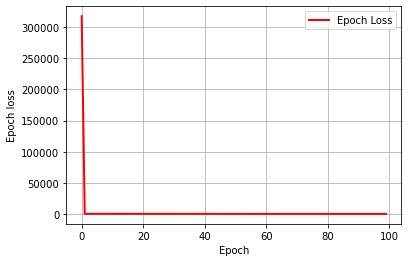

In [251]:
plt.plot(epoch, epoch_losses, label='Epoch Loss', ls='-', color='red', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('Epoch loss')
# plt.grid(b='on')
plt.grid(visible='on')
plt.legend(loc=0)

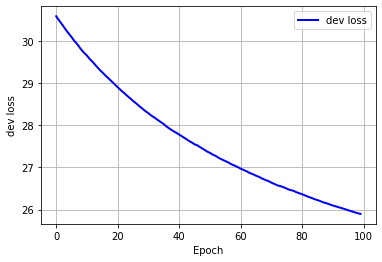

In [252]:
plt.plot(epoch, dev_losses, label='dev loss', ls='-', color='blue', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('dev loss')
# plt.grid(b='on')
plt.grid(visible='on')
plt.legend(loc=0)

In [101]:
net(dev_input, relu)

array([[1995],
       [1995],
       [1995],
       ...,
       [1995],
       [1995],
       [1995]])

In [20]:
net(test_input, relu)

array([[1999],
       [1999],
       [1998],
       ...,
       [1999],
       [1999],
       [1999]])

In [21]:
dev_target.mean(), train_target.mean()

(1998.684705882353, 1998.377230392157)

In [133]:
del_W, del_b = net.backward(dev_input, pred, len(dev_input), relu)

In [141]:
del_W

array([[-2.07535157]])

In [136]:
net(dev_input).tolist()

SyntaxError: unmatched ')' (3551697555.py, line 1)

In [ ]:
train_input, train_target, dev_input, dev_target, test_input = read_data()

In [ ]:
train_input=pd.read_csv("https://raw.githubusercontent.com/sahasrarjn/cs725-2022-assignment/main/regression/data/train.csv")

In [ ]:
train_input.to_numpy()

In [ ]:
train_input.drop(columns=train_input.columns[0],
                 axis=0,
                 inplace=True)

In [ ]:
x

In [ ]:
len(train_target[:32])

In [ ]:
net.del_W

In [53]:
num_layers = 3
num_units = 64
net = Net(num_layers, num_units)

In [54]:
y = np.array(train_target[:32]).astype(float).reshape(32,1)
x = train_input[0:32]
pred = net(x)
pred

array([[ 37105.36498123],
       [  1785.42226382],
       [ 47048.14736413],
       [   176.14292247],
       [ 11871.46034676],
       [   190.92086571],
       [128332.8530225 ],
       [ 48621.08758883],
       [  6086.61103648],
       [ 67329.53494865],
       [ 19672.83600822],
       [  8116.65542302],
       [  9844.9403929 ],
       [ 80558.88206712],
       [ 39828.13117311],
       [   357.44779598],
       [   176.14292247],
       [   176.14292247],
       [  1336.84901237],
       [ 30528.92071689],
       [110739.22697762],
       [  1414.29802158],
       [   176.14292247],
       [  1173.04278576],
       [ 12126.33059222],
       [   176.14292247],
       [   176.14292247],
       [ 10349.15800131],
       [  2315.12150388],
       [   299.4769293 ],
       [   176.14292247],
       [   176.14292247]])

In [58]:
back = net.backward(x,y,y.shape[0])

In [57]:
y.shape[0]

32

In [ ]:
len(back[0]), len(back[1])

In [59]:
back[0][0].shape, back[0][1].shape, back[0][2].shape, back[0][3].shape

((90, 64), (64, 64), (64, 64), (64, 1))

In [60]:
back[1][0].shape, back[1][1].shape, back[1][2].shape, back[1][3].shape

((64, 1), (64, 1), (64, 1), (1, 1))

In [ ]:
learning_rate = 0.001
for i in range(len(net.weights)):
    net.weights[i] = net.weights[i] - learning_rate*back[0][i]
    net.biases[i] = net.biases[i] - learning_rate*back[1][i]

In [ ]:
1/len(y)*np.sum((pred - y)**2)

In [ ]:
len(net.a_states), len(net.h_states), len(net.weights), len(net.biases)

In [ ]:
net.weights[-2].shape

In [ ]:
np.array([0]).reshape(1,1)

In [ ]:
net.a_states[-2].shape, net.a_states[-1].shape

In [ ]:
net.weights[-1].dtype

In [ ]:
np.array(y).astype(float).reshape(32,1).shape

In [ ]:
(pred-np.array(y).astype(float).reshape(32,1)).shape

In [ ]:
len(net.a_states)

In [46]:
for i in net.a_states:
    print(i.shape)

(32, 90)
(32, 64)
(32, 64)
(32, 64)
(32, 1)


In [48]:
for i in net.weights:
    print(i.shape)

(90, 64)
(64, 64)
(64, 64)
(64, 1)


In [50]:
Dn = np.sum(net.a_states[-2]*(pred - y),axis=0).reshape(64,1)
deln = pred - y

In [51]:
deln.shape

(32, 1)

In [ ]:
Dbn = np.sum((pred - y),axis=0).reshape(1,1)
delbn = Dbn

In [ ]:
np.multiply(delbn, net.relu(net.h_states[2],derivative=True)).shape

In [ ]:
Dn.shape, deln.shape

In [ ]:
d_layer = np.multiply(np.dot(deln,net.weights[2]), net.relu(net.h_states[2],derivative=True))

In [ ]:
d_layer.T.shape, net.weights[2].shape

In [ ]:
np.array([])

In [ ]:
req = []
for col_vector in d_layer.T:
    req.append(col_vector.T*net.a_states[0].T)

In [ ]:
np.array(req).T.shape

In [ ]:
net.backward()

In [ ]:
net.h_states[1].shape

In [ ]:
net.a_states[-1]

In [ ]:
net.weights[-1] - 

In [ ]:
(net.a_states[-1]*(pred - np.array(train_target[:32]).astype(float).reshape(32,1))).shape

In [ ]:
pred.dtype, np.array(train_target[:32]).astype(float).reshape(32,1).dtype

In [ ]:
np.sum((self.pred - np.array(y).astype(float).reshape(len(y),1)),axis=0).reshape(len(self.biases[-2]),1)

In [ ]:
y = train_target[:32]
(pred - np.array(y).astype(float).reshape(len(y),1))

In [ ]:
train_input, train_target, dev_input, dev_target, test_input = read_data()

In [ ]:
train_input[0:32]

In [ ]:
min(train_target), max(train_target)